In [1]:
#pip install seaborn

In [2]:
#pip install scipy

In [3]:
#IMPORT PYTHON PACKAGES
import seaborn as sns
import pandas as pd
import scipy as sp
import scipy.integrate
#from scipy import polyval, polyfit
from scipy.stats import sem
import numpy  as np
import copy
import matplotlib.pylab as plt
from matplotlib import rcParams
from matplotlib.ticker import FormatStrFormatter
import time
import datetime
import subprocess
import itertools
from itertools import groupby, repeat, islice
import math as math
import decimal as d
from decimal import *


#Plot settings
sns.set_style("whitegrid", rc={"axes.edgecolor": "k", "axes.linewidth":2.})

sns.set_style("ticks", {"xtick.major.size":8,"ytick.major.size":8})


sns.set_context("notebook",rc={"grid.linewidth": 0, 
                            "font.family":"Helvetica", "axes.labelsize":24.,"xtick.labelsize":24., 
                            "ytick.labelsize":24., "legend.fontsize":18.})

color_blind_safe = sns.color_palette("colorblind", 10) 

colors = sns.color_palette("tab10", 10) 

In [4]:
#Prst ge

(5, 48000, 4)
(5, 3200, 4)
(5, 61, 14)
(5, 48000, 4)
(5, 61, 14)
(5, 48000, 4)
(5, 61, 14)
(5, 48000, 4)
(5, 61, 14)
(5, 48000, 4)
(5, 61, 14)
(5, 48000, 4)
(5, 61, 14)
(5, 800)
(5, 800)
Top Slope ge200  =  0.32162430633391187 0.3179636455824585
Top Slope Mean ge200  =  0.31979397595818515
Bottom Slope ge200  =  0.316847331890683 0.2926967195956937
Bottom Slope Mean ge200  =  0.30477202574318835
Top Slope ge400  =  0.24222405130576533 0.24595185822609722
Top Slope Mean ge400  =  0.31979397595818515
Bottom Slope ge400  =  0.21338430856792695 0.21854034344262857
Bottom Slope Mean ge400  =  0.30477202574318835
Top Slope ge600  =  0.20876950095263175 0.20917647935651884
Top Slope Mean ge600  =  0.31979397595818515
Bottom Slope ge600  =  0.17163722576941723 0.1711582459642878
Bottom Slope Mean ge600  =  0.30477202574318835
Top Slope ge800  =  0.18711155247911918 0.1854953169802783
Top Slope Mean ge800  =  0.31979397595818515
Bottom Slope ge800  =  0.14414787067070142 0.14149150303584632
Bot

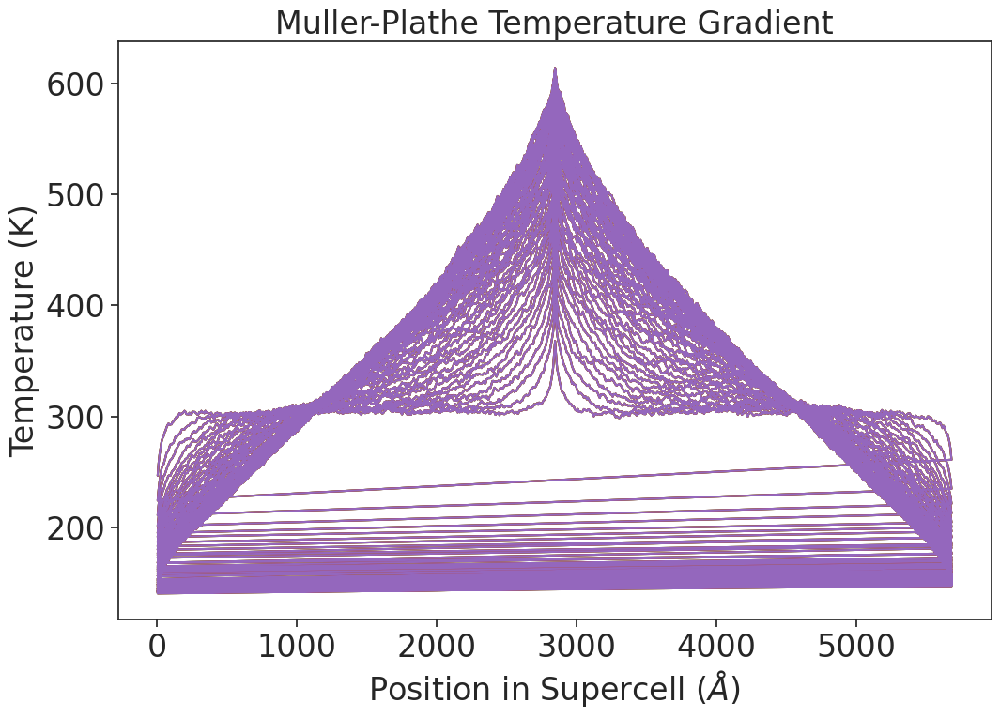

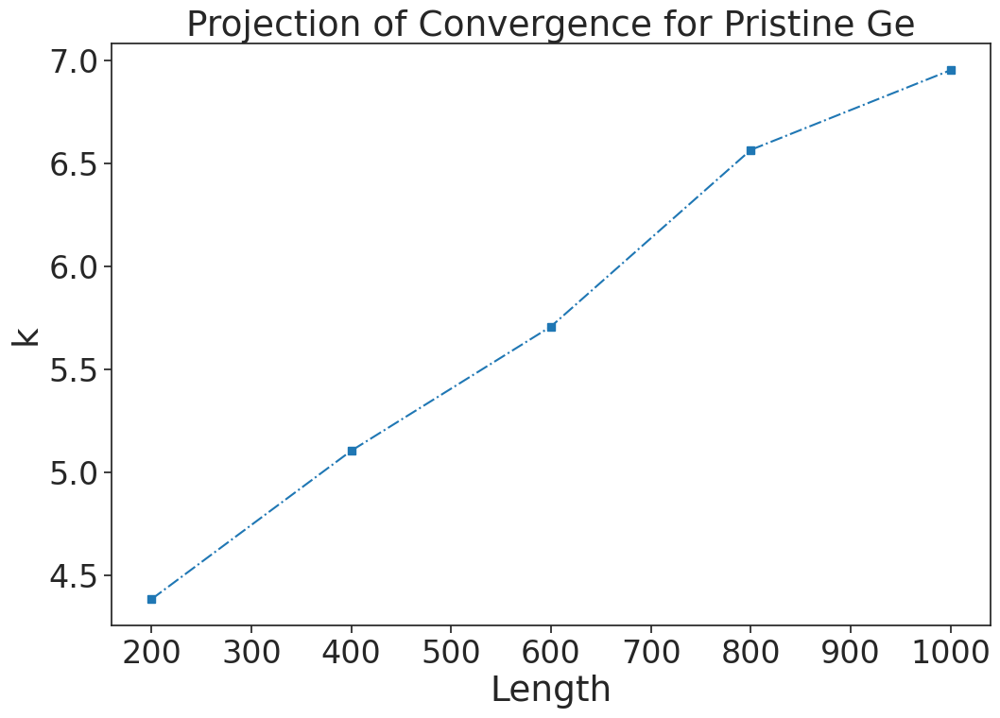

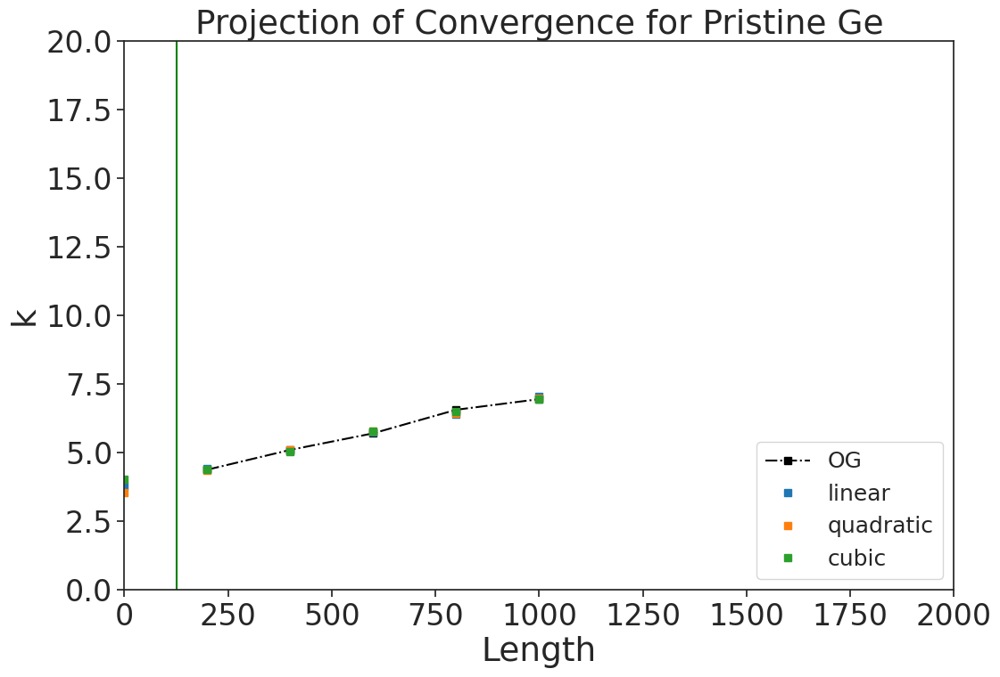

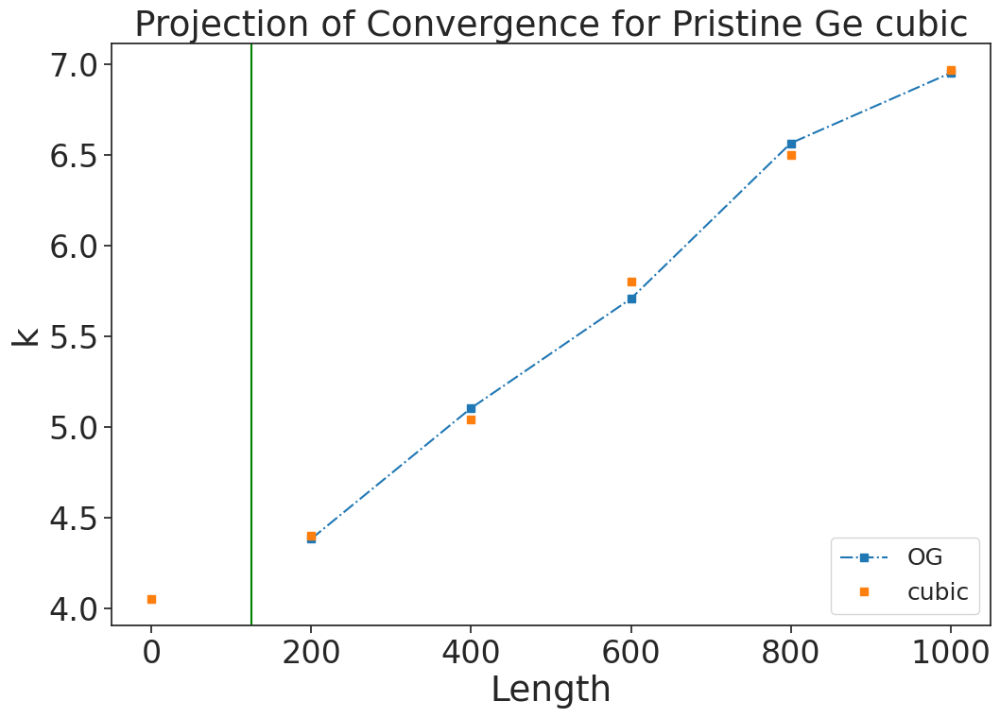

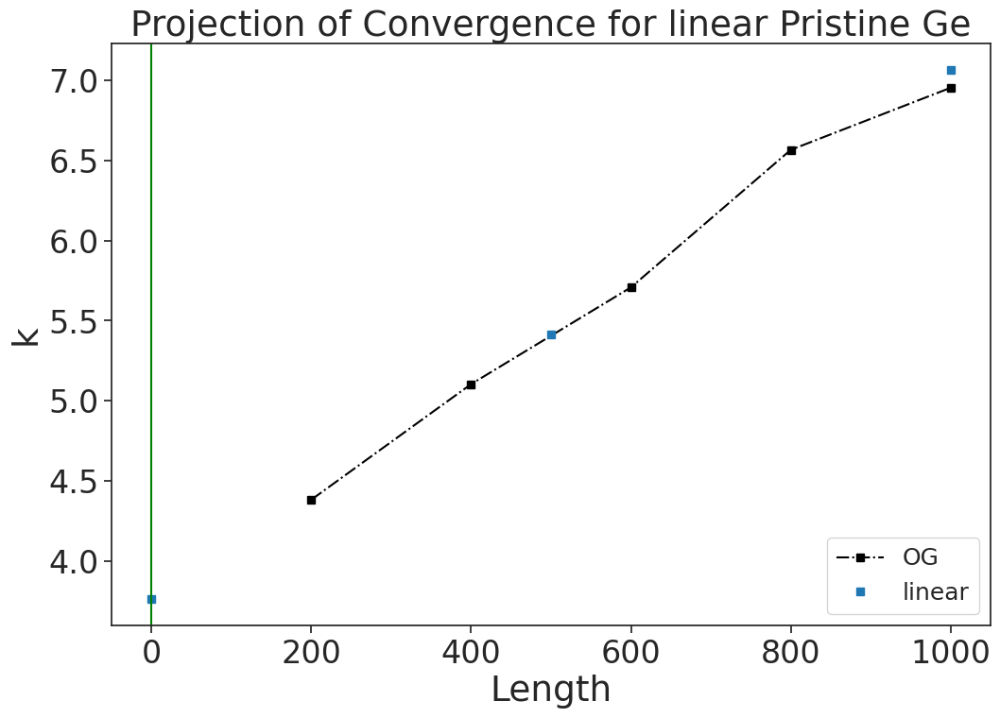

In [5]:

# load profile data 

filename = ['./profile_geE200','profile_geE400','profile_geE600',
           'profile_geE800','profile_geE1000'] #


MP_Profile = []; MP_Ave = []; MP_LastN = []; 

for simNo in range(0,len(filename)):
    subprocess.call(r"perl -p -e 's/^[\ \t]+|[\ \t]+$//g' %s > %s_new" % (filename[simNo], filename[simNo]), shell=True) # remove trailling white spaces
    subprocess.call("mv %s_new %s" % (filename[simNo], filename[simNo]), shell=True)
    subprocess.call("tr -s ' ' < %s > %s_tmp " % (filename[simNo], filename[simNo]), shell=True) #squeeze spaces
    subprocess.call("mv %s_tmp %s" % (filename[simNo], filename[simNo]), shell=True)

    profile = []; N = 800;
    with open(filename[simNo], 'r') as f:
        while True:
            lines = list(itertools.islice(f, 1, N+1))
            for line in lines:
                profile.append(line.split(' '))
            if not lines: 
                break
                
    lastN = profile[-N:] 
    lastAve = profile[-3200:]
    #print(lastAve)

    MP_Profile.append(profile)
    MP_LastN.append(lastN)
    MP_Ave.append(lastAve)
    
MP_Profile = np.array(MP_Profile, dtype=float) # for plotting 3D graphs
#print(MP_Profile)

MP_LastN = np.array(MP_LastN, dtype=float) # for calculating the thermal conductivity
#print(MP_LastN)



MP_Ave = np.array(MP_Ave, dtype=float) # for averaging the data to calculate the thermal conductivity
print(np.shape(MP_Profile))
#print(np.shape(MP_LastN))
print(np.shape(MP_Ave))

Thermo_Data = np.array([np.loadtxt('./Thermo_geE200'),np.loadtxt('./Thermo_geE400'),np.loadtxt('./Thermo_geE600'),
                       np.loadtxt('./Thermo_geE800'),np.loadtxt('./Thermo_geE1000')], dtype = object)

labels = ['ge200', 'ge400', 'ge600','ge800','ge1000','ge1500','ge2000'] 

print(np.shape(Thermo_Data))
#print(np.shape(Pristine_Thermo))

#Sim_no_dataset = [1]
Sim_no_dataset = [1,1,1,1,1]
#Time_no_dataset = [6000000] # run?
Time_no_dataset = [6000000,6000000,6000000,6000000,6000000]
#Interval_no_dataset = [0.5e-3]  # picoseconds, timestep
Interval_no_dataset = [0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3]
#mxc_no_dataset = [10]  #200x10x10?
mxc_no_dataset = [10,10,10,10,10]

for simNo in range(0, len(MP_Profile)):
    print(np.shape(MP_Profile))
    print(np.shape(Thermo_Data))
    Coordinates = MP_Profile[simNo,:,1]*(Thermo_Data[simNo,-1,9])
    #print(Coordinates)
    Temperature = MP_Profile[simNo,:,3]
    #print(Temperature)

fig = plt.figure(figsize=(12,8))
for k in range(0, len(MP_Profile)):
    plt.plot(Coordinates[:], Temperature[:], color=colors[k], label=labels[k])
    
plt.xlabel(r'Position in Supercell ($\AA$)')
plt.ylabel('Temperature (K)')
plt.title('Muller-Plathe Temperature Gradient', fontsize = 24)
#plt.savefig('MullerPlathe_PristineSi200.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
#plt.show

# Load the data that will be averaged to calculate the slopes 

Temperature = []; Coordinate = []; dX_Thermo = [];

for simNo in range(0, len(filename)):
    
    dX_ = Thermo_Data[simNo,-1,9]
    dX_Thermo.append(dX_)
    
    for i in range(0,800):
        Temperature_ = np.mean([MP_Ave[simNo,i,3],MP_Ave[simNo,i+800,3],MP_Ave[simNo,i+1600,3],MP_Ave[simNo,i+2400,3]])   
        Temperature.append(Temperature_)
        Coordinate_ = np.mean([MP_Ave[simNo,i,1],MP_Ave[simNo,i+800,1],MP_Ave[simNo,i+1600,1],MP_Ave[simNo,i+2400,1]])*dX_
        Coordinate.append(Coordinate_)
    
Temperature = np.array([Temperature[0:800],Temperature[800:1600],Temperature[1600:2400],
                        Temperature[2400:3200],Temperature[3200:4000]], dtype=float) 
                       #Temperature[4000:4800],Temperature[4800:5600]], dtype=float)
Coordinate = np.array([Coordinate[0:800],Coordinate[800:1600],Coordinate[1600:2400],
                      Coordinate[2400:3200],Coordinate[3200:4000]], dtype=float) 
                      #Coordinate[4000:4800],Coordinate[4800:5600]], dtype=float)

print(np.shape(Coordinate))
print(np.shape(Temperature))

#print(dX_Thermo)

excluded_points1 = 230 # excluded points from the beginning
excluded_points2 = 40 # excluded points from the end
excluded_points3 = 20
excluded_points4 = 230 # from the end of the mp.data file

slope2_mean = []; slope2 = []; slope1_mean = []; slope1 = []; average_temp_PrstG = [];
# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff

for simNo in range(0,len(filename)):
    
    dTemp = Temperature[simNo,:]
    X = dX_
    dX = Coordinate[simNo,:] #*X # normalized distance
    
    #T_fit_left = np.polyfit(dX[280:380], dTemp[280:380], 1)
    #T_fit_right = -np.polyfit(dX[360:-280], dTemp[360:-280], 1)
    
    T_fit_left = np.polyfit(dX[excluded_points1:400-excluded_points2], dTemp[excluded_points1:400-excluded_points2], 1)
    T_fit_right = -np.polyfit(dX[400+excluded_points2:-excluded_points1], dTemp[400+excluded_points2:-excluded_points1], 1)
    
    slope2.append([T_fit_left[0], T_fit_right[0]])
    #print(slope2)
    print('Top Slope', labels[simNo], ' = ', T_fit_left[0], T_fit_right[0])

    mean_slope = np.mean([abs(T_fit_left[0]), abs(T_fit_right[0])], axis = 0)
    slope2_mean.append(mean_slope)
    print('Top Slope Mean', labels[simNo], ' = ', slope2_mean[0])
    
    B_fit_left2 = np.polyfit(dX[excluded_points3:400-excluded_points4], dTemp[excluded_points3:400-excluded_points4], 1)
    B_fit_right2 = -np.polyfit(dX[400+excluded_points4:-excluded_points3], dTemp[400+excluded_points4:-excluded_points3], 1)
    
    slope1.append([B_fit_left2[0], B_fit_right2[0]])
    print('Bottom Slope', labels[simNo], ' = ', B_fit_left2[0], B_fit_right2[0])
    
    mean_slope = np.mean([abs(B_fit_left2[0]), abs(B_fit_right2[0])], axis = 0)
    slope1_mean.append(mean_slope)
    print('Bottom Slope Mean', labels[simNo], ' = ', slope1_mean[0])
    
    average_temp = np.mean(dTemp)
    average_temp_PrstG.append(average_temp)

Slope1 = np.array(slope1)
Slope_mean1 = np.array(slope1_mean)
#print(Slope_mean1)

Slope2 = np.array(slope2)
Slope_mean2 = np.array(slope2_mean)
#print(Slope_mean2)

Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0)]) #individual
#Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0), np.mean([Slope_mean1[1], Slope_mean2[1]], axis =0), np.mean([Slope_mean1[2], Slope_mean2[2]], axis=0)])
print('Slope Mean', labels[simNo], ' = ', Slope_mean[0])

Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0]]) #individual
#Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0], Slope_mean[1]*dX_Thermo[1], Slope_mean[2]*dX_Thermo[2]])
print('Slope Average', labels[simNo], ' = ', Slope_ave[0])

# Calculate the heat flux and the thermal conductivity
eV2J  = 1.6e-19;
Ang2m =   1e-10;
ps2s  =   1e-12;
conversion = (eV2J/(Ang2m*ps2s))

s_values = []
ThermalsprstG = []
dt = 0.0005 # picoseconds

# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff
for simNo in range(0, len(Thermo_Data)):
    
    Steps = Thermo_Data[simNo,-1,0]
    Time = Steps*dt # picoseconds
    
    dx = Thermo_Data[simNo,-1,9]
    dy = Thermo_Data[simNo,-1,10]
    dz = Thermo_Data[simNo,-1,11]
    Area = dy*dz
    
    #DeltaE = Thermo_Data[simNo,-1,-2] # E_pair
    #TotalE = Thermo_Data[simNo,-1,-5] # Total energy
    KinE = Thermo_Data[simNo,-1,12] # in log_lammps, f_3 
    
    Thermal_left2 = ((KinE)/(2*Time*Area*Slope2[simNo,0]))*conversion #top left
    Thermal_right2 = ((KinE)/(2*Time*Area*Slope2[simNo,1]))*conversion #top right
    
    Thermal_left1 = ((KinE)/(2*Time*Area*Slope1[simNo,0]))*conversion #bottom left
    Thermal_right1 = ((KinE)/(2*Time*Area*Slope1[simNo,1]))*conversion #bottom right
    
    thermal2 = np.concatenate((Thermal_left1, Thermal_left2), axis = None)
    thermal1 = np.concatenate((Thermal_right1, Thermal_right2), axis = None)
    
    thermal2_ave = ((KinE)/(2*Time*Area*Slope_mean2[simNo]))*conversion #top
    thermal1_ave = ((KinE)/(2*Time*Area*Slope_mean1[simNo]))*conversion #bottom
    
    #thermal_ave = ((KinE)/(2*Time*Area*Slope_ave[simNo]))*conversion
    thermal_ave = (thermal2_ave+thermal1_ave)/2
   
    getcontext().prec = 10
    std_top = Decimal(np.std([Thermal_left2, Thermal_right2], dtype=np.float64))
    SE_left = std_top/Decimal(math.sqrt(2))
   
    std_bottom = Decimal(np.std([Thermal_left1, Thermal_right1], dtype=np.float64))
    SE_right = std_bottom/Decimal(math.sqrt(2))
    
    SE = math.sqrt(((SE_left/2)**2) + ((SE_right/2)**2))
    print(SE)
   
    #print('Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2[0], thermal2[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2_ave)
    
    #print('Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1[0], thermal1[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1_ave)
    
    print('Average Thermal Conductivity of', labels[simNo], 'Average = ', thermal_ave) 
    
    Therm_val = [Thermal_left1,Thermal_left2,Thermal_right1,Thermal_right2]
    Ttherm = ['%.6f' % elem for elem in Therm_val]
    #print(Ttherm)
    ThermalsprstG.append(Ttherm)
    print('ThermalsprstG', labels[simNo], ' = ', Ttherm)
    
    
    TC_values = [thermal2_ave, thermal1_ave, thermal_ave, SE]
    val = ['%.6f' % elem for elem in TC_values]
    #print(val)
    s_values.append(val)
    print('s values', labels[simNo], ' = ', val)
    #print(simNo)
    

print(s_values)
#print(s_values[0]) #200
#print(s_values[1]) #400
#print(s_values[2]) #600
#print(s_values[3]) #800
#print(s_values[0][0])
therm_average_prstG = []
for item in s_values:
    #print(item[0])
    therm_average_prstG.append(item[2])

therm_average_prstG = []
for item in s_values:
    print(float(item[2]))
    therm_average_prstG.append(np.array(float(item[2])))

#projection stuff




size_prstG = [200.0,400.0,600.0,800.0,1000.0]

size_prstG = np.array(size_prstG)
#print(np.shape(size_prstG))
print(size_prstG)
#Tc = [5.95,7.17,8.96,float(s_values[3][2]),float(s_values[4][2])]
Tc = [float(s_values[0][2]),float(s_values[1][2]),float(s_values[2][2]),float(s_values[3][2]),float(s_values[4][2])]
#     float(s_values[5][2]),float(s_values[6][2])]
Tc = np.array(Tc)
print(Tc)

inv_size_prstG = np.reciprocal(size_prstG)
#np.set_printoptions(precision=10)
print(inv_size_prstG)

inv_Tc = np.reciprocal(Tc)
print(inv_Tc)

#plot

fig = plt.figure(figsize=(12,8))

plt.plot(size_prstG[:], Tc[:],'s-.')


plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for Pristine Ge', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-Pristine Ge-r125.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


#plt.show()



fig = plt.figure(figsize=(12,8))

x1 = np.array(size_prstG)
mn = min(x1)
mx = max(x1)
#print(x1)
#print(len(x))

y1 = np.array(Tc)
#print(y1)

z1 = np.polyfit(x1, y1, 1) #np.polyfit(x, y, degree of polynomial), degree =1,2,3 is linear, quadratic, cubic
z2 = np.polyfit(x1, y1, 2)
z3 = np.polyfit(x1, y1, 3)

print(z1,'\n',z2,'\n',z3)
#xp = np.linspace(mn, mx, 6)
xp = np.linspace(-0.001, mx+0.001, 6)
print(xp)

p1 = np.poly1d(z1)
p2 = np.poly1d(z2)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

plt.plot(x1, y1, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')
plt.plot(xp, p2(xp), 's', label = 'quadratic')
plt.plot(xp, p3(xp), 's', label ='cubic') 

plt.axvline(x=125.0, color='green')

plt.legend(loc="lower right")

plt.xlim([0.0,2000])
plt.ylim([0.0,20])

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for Pristine Ge', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-Pristine Ge-r125-lqc-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


#plt.show


fig = plt.figure(figsize=(12,8))

x_2 = np.array(size_prstG)
mn = min(x_2)
mx = max(x_2)
#print(mn)
#print(len(x_2))

y_2 = np.array(Tc)
#print(y)

#xpp = np.linspace(-0.00005,mx, 6)
xpp = np.linspace(-0.0005,mx, 6)

plt.axvline(x=125.0, color='green')


z3 = np.polyfit(x_2, y_2, 3)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

#m, c; run by Laura
s = p3(1);
i = p3(2)    #The polyfit function for a linear (polynomial order 1) fit returns the slope as the first parameter
                    #and the intercept as the second parameter, so the output vector is [slope, intercept]. 
                    #It is like any other vector, so choose the one you want by indexing into it.
n = p3(0)
#print(s)
#print(i)
#print(n)

#slope_intercept = np.polyfit(x_2,y_2,1)
#print('Intercept of linear polyfit:',slope_intercept)
#slope_intercept = np.polyfit(x_2,y_2,2)
#print('Intercept of quad. polyfit:',slope_intercept)
slope_intercept = np.polyfit(x_2,y_2,3)
print('Intercept of cubic polyfit:',slope_intercept)
#

plt.plot(x_2,y_2, 's-.', label ='OG')
plt.plot(xpp, p3(xp), 's', label ='cubic') 
plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
#plt.ylim(-0.0002, 0.18)
plt.title(r'Projection of Convergence for Pristine Ge cubic', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-Pristine Ge-r125-c-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)



#plt.show


#linear fit in linear region alone
fig = plt.figure(figsize=(12,8))

#x2 = [0.005,0.0025,0.00166667]
x2 = size_prstG
x2 = np.array(x2)
y2 = Tc
#y2 = [0.16806723,0.13947001,0.11160714]
y2 = np.array(y2)


z = np.polyfit(x2, y2, 1) 
xp = np.linspace(-0.001, mx+0.001, 3)

p1 = np.poly1d(z)

slope_intercept = np.polyfit(x2,y2,1)
print('Intercept of linear polyfit:',slope_intercept)


plt.plot(x2, y2, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')

plt.axvline(x=0, color='green')

plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for linear Pristine Ge', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-linear-Pristine Ge-r125-l-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


#plt.show




#Pristine Ge values

SE200b_left = np.std([float(ThermalsprstG[0][0]), float(ThermalsprstG[0][2])], dtype=np.float64)
SE200_left = SE200b_left/math.sqrt(2)
SE200b_right = np.std([float(ThermalsprstG[0][1]), float(ThermalsprstG[0][3])], dtype=np.float64)
SE200_right = SE200b_right/math.sqrt(2)
standard_error200b_prstG = math.sqrt(((SE200_left/2)**2) + ((SE200_right/2)**2))
print('Standard error of size 200:',standard_error200b_prstG)


SE400b_left = np.std([float(ThermalsprstG[1][0]), float(ThermalsprstG[1][2])], dtype=np.float64)
SE400_left = SE400b_left/math.sqrt(2)
SE400b_right = np.std([float(ThermalsprstG[1][1]), float(ThermalsprstG[1][3])], dtype=np.float64)
SE400_right = SE400b_right/math.sqrt(2)
standard_error400b_prstG = math.sqrt(((SE400_left/2)**2) + ((SE400_right/2)**2))
print('Standard error of size 400:',standard_error400b_prstG)

SE600b_left = np.std([float(ThermalsprstG[2][0]), float(ThermalsprstG[2][2])], dtype=np.float64)
SE600_left = SE600b_left/math.sqrt(2)
SE600b_right = np.std([float(ThermalsprstG[2][1]), float(ThermalsprstG[2][3])], dtype=np.float64)
SE600_right = SE600b_right/math.sqrt(2)
standard_error600b_prstG = math.sqrt(((SE600_left/2)**2) + ((SE600_right/2)**2))
print('Standard error of size 600:',standard_error600b_prstG)


SE800b_left = np.std([float(ThermalsprstG[3][0]), float(ThermalsprstG[3][2])], dtype=np.float64)
SE800_left = SE800b_left/math.sqrt(2)
SE800b_right = np.std([float(ThermalsprstG[3][1]), float(ThermalsprstG[3][3])], dtype=np.float64)
SE800_right = SE800b_right/math.sqrt(2)
standard_error800b_prstG = math.sqrt(((SE800_left/2)**2) + ((SE800_right/2)**2))
print('Standard error of size 800:',standard_error800b_prstG)

SE1000b_left = np.std([float(ThermalsprstG[4][0]), float(ThermalsprstG[4][2])], dtype=np.float64)
SE1000_left = SE1000b_left/math.sqrt(2)
SE1000b_right = np.std([float(ThermalsprstG[4][1]), float(ThermalsprstG[4][3])], dtype=np.float64)
SE1000_right = SE1000b_right/math.sqrt(2)
standard_error1000b_prstG = math.sqrt(((SE1000_left/2)**2) + ((SE1000_right/2)**2))
print('Standard error of size 1000:',standard_error1000b_prstG)
'''
SE1500b_left = np.std([float(ThermalsprstG[5][0]), float(ThermalsprstG[5][2])], dtype=np.float64)
SE1500_left = SE1500b_left/math.sqrt(2)
SE1500b_right = np.std([float(ThermalsprstG[5][1]), float(ThermalsprstG[5][3])], dtype=np.float64)
SE1500_right = SE1500b_right/math.sqrt(2)
standard_error1500b_prstG = math.sqrt(((SE1500_left/2)**2) + ((SE1500_right/2)**2))
print('Standard error of size 1500:',standard_error1500b_prstG)

SE2000b_left = np.std([float(ThermalsprstG[6][0]), float(ThermalsprstG[6][2])], dtype=np.float64)
SE2000_left = SE2000b_left/math.sqrt(2)
SE2000b_right = np.std([float(ThermalsprstG[6][1]), float(ThermalsprstG[6][3])], dtype=np.float64)
SE2000_right = SE2000b_right/math.sqrt(2)
standard_error2000b_prstG = math.sqrt(((SE2000_left/2)**2) + ((SE2000_right/2)**2))
print('Standard error of size 2000:',standard_error2000b_prstG)

yerr1500b_prstG = standard_error1500b_prstG
yerr2000b_prstG = standard_error2000b_prstG


#projection of convergence for Pristine Ge
#https://math.stackexchange.com/questions/3217622/how-does-inverting-data-change-standaro-deviation

'''
yerr200b_prstG = standard_error200b_prstG
yerr400b_prstG = standard_error400b_prstG
yerr600b_prstG = standard_error600b_prstG
yerr800b_prstG = standard_error800b_prstG
yerr1000b_prstG = standard_error1000b_prstG


In [6]:
#Prst Si

(5, 48000, 4)
(5, 3200, 4)
(5, 61, 14)
(5, 800)
(5, 800)
Top Slope si200  =  0.22804514578269536 0.250775124998406
Top Slope Mean si200  =  0.23941013539055067
Bottom Slope si200  =  0.2431671257901128 0.25267882814011444
Bottom Slope Mean si200  =  0.24792297696511362
Top Slope si400  =  0.18673010838103438 0.1845700433256409
Top Slope Mean si400  =  0.23941013539055067
Bottom Slope si400  =  0.18450160179253408 0.1800328551728768
Bottom Slope Mean si400  =  0.24792297696511362
Top Slope si600  =  0.17368361895345863 0.16942674537322439
Top Slope Mean si600  =  0.23941013539055067
Bottom Slope si600  =  0.14534558585634555 0.14434776331836285
Bottom Slope Mean si600  =  0.24792297696511362
Top Slope si800  =  0.1527201592365638 0.15137148770035086
Top Slope Mean si800  =  0.23941013539055067
Bottom Slope si800  =  0.12636941281572797 0.12659728745563156
Bottom Slope Mean si800  =  0.24792297696511362
Top Slope si1000  =  0.13561169147457972 0.13734174583063327
Top Slope Mean si1000  =

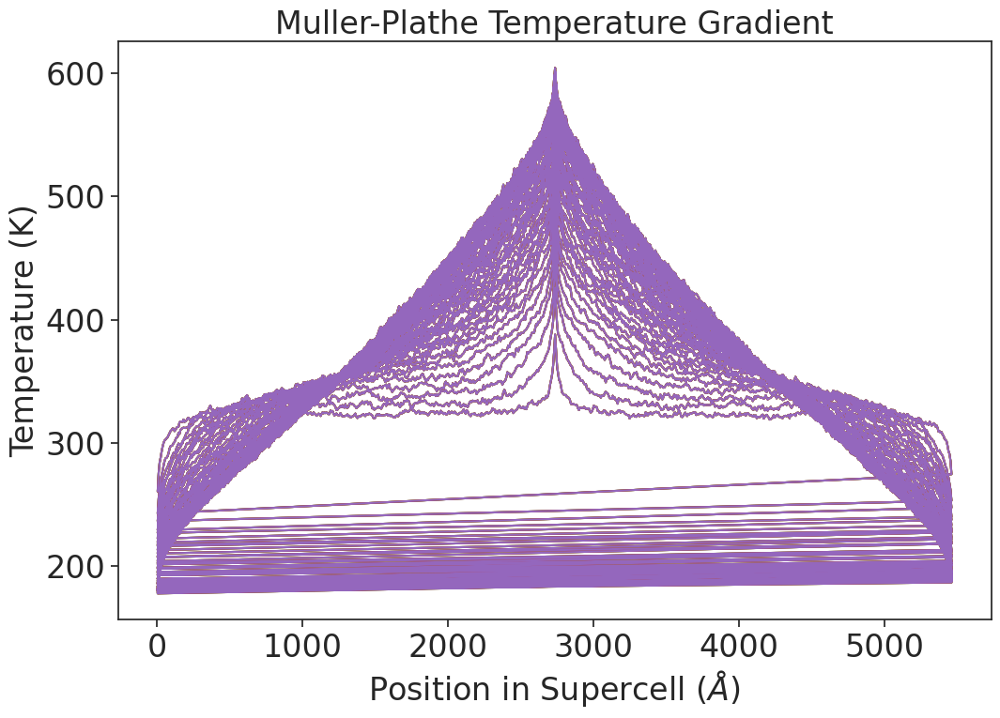

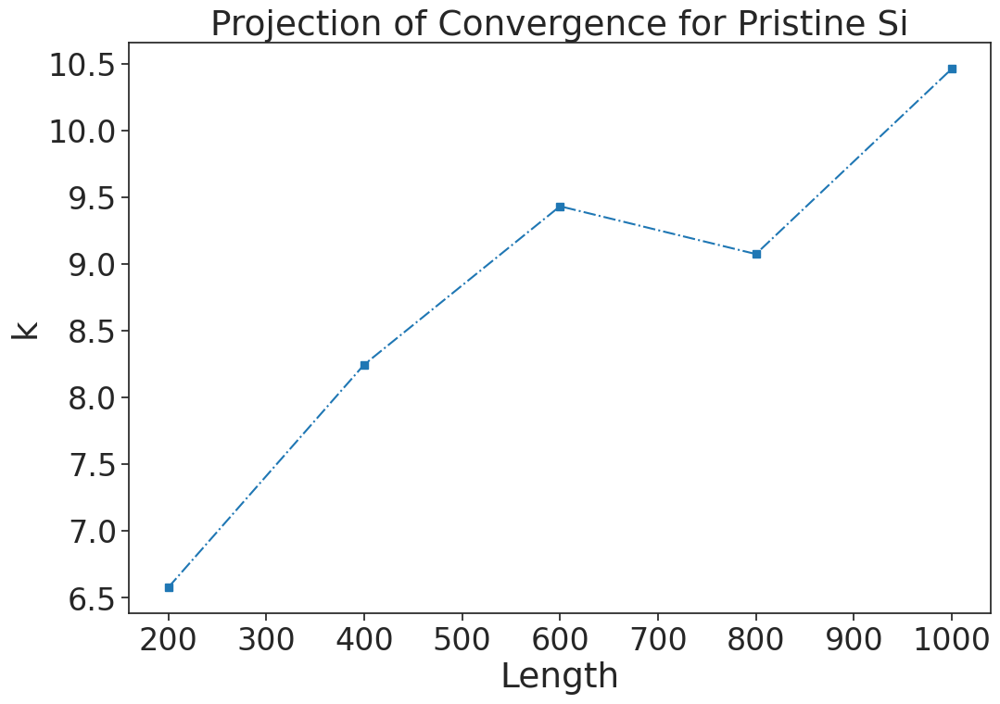

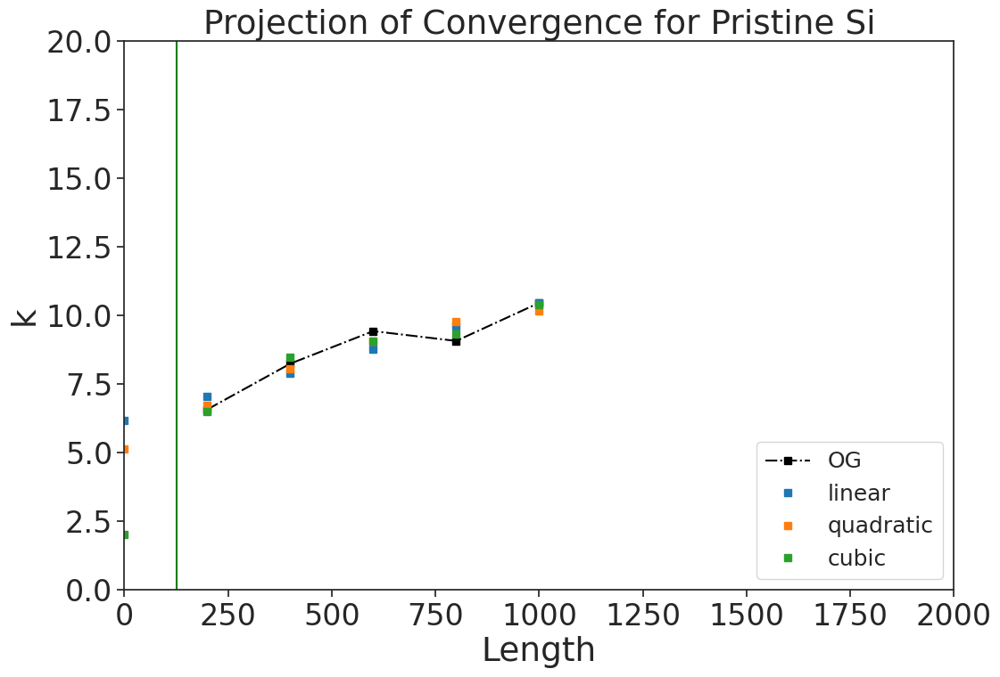

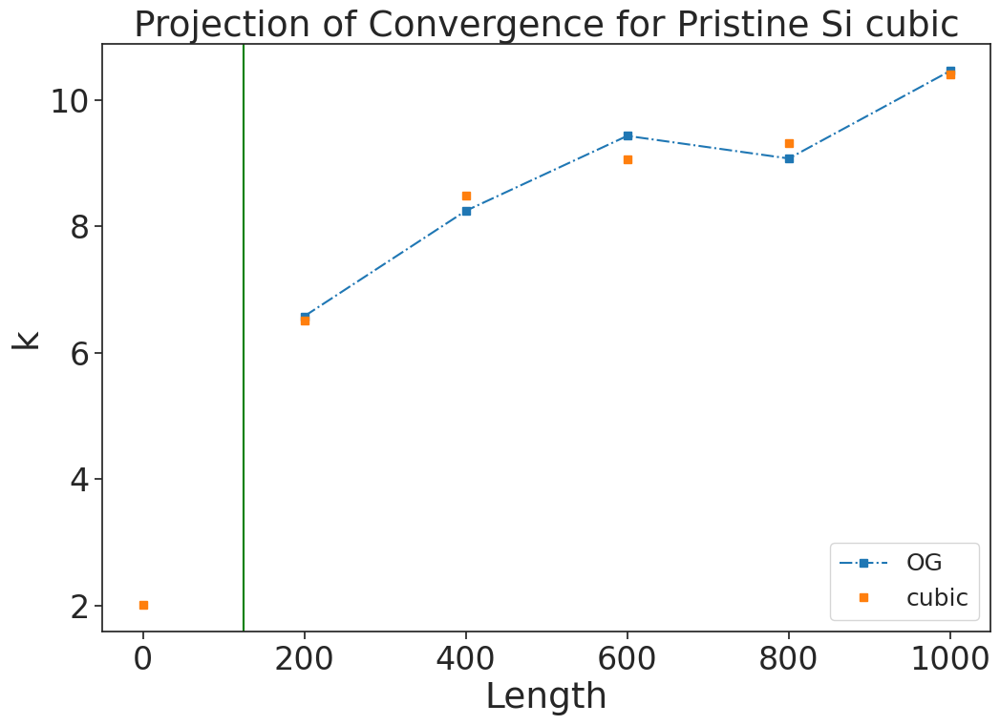

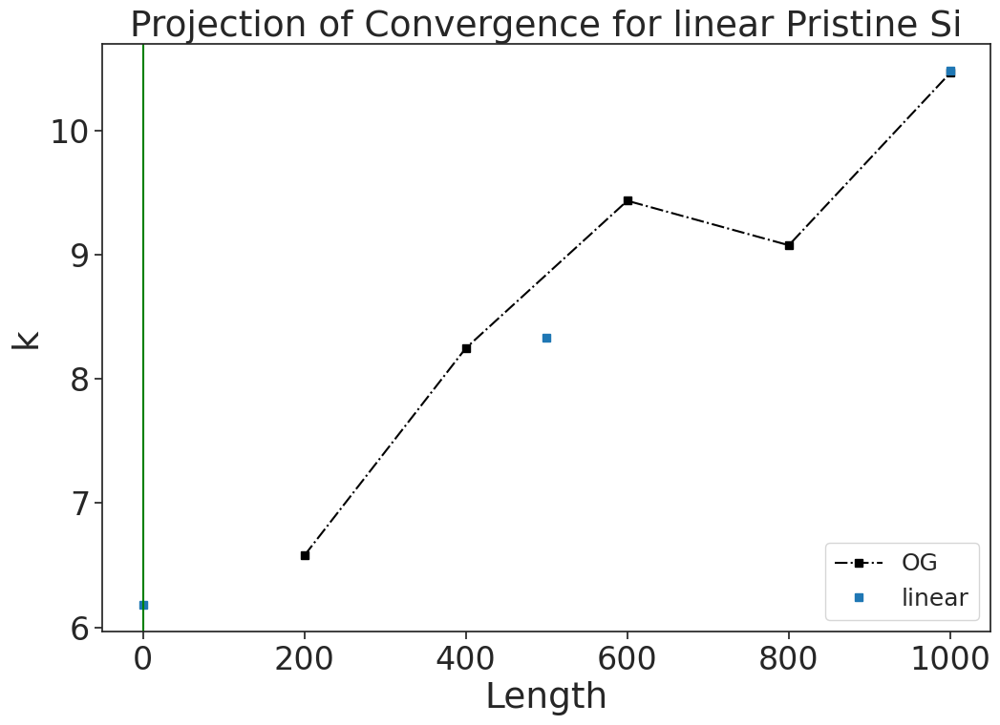

In [7]:

# load profile data 

filename = ['./profile_siE200', 'profile_siE400','profile_siE600','profile_siE800','profile_siE1000']#
           


MP_Profile = []; MP_Ave = []; MP_LastN = []; 

for simNo in range(0,len(filename)):
    subprocess.call(r"perl -p -e 's/^[\ \t]+|[\ \t]+$//g' %s > %s_new" % (filename[simNo], filename[simNo]), shell=True) # remove trailling white spaces
    subprocess.call("mv %s_new %s" % (filename[simNo], filename[simNo]), shell=True)
    subprocess.call("tr -s ' ' < %s > %s_tmp " % (filename[simNo], filename[simNo]), shell=True) #squeeze spaces
    subprocess.call("mv %s_tmp %s" % (filename[simNo], filename[simNo]), shell=True)

    profile = []; N = 800;
    with open(filename[simNo], 'r') as f:
        while True:
            lines = list(itertools.islice(f, 1, N+1))
            for line in lines:
                profile.append(line.split(' '))
            if not lines: 
                break
                
    lastN = profile[-N:] 
    lastAve = profile[-3200:]
    #print(lastAve)

    MP_Profile.append(profile)
    MP_LastN.append(lastN)
    MP_Ave.append(lastAve)
    
MP_Profile = np.array(MP_Profile, dtype=float) # for plotting 3D graphs
#print(MP_Profile)

MP_LastN = np.array(MP_LastN, dtype=float) # for calculating the thermal conductivity
#print(MP_LastN)



MP_Ave = np.array(MP_Ave, dtype=float) # for averaging the data to calculate the thermal conductivity
print(np.shape(MP_Profile))
#print(np.shape(MP_LastN))
print(np.shape(MP_Ave))

Thermo_Data = np.array([np.loadtxt('./Thermo_siE200'),np.loadtxt('./Thermo_siE400'),np.loadtxt('./Thermo_siE600'),
                       np.loadtxt('./Thermo_siE800'),np.loadtxt('./Thermo_siE1000')], dtype = object) #, ,
                        
labels = ['si200', 'si400', 'si600','si800','si1000','si1500','si2000'] 

print(np.shape(Thermo_Data))
#print(np.shape(Pristine_Thermo))

#Sim_no_dataset = [1]
Sim_no_dataset = [1,1,1,1,1]
#Time_no_dataset = [6000000] # run?
Time_no_dataset = [6000000,6000000,6000000,6000000,6000000]
#Interval_no_dataset = [0.5e-3]  # picoseconds, timestep
Interval_no_dataset = [0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3]
#mxc_no_dataset = [10]  #200x10x10?
mxc_no_dataset = [10,10,10,10,10]

for simNo in range(0, len(MP_Profile)):
    Coordinates = MP_Profile[simNo,:,1]*(Thermo_Data[simNo,-1,9])
    #print(Coordinates)
    Temperature = MP_Profile[simNo,:,3]
    #print(Temperature)

fig = plt.figure(figsize=(12,8))
for k in range(0, len(MP_Profile)):
    plt.plot(Coordinates[:], Temperature[:], color=colors[k], label=labels[k])
    
plt.xlabel(r'Position in Supercell ($\AA$)')
plt.ylabel('Temperature (K)')
plt.title('Muller-Plathe Temperature Gradient', fontsize = 24)
#plt.savefig('MullerPlathe_PristineSi200.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
#plt.show

# Load the data that will be averaged to calculate the slopes 

Temperature = []; Coordinate = []; dX_Thermo = [];

for simNo in range(0, len(filename)):
    
    dX_ = Thermo_Data[simNo,-1,9]
    dX_Thermo.append(dX_)
    
    for i in range(0,800):
        Temperature_ = np.mean([MP_Ave[simNo,i,3],MP_Ave[simNo,i+800,3],MP_Ave[simNo,i+1600,3],MP_Ave[simNo,i+2400,3]])   
        Temperature.append(Temperature_)
        Coordinate_ = np.mean([MP_Ave[simNo,i,1],MP_Ave[simNo,i+800,1],MP_Ave[simNo,i+1600,1],MP_Ave[simNo,i+2400,1]])*dX_
        Coordinate.append(Coordinate_)
    
Temperature = np.array([Temperature[0:800],Temperature[800:1600],Temperature[1600:2400],
                       Temperature[2400:3200],Temperature[3200:4000]], dtype=float) #,
                       #Temperature[4000:4800],Temperature[4800:5600]], dtype=float)
Coordinate = np.array([Coordinate[0:800],Coordinate[800:1600],Coordinate[1600:2400],
                      Coordinate[2400:3200],Coordinate[3200:4000]], dtype=float) #,,
                      #Coordinate[4000:4800],Coordinate[4800:5600]], dtype=float)

print(np.shape(Coordinate))
print(np.shape(Temperature))

#print(dX_Thermo)

excluded_points1 = 230 # excluded points from the beginning
excluded_points2 = 40 # excluded points from the end
excluded_points3 = 20
excluded_points4 = 230 # from the end of the mp.data file

slope2_mean = []; slope2 = []; slope1_mean = []; slope1 = []; average_temp_Prst = []
# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff

for simNo in range(0,len(filename)):
    
    dTemp = Temperature[simNo,:]
    X = dX_
    dX = Coordinate[simNo,:] #*X # normalized distance
    
    #T_fit_left = np.polyfit(dX[280:380], dTemp[280:380], 1)
    #T_fit_right = -np.polyfit(dX[360:-280], dTemp[360:-280], 1)
    
    T_fit_left = np.polyfit(dX[excluded_points1:400-excluded_points2], dTemp[excluded_points1:400-excluded_points2], 1)
    T_fit_right = -np.polyfit(dX[400+excluded_points2:-excluded_points1], dTemp[400+excluded_points2:-excluded_points1], 1)
    
    slope2.append([T_fit_left[0], T_fit_right[0]])
    #print(slope2)
    print('Top Slope', labels[simNo], ' = ', T_fit_left[0], T_fit_right[0])

    mean_slope = np.mean([abs(T_fit_left[0]), abs(T_fit_right[0])], axis = 0)
    slope2_mean.append(mean_slope)
    print('Top Slope Mean', labels[simNo], ' = ', slope2_mean[0])
    
    B_fit_left2 = np.polyfit(dX[excluded_points3:400-excluded_points4], dTemp[excluded_points3:400-excluded_points4], 1)
    B_fit_right2 = -np.polyfit(dX[400+excluded_points4:-excluded_points3], dTemp[400+excluded_points4:-excluded_points3], 1)
    
    slope1.append([B_fit_left2[0], B_fit_right2[0]])
    print('Bottom Slope', labels[simNo], ' = ', B_fit_left2[0], B_fit_right2[0])
    
    mean_slope = np.mean([abs(B_fit_left2[0]), abs(B_fit_right2[0])], axis = 0)
    slope1_mean.append(mean_slope)
    print('Bottom Slope Mean', labels[simNo], ' = ', slope1_mean[0])
    
    average_temp = np.mean(dTemp)
    average_temp_Prst.append(average_temp)
    
    
Slope1 = np.array(slope1)
Slope_mean1 = np.array(slope1_mean)
#print(Slope_mean1)

Slope2 = np.array(slope2)
Slope_mean2 = np.array(slope2_mean)
#print(Slope_mean2)

Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0)]) #individual
#Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0), np.mean([Slope_mean1[1], Slope_mean2[1]], axis =0), np.mean([Slope_mean1[2], Slope_mean2[2]], axis=0)])
print('Slope Mean', labels[simNo], ' = ', Slope_mean[0])

Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0]]) #individual
#Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0], Slope_mean[1]*dX_Thermo[1], Slope_mean[2]*dX_Thermo[2]])
print('Slope Average', labels[simNo], ' = ', Slope_ave[0])

# Calculate the heat flux and the thermal conductivity
eV2J  = 1.6e-19;
Ang2m =   1e-10;
ps2s  =   1e-12;
conversion = (eV2J/(Ang2m*ps2s))

s_values = []
ThermalsPrst = []
dt = 0.0005 # picoseconds

# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff
for simNo in range(0, len(Thermo_Data)):
    
    Steps = Thermo_Data[simNo,-1,0]
    Time = Steps*dt # picoseconds
    
    dx = Thermo_Data[simNo,-1,9]
    dy = Thermo_Data[simNo,-1,10]
    dz = Thermo_Data[simNo,-1,11]
    Area = dy*dz
    
    #DeltaE = Thermo_Data[simNo,-1,-2] # E_pair
    #TotalE = Thermo_Data[simNo,-1,-5] # Total energy
    KinE = Thermo_Data[simNo,-1,12] # in log_lammps, f_3 
    
    Thermal_left2 = ((KinE)/(2*Time*Area*Slope2[simNo,0]))*conversion #top left
    Thermal_right2 = ((KinE)/(2*Time*Area*Slope2[simNo,1]))*conversion #top right
    
    Thermal_left1 = ((KinE)/(2*Time*Area*Slope1[simNo,0]))*conversion #bottom left
    Thermal_right1 = ((KinE)/(2*Time*Area*Slope1[simNo,1]))*conversion #bottom right
    
    thermal2 = np.concatenate((Thermal_left1, Thermal_left2), axis = None)
    thermal1 = np.concatenate((Thermal_right1, Thermal_right2), axis = None)
    
    thermal2_ave = ((KinE)/(2*Time*Area*Slope_mean2[simNo]))*conversion #top
    thermal1_ave = ((KinE)/(2*Time*Area*Slope_mean1[simNo]))*conversion #bottom
    
    #thermal_ave = ((KinE)/(2*Time*Area*Slope_ave[simNo]))*conversion
    thermal_ave = (thermal2_ave+thermal1_ave)/2
   
    getcontext().prec = 10
    std_top = Decimal(np.std([Thermal_left2, Thermal_right2], dtype=np.float64))
    SE_left = std_top/Decimal(math.sqrt(2))
   
    std_bottom = Decimal(np.std([Thermal_left1, Thermal_right1], dtype=np.float64))
    SE_right = std_bottom/Decimal(math.sqrt(2))
    
    SE = math.sqrt(((SE_left/2)**2) + ((SE_right/2)**2))
    print(SE)
   
    #print('Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2[0], thermal2[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2_ave)
    
    #print('Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1[0], thermal1[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1_ave)
    
    print('Average Thermal Conductivity of', labels[simNo], 'Average = ', thermal_ave) 
    
    Therm_val = [Thermal_left1,Thermal_left2,Thermal_right1,Thermal_right2]
    Ttherm = ['%.6f' % elem for elem in Therm_val]
    #print(Ttherm)
    ThermalsPrst.append(Ttherm)
    print('ThermalsPrst', labels[simNo], ' = ', Ttherm)
    
    
    TC_values = [thermal2_ave, thermal1_ave, thermal_ave, SE]
    val = ['%.6f' % elem for elem in TC_values]
    #print(val)
    s_values.append(val)
    print('s values', labels[simNo], ' = ', val)
    #print(simNo)
    

print(s_values)
#print(s_values[0]) #200
#print(s_values[1]) #400
#print(s_values[2]) #600
#print(s_values[3]) #800
#print(s_values[0][0])
therm_average_prst = []
for item in s_values:
    #print(item[0])
    therm_average_prst.append(item[2])

therm_average_prst = []
for item in s_values:
    print(float(item[2]))
    therm_average_prst.append(np.array(float(item[2])))

#projection stuff




size_prst = [200.0,400.0,600.0,800.0,1000.0]

size_prst = np.array(size_prst)
#print(np.shape(size_prst))
print(size_prst)
#Tc = [5.95,7.17,8.96,float(s_values[3][2]),float(s_values[4][2])]
Tc = [float(s_values[0][2]),float(s_values[1][2]),float(s_values[2][2]),float(s_values[3][2]),float(s_values[4][2])]#,
#     float(s_values[5][2]),float(s_values[6][2])]
Tc = np.array(Tc)
print(Tc)

inv_size_prst = np.reciprocal(size_prst)
#np.set_printoptions(precision=10)
print(inv_size_prst)

inv_Tc = np.reciprocal(Tc)
print(inv_Tc)

#plot

fig = plt.figure(figsize=(12,8))

plt.plot(size_prst[:], Tc[:],'s-.')


plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for Pristine Si', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-Pristine Si-r125.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


#plt.show()



fig = plt.figure(figsize=(12,8))

x1 = np.array(size_prst)
mn = min(x1)
mx = max(x1)
#print(x1)
#print(len(x))

y1 = np.array(Tc)
#print(y1)

z1 = np.polyfit(x1, y1, 1) #np.polyfit(x, y, degree of polynomial), degree =1,2,3 is linear, quadratic, cubic
z2 = np.polyfit(x1, y1, 2)
z3 = np.polyfit(x1, y1, 3)

print(z1,'\n',z2,'\n',z3)
#xp = np.linspace(mn, mx, 6)
xp = np.linspace(-0.001, mx+0.001, 6)
print(xp)

p1 = np.poly1d(z1)
p2 = np.poly1d(z2)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

plt.plot(x1, y1, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')
plt.plot(xp, p2(xp), 's', label = 'quadratic')
plt.plot(xp, p3(xp), 's', label ='cubic') 

plt.axvline(x=125.0, color='green')

plt.legend(loc="lower right")

plt.xlim([0.0,2000])
plt.ylim([0.0,20])

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for Pristine Si', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-Pristine Si-r125-lqc-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


#plt.show


fig = plt.figure(figsize=(12,8))

x_2 = np.array(size_prst)
mn = min(x_2)
mx = max(x_2)
#print(mn)
#print(len(x_2))

y_2 = np.array(Tc)
#print(y)

#xpp = np.linspace(-0.00005,mx, 6)
xpp = np.linspace(-0.0005,mx, 6)

plt.axvline(x=125.0, color='green')


z3 = np.polyfit(x_2, y_2, 3)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

#m, c; run by Laura
s = p3(1);
i = p3(2)    #The polyfit function for a linear (polynomial order 1) fit returns the slope as the first parameter
                    #and the intercept as the second parameter, so the output vector is [slope, intercept]. 
                    #It is like any other vector, so choose the one you want by indexing into it.
n = p3(0)
#print(s)
#print(i)
#print(n)

#slope_intercept = np.polyfit(x_2,y_2,1)
#print('Intercept of linear polyfit:',slope_intercept)
#slope_intercept = np.polyfit(x_2,y_2,2)
#print('Intercept of quad. polyfit:',slope_intercept)
slope_intercept = np.polyfit(x_2,y_2,3)
print('Intercept of cubic polyfit:',slope_intercept)
#

plt.plot(x_2,y_2, 's-.', label ='OG')
plt.plot(xpp, p3(xp), 's', label ='cubic') 
plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
#plt.ylim(-0.0002, 0.18)
plt.title(r'Projection of Convergence for Pristine Si cubic', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-Pristine Si-r125-c-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)



#plt.show


#linear fit in linear region alone
fig = plt.figure(figsize=(12,8))

#x2 = [0.005,0.0025,0.00166667]
x2 = size_prst
x2 = np.array(x2)
y2 = Tc
#y2 = [0.16806723,0.13947001,0.11160714]
y2 = np.array(y2)


z = np.polyfit(x2, y2, 1) 
xp = np.linspace(-0.001, mx+0.001, 3)

p1 = np.poly1d(z)

slope_intercept = np.polyfit(x2,y2,1)
print('Intercept of linear polyfit:',slope_intercept)


plt.plot(x2, y2, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')

plt.axvline(x=0, color='green')

plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for linear Pristine Si', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-linear-Pristine Si-r125-l-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


#plt.show




#Pristine Si values

SE200b_left = np.std([float(ThermalsPrst[0][0]), float(ThermalsPrst[0][2])], dtype=np.float64)
SE200_left = SE200b_left/math.sqrt(2)
SE200b_right = np.std([float(ThermalsPrst[0][1]), float(ThermalsPrst[0][3])], dtype=np.float64)
SE200_right = SE200b_right/math.sqrt(2)
standard_error200b_prst = math.sqrt(((SE200_left/2)**2) + ((SE200_right/2)**2))
print('Standard error of size 200:',standard_error200b_prst)

SE400b_left = np.std([float(ThermalsPrst[1][0]), float(ThermalsPrst[1][2])], dtype=np.float64)
SE400_left = SE400b_left/math.sqrt(2)
SE400b_right = np.std([float(ThermalsPrst[1][1]), float(ThermalsPrst[1][3])], dtype=np.float64)
SE400_right = SE400b_right/math.sqrt(2)
standard_error400b_prst = math.sqrt(((SE400_left/2)**2) + ((SE400_right/2)**2))
print('Standard error of size 400:',standard_error400b_prst)


SE600b_left = np.std([float(ThermalsPrst[2][0]), float(ThermalsPrst[2][2])], dtype=np.float64)
SE600_left = SE600b_left/math.sqrt(2)
SE600b_right = np.std([float(ThermalsPrst[2][1]), float(ThermalsPrst[2][3])], dtype=np.float64)
SE600_right = SE600b_right/math.sqrt(2)
standard_error600b_prst = math.sqrt(((SE600_left/2)**2) + ((SE600_right/2)**2))
print('Standard error of size 600:',standard_error600b_prst)

SE800b_left = np.std([float(ThermalsPrst[3][0]), float(ThermalsPrst[3][2])], dtype=np.float64)
SE800_left = SE800b_left/math.sqrt(2)
SE800b_right = np.std([float(ThermalsPrst[3][1]), float(ThermalsPrst[3][3])], dtype=np.float64)
SE800_right = SE800b_right/math.sqrt(2)
standard_error800b_prst = math.sqrt(((SE800_left/2)**2) + ((SE800_right/2)**2))
print('Standard error of size 800:',standard_error800b_prst)

SE1000b_left = np.std([float(ThermalsPrst[4][0]), float(ThermalsPrst[4][2])], dtype=np.float64)
SE1000_left = SE1000b_left/math.sqrt(2)
SE1000b_right = np.std([float(ThermalsPrst[4][1]), float(ThermalsPrst[4][3])], dtype=np.float64)
SE1000_right = SE1000b_right/math.sqrt(2)
standard_error1000b_prst = math.sqrt(((SE1000_left/2)**2) + ((SE1000_right/2)**2))
print('Standard error of size 1000:',standard_error1000b_prst)
'''
SE1500b_left = np.std([float(ThermalsPrst[5][0]), float(ThermalsPrst[5][2])], dtype=np.float64)
SE1500_left = SE1500b_left/math.sqrt(2)
SE1500b_right = np.std([float(ThermalsPrst[5][1]), float(ThermalsPrst[5][3])], dtype=np.float64)
SE1500_right = SE1500b_right/math.sqrt(2)
standard_error1500b_prst = math.sqrt(((SE1500_left/2)**2) + ((SE1500_right/2)**2))
print('Standard error of size 1500:',standard_error1500b_prst)

SE2000b_left = np.std([float(ThermalsPrst[6][0]), float(ThermalsPrst[6][2])], dtype=np.float64)
SE2000_left = SE2000b_left/math.sqrt(2)
SE2000b_right = np.std([float(ThermalsPrst[6][1]), float(ThermalsPrst[6][3])], dtype=np.float64)
SE2000_right = SE2000b_right/math.sqrt(2)
standard_error2000b_prst = math.sqrt(((SE2000_left/2)**2) + ((SE2000_right/2)**2))
print('Standard error of size 2000:',standard_error2000b_prst)

yerr1500b_prst = standard_error1500b_prst
yerr2000b_prst = standard_error2000b_prst


#projection of convergence for Pristine Si
#https://math.stackexchange.com/questions/3217622/how-does-inverting-data-change-standaro-deviation

'''
yerr200b_prst = standard_error200b_prst
yerr400b_prst = standard_error400b_prst
yerr600b_prst = standard_error600b_prst
yerr800b_prst = standard_error800b_prst
yerr1000b_prst = standard_error1000b_prst


In [8]:
#STraight SIGESI

(5, 48000, 4)
(5, 3200, 4)
(5, 61, 14)
(5, 800)
(5, 800)
Top Slope str_si200  =  0.2914812726830534 0.2888732755333802
Top Slope Mean str_si200  =  0.2901772741082168
Bottom Slope str_si200  =  0.18974430281567062 0.1932125345087969
Bottom Slope Mean str_si200  =  0.19147841866223375
Top Slope str_si600  =  0.24608466754389802 0.23804738935475706
Top Slope Mean str_si600  =  0.2901772741082168
Bottom Slope str_si600  =  0.12796598366638343 0.12776368850266148
Bottom Slope Mean str_si600  =  0.19147841866223375
Top Slope str_si600  =  0.22461036741816923 0.21782305487997422
Top Slope Mean str_si600  =  0.2901772741082168
Bottom Slope str_si600  =  0.1101446085040194 0.10998566591085451
Bottom Slope Mean str_si600  =  0.19147841866223375
Top Slope str_si800  =  0.19365710392706684 0.1983211759612043
Top Slope Mean str_si800  =  0.2901772741082168
Bottom Slope str_si800  =  0.09354393942531569 0.09302877648653735
Bottom Slope Mean str_si800  =  0.19147841866223375
Top Slope str_si1000  = 

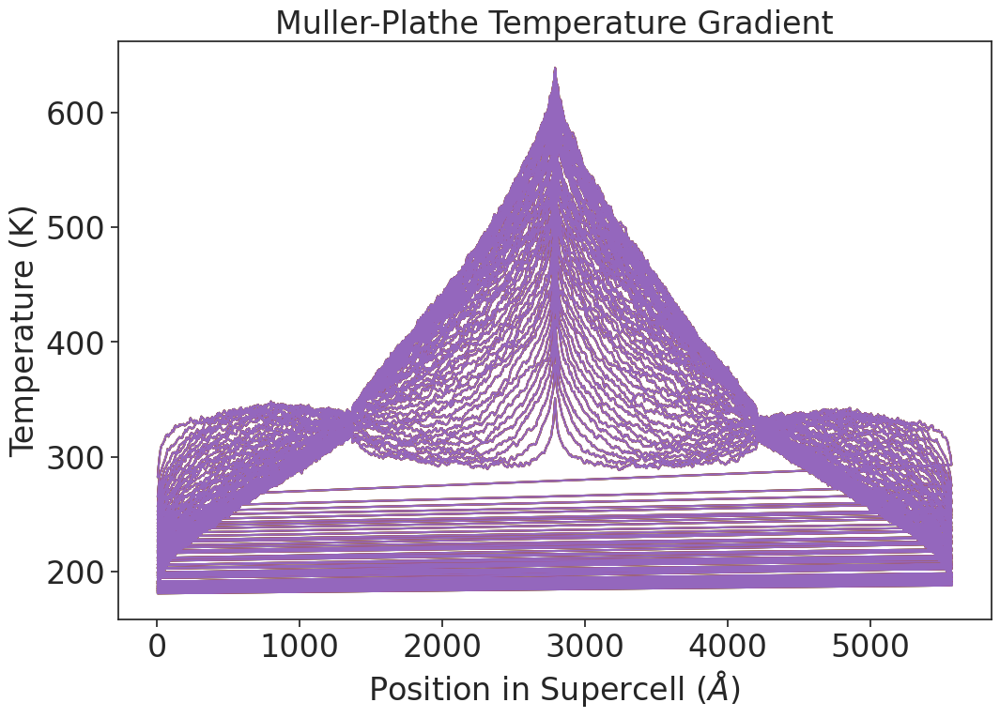

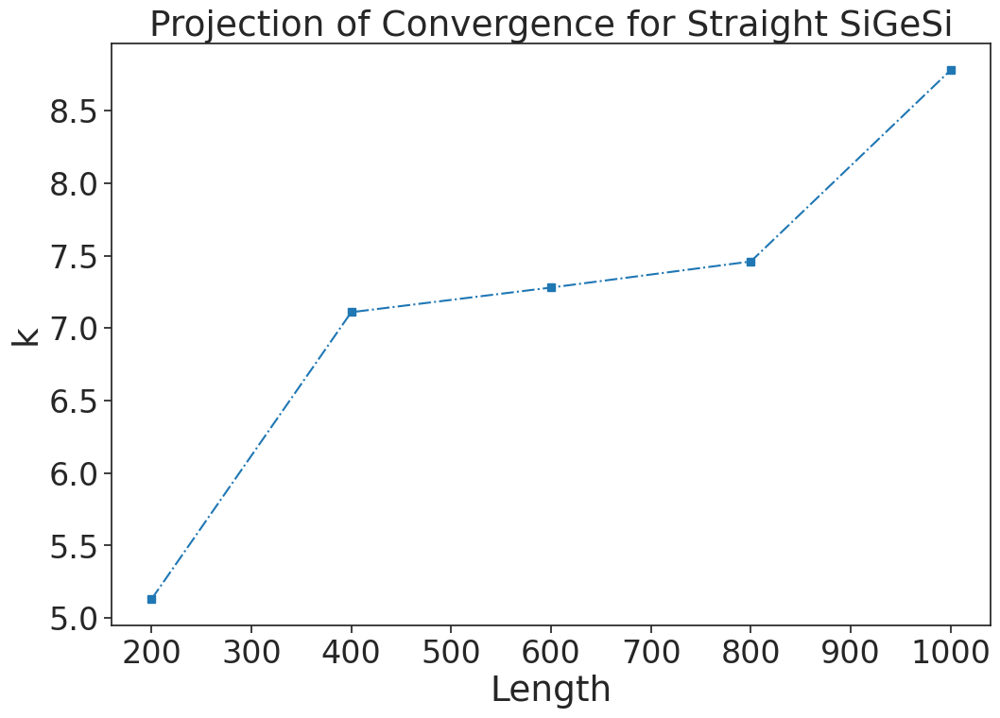

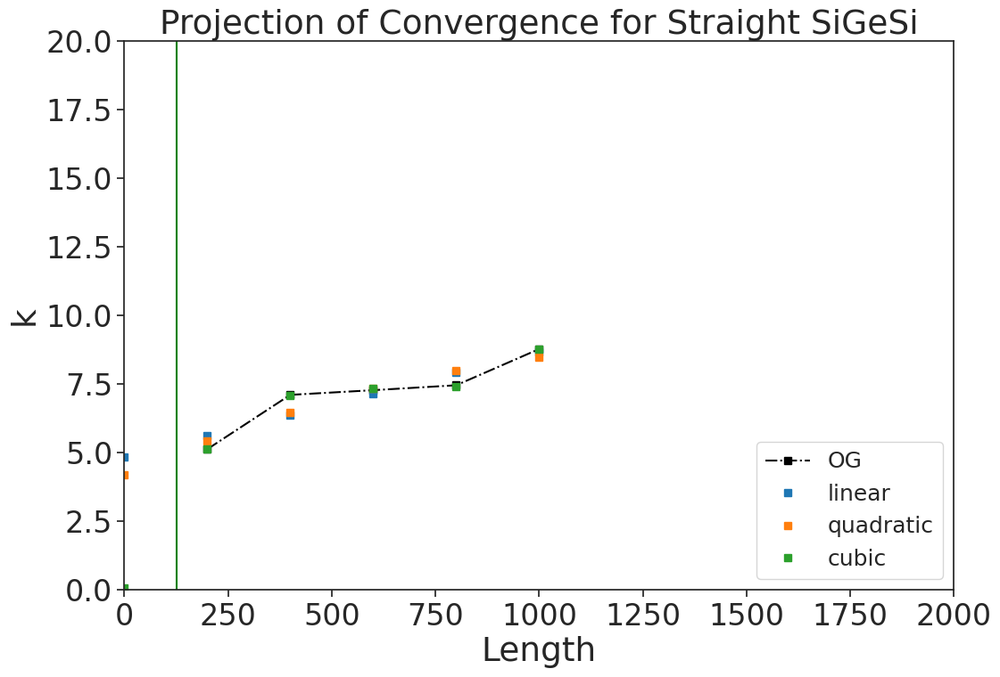

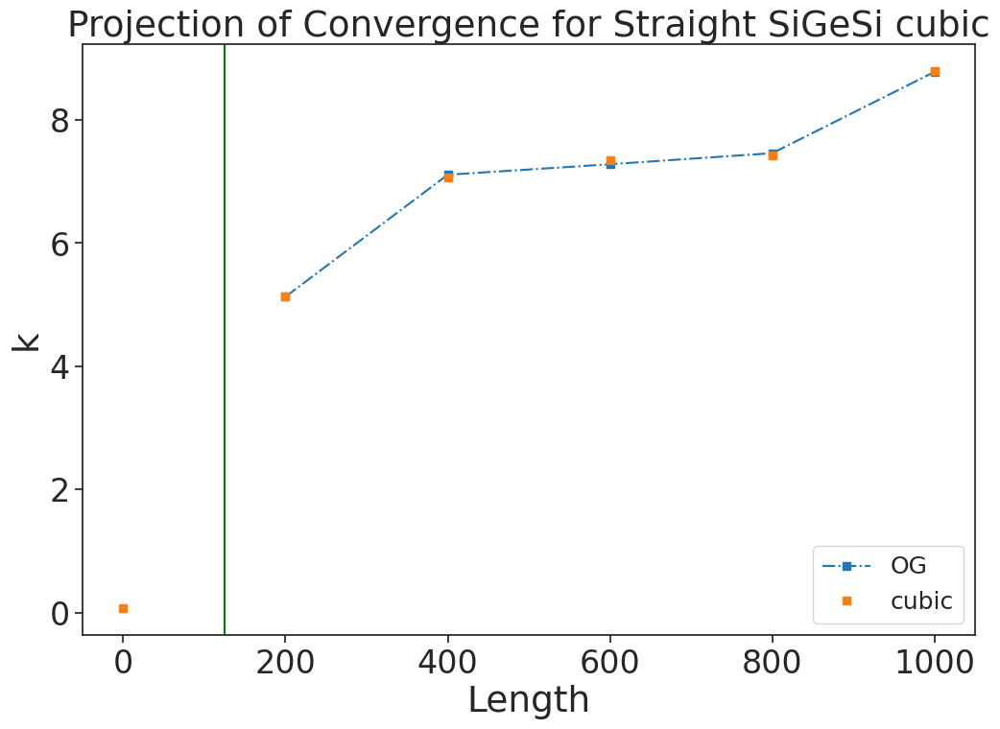

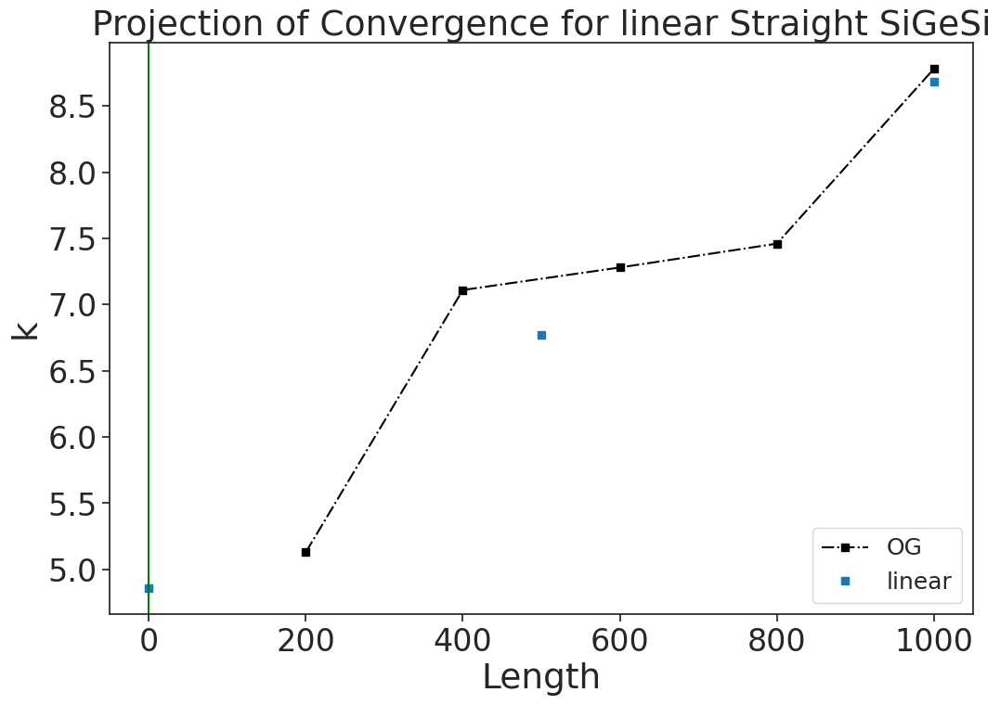

In [9]:

# load profile data 

filename = ['./profile_str_siE200','profile_str_siE400', 'profile_str_siE600',
            'profile_str_siE800', 'profile_str_siE1000']
           


MP_Profile = []; MP_Ave = []; MP_LastN = []; 

for simNo in range(0,len(filename)):
    subprocess.call(r"perl -p -e 's/^[\ \t]+|[\ \t]+$//g' %s > %s_new" % (filename[simNo], filename[simNo]), shell=True) # remove trailling white spaces
    subprocess.call("mv %s_new %s" % (filename[simNo], filename[simNo]), shell=True)
    subprocess.call("tr -s ' ' < %s > %s_tmp " % (filename[simNo], filename[simNo]), shell=True) #squeeze spaces
    subprocess.call("mv %s_tmp %s" % (filename[simNo], filename[simNo]), shell=True)

    profile = []; N = 800;
    with open(filename[simNo], 'r') as f:
        while True:
            lines = list(itertools.islice(f, 1, N+1))
            for line in lines:
                profile.append(line.split(' '))
            if not lines: 
                break
                
    lastN = profile[-N:] 
    lastAve = profile[-3200:]
    #print(lastAve)

    MP_Profile.append(profile)
    MP_LastN.append(lastN)
    MP_Ave.append(lastAve)
    
MP_Profile = np.array(MP_Profile, dtype=float) # for plotting 3D graphs
#print(MP_Profile)

MP_LastN = np.array(MP_LastN, dtype=float) # for calculating the thermal conductivity
#print(MP_LastN)



MP_Ave = np.array(MP_Ave, dtype=float) # for averaging the data to calculate the thermal conductivity
print(np.shape(MP_Profile))
#print(np.shape(MP_LastN))
print(np.shape(MP_Ave))

Thermo_Data = np.array([np.loadtxt('./Thermo_str_siE200'),np.loadtxt('./Thermo_str_siE400'),np.loadtxt('./Thermo_str_siE600'),
                       np.loadtxt('./Thermo_str_siE800'),np.loadtxt('./Thermo_str_siE1000')], dtype = object) 
                        
labels = ['str_si200', 'str_si600', 'str_si600','str_si800','str_si1000','str_si1500','str_si2000'] 

print(np.shape(Thermo_Data))
#print(np.shape(Pristine_Thermo))

#Sim_no_dataset = [1]
Sim_no_dataset = [1,1,1,1,1]
#Time_no_dataset = [6000000] # run?
Time_no_dataset = [6000000,6000000,6000000,6000000,6000000]
#Interval_no_dataset = [0.5e-3]  # picoseconds, timestep
Interval_no_dataset = [0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3]
#mxc_no_dataset = [10]  #200x10x10?
mxc_no_dataset = [10,10,10,10,10]

for simNo in range(0, len(MP_Profile)):
    Coordinates = MP_Profile[simNo,:,1]*(Thermo_Data[simNo,-1,9])
    #print(Coordinates)
    Temperature = MP_Profile[simNo,:,3]
    #print(Temperature)

fig = plt.figure(figsize=(12,8))
for k in range(0, len(MP_Profile)):
    plt.plot(Coordinates[:], Temperature[:], color=colors[k], label=labels[k])
    
plt.xlabel(r'Position in Supercell ($\AA$)')
plt.ylabel('Temperature (K)')
plt.title('Muller-Plathe Temperature Gradient', fontsize = 24)
#plt.savefig('MullerPlathe_PristineSi200.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
#plt.show

# Load the data that will be averaged to calculate the slopes 

Temperature = []; Coordinate = []; dX_Thermo = [];

for simNo in range(0, len(filename)):
    
    dX_ = Thermo_Data[simNo,-1,9]
    dX_Thermo.append(dX_)
    
    for i in range(0,800):
        Temperature_ = np.mean([MP_Ave[simNo,i,3],MP_Ave[simNo,i+800,3],MP_Ave[simNo,i+1600,3],MP_Ave[simNo,i+2400,3]])   
        Temperature.append(Temperature_)
        Coordinate_ = np.mean([MP_Ave[simNo,i,1],MP_Ave[simNo,i+800,1],MP_Ave[simNo,i+1600,1],MP_Ave[simNo,i+2400,1]])*dX_
        Coordinate.append(Coordinate_)
    
Temperature = np.array([Temperature[0:800],Temperature[800:1600],Temperature[1600:2400],
                       Temperature[2400:3200],Temperature[3200:4000]], dtype=float) #,
                       #Temperature[4000:4800],Temperature[4800:5600]], dtype=float)
Coordinate = np.array([Coordinate[0:800],Coordinate[800:1600],Coordinate[1600:2400],
                      Coordinate[2400:3200],Coordinate[3200:4000]], dtype=float) #,,
                      #Coordinate[4000:4800],Coordinate[4800:5600]], dtype=float)

print(np.shape(Coordinate))
print(np.shape(Temperature))

#print(dX_Thermo)

excluded_points1 = 200 # excluded points from the beginning
excluded_points2 = 40 # excluded points from the end
excluded_points3 = 20
excluded_points4 = 230 # from the end of the mp.data file

slope2_mean = []; slope2 = []; slope1_mean = []; slope1 = []; average_temp_str_SiGeSi = [];
# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff

for simNo in range(0,len(filename)):
    
    dTemp = Temperature[simNo,:]
    X = dX_
    dX = Coordinate[simNo,:] #*X # normalized distance
    
    #T_fit_left = np.polyfit(dX[280:380], dTemp[280:380], 1)
    #T_fit_right = -np.polyfit(dX[360:-280], dTemp[360:-280], 1)
    
    T_fit_left = np.polyfit(dX[excluded_points1:400-excluded_points2], dTemp[excluded_points1:400-excluded_points2], 1)
    T_fit_right = -np.polyfit(dX[400+excluded_points2:-excluded_points1], dTemp[400+excluded_points2:-excluded_points1], 1)
    
    slope2.append([T_fit_left[0], T_fit_right[0]])
    #print(slope2)
    print('Top Slope', labels[simNo], ' = ', T_fit_left[0], T_fit_right[0])

    mean_slope = np.mean([abs(T_fit_left[0]), abs(T_fit_right[0])], axis = 0)
    slope2_mean.append(mean_slope)
    print('Top Slope Mean', labels[simNo], ' = ', slope2_mean[0])
    
    B_fit_left2 = np.polyfit(dX[excluded_points3:400-excluded_points4], dTemp[excluded_points3:400-excluded_points4], 1)
    B_fit_right2 = -np.polyfit(dX[400+excluded_points4:-excluded_points3], dTemp[400+excluded_points4:-excluded_points3], 1)
    
    slope1.append([B_fit_left2[0], B_fit_right2[0]])
    print('Bottom Slope', labels[simNo], ' = ', B_fit_left2[0], B_fit_right2[0])
    
    mean_slope = np.mean([abs(B_fit_left2[0]), abs(B_fit_right2[0])], axis = 0)
    slope1_mean.append(mean_slope)
    print('Bottom Slope Mean', labels[simNo], ' = ', slope1_mean[0])

    average_temp = np.mean(dTemp)
    average_temp_str_SiGeSi.append(average_temp)    

Slope1 = np.array(slope1)
Slope_mean1 = np.array(slope1_mean)
#print(Slope_mean1)

Slope2 = np.array(slope2)
Slope_mean2 = np.array(slope2_mean)
#print(Slope_mean2)

Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0)]) #individual
#Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0), np.mean([Slope_mean1[1], Slope_mean2[1]], axis =0), np.mean([Slope_mean1[2], Slope_mean2[2]], axis=0)])
print('Slope Mean', labels[simNo], ' = ', Slope_mean[0])

Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0]]) #individual
#Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0], Slope_mean[1]*dX_Thermo[1], Slope_mean[2]*dX_Thermo[2]])
print('Slope Average', labels[simNo], ' = ', Slope_ave[0])

# Calculate the heat flux and the thermal conductivity
eV2J  = 1.6e-19;
Ang2m =   1e-10;
ps2s  =   1e-12;
conversion = (eV2J/(Ang2m*ps2s))

s_values = []
Thermals_str_SiGeSi = []
dt = 0.0005 # picoseconds

# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff
for simNo in range(0, len(Thermo_Data)):
    
    Steps = Thermo_Data[simNo,-1,0]
    Time = Steps*dt # picoseconds
    
    dx = Thermo_Data[simNo,-1,9]
    dy = Thermo_Data[simNo,-1,10]
    dz = Thermo_Data[simNo,-1,11]
    Area = dy*dz
    
    #DeltaE = Thermo_Data[simNo,-1,-2] # E_pair
    #TotalE = Thermo_Data[simNo,-1,-5] # Total energy
    KinE = Thermo_Data[simNo,-1,12] # in log_lammps, f_3 
    
    Thermal_left2 = ((KinE)/(2*Time*Area*Slope2[simNo,0]))*conversion #top left
    Thermal_right2 = ((KinE)/(2*Time*Area*Slope2[simNo,1]))*conversion #top right
    
    Thermal_left1 = ((KinE)/(2*Time*Area*Slope1[simNo,0]))*conversion #bottom left
    Thermal_right1 = ((KinE)/(2*Time*Area*Slope1[simNo,1]))*conversion #bottom right
    
    thermal2 = np.concatenate((Thermal_left1, Thermal_left2), axis = None)
    thermal1 = np.concatenate((Thermal_right1, Thermal_right2), axis = None)
    
    thermal2_ave = ((KinE)/(2*Time*Area*Slope_mean2[simNo]))*conversion #top
    thermal1_ave = ((KinE)/(2*Time*Area*Slope_mean1[simNo]))*conversion #bottom
    
    #thermal_ave = ((KinE)/(2*Time*Area*Slope_ave[simNo]))*conversion
    thermal_ave = (thermal2_ave+thermal1_ave)/2
   
    getcontext().prec = 10
    std_top = Decimal(np.std([Thermal_left2, Thermal_right2], dtype=np.float64))
    SE_left = std_top/Decimal(math.sqrt(2))
   
    std_bottom = Decimal(np.std([Thermal_left1, Thermal_right1], dtype=np.float64))
    SE_right = std_bottom/Decimal(math.sqrt(2))
    
    SE = math.sqrt(((SE_left/2)**2) + ((SE_right/2)**2))
    print(SE)
   
    #print('Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2[0], thermal2[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2_ave)
    
    #print('Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1[0], thermal1[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1_ave)
    
    print('Average Thermal Conductivity of', labels[simNo], 'Average = ', thermal_ave) 
    
    Therm_val = [Thermal_left1,Thermal_left2,Thermal_right1,Thermal_right2]
    Ttherm = ['%.2f' % elem for elem in Therm_val]
    #print(Ttherm)
    Thermals_str_SiGeSi.append(Ttherm)
    print('Thermals_str_SiGeSi', labels[simNo], ' = ', Ttherm)
    
    
    TC_values = [thermal2_ave, thermal1_ave, thermal_ave, SE]
    val = ['%.2f' % elem for elem in TC_values]
    #print(val)
    s_values.append(val)
    print('s values', labels[simNo], ' = ', val)
    #print(simNo)
    

print(s_values)
#print(s_values[0]) #200
#print(s_values[1]) #400
#print(s_values[2]) #600
#print(s_values[3]) #800
#print(s_values[0][0])
therm_average_str_SiGeSi = []
for item in s_values:
    #print(item[0])
    therm_average_str_SiGeSi.append(item[2])

therm_average_str_SiGeSi = []
for item in s_values:
    print(float(item[2]))
    therm_average_str_SiGeSi.append(np.array(float(item[2])))

#projection stuff




str_SiGeSi = [200.0,400.0,600.0,800.0,1000.0]#,1500.0,2000.0]
str_SiGeSi = np.array(str_SiGeSi)
#print(np.shape(str_SiGeSi))
print(str_SiGeSi)
#Tc = [5.95,7.17,8.96,float(s_values[3][2]),float(s_values[4][2])]
Tc = [float(s_values[0][2]),float(s_values[1][2]),float(s_values[2][2]),
      float(s_values[3][2]),float(s_values[4][2])]
     #float(s_values[5][2]),float(s_values[6][2])]
Tc = np.array(Tc)
print(Tc)

inv_str_SiGeSi = np.reciprocal(str_SiGeSi)
#np.set_printoptions(precision=10)
print(inv_str_SiGeSi)

inv_Tc = np.reciprocal(Tc)
print(inv_Tc)

#plot

fig = plt.figure(figsize=(12,8))

plt.plot(str_SiGeSi[:], Tc[:],'s-.')


plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for Straight SiGeSi', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-SiGeSi-r125.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


#plt.show()



fig = plt.figure(figsize=(12,8))

x1 = np.array(str_SiGeSi)
mn = min(x1)
mx = max(x1)
#print(x1)
#print(len(x))

y1 = np.array(Tc)
#print(y1)

z1 = np.polyfit(x1, y1, 1) #np.polyfit(x, y, degree of polynomial), degree =1,2,3 is linear, quadratic, cubic
z2 = np.polyfit(x1, y1, 2)
z3 = np.polyfit(x1, y1, 3)

print(z1,'\n',z2,'\n',z3)
#xp = np.linspace(mn, mx, 6)
xp = np.linspace(-0.001, mx+0.001, 6)
print(xp)

p1 = np.poly1d(z1)
p2 = np.poly1d(z2)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

plt.plot(x1, y1, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')
plt.plot(xp, p2(xp), 's', label = 'quadratic')
plt.plot(xp, p3(xp), 's', label ='cubic') 

plt.axvline(x=125.0, color='green')

plt.legend(loc="lower right")

plt.xlim([0.0,2000])
plt.ylim([0.0,20])

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for Straight SiGeSi', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-SiGeSi-r125-lqc-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


#plt.show


fig = plt.figure(figsize=(12,8))

x_2 = np.array(str_SiGeSi)
mn = min(x_2)
mx = max(x_2)
#print(mn)
#print(len(x_2))

y_2 = np.array(Tc)
#print(y)

#xpp = np.linspace(-0.00005,mx, 6)
xpp = np.linspace(-0.0005,mx, 6)

plt.axvline(x=125.0, color='green')


z3 = np.polyfit(x_2, y_2, 3)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

#m, c; run by Laura
s = p3(1);
i = p3(2)    #The polyfit function for a linear (polynomial order 1) fit returns the slope as the first parameter
                    #and the intercept as the second parameter, so the output vector is [slope, intercept]. 
                    #It is like any other vector, so choose the one you want by indexing into it.
n = p3(0)
#print(s)
#print(i)
#print(n)

#slope_intercept = np.polyfit(x_2,y_2,1)
#print('Intercept of linear polyfit:',slope_intercept)
#slope_intercept = np.polyfit(x_2,y_2,2)
#print('Intercept of quad. polyfit:',slope_intercept)
slope_intercept = np.polyfit(x_2,y_2,3)
print('Intercept of cubic polyfit:',slope_intercept)
#

plt.plot(x_2,y_2, 's-.', label ='OG')
plt.plot(xpp, p3(xp), 's', label ='cubic') 
plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
#plt.ylim(-0.0002, 0.18)
plt.title(r'Projection of Convergence for Straight SiGeSi cubic', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-SiGeSi-r125-c-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)



#plt.show


#linear fit in linear region alone
fig = plt.figure(figsize=(12,8))

#x2 = [0.005,0.0025,0.00166667]
x2 = str_SiGeSi
x2 = np.array(x2)
y2 = Tc
#y2 = [0.16806723,0.13947001,0.11160714]
y2 = np.array(y2)


z = np.polyfit(x2, y2, 1) 
xp = np.linspace(-0.001, mx+0.001, 3)

p1 = np.poly1d(z)

slope_intercept = np.polyfit(x2,y2,1)
print('Intercept of linear polyfit:',slope_intercept)


plt.plot(x2, y2, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')

plt.axvline(x=0, color='green')

plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for linear Straight SiGeSi', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-linear-SiGeSi-r125-l-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


#plt.show






SE200b_left = np.std([float(Thermals_str_SiGeSi[0][0]), float(Thermals_str_SiGeSi[0][2])], dtype=np.float64)
SE200_left = SE200b_left/math.sqrt(2)
SE200b_right = np.std([float(Thermals_str_SiGeSi[0][1]), float(Thermals_str_SiGeSi[0][3])], dtype=np.float64)
SE200_right = SE200b_right/math.sqrt(2)
standard_error200b_str_SiGeSi = math.sqrt(((SE200_left/2)**2) + ((SE200_right/2)**2))
print('Standard error of size 200:',standard_error200b_str_SiGeSi)

SE400b_left = np.std([float(Thermals_str_SiGeSi[1][0]), float(Thermals_str_SiGeSi[1][2])], dtype=np.float64)
SE400_left = SE400b_left/math.sqrt(2)
SE400b_right = np.std([float(Thermals_str_SiGeSi[1][1]), float(Thermals_str_SiGeSi[1][3])], dtype=np.float64)
SE400_right = SE400b_right/math.sqrt(2)
standard_error400b_str_SiGeSi = math.sqrt(((SE400_left/2)**2) + ((SE400_right/2)**2))
print('Standard error of size 400:',standard_error400b_str_SiGeSi)

SE600b_left = np.std([float(Thermals_str_SiGeSi[2][0]), float(Thermals_str_SiGeSi[2][2])], dtype=np.float64)
SE600_left = SE600b_left/math.sqrt(2)
SE600b_right = np.std([float(Thermals_str_SiGeSi[2][1]), float(Thermals_str_SiGeSi[2][3])], dtype=np.float64)
SE600_right = SE600b_right/math.sqrt(2)
standard_error600b_str_SiGeSi = math.sqrt(((SE600_left/2)**2) + ((SE600_right/2)**2))
print('Standard error of size 600:',standard_error600b_str_SiGeSi)

SE800b_left = np.std([float(Thermals_str_SiGeSi[3][0]), float(Thermals_str_SiGeSi[3][2])], dtype=np.float64)
SE800_left = SE800b_left/math.sqrt(2)
SE800b_right = np.std([float(Thermals_str_SiGeSi[3][1]), float(Thermals_str_SiGeSi[3][3])], dtype=np.float64)
SE800_right = SE800b_right/math.sqrt(2)
standard_error800b_str_SiGeSi = math.sqrt(((SE800_left/2)**2) + ((SE800_right/2)**2))
print('Standard error of size 800:',standard_error800b_str_SiGeSi)

SE1000b_left = np.std([float(Thermals_str_SiGeSi[4][0]), float(Thermals_str_SiGeSi[4][2])], dtype=np.float64)
SE1000_left = SE1000b_left/math.sqrt(2)
SE1000b_right = np.std([float(Thermals_str_SiGeSi[4][1]), float(Thermals_str_SiGeSi[4][3])], dtype=np.float64)
SE1000_right = SE1000b_right/math.sqrt(2)
standard_error1000b_str_SiGeSi = math.sqrt(((SE1000_left/2)**2) + ((SE1000_right/2)**2))
print('Standard error of size 1000:',standard_error1000b_str_SiGeSi)
'''
SE1500b_left = np.std([float(Thermals_str_SiGeSi[5][0]), float(Thermals_str_SiGeSi[5][2])], dtype=np.float64)
SE1500_left = SE1500b_left/math.sqrt(2)
SE1500b_right = np.std([float(Thermals_str_SiGeSi[5][1]), float(Thermals_str_SiGeSi[5][3])], dtype=np.float64)
SE1500_right = SE1500b_right/math.sqrt(2)
standard_error1500b_str_SiGeSi = math.sqrt(((SE1500_left/2)**2) + ((SE1500_right/2)**2))
print('Standard error of size 1500:',standard_error1500b_str_SiGeSi)

SE2000b_left = np.std([float(Thermals_str_SiGeSi[6][0]), float(Thermals_str_SiGeSi[6][2])], dtype=np.float64)
SE2000_left = SE2000b_left/math.sqrt(2)
SE2000b_right = np.std([float(Thermals_str_SiGeSi[6][1]), float(Thermals_str_SiGeSi[6][3])], dtype=np.float64)
SE2000_right = SE2000b_right/math.sqrt(2)
standard_error2000b_str_SiGeSi = math.sqrt(((SE2000_left/2)**2) + ((SE2000_right/2)**2))
print('Standard error of size 2000:',standard_error2000b_str_SiGeSi)

yerr1500b_str_SiGeSi = standard_error1500b_str_SiGeSi
yerr2000b_str_SiGeSi = standard_error2000b_str_SiGeSi


#projection of convergence for SiGeSi
#https://math.stackexchange.com/questions/3217622/how-does-inverting-data-change-standaro-deviation
'''
yerr200b_str_SiGeSi = standard_error200b_str_SiGeSi
yerr400b_str_SiGeSi = standard_error400b_str_SiGeSi
yerr600b_str_SiGeSi = standard_error600b_str_SiGeSi
yerr800b_str_SiGeSi = standard_error800b_str_SiGeSi
yerr1000b_str_SiGeSi = standard_error1000b_str_SiGeSi


In [10]:
#STraight GESIGE

(5, 48000, 4)
(5, 3200, 4)
(5, 61, 14)
(5, 800)
(5, 800)
Top Slope str_ge200  =  0.16537211078026753 0.17672465614139318
Top Slope Mean str_ge200  =  0.17104838346083034
Bottom Slope str_ge200  =  0.26829654322477486 0.27379588641688585
Bottom Slope Mean str_ge200  =  0.27104621482083036
Top Slope str_ge600  =  0.12861155102882313 0.1320086457230905
Top Slope Mean str_ge600  =  0.17104838346083034
Bottom Slope str_ge600  =  0.18835016641893035 0.18608204922604696
Bottom Slope Mean str_ge600  =  0.27104621482083036
Top Slope str_ge600  =  0.11147301363312546 0.10799723048959188
Top Slope Mean str_ge600  =  0.17104838346083034
Bottom Slope str_ge600  =  0.16332541907984682 0.15825237178578286
Bottom Slope Mean str_ge600  =  0.27104621482083036
Top Slope str_ge800  =  0.09844013873627809 0.09665621138653158
Top Slope Mean str_ge800  =  0.17104838346083034
Bottom Slope str_ge800  =  0.13826425822849375 0.13808483685705744
Bottom Slope Mean str_ge800  =  0.27104621482083036
Top Slope str_ge

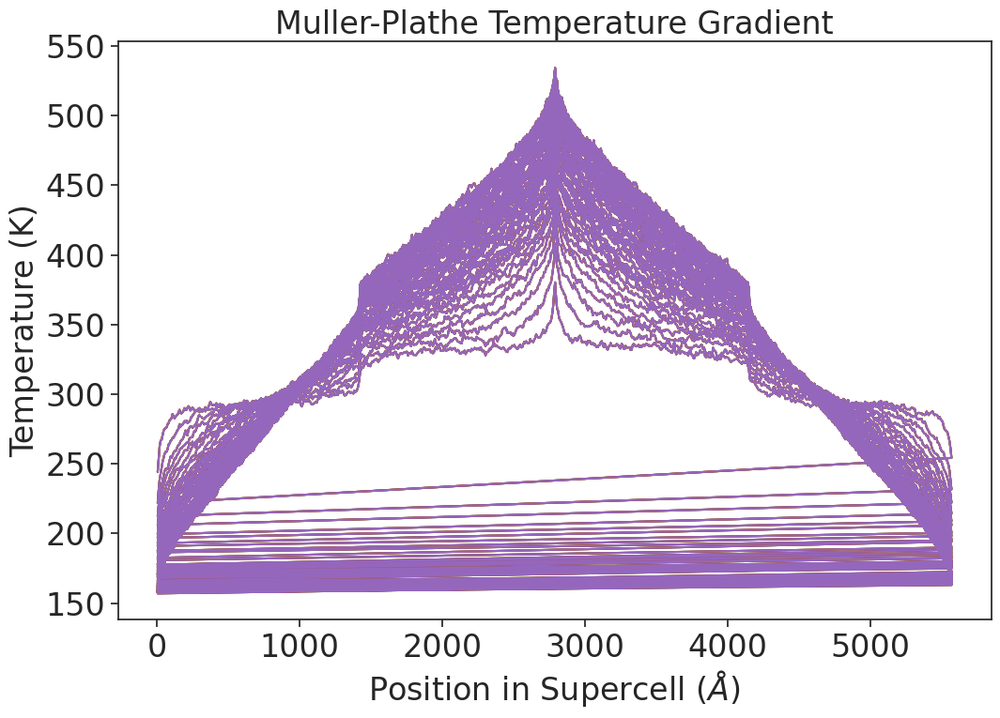

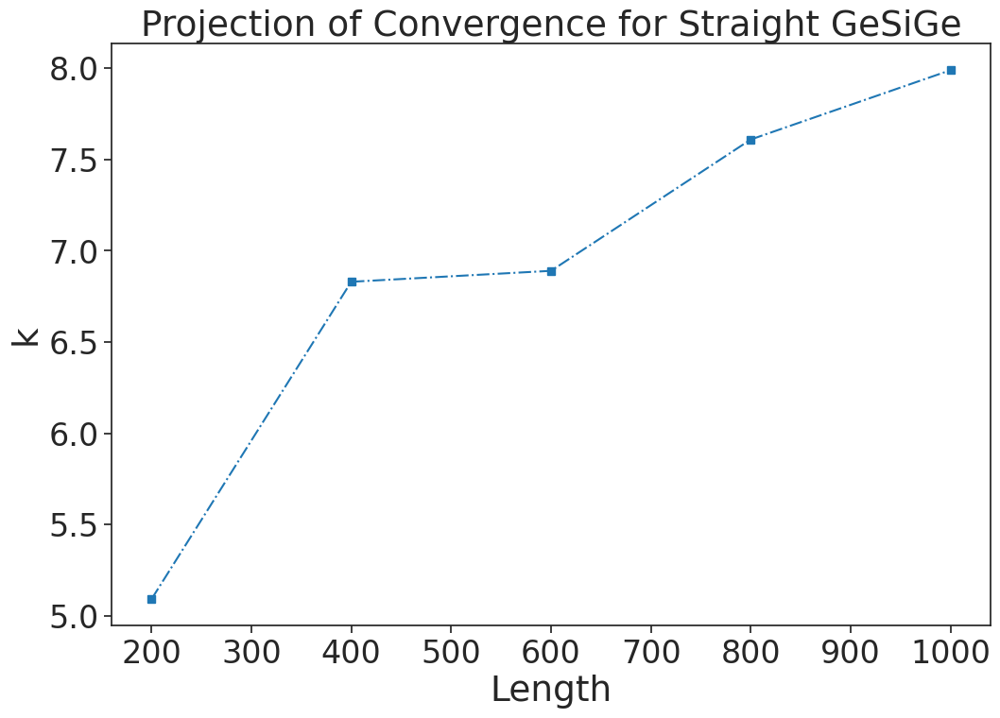

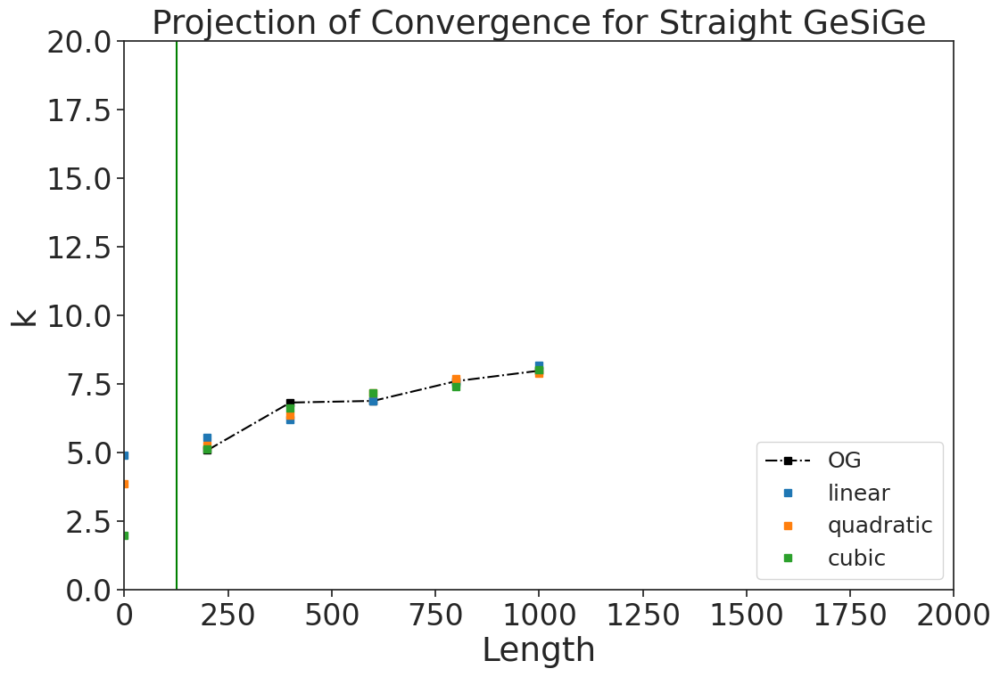

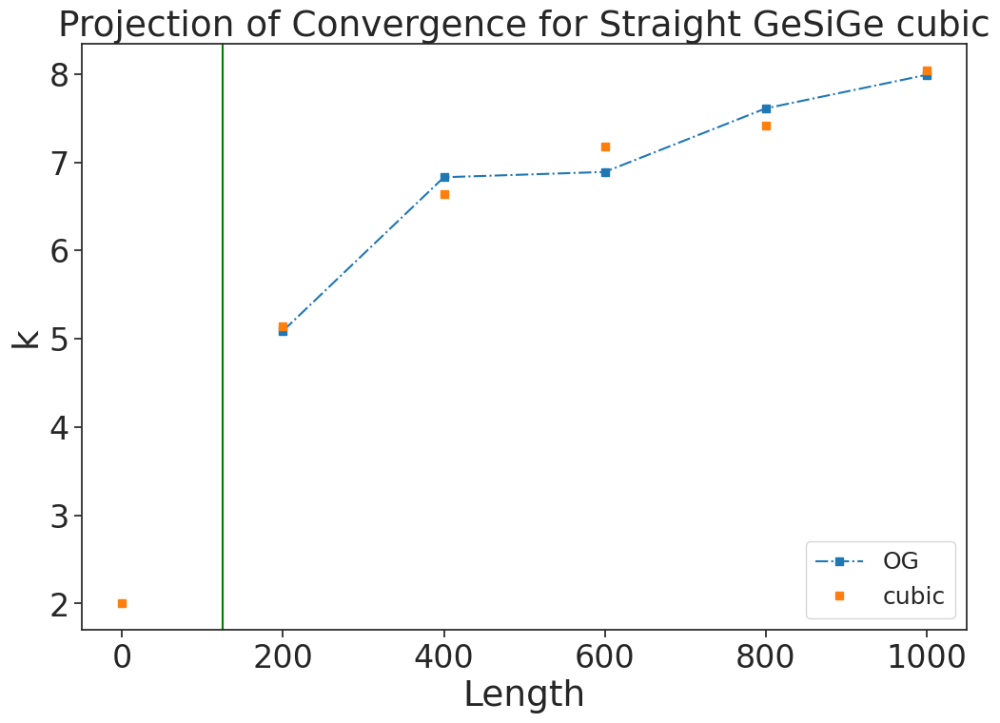

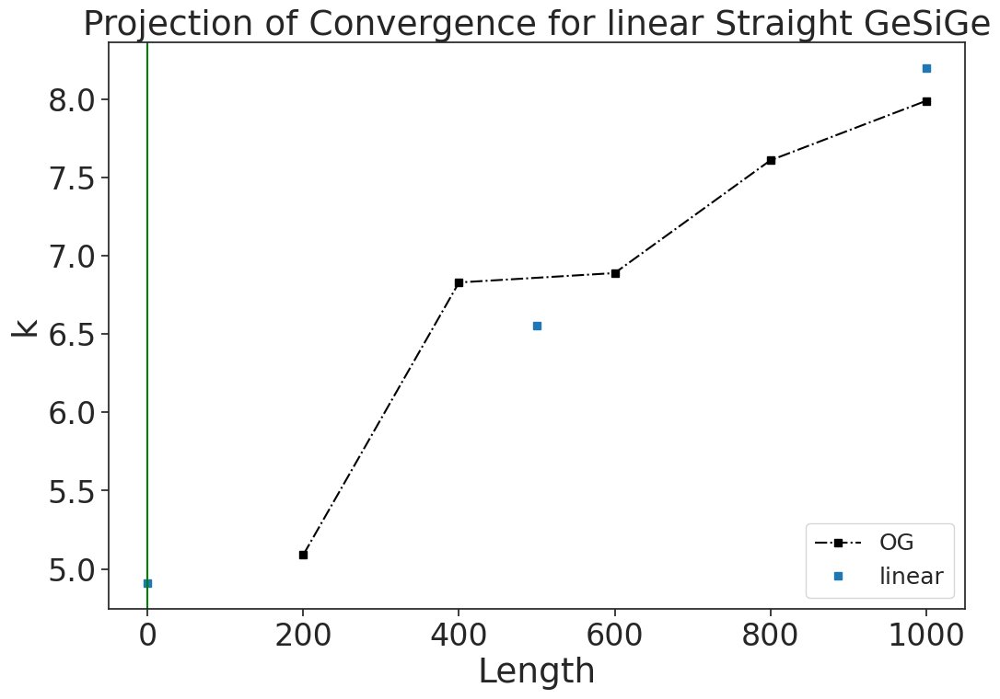

In [11]:

# load profile data 

filename = ['./profile_str_geE200','profile_str_geE400', 'profile_str_geE600',
            'profile_str_geE800', 'profile_str_geE1000']
           


MP_Profile = []; MP_Ave = []; MP_LastN = []; 

for simNo in range(0,len(filename)):
    subprocess.call(r"perl -p -e 's/^[\ \t]+|[\ \t]+$//g' %s > %s_new" % (filename[simNo], filename[simNo]), shell=True) # remove trailling white spaces
    subprocess.call("mv %s_new %s" % (filename[simNo], filename[simNo]), shell=True)
    subprocess.call("tr -s ' ' < %s > %s_tmp " % (filename[simNo], filename[simNo]), shell=True) #squeeze spaces
    subprocess.call("mv %s_tmp %s" % (filename[simNo], filename[simNo]), shell=True)

    profile = []; N = 800;
    with open(filename[simNo], 'r') as f:
        while True:
            lines = list(itertools.islice(f, 1, N+1))
            for line in lines:
                profile.append(line.split(' '))
            if not lines: 
                break
                
    lastN = profile[-N:] 
    lastAve = profile[-3200:]
    #print(lastAve)

    MP_Profile.append(profile)
    MP_LastN.append(lastN)
    MP_Ave.append(lastAve)
    
MP_Profile = np.array(MP_Profile, dtype=float) # for plotting 3D graphs
#print(MP_Profile)

MP_LastN = np.array(MP_LastN, dtype=float) # for calculating the thermal conductivity
#print(MP_LastN)



MP_Ave = np.array(MP_Ave, dtype=float) # for averaging the data to calculate the thermal conductivity
print(np.shape(MP_Profile))
#print(np.shape(MP_LastN))
print(np.shape(MP_Ave))

Thermo_Data = np.array([np.loadtxt('./Thermo_str_geE200'),np.loadtxt('./Thermo_str_geE400'),np.loadtxt('./Thermo_str_geE600'),
                       np.loadtxt('./Thermo_str_geE800'),np.loadtxt('./Thermo_str_geE1000')], dtype = object) 
                        
labels = ['str_ge200', 'str_ge600', 'str_ge600','str_ge800','str_ge1000','str_ge1500','str_ge2000'] 

print(np.shape(Thermo_Data))
#print(np.shape(Pristine_Thermo))

#Sim_no_dataset = [1]
Sim_no_dataset = [1,1,1,1,1]
#Time_no_dataset = [6000000] # run?
Time_no_dataset = [6000000,6000000,6000000,6000000,6000000]
#Interval_no_dataset = [0.5e-3]  # picoseconds, timestep
Interval_no_dataset = [0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3]
#mxc_no_dataset = [10]  #200x10x10?
mxc_no_dataset = [10,10,10,10,10]

for simNo in range(0, len(MP_Profile)):
    Coordinates = MP_Profile[simNo,:,1]*(Thermo_Data[simNo,-1,9])
    #print(Coordinates)
    Temperature = MP_Profile[simNo,:,3]
    #print(Temperature)

fig = plt.figure(figsize=(12,8))
for k in range(0, len(MP_Profile)):
    plt.plot(Coordinates[:], Temperature[:], color=colors[k], label=labels[k])
    
plt.xlabel(r'Position in Supercell ($\AA$)')
plt.ylabel('Temperature (K)')
plt.title('Muller-Plathe Temperature Gradient', fontsize = 24)
#plt.savefig('MullerPlathe_PristineSi200.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
#plt.show

# Load the data that will be averaged to calculate the slopes 

Temperature = []; Coordinate = []; dX_Thermo = [];

for simNo in range(0, len(filename)):
    
    dX_ = Thermo_Data[simNo,-1,9]
    dX_Thermo.append(dX_)
    
    for i in range(0,800):
        Temperature_ = np.mean([MP_Ave[simNo,i,3],MP_Ave[simNo,i+800,3],MP_Ave[simNo,i+1600,3],MP_Ave[simNo,i+2400,3]])   
        Temperature.append(Temperature_)
        Coordinate_ = np.mean([MP_Ave[simNo,i,1],MP_Ave[simNo,i+800,1],MP_Ave[simNo,i+1600,1],MP_Ave[simNo,i+2400,1]])*dX_
        Coordinate.append(Coordinate_)
    
Temperature = np.array([Temperature[0:800],Temperature[800:1600],Temperature[1600:2400],
                       Temperature[2400:3200],Temperature[3200:4000]], dtype=float) #,
                       #Temperature[4000:4800],Temperature[4800:5600]], dtype=float)
Coordinate = np.array([Coordinate[0:800],Coordinate[800:1600],Coordinate[1600:2400],
                      Coordinate[2400:3200],Coordinate[3200:4000]], dtype=float) #,,
                      #Coordinate[4000:4800],Coordinate[4800:5600]], dtype=float)

print(np.shape(Coordinate))
print(np.shape(Temperature))

#print(dX_Thermo)

excluded_points1 = 200 # excluded points from the beginning
excluded_points2 = 40 # excluded points from the end
excluded_points3 = 20
excluded_points4 = 230 # from the end of the mp.data file

slope2_mean = []; slope2 = []; slope1_mean = []; slope1 = []; average_temp_str_GeSiGe = [];
# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff

for simNo in range(0,len(filename)):
    
    dTemp = Temperature[simNo,:]
    X = dX_
    dX = Coordinate[simNo,:] #*X # normalized distance
    
    #T_fit_left = np.polyfit(dX[280:380], dTemp[280:380], 1)
    #T_fit_right = -np.polyfit(dX[360:-280], dTemp[360:-280], 1)
    
    T_fit_left = np.polyfit(dX[excluded_points1:400-excluded_points2], dTemp[excluded_points1:400-excluded_points2], 1)
    T_fit_right = -np.polyfit(dX[400+excluded_points2:-excluded_points1], dTemp[400+excluded_points2:-excluded_points1], 1)
    
    slope2.append([T_fit_left[0], T_fit_right[0]])
    #print(slope2)
    print('Top Slope', labels[simNo], ' = ', T_fit_left[0], T_fit_right[0])

    mean_slope = np.mean([abs(T_fit_left[0]), abs(T_fit_right[0])], axis = 0)
    slope2_mean.append(mean_slope)
    print('Top Slope Mean', labels[simNo], ' = ', slope2_mean[0])
    
    B_fit_left2 = np.polyfit(dX[excluded_points3:400-excluded_points4], dTemp[excluded_points3:400-excluded_points4], 1)
    B_fit_right2 = -np.polyfit(dX[400+excluded_points4:-excluded_points3], dTemp[400+excluded_points4:-excluded_points3], 1)
    
    slope1.append([B_fit_left2[0], B_fit_right2[0]])
    print('Bottom Slope', labels[simNo], ' = ', B_fit_left2[0], B_fit_right2[0])
    
    mean_slope = np.mean([abs(B_fit_left2[0]), abs(B_fit_right2[0])], axis = 0)
    slope1_mean.append(mean_slope)
    print('Bottom Slope Mean', labels[simNo], ' = ', slope1_mean[0])

    average_temp = np.mean(dTemp)
    average_temp_str_GeSiGe.append(average_temp)    

Slope1 = np.array(slope1)
Slope_mean1 = np.array(slope1_mean)
#print(Slope_mean1)

Slope2 = np.array(slope2)
Slope_mean2 = np.array(slope2_mean)
#print(Slope_mean2)

Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0)]) #individual
#Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0), np.mean([Slope_mean1[1], Slope_mean2[1]], axis =0), np.mean([Slope_mean1[2], Slope_mean2[2]], axis=0)])
print('Slope Mean', labels[simNo], ' = ', Slope_mean[0])

Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0]]) #individual
#Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0], Slope_mean[1]*dX_Thermo[1], Slope_mean[2]*dX_Thermo[2]])
print('Slope Average', labels[simNo], ' = ', Slope_ave[0])

# Calculate the heat flux and the thermal conductivity
eV2J  = 1.6e-19;
Ang2m =   1e-10;
ps2s  =   1e-12;
conversion = (eV2J/(Ang2m*ps2s))

s_values = []
Thermals_str_GeSiGe = []
dt = 0.0005 # picoseconds

# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff
for simNo in range(0, len(Thermo_Data)):
    
    Steps = Thermo_Data[simNo,-1,0]
    Time = Steps*dt # picoseconds
    
    dx = Thermo_Data[simNo,-1,9]
    dy = Thermo_Data[simNo,-1,10]
    dz = Thermo_Data[simNo,-1,11]
    Area = dy*dz
    
    #DeltaE = Thermo_Data[simNo,-1,-2] # E_pair
    #TotalE = Thermo_Data[simNo,-1,-5] # Total energy
    KinE = Thermo_Data[simNo,-1,12] # in log_lammps, f_3 
    
    Thermal_left2 = ((KinE)/(2*Time*Area*Slope2[simNo,0]))*conversion #top left
    Thermal_right2 = ((KinE)/(2*Time*Area*Slope2[simNo,1]))*conversion #top right
    
    Thermal_left1 = ((KinE)/(2*Time*Area*Slope1[simNo,0]))*conversion #bottom left
    Thermal_right1 = ((KinE)/(2*Time*Area*Slope1[simNo,1]))*conversion #bottom right
    
    thermal2 = np.concatenate((Thermal_left1, Thermal_left2), axis = None)
    thermal1 = np.concatenate((Thermal_right1, Thermal_right2), axis = None)
    
    thermal2_ave = ((KinE)/(2*Time*Area*Slope_mean2[simNo]))*conversion #top
    thermal1_ave = ((KinE)/(2*Time*Area*Slope_mean1[simNo]))*conversion #bottom
    
    #thermal_ave = ((KinE)/(2*Time*Area*Slope_ave[simNo]))*conversion
    thermal_ave = (thermal2_ave+thermal1_ave)/2
   
    getcontext().prec = 10
    std_top = Decimal(np.std([Thermal_left2, Thermal_right2], dtype=np.float64))
    SE_left = std_top/Decimal(math.sqrt(2))
   
    std_bottom = Decimal(np.std([Thermal_left1, Thermal_right1], dtype=np.float64))
    SE_right = std_bottom/Decimal(math.sqrt(2))
    
    SE = math.sqrt(((SE_left/2)**2) + ((SE_right/2)**2))
    print(SE)
   
    #print('Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2[0], thermal2[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2_ave)
    
    #print('Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1[0], thermal1[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1_ave)
    
    print('Average Thermal Conductivity of', labels[simNo], 'Average = ', thermal_ave) 
    
    Therm_val = [Thermal_left1,Thermal_left2,Thermal_right1,Thermal_right2]
    Ttherm = ['%.2f' % elem for elem in Therm_val]
    #print(Ttherm)
    Thermals_str_GeSiGe.append(Ttherm)
    print('Thermals_str_GeSiGe', labels[simNo], ' = ', Ttherm)
    
    
    TC_values = [thermal2_ave, thermal1_ave, thermal_ave, SE]
    val = ['%.2f' % elem for elem in TC_values]
    #print(val)
    s_values.append(val)
    print('s values', labels[simNo], ' = ', val)
    #print(simNo)
    

print(s_values)
#print(s_values[0]) #200
#print(s_values[1]) #400
#print(s_values[2]) #600
#print(s_values[3]) #800
#print(s_values[0][0])
therm_average_str_GeSiGe = []
for item in s_values:
    #print(item[0])
    therm_average_str_GeSiGe.append(item[2])

therm_average_str_GeSiGe = []
for item in s_values:
    print(float(item[2]))
    therm_average_str_GeSiGe.append(np.array(float(item[2])))

#projection stuff




str_GeSiGe = [200.0,400.0,600.0,800.0,1000.0]#,1500.0,2000.0]
str_GeSiGe = np.array(str_GeSiGe)
#print(np.shape(str_GeSiGe))
print(str_GeSiGe)
#Tc = [5.95,7.17,8.96,float(s_values[3][2]),float(s_values[4][2])]
Tc = [float(s_values[0][2]),float(s_values[1][2]),float(s_values[2][2]),
      float(s_values[3][2]),float(s_values[4][2])]
     #float(s_values[5][2]),float(s_values[6][2])]
Tc = np.array(Tc)
print(Tc)

inv_str_GeSiGe = np.reciprocal(str_GeSiGe)
#np.set_printoptions(precision=10)
print(inv_str_GeSiGe)

inv_Tc = np.reciprocal(Tc)
print(inv_Tc)

#plot

fig = plt.figure(figsize=(12,8))

plt.plot(str_GeSiGe[:], Tc[:],'s-.')


plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for Straight GeSiGe', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r125.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


#plt.show()



fig = plt.figure(figsize=(12,8))

x1 = np.array(str_GeSiGe)
mn = min(x1)
mx = max(x1)
#print(x1)
#print(len(x))

y1 = np.array(Tc)
#print(y1)

z1 = np.polyfit(x1, y1, 1) #np.polyfit(x, y, degree of polynomial), degree =1,2,3 is linear, quadratic, cubic
z2 = np.polyfit(x1, y1, 2)
z3 = np.polyfit(x1, y1, 3)

print(z1,'\n',z2,'\n',z3)
#xp = np.linspace(mn, mx, 6)
xp = np.linspace(-0.001, mx+0.001, 6)
print(xp)

p1 = np.poly1d(z1)
p2 = np.poly1d(z2)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

plt.plot(x1, y1, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')
plt.plot(xp, p2(xp), 's', label = 'quadratic')
plt.plot(xp, p3(xp), 's', label ='cubic') 

plt.axvline(x=125.0, color='green')

plt.legend(loc="lower right")

plt.xlim([0.0,2000])
plt.ylim([0.0,20])

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for Straight GeSiGe', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r125-lqc-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


#plt.show


fig = plt.figure(figsize=(12,8))

x_2 = np.array(str_GeSiGe)
mn = min(x_2)
mx = max(x_2)
#print(mn)
#print(len(x_2))

y_2 = np.array(Tc)
#print(y)

#xpp = np.linspace(-0.00005,mx, 6)
xpp = np.linspace(-0.0005,mx, 6)

plt.axvline(x=125.0, color='green')


z3 = np.polyfit(x_2, y_2, 3)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

#m, c; run by Laura
s = p3(1);
i = p3(2)    #The polyfit function for a linear (polynomial order 1) fit returns the slope as the first parameter
                    #and the intercept as the second parameter, so the output vector is [slope, intercept]. 
                    #It is like any other vector, so choose the one you want by indexing into it.
n = p3(0)
#print(s)
#print(i)
#print(n)

#slope_intercept = np.polyfit(x_2,y_2,1)
#print('Intercept of linear polyfit:',slope_intercept)
#slope_intercept = np.polyfit(x_2,y_2,2)
#print('Intercept of quad. polyfit:',slope_intercept)
slope_intercept = np.polyfit(x_2,y_2,3)
print('Intercept of cubic polyfit:',slope_intercept)
#

plt.plot(x_2,y_2, 's-.', label ='OG')
plt.plot(xpp, p3(xp), 's', label ='cubic') 
plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
#plt.ylim(-0.0002, 0.18)
plt.title(r'Projection of Convergence for Straight GeSiGe cubic', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r125-c-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)



#plt.show


#linear fit in linear region alone
fig = plt.figure(figsize=(12,8))

#x2 = [0.005,0.0025,0.00166667]
x2 = str_GeSiGe
x2 = np.array(x2)
y2 = Tc
#y2 = [0.16806723,0.13947001,0.11160714]
y2 = np.array(y2)


z = np.polyfit(x2, y2, 1) 
xp = np.linspace(-0.001, mx+0.001, 3)

p1 = np.poly1d(z)

slope_intercept = np.polyfit(x2,y2,1)
print('Intercept of linear polyfit:',slope_intercept)


plt.plot(x2, y2, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')

plt.axvline(x=0, color='green')

plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for linear Straight GeSiGe', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-linear-GeSiGe-r125-l-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


#plt.show






SE200b_left = np.std([float(Thermals_str_GeSiGe[0][0]), float(Thermals_str_GeSiGe[0][2])], dtype=np.float64)
SE200_left = SE200b_left/math.sqrt(2)
SE200b_right = np.std([float(Thermals_str_GeSiGe[0][1]), float(Thermals_str_GeSiGe[0][3])], dtype=np.float64)
SE200_right = SE200b_right/math.sqrt(2)
standard_error200b_str_GeSiGe = math.sqrt(((SE200_left/2)**2) + ((SE200_right/2)**2))
print('Standard error of size 200:',standard_error200b_str_GeSiGe)

SE400b_left = np.std([float(Thermals_str_GeSiGe[1][0]), float(Thermals_str_GeSiGe[1][2])], dtype=np.float64)
SE400_left = SE400b_left/math.sqrt(2)
SE400b_right = np.std([float(Thermals_str_GeSiGe[1][1]), float(Thermals_str_GeSiGe[1][3])], dtype=np.float64)
SE400_right = SE400b_right/math.sqrt(2)
standard_error400b_str_GeSiGe = math.sqrt(((SE400_left/2)**2) + ((SE400_right/2)**2))
print('Standard error of size 400:',standard_error400b_str_GeSiGe)

SE600b_left = np.std([float(Thermals_str_GeSiGe[2][0]), float(Thermals_str_GeSiGe[2][2])], dtype=np.float64)
SE600_left = SE600b_left/math.sqrt(2)
SE600b_right = np.std([float(Thermals_str_GeSiGe[2][1]), float(Thermals_str_GeSiGe[2][3])], dtype=np.float64)
SE600_right = SE600b_right/math.sqrt(2)
standard_error600b_str_GeSiGe = math.sqrt(((SE600_left/2)**2) + ((SE600_right/2)**2))
print('Standard error of size 600:',standard_error600b_str_GeSiGe)

SE800b_left = np.std([float(Thermals_str_GeSiGe[3][0]), float(Thermals_str_GeSiGe[3][2])], dtype=np.float64)
SE800_left = SE800b_left/math.sqrt(2)
SE800b_right = np.std([float(Thermals_str_GeSiGe[3][1]), float(Thermals_str_GeSiGe[3][3])], dtype=np.float64)
SE800_right = SE800b_right/math.sqrt(2)
standard_error800b_str_GeSiGe = math.sqrt(((SE800_left/2)**2) + ((SE800_right/2)**2))
print('Standard error of size 800:',standard_error800b_str_GeSiGe)

SE1000b_left = np.std([float(Thermals_str_GeSiGe[4][0]), float(Thermals_str_GeSiGe[4][2])], dtype=np.float64)
SE1000_left = SE1000b_left/math.sqrt(2)
SE1000b_right = np.std([float(Thermals_str_GeSiGe[4][1]), float(Thermals_str_GeSiGe[4][3])], dtype=np.float64)
SE1000_right = SE1000b_right/math.sqrt(2)
standard_error1000b_str_GeSiGe = math.sqrt(((SE1000_left/2)**2) + ((SE1000_right/2)**2))
print('Standard error of size 1000:',standard_error1000b_str_GeSiGe)
'''
SE1500b_left = np.std([float(Thermals_str_GeSiGe[5][0]), float(Thermals_str_GeSiGe[5][2])], dtype=np.float64)
SE1500_left = SE1500b_left/math.sqrt(2)
SE1500b_right = np.std([float(Thermals_str_GeSiGe[5][1]), float(Thermals_str_GeSiGe[5][3])], dtype=np.float64)
SE1500_right = SE1500b_right/math.sqrt(2)
standard_error1500b_str_GeSiGe = math.sqrt(((SE1500_left/2)**2) + ((SE1500_right/2)**2))
print('Standard error of size 1500:',standard_error1500b_str_GeSiGe)

SE2000b_left = np.std([float(Thermals_str_GeSiGe[6][0]), float(Thermals_str_GeSiGe[6][2])], dtype=np.float64)
SE2000_left = SE2000b_left/math.sqrt(2)
SE2000b_right = np.std([float(Thermals_str_GeSiGe[6][1]), float(Thermals_str_GeSiGe[6][3])], dtype=np.float64)
SE2000_right = SE2000b_right/math.sqrt(2)
standard_error2000b_str_GeSiGe = math.sqrt(((SE2000_left/2)**2) + ((SE2000_right/2)**2))
print('Standard error of size 2000:',standard_error2000b_str_GeSiGe)

yerr1500b_str_GeSiGe = standard_error1500b_str_GeSiGe
yerr2000b_str_GeSiGe = standard_error2000b_str_GeSiGe


#projection of convergence for SiGeSi
#https://math.stackexchange.com/questions/3217622/how-does-inverting-data-change-standaro-deviation
'''
yerr200b_str_GeSiGe = standard_error200b_str_GeSiGe
yerr400b_str_GeSiGe = standard_error400b_str_GeSiGe
yerr600b_str_GeSiGe = standard_error600b_str_GeSiGe
yerr800b_str_GeSiGe = standard_error800b_str_GeSiGe
yerr1000b_str_GeSiGe = standard_error1000b_str_GeSiGe


In [12]:
#SIGESI

(5, 48000, 4)
(5, 3200, 4)
(5, 61, 14)
(5, 800)
(5, 800)
Top Slope siE200  =  0.30191233591615163 0.28566064028423704
Top Slope Mean siE200  =  0.29378648810019437
Bottom Slope siE200  =  0.17582675050201377 0.17151343258767526
Bottom Slope Mean siE200  =  0.17367009154484453
Top Slope siE400  =  0.2424790569080483 0.24405035372838987
Top Slope Mean siE400  =  0.29378648810019437
Bottom Slope siE400  =  0.12809620362365523 0.1305971675414412
Bottom Slope Mean siE400  =  0.17367009154484453
Top Slope siE600  =  0.21889811500182704 0.21969023056602371
Top Slope Mean siE600  =  0.29378648810019437
Bottom Slope siE600  =  0.10740463780257743 0.10837508436599882
Bottom Slope Mean siE600  =  0.17367009154484453
Top Slope siE800  =  0.19633250704874797 0.19585380644923028
Top Slope Mean siE800  =  0.29378648810019437
Bottom Slope siE800  =  0.08921276189360429 0.09031687914242775
Bottom Slope Mean siE800  =  0.17367009154484453
Top Slope siE1000  =  0.16710603375140062 0.17232195404350736
Top

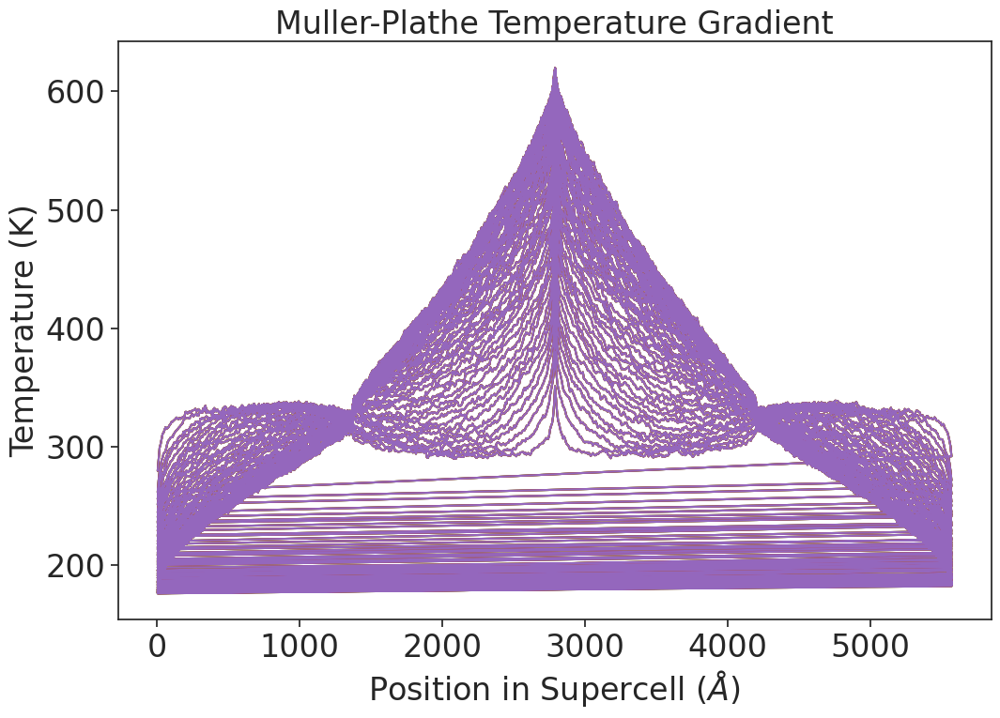

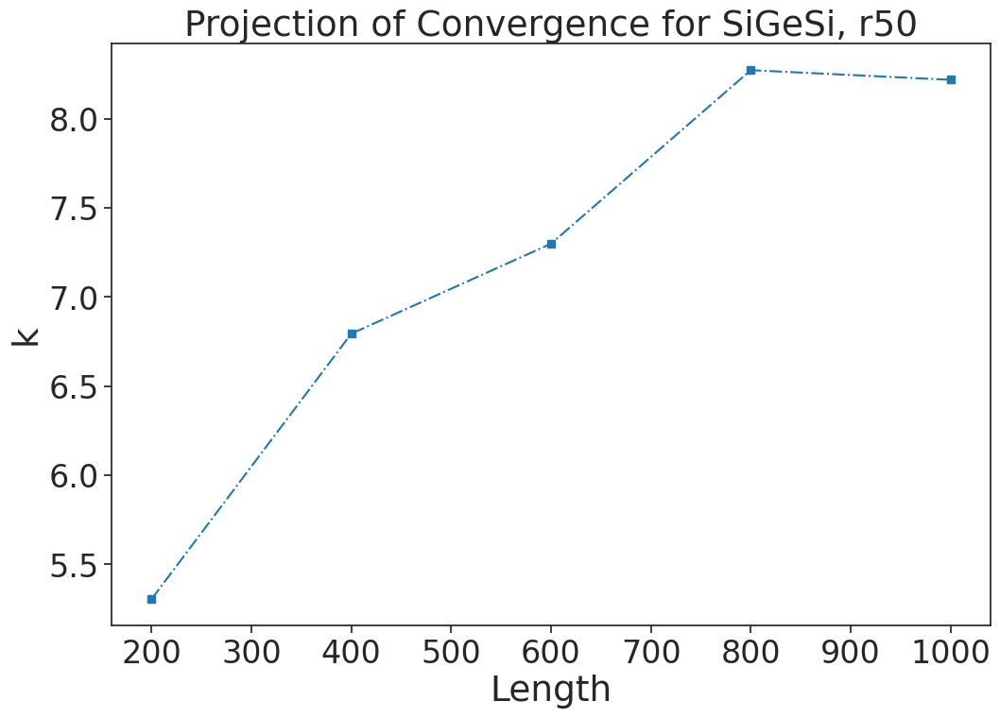

[3.6535595e-03 4.9860079e+00] 
 [-4.6766375e-06  9.2655245e-03  3.6765494e+00] 
 [-4.55343750e-10 -3.85701875e-06  8.83568000e-03  3.73774760e+00]
[-1.000000e-03  1.999994e+02  3.999998e+02  6.000002e+02  8.000006e+02
  1.000001e+03]
Intercept of cubic polyfit: [-4.55343750e-10 -3.85701875e-06  8.83568000e-03  3.73774760e+00]
Intercept of linear polyfit: [3.6535595e-03 4.9860079e+00]
Standard error of size 200: 0.04842898978433529
Standard error of size 400: 0.030800824645007326
Standard error of size 600: 0.01585958061886429
Standard error of size 800: 0.024782866529242623
Standard error of size 1000: 0.02906451914760066


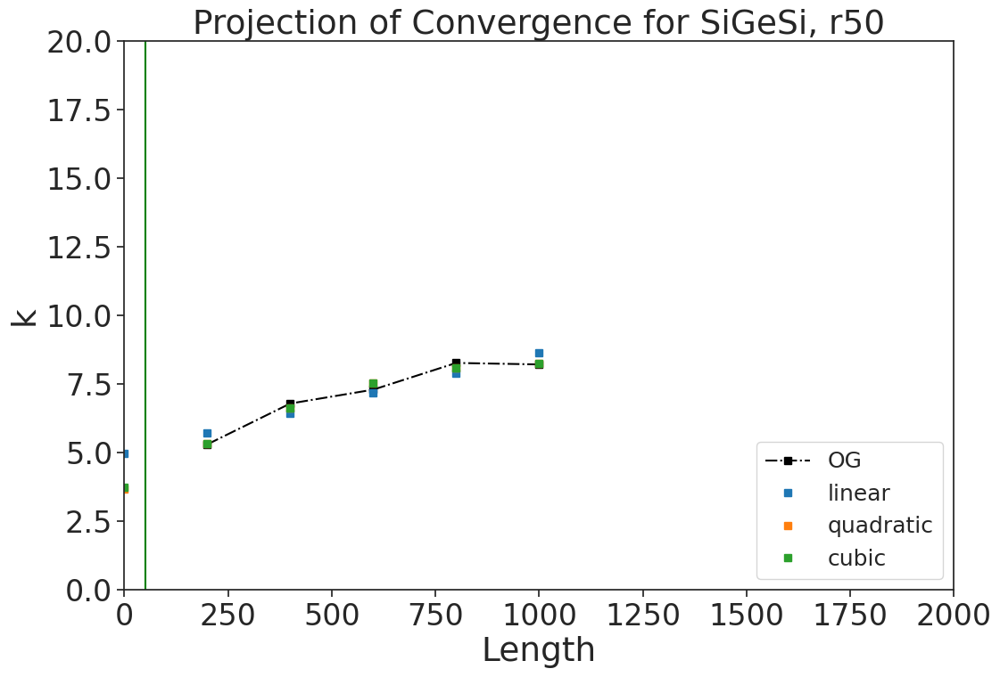

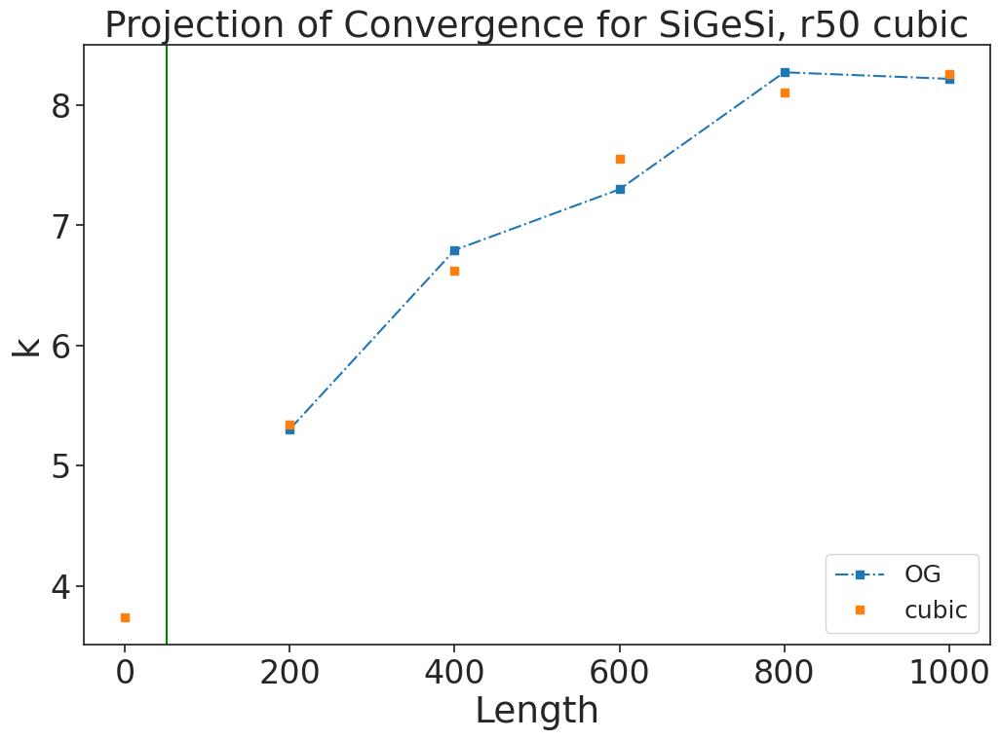

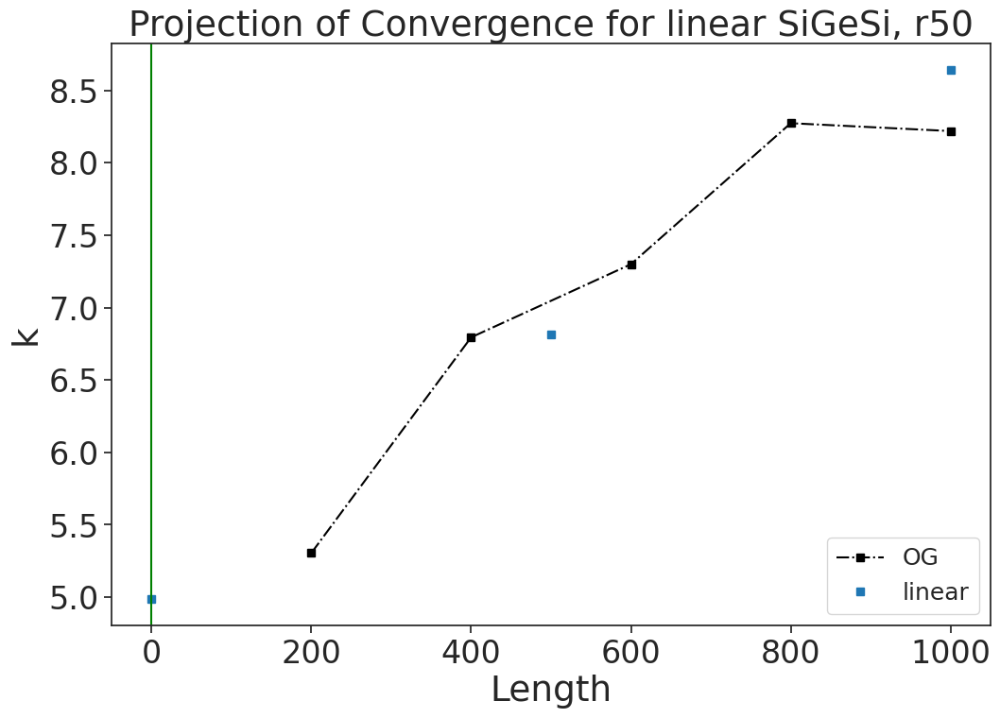

In [13]:
# load profile data 

filename = ['./profile_siE200r50', 'profile_siE400r50', 'profile_siE600r50',
           'profile_siE800r50', 'profile_siE1000r50']

#print(np.shape(filename))



MP_Profile = []; MP_Ave = []; MP_LastN = []; 

for simNo in range(0,len(filename)):
    subprocess.call(r"perl -p -e 's/^[\ \t]+|[\ \t]+$//g' %s > %s_new" % (filename[simNo], filename[simNo]), shell=True) # remove trailling white spaces
    subprocess.call("mv %s_new %s" % (filename[simNo], filename[simNo]), shell=True)
    subprocess.call("tr -s ' ' < %s > %s_tmp " % (filename[simNo], filename[simNo]), shell=True) #squeeze spaces
    subprocess.call("mv %s_tmp %s" % (filename[simNo], filename[simNo]), shell=True)

    profile = []; N = 800;
    with open(filename[simNo], 'r') as f:
        while True:
            lines = list(itertools.islice(f, 1, N+1))
            for line in lines:
                profile.append(line.split(' '))
            if not lines: 
                break
                
    lastN = profile[-N:] 
    lastAve = profile[-3200:]
    #print(lastAve)

    MP_Profile.append(profile)
    MP_LastN.append(lastN)
    MP_Ave.append(lastAve)
    
MP_Profile = np.array(MP_Profile, dtype=float) # for plotting 3D graphs
#print(MP_Profile)

MP_LastN = np.array(MP_LastN, dtype=float) # for calculating the thermal conductivity
#print(MP_LastN)



MP_Ave = np.array(MP_Ave, dtype=float) # for averaging the data to calculate the thermal conductivity
print(np.shape(MP_Profile))
#print(np.shape(MP_LastN))
print(np.shape(MP_Ave))

Thermo_Data = np.array([np.loadtxt('./Thermo_siE200r50'), np.loadtxt('./Thermo_siE400r50'), np.loadtxt('./Thermo_siE600r50'),
                       np.loadtxt('./Thermo_siE800r50'), np.loadtxt('./Thermo_siE1000r50')], dtype = object)

labels = ['siE200', 'siE400', 'siE600', 'siE800', 'siE1000','siE1500','siE2000'] 


print(np.shape(Thermo_Data))

Sim_no_dataset = [1,1,1,1,1,1,1,1,1]
Time_no_dataset = [6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000]
Interval_no_dataset = [0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3]
mxc_no_dataset = [10,10,10,10,10,10,10,10,10]

for simNo in range(0, len(MP_Profile)):
    Coordinates = MP_Profile[simNo,:,1]*(Thermo_Data[simNo,-1,9])
    #print(Coordinates)
    Temperature = MP_Profile[simNo,:,3]
    #print(Temperature)

fig = plt.figure(figsize=(12,8))
for k in range(0, len(MP_Profile)):
    plt.plot(Coordinates[:], Temperature[:], color=colors[k], label=labels[k])
    
plt.xlabel(r'Position in Supercell ($\AA$)')
plt.ylabel('Temperature (K)')
plt.title('Muller-Plathe Temperature Gradient', fontsize = 24)
#plt.savefig('MullerPlathe_PristineSi200.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
#plt.show

# Load the data that will be averaged to calculate the slopes 

Temperature = []; Coordinate = []; dX_Thermo = [];

for simNo in range(0, len(filename)):
    
    dX_ = Thermo_Data[simNo,-1,9]
    dX_Thermo.append(dX_)
    
    for i in range(0,800):
        Temperature_ = np.mean([MP_Ave[simNo,i,3],MP_Ave[simNo,i+800,3],MP_Ave[simNo,i+1600,3],MP_Ave[simNo,i+2400,3]])   
        Temperature.append(Temperature_)
        Coordinate_ = np.mean([MP_Ave[simNo,i,1],MP_Ave[simNo,i+800,1],MP_Ave[simNo,i+1600,1],MP_Ave[simNo,i+2400,1]])*dX_
        Coordinate.append(Coordinate_)
    
Temperature = np.array([Temperature[0:800],Temperature[800:1600],Temperature[1600:2400],
                       Temperature[2400:3200],Temperature[3200:4000]], dtype=float)#, 
                       #Temperature[4000:4800],Temperature[4800:5600]], dtype=float)
Coordinate = np.array([Coordinate[0:800],Coordinate[800:1600], Coordinate[1600:2400],
                      Coordinate[2400:3200],Coordinate[3200:4000],], dtype=float)#, 
                      #Coordinate[4000:4800],Coordinate[4800:5600]], dtype=float)


print(np.shape(Coordinate))
print(np.shape(Temperature))

#print(dX_Thermo)

excluded_points1 = 230 # excluded points from the beginning
excluded_points2 = 40 # excluded points from the end
excluded_points3 = 20
excluded_points4 = 230 # from the end of the mp.data file

slope2_mean = []; slope2 = []; slope1_mean = []; slope1 = []; average_temp_Si50 = [];
# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff

for simNo in range(0,len(filename)):
    
    dTemp = Temperature[simNo,:]
    X = dX_
    dX = Coordinate[simNo,:] #*X # normalized distance
    
    #T_fit_left = np.polyfit(dX[280:380], dTemp[280:380], 1)
    #T_fit_right = -np.polyfit(dX[360:-280], dTemp[360:-280], 1)
    
    T_fit_left = np.polyfit(dX[excluded_points1:400-excluded_points2], dTemp[excluded_points1:400-excluded_points2], 1)
    T_fit_right = -np.polyfit(dX[400+excluded_points2:-excluded_points1], dTemp[400+excluded_points2:-excluded_points1], 1)
    
    slope2.append([T_fit_left[0], T_fit_right[0]])
    #print(slope2)
    print('Top Slope', labels[simNo], ' = ', T_fit_left[0], T_fit_right[0])

    mean_slope = np.mean([abs(T_fit_left[0]), abs(T_fit_right[0])], axis = 0)
    slope2_mean.append(mean_slope)
    print('Top Slope Mean', labels[simNo], ' = ', slope2_mean[0])
    
    B_fit_left2 = np.polyfit(dX[excluded_points3:400-excluded_points4], dTemp[excluded_points3:400-excluded_points4], 1)
    B_fit_right2 = -np.polyfit(dX[400+excluded_points4:-excluded_points3], dTemp[400+excluded_points4:-excluded_points3], 1)
    
    slope1.append([B_fit_left2[0], B_fit_right2[0]])
    print('Bottom Slope', labels[simNo], ' = ', B_fit_left2[0], B_fit_right2[0])
    
    mean_slope = np.mean([abs(B_fit_left2[0]), abs(B_fit_right2[0])], axis = 0)
    slope1_mean.append(mean_slope)
    print('Bottom Slope Mean', labels[simNo], ' = ', slope1_mean[0])
    

    average_temp = np.mean(dTemp)
    average_temp_Si50.append(average_temp)

Slope1 = np.array(slope1)
Slope_mean1 = np.array(slope1_mean)
#print(Slope_mean1)

Slope2 = np.array(slope2)
Slope_mean2 = np.array(slope2_mean)
#print(Slope_mean2)

Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0)]) #individual
#Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0), np.mean([Slope_mean1[1], Slope_mean2[1]], axis =0), np.mean([Slope_mean1[2], Slope_mean2[2]], axis=0)])
print('Slope Mean', labels[simNo], ' = ', Slope_mean[0])

Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0]]) #individual
#Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0], Slope_mean[1]*dX_Thermo[1], Slope_mean[2]*dX_Thermo[2]])
print('Slope Average', labels[simNo], ' = ', Slope_ave[0])

# Calculate the heat flux and the thermal conductivity
eV2J  = 1.6e-19;
Ang2m =   1e-10;
ps2s  =   1e-12;
conversion = (eV2J/(Ang2m*ps2s))

s_values = []
ThermalsSi50 = []
dt = 0.0005 # picoseconds

# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff
for simNo in range(0, len(Thermo_Data)):
    
    Steps = Thermo_Data[simNo,-1,0]
    Time = Steps*dt # picoseconds
    
    dx = Thermo_Data[simNo,-1,9]
    dy = Thermo_Data[simNo,-1,10]
    dz = Thermo_Data[simNo,-1,11]
    Area = dy*dz
    
    #DeltaE = Thermo_Data[simNo,-1,-2] # E_pair
    #TotalE = Thermo_Data[simNo,-1,-5] # Total energy
    KinE = Thermo_Data[simNo,-1,12] # in log_lammps, f_3 
    
    Thermal_left2 = ((KinE)/(2*Time*Area*Slope2[simNo,0]))*conversion #top left
    Thermal_right2 = ((KinE)/(2*Time*Area*Slope2[simNo,1]))*conversion #top right
    
    Thermal_left1 = ((KinE)/(2*Time*Area*Slope1[simNo,0]))*conversion #bottom left
    Thermal_right1 = ((KinE)/(2*Time*Area*Slope1[simNo,1]))*conversion #bottom right
    
    thermal2 = np.concatenate((Thermal_left1, Thermal_left2), axis = None)
    thermal1 = np.concatenate((Thermal_right1, Thermal_right2), axis = None)
    
    thermal2_ave = ((KinE)/(2*Time*Area*Slope_mean2[simNo]))*conversion #top
    thermal1_ave = ((KinE)/(2*Time*Area*Slope_mean1[simNo]))*conversion #bottom
    
    #thermal_ave = ((KinE)/(2*Time*Area*Slope_ave[simNo]))*conversion
    thermal_ave = (thermal2_ave+thermal1_ave)/2
   
    getcontext().prec = 10
    std_top = Decimal(np.std([Thermal_left2, Thermal_right2], dtype=np.float64))
    SE_left = std_top/Decimal(math.sqrt(2))
   
    std_bottom = Decimal(np.std([Thermal_left1, Thermal_right1], dtype=np.float64))
    SE_right = std_bottom/Decimal(math.sqrt(2))
    
    SE = math.sqrt(((SE_left/2)**2) + ((SE_right/2)**2))
    print(SE)
   
    #print('Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2[0], thermal2[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2_ave)
    
    #print('Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1[0], thermal1[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1_ave)
    
    print('Average Thermal Conductivity of', labels[simNo], 'Average = ', thermal_ave) 
    
    Therm_val = [Thermal_left1,Thermal_left2,Thermal_right2,Thermal_right1]
    Ttherm = ['%.6f' % elem for elem in Therm_val]
    #print(Ttherm)
    ThermalsSi50.append(Ttherm)
    print('ThermalsSi50', labels[simNo], ' = ', Ttherm)
    
    
    TC_values = [thermal2_ave, thermal1_ave, thermal_ave, SE]
    val = ['%.6f' % elem for elem in TC_values]
    #print(val)
    s_values.append(val)
    print('s values', labels[simNo], ' = ', val)
    #print(simNo)
    



#print(s_values)
#print(s_values[0]) #200
#print(s_values[1]) #400
#print(s_values[2]) #600
#print(s_values[3]) #800
#print(s_values[4]) #1000
#print(s_values[5]) #1500
#print(s_values[0][0])
therm_averageSi50 = []
for item in s_values:
    print(item[2])
    therm_averageSi50.append(item[2])

therm_averageSi50 = []
for item in s_values:
    print(float(item[2]))
    therm_averageSi50.append(np.array(float(item[2])))

#projection stuff

print(s_values)



#SIGESI r50
sizeSi50 = [200.0,400.0,600.0,800.0,1000.0]#,1500.0,2000.0]
sizeSi50 = np.array(sizeSi50)
#print(np.shape(sizeSi50))
print(sizeSi50)
Tc = [float(s_values[0][2]),float(s_values[1][2]),float(s_values[2][2]),
      float(s_values[3][2]),float(s_values[4][2])]
      #,float(s_values[5][2]),float(s_values[6][2])]
Tc = np.array(Tc)
print(Tc)

inv_sizeSi50 = np.reciprocal(sizeSi50)
#np.set_printoptions(precision=10)
print(inv_sizeSi50)

inv_Tc = np.reciprocal(Tc)
print(inv_Tc)

#plot

fig = plt.figure(figsize=(12,8))

plt.plot(sizeSi50[:], Tc[:],'s-.')


plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r50', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r50.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show()



fig = plt.figure(figsize=(12,8))

x1 = np.array(sizeSi50)
mn = min(x1)
mx = max(x1)
#print(x1)
#print(len(x))

y1 = np.array(Tc)
#print(y1)

z1 = np.polyfit(x1, y1, 1) #np.polyfit(x, y, degree of polynomial), degree =1,2,3 is linear, quadratic, cubic
z2 = np.polyfit(x1, y1, 2)
z3 = np.polyfit(x1, y1, 3)

print(z1,'\n',z2,'\n',z3)
#xp = np.linspace(mn, mx, 6)
xp = np.linspace(-0.001, mx+0.001, 6)
print(xp)

p1 = np.poly1d(z1)
p2 = np.poly1d(z2)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

plt.plot(x1, y1, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')
plt.plot(xp, p2(xp), 's', label = 'quadratic')
plt.plot(xp, p3(xp), 's', label ='cubic') 

plt.axvline(x=50.0, color='green')

plt.legend(loc="lower right")

plt.xlim([0.0,2000])
plt.ylim([0.0,20])

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r50', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r50-lqc-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


fig = plt.figure(figsize=(12,8))

x_2 = np.array(sizeSi50)
mn = min(x_2)
mx = max(x_2)
#print(mn)
#print(len(x_2))

y_2 = np.array(Tc)
#print(y)

#xpp = np.linspace(-0.00005,mx, 6)
xpp = np.linspace(-0.0005,mx, 6)

plt.axvline(x=50.0, color='green')


z3 = np.polyfit(x_2, y_2, 3)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

##m, c; run by Laura
s = p3(1);
i = p3(2)    #The polyfit function for a linear (polynomial order 1) fit returns the slope as the first parameter
                    #and the intercept as the second parameter, so the output vector is [slope, intercept]. 
                    #It is like any other vector, so choose the one you want by indexing into it.
n = p3(0)
#print(s)
#print(i)
#print(n)

#slope_intercept = np.polyfit(x_2,y_2,1)
#print('Intercept of linear polyfit:',slope_intercept)
#slope_intercept = np.polyfit(x_2,y_2,2)
#print('Intercept of quad. polyfit:',slope_intercept)
slope_intercept = np.polyfit(x_2,y_2,3)
print('Intercept of cubic polyfit:',slope_intercept)
##

plt.plot(x_2,y_2, 's-.', label ='OG')
plt.plot(xpp, p3(xp), 's', label ='cubic') 
plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
#plt.ylim(-0.0002, 0.18)
plt.title(r'Projection of Convergence for SiGeSi, r50 cubic', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r50-c-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)



plt.show


#linear fit in linear region alone
fig = plt.figure(figsize=(12,8))

#x2 = [0.005,0.0025,0.00166667]
x2 = sizeSi50
x2 = np.array(x2)
y2 = Tc
#y2 = [0.16806723,0.13947001,0.11160714]
y2 = np.array(y2)


z = np.polyfit(x2, y2, 1) 
xp = np.linspace(-0.001, mx+0.001, 3)

p1 = np.poly1d(z)

slope_intercept = np.polyfit(x2,y2,1)
print('Intercept of linear polyfit:',slope_intercept)


plt.plot(x2, y2, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')

plt.axvline(x=0, color='green')

plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for linear SiGeSi, r50', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-linear-GeSiGe-r50-l-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


#SiGeSi values

SE200b_left = np.std([float(ThermalsSi50[0][1]), float(ThermalsSi50[0][2])], dtype=np.float64)
SE200_left = SE200b_left/math.sqrt(2)
SE200b_right = np.std([float(ThermalsSi50[0][0]), float(ThermalsSi50[0][3])], dtype=np.float64)
SE200_right = SE200b_right/math.sqrt(2)
standard_error200b50 = math.sqrt(((SE200_left/2)**2) + ((SE200_right/2)**2))
print('Standard error of size 200:',standard_error200b50)

SE400b_left = np.std([float(ThermalsSi50[1][1]), float(ThermalsSi50[1][2])], dtype=np.float64)
SE400_left = SE400b_left/math.sqrt(2)
SE400b_right = np.std([float(ThermalsSi50[1][0]), float(ThermalsSi50[1][3])], dtype=np.float64)
SE400_right = SE400b_right/math.sqrt(2)
standard_error400b50 = math.sqrt(((SE400_left/2)**2) + ((SE400_right/2)**2))
print('Standard error of size 400:',standard_error400b50)

SE600b_left = np.std([float(ThermalsSi50[2][1]), float(ThermalsSi50[2][2])], dtype=np.float64)
SE600_left = SE600b_left/math.sqrt(2)
SE600b_right = np.std([float(ThermalsSi50[2][0]), float(ThermalsSi50[2][3])], dtype=np.float64)
SE600_right = SE600b_right/math.sqrt(2)
standard_error600b50 = math.sqrt(((SE600_left/2)**2) + ((SE600_right/2)**2))
print('Standard error of size 600:',standard_error600b50)


SE800b_left = np.std([float(ThermalsSi50[3][1]), float(ThermalsSi50[3][2])], dtype=np.float64)
SE800_left = SE800b_left/math.sqrt(2)
SE800b_right = np.std([float(ThermalsSi50[3][0]), float(ThermalsSi50[3][3])], dtype=np.float64)
SE800_right = SE800b_right/math.sqrt(2)
standard_error800b50 = math.sqrt(((SE800_left/2)**2) + ((SE800_right/2)**2))
print('Standard error of size 800:',standard_error800b50)

SE1000b_left = np.std([float(ThermalsSi50[4][1]), float(ThermalsSi50[4][2])], dtype=np.float64)
SE1000_left = SE1000b_left/math.sqrt(2)
SE1000b_right = np.std([float(ThermalsSi50[4][0]), float(ThermalsSi50[4][3])], dtype=np.float64)
SE1000_right = SE1000b_right/math.sqrt(2)
standard_error1000b50 = math.sqrt(((SE1000_left/2)**2) + ((SE1000_right/2)**2))
print('Standard error of size 1000:',standard_error1000b50)

'''
SE1500b_left = np.std([float(ThermalsSi50[5][1]), float(ThermalsSi50[5][2])], dtype=np.float64)
SE1500_left = SE1500b_left/math.sqrt(2)
SE1500b_right = np.std([float(ThermalsSi50[5][0]), float(ThermalsSi50[5][3])], dtype=np.float64)
SE1500_right = SE1500b_right/math.sqrt(2)
standard_error1500b50 = math.sqrt(((SE1500_left/2)**2) + ((SE1500_right/2)**2))
print('Standard error of size 1500:',standard_error1500b50)

SE2000b_left = np.std([float(ThermalsSi50[6][1]), float(ThermalsSi50[6][2])], dtype=np.float64)
SE2000_left = SE2000b_left/math.sqrt(2)
SE2000b_right = np.std([float(ThermalsSi50[6][0]), float(ThermalsSi50[6][3])], dtype=np.float64)
SE2000_right = SE2000b_right/math.sqrt(2)
standard_error2000b50 = math.sqrt(((SE2000_left/2)**2) + ((SE2000_right/2)**2))
print('Standard error of size 2000:',standard_error2000b50)

yerrSi1500b50 = standard_error1500b50
yerrSi2000b50 = standard_error2000b50

#projection of convergence for SiGeSi
#https://math.stackexchange.com/questions/3217622/how-does-inverting-data-change-standaro-deviation
'''
yerrSi200b50 = standard_error200b50
yerrSi400b50 = standard_error400b50
yerrSi600b50 = standard_error600b50
yerrSi800b50 = standard_error800b50
yerrSi1000b50 = standard_error1000b50



In [14]:
#125

(5, 48000, 4)
(5, 3200, 4)
(5, 61, 14)
(5, 800)
(5, 800)
Top Slope siE200  =  0.2927811748138202 0.3168803456365379
Top Slope Mean siE200  =  0.3048307602251791
Bottom Slope siE200  =  0.17258865006618662 0.18079301047869384
Bottom Slope Mean siE200  =  0.17669083027244023
Top Slope siE400  =  0.24940948487274173 0.24638037638002458
Top Slope Mean siE400  =  0.3048307602251791
Bottom Slope siE400  =  0.13655940484423992 0.12753803546943382
Bottom Slope Mean siE400  =  0.17669083027244023
Top Slope siE600  =  0.21079185391149888 0.22045523344715554
Top Slope Mean siE600  =  0.3048307602251791
Bottom Slope siE600  =  0.1093361886169229 0.10920415224151435
Bottom Slope Mean siE600  =  0.17669083027244023
Top Slope siE800  =  0.2016532260217527 0.20055723302287454
Top Slope Mean siE800  =  0.3048307602251791
Bottom Slope siE800  =  0.0912527075724227 0.09427860806812569
Bottom Slope Mean siE800  =  0.17669083027244023
Top Slope siE1000  =  0.1761380045779614 0.1779709451145343
Top Slope Me

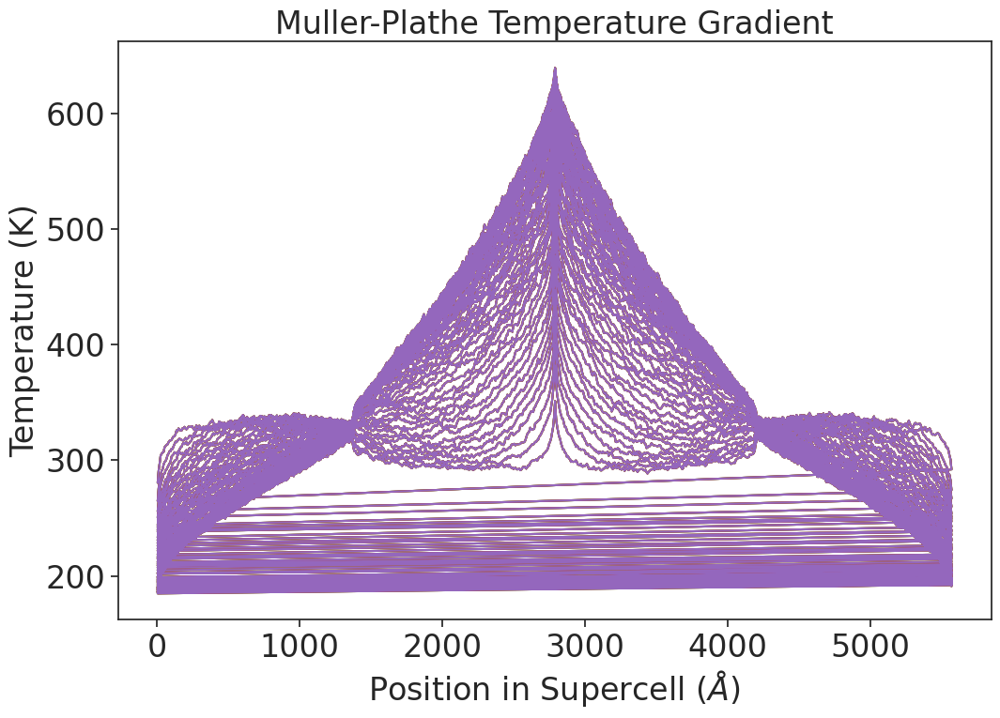

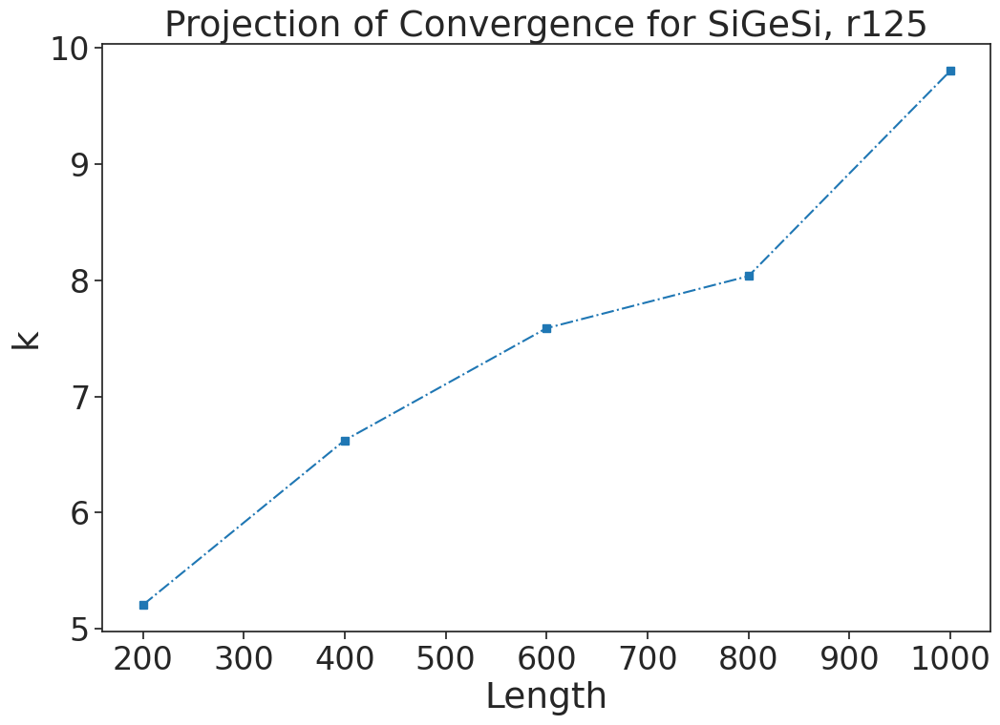

[0.00530286 4.2685704 ] 
 [3.22957143e-07 4.91531543e-03 4.35899840e+00] 
 [ 1.84519687e-08 -3.28905866e-05  2.23339739e-02  1.87905380e+00]
[-1.000000e-03  1.999994e+02  3.999998e+02  6.000002e+02  8.000006e+02
  1.000001e+03]
Intercept of cubic polyfit: [ 1.84519687e-08 -3.28905866e-05  2.23339739e-02  1.87905380e+00]
Intercept of linear polyfit: [0.00530286 4.2685704 ]
Standard error of size 200: 0.07607978461724411
Standard error of size 400: 0.10496179184142425
Standard error of size 600: 0.040510205940139245
Standard error of size 800: 0.06361847727002158
Standard error of size 1000: 0.023880107428176648


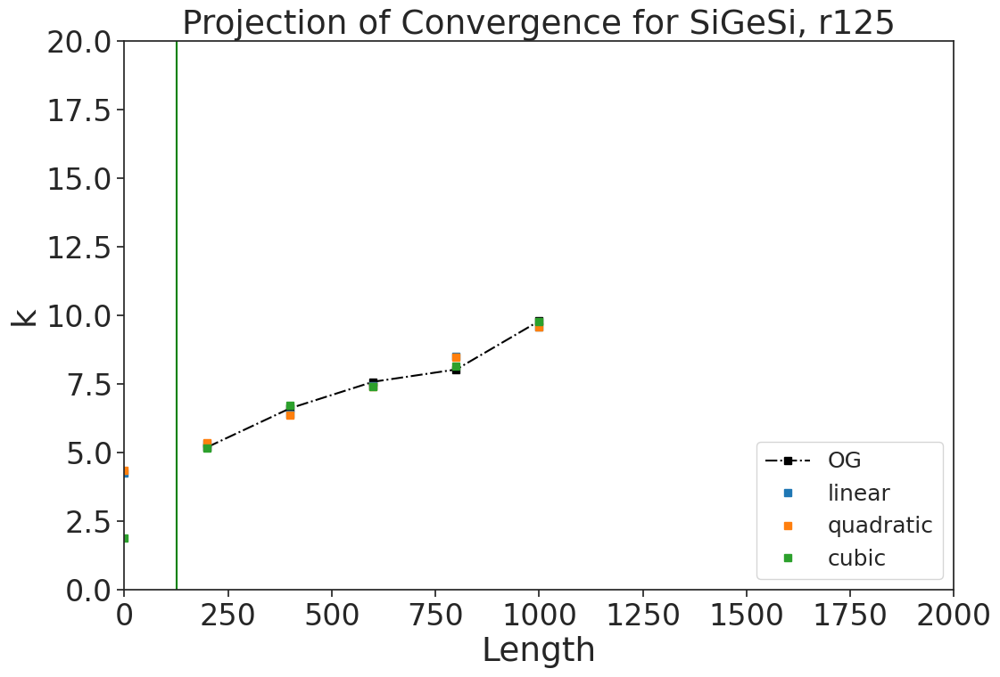

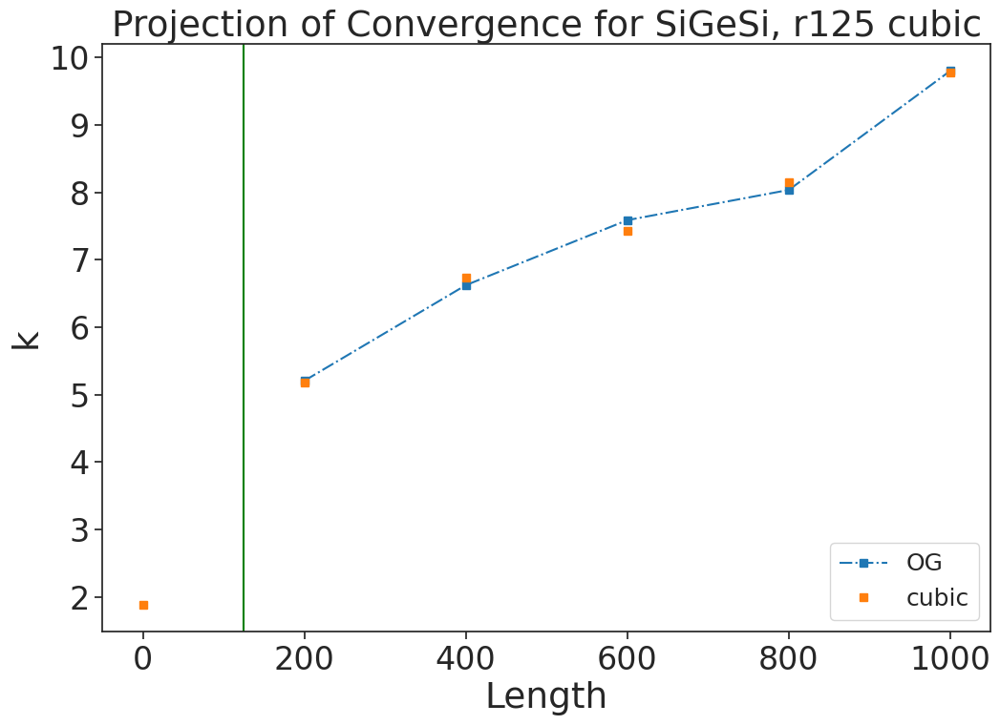

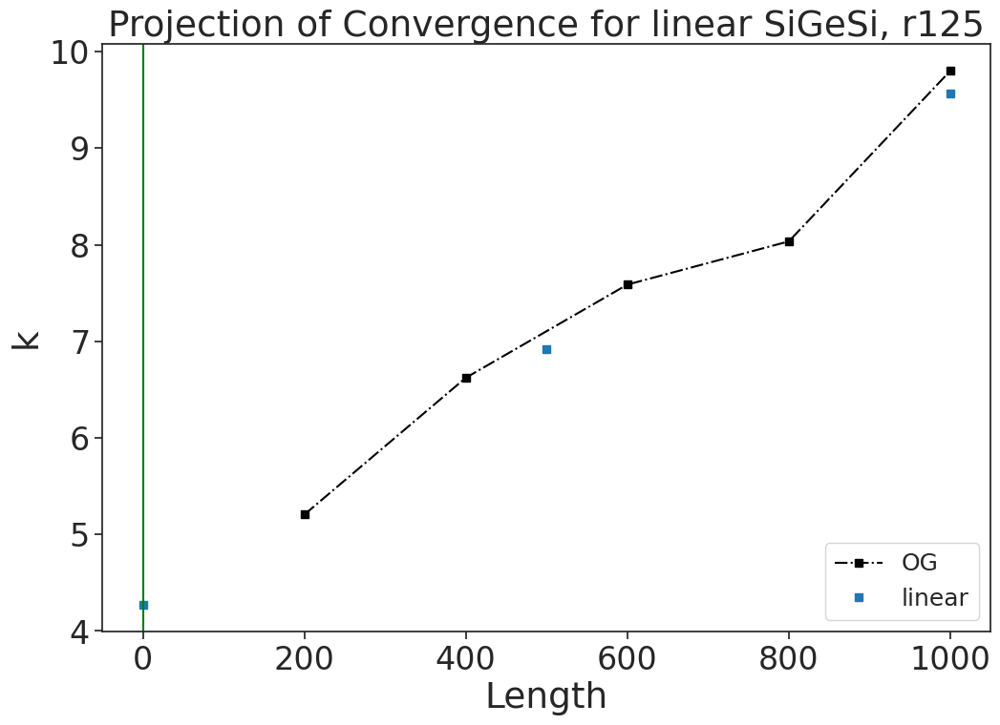

In [15]:
# load profile data 

filename = ['./profile_siE200r125', 'profile_siE400r125', 'profile_siE600r125',
           'profile_siE800r125', 'profile_siE1000r125']

#print(np.shape(filename))



MP_Profile = []; MP_Ave = []; MP_LastN = []; 

for simNo in range(0,len(filename)):
    subprocess.call(r"perl -p -e 's/^[\ \t]+|[\ \t]+$//g' %s > %s_new" % (filename[simNo], filename[simNo]), shell=True) # remove trailling white spaces
    subprocess.call("mv %s_new %s" % (filename[simNo], filename[simNo]), shell=True)
    subprocess.call("tr -s ' ' < %s > %s_tmp " % (filename[simNo], filename[simNo]), shell=True) #squeeze spaces
    subprocess.call("mv %s_tmp %s" % (filename[simNo], filename[simNo]), shell=True)

    profile = []; N = 800;
    with open(filename[simNo], 'r') as f:
        while True:
            lines = list(itertools.islice(f, 1, N+1))
            for line in lines:
                profile.append(line.split(' '))
            if not lines: 
                break
                
    lastN = profile[-N:] 
    lastAve = profile[-3200:]
    #print(lastAve)

    MP_Profile.append(profile)
    MP_LastN.append(lastN)
    MP_Ave.append(lastAve)
    
MP_Profile = np.array(MP_Profile, dtype=float) # for plotting 3D graphs
#print(MP_Profile)

MP_LastN = np.array(MP_LastN, dtype=float) # for calculating the thermal conductivity
#print(MP_LastN)



MP_Ave = np.array(MP_Ave, dtype=float) # for averaging the data to calculate the thermal conductivity
print(np.shape(MP_Profile))
#print(np.shape(MP_LastN))
print(np.shape(MP_Ave))

Thermo_Data = np.array([np.loadtxt('./Thermo_siE200r125'), np.loadtxt('./Thermo_siE400r125'), np.loadtxt('./Thermo_siE600r125'),
                       np.loadtxt('./Thermo_siE800r125'), np.loadtxt('./Thermo_siE1000r125')], dtype = object)

labels = ['siE200', 'siE400', 'siE600', 'siE800', 'siE1000','siE1500','siE2000'] 


print(np.shape(Thermo_Data))

Sim_no_dataset = [1,1,1,1,1,1,1,1,1]
Time_no_dataset = [6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000]
Interval_no_dataset = [0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3]
mxc_no_dataset = [10,10,10,10,10,10,10,10,10]

for simNo in range(0, len(MP_Profile)):
    Coordinates = MP_Profile[simNo,:,1]*(Thermo_Data[simNo,-1,9])
    #print(Coordinates)
    Temperature = MP_Profile[simNo,:,3]
    #print(Temperature)

fig = plt.figure(figsize=(12,8))
for k in range(0, len(MP_Profile)):
    plt.plot(Coordinates[:], Temperature[:], color=colors[k], label=labels[k])
    
plt.xlabel(r'Position in Supercell ($\AA$)')
plt.ylabel('Temperature (K)')
plt.title('Muller-Plathe Temperature Gradient', fontsize = 24)
#plt.savefig('MullerPlathe_PristineSi200.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
#plt.show

# Load the data that will be averaged to calculate the slopes 

Temperature = []; Coordinate = []; dX_Thermo = [];

for simNo in range(0, len(filename)):
    
    dX_ = Thermo_Data[simNo,-1,9]
    dX_Thermo.append(dX_)
    
    for i in range(0,800):
        Temperature_ = np.mean([MP_Ave[simNo,i,3],MP_Ave[simNo,i+800,3],MP_Ave[simNo,i+1600,3],MP_Ave[simNo,i+2400,3]])   
        Temperature.append(Temperature_)
        Coordinate_ = np.mean([MP_Ave[simNo,i,1],MP_Ave[simNo,i+800,1],MP_Ave[simNo,i+1600,1],MP_Ave[simNo,i+2400,1]])*dX_
        Coordinate.append(Coordinate_)
    
Temperature = np.array([Temperature[0:800],Temperature[800:1600],Temperature[1600:2400],
                       Temperature[2400:3200],Temperature[3200:4000]], dtype=float)#, 
                       #Temperature[4000:4800],Temperature[4800:5600]], dtype=float)
Coordinate = np.array([Coordinate[0:800],Coordinate[800:1600], Coordinate[1600:2400],
                      Coordinate[2400:3200],Coordinate[3200:4000],], dtype=float)#, 
                      #Coordinate[4000:4800],Coordinate[4800:5600]], dtype=float)


print(np.shape(Coordinate))
print(np.shape(Temperature))

#print(dX_Thermo)

excluded_points1 = 230 # excluded points from the beginning
excluded_points2 = 40 # excluded points from the end
excluded_points3 = 20
excluded_points4 = 230 # from the end of the mp.data file

slope2_mean = []; slope2 = []; slope1_mean = []; slope1 = []; average_temp_Si125 = [];
# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff

for simNo in range(0,len(filename)):
    
    dTemp = Temperature[simNo,:]
    X = dX_
    dX = Coordinate[simNo,:] #*X # normalized distance
    
    #T_fit_left = np.polyfit(dX[280:380], dTemp[280:380], 1)
    #T_fit_right = -np.polyfit(dX[360:-280], dTemp[360:-280], 1)
    
    T_fit_left = np.polyfit(dX[excluded_points1:400-excluded_points2], dTemp[excluded_points1:400-excluded_points2], 1)
    T_fit_right = -np.polyfit(dX[400+excluded_points2:-excluded_points1], dTemp[400+excluded_points2:-excluded_points1], 1)
    
    slope2.append([T_fit_left[0], T_fit_right[0]])
    #print(slope2)
    print('Top Slope', labels[simNo], ' = ', T_fit_left[0], T_fit_right[0])

    mean_slope = np.mean([abs(T_fit_left[0]), abs(T_fit_right[0])], axis = 0)
    slope2_mean.append(mean_slope)
    print('Top Slope Mean', labels[simNo], ' = ', slope2_mean[0])
    
    B_fit_left2 = np.polyfit(dX[excluded_points3:400-excluded_points4], dTemp[excluded_points3:400-excluded_points4], 1)
    B_fit_right2 = -np.polyfit(dX[400+excluded_points4:-excluded_points3], dTemp[400+excluded_points4:-excluded_points3], 1)
    
    slope1.append([B_fit_left2[0], B_fit_right2[0]])
    print('Bottom Slope', labels[simNo], ' = ', B_fit_left2[0], B_fit_right2[0])
    
    mean_slope = np.mean([abs(B_fit_left2[0]), abs(B_fit_right2[0])], axis = 0)
    slope1_mean.append(mean_slope)
    print('Bottom Slope Mean', labels[simNo], ' = ', slope1_mean[0])
    

    average_temp = np.mean(dTemp)
    average_temp_Si125.append(average_temp)

Slope1 = np.array(slope1)
Slope_mean1 = np.array(slope1_mean)
#print(Slope_mean1)

Slope2 = np.array(slope2)
Slope_mean2 = np.array(slope2_mean)
#print(Slope_mean2)

Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0)]) #individual
#Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0), np.mean([Slope_mean1[1], Slope_mean2[1]], axis =0), np.mean([Slope_mean1[2], Slope_mean2[2]], axis=0)])
print('Slope Mean', labels[simNo], ' = ', Slope_mean[0])

Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0]]) #individual
#Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0], Slope_mean[1]*dX_Thermo[1], Slope_mean[2]*dX_Thermo[2]])
print('Slope Average', labels[simNo], ' = ', Slope_ave[0])

# Calculate the heat flux and the thermal conductivity
eV2J  = 1.6e-19;
Ang2m =   1e-10;
ps2s  =   1e-12;
conversion = (eV2J/(Ang2m*ps2s))

s_values = []
ThermalsSi125 = []
dt = 0.0005 # picoseconds

# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff
for simNo in range(0, len(Thermo_Data)):
    
    Steps = Thermo_Data[simNo,-1,0]
    Time = Steps*dt # picoseconds
    
    dx = Thermo_Data[simNo,-1,9]
    dy = Thermo_Data[simNo,-1,10]
    dz = Thermo_Data[simNo,-1,11]
    Area = dy*dz
    
    #DeltaE = Thermo_Data[simNo,-1,-2] # E_pair
    #TotalE = Thermo_Data[simNo,-1,-5] # Total energy
    KinE = Thermo_Data[simNo,-1,12] # in log_lammps, f_3 
    
    Thermal_left2 = ((KinE)/(2*Time*Area*Slope2[simNo,0]))*conversion #top left
    Thermal_right2 = ((KinE)/(2*Time*Area*Slope2[simNo,1]))*conversion #top right
    
    Thermal_left1 = ((KinE)/(2*Time*Area*Slope1[simNo,0]))*conversion #bottom left
    Thermal_right1 = ((KinE)/(2*Time*Area*Slope1[simNo,1]))*conversion #bottom right
    
    thermal2 = np.concatenate((Thermal_left1, Thermal_left2), axis = None)
    thermal1 = np.concatenate((Thermal_right1, Thermal_right2), axis = None)
    
    thermal2_ave = ((KinE)/(2*Time*Area*Slope_mean2[simNo]))*conversion #top
    thermal1_ave = ((KinE)/(2*Time*Area*Slope_mean1[simNo]))*conversion #bottom
    
    #thermal_ave = ((KinE)/(2*Time*Area*Slope_ave[simNo]))*conversion
    thermal_ave = (thermal2_ave+thermal1_ave)/2
   
    getcontext().prec = 10
    std_top = Decimal(np.std([Thermal_left2, Thermal_right2], dtype=np.float64))
    SE_left = std_top/Decimal(math.sqrt(2))
   
    std_bottom = Decimal(np.std([Thermal_left1, Thermal_right1], dtype=np.float64))
    SE_right = std_bottom/Decimal(math.sqrt(2))
    
    SE = math.sqrt(((SE_left/2)**2) + ((SE_right/2)**2))
    print(SE)
   
    #print('Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2[0], thermal2[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2_ave)
    
    #print('Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1[0], thermal1[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1_ave)
    
    print('Average Thermal Conductivity of', labels[simNo], 'Average = ', thermal_ave) 
    
    Therm_val = [Thermal_left1,Thermal_left2,Thermal_right2,Thermal_right1]
    Ttherm = ['%.6f' % elem for elem in Therm_val]
    #print(Ttherm)
    ThermalsSi125.append(Ttherm)
    print('ThermalsSi125', labels[simNo], ' = ', Ttherm)
    
    
    TC_values = [thermal2_ave, thermal1_ave, thermal_ave, SE]
    val = ['%.6f' % elem for elem in TC_values]
    #print(val)
    s_values.append(val)
    print('s values', labels[simNo], ' = ', val)
    #print(simNo)
    



#print(s_values)
#print(s_values[0]) #200
#print(s_values[1]) #400
#print(s_values[2]) #600
#print(s_values[3]) #800
#print(s_values[4]) #1000
#print(s_values[5]) #1500
#print(s_values[0][0])
therm_averageSi125 = []
for item in s_values:
    print(item[2])
    therm_averageSi125.append(item[2])

therm_averageSi125 = []
for item in s_values:
    print(float(item[2]))
    therm_averageSi125.append(np.array(float(item[2])))

#projection stuff

print(s_values)



#SIGESI r125
sizeSi125 = [200.0,400.0,600.0,800.0,1000.0]#,1500.0,2000.0]
sizeSi125 = np.array(sizeSi125)
#print(np.shape(sizeSi125))
print(sizeSi125)
Tc = [float(s_values[0][2]),float(s_values[1][2]),float(s_values[2][2]),
      float(s_values[3][2]),float(s_values[4][2])]
      #,float(s_values[5][2]),float(s_values[6][2])]
Tc = np.array(Tc)
print(Tc)

inv_sizeSi125 = np.reciprocal(sizeSi125)
#np.set_printoptions(precision=10)
print(inv_sizeSi125)

inv_Tc = np.reciprocal(Tc)
print(inv_Tc)

#plot

fig = plt.figure(figsize=(12,8))

plt.plot(sizeSi125[:], Tc[:],'s-.')


plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r125', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r125.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show()



fig = plt.figure(figsize=(12,8))

x1 = np.array(sizeSi125)
mn = min(x1)
mx = max(x1)
#print(x1)
#print(len(x))

y1 = np.array(Tc)
#print(y1)

z1 = np.polyfit(x1, y1, 1) #np.polyfit(x, y, degree of polynomial), degree =1,2,3 is linear, quadratic, cubic
z2 = np.polyfit(x1, y1, 2)
z3 = np.polyfit(x1, y1, 3)

print(z1,'\n',z2,'\n',z3)
#xp = np.linspace(mn, mx, 6)
xp = np.linspace(-0.001, mx+0.001, 6)
print(xp)

p1 = np.poly1d(z1)
p2 = np.poly1d(z2)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

plt.plot(x1, y1, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')
plt.plot(xp, p2(xp), 's', label = 'quadratic')
plt.plot(xp, p3(xp), 's', label ='cubic') 

plt.axvline(x=125.0, color='green')

plt.legend(loc="lower right")

plt.xlim([0.0,2000])
plt.ylim([0.0,20])

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r125', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r125-lqc-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


fig = plt.figure(figsize=(12,8))

x_2 = np.array(sizeSi125)
mn = min(x_2)
mx = max(x_2)
#print(mn)
#print(len(x_2))

y_2 = np.array(Tc)
#print(y)

#xpp = np.linspace(-0.00005,mx, 6)
xpp = np.linspace(-0.0005,mx, 6)

plt.axvline(x=125.0, color='green')


z3 = np.polyfit(x_2, y_2, 3)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

##m, c; run by Laura
s = p3(1);
i = p3(2)    #The polyfit function for a linear (polynomial order 1) fit returns the slope as the first parameter
                    #and the intercept as the second parameter, so the output vector is [slope, intercept]. 
                    #It is like any other vector, so choose the one you want by indexing into it.
n = p3(0)
#print(s)
#print(i)
#print(n)

#slope_intercept = np.polyfit(x_2,y_2,1)
#print('Intercept of linear polyfit:',slope_intercept)
#slope_intercept = np.polyfit(x_2,y_2,2)
#print('Intercept of quad. polyfit:',slope_intercept)
slope_intercept = np.polyfit(x_2,y_2,3)
print('Intercept of cubic polyfit:',slope_intercept)
##

plt.plot(x_2,y_2, 's-.', label ='OG')
plt.plot(xpp, p3(xp), 's', label ='cubic') 
plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
#plt.ylim(-0.0002, 0.18)
plt.title(r'Projection of Convergence for SiGeSi, r125 cubic', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r125-c-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)



plt.show


#linear fit in linear region alone
fig = plt.figure(figsize=(12,8))

#x2 = [0.005,0.0025,0.00166667]
x2 = sizeSi125
x2 = np.array(x2)
y2 = Tc
#y2 = [0.16806723,0.13947001,0.11160714]
y2 = np.array(y2)


z = np.polyfit(x2, y2, 1) 
xp = np.linspace(-0.001, mx+0.001, 3)

p1 = np.poly1d(z)

slope_intercept = np.polyfit(x2,y2,1)
print('Intercept of linear polyfit:',slope_intercept)


plt.plot(x2, y2, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')

plt.axvline(x=0, color='green')

plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for linear SiGeSi, r125', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-linear-GeSiGe-r125-l-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


#SiGeSi values

SE200b_left = np.std([float(ThermalsSi125[0][1]), float(ThermalsSi125[0][2])], dtype=np.float64)
SE200_left = SE200b_left/math.sqrt(2)
SE200b_right = np.std([float(ThermalsSi125[0][0]), float(ThermalsSi125[0][3])], dtype=np.float64)
SE200_right = SE200b_right/math.sqrt(2)
standard_error200b125 = math.sqrt(((SE200_left/2)**2) + ((SE200_right/2)**2))
print('Standard error of size 200:',standard_error200b125)

SE400b_left = np.std([float(ThermalsSi125[1][1]), float(ThermalsSi125[1][2])], dtype=np.float64)
SE400_left = SE400b_left/math.sqrt(2)
SE400b_right = np.std([float(ThermalsSi125[1][0]), float(ThermalsSi125[1][3])], dtype=np.float64)
SE400_right = SE400b_right/math.sqrt(2)
standard_error400b125 = math.sqrt(((SE400_left/2)**2) + ((SE400_right/2)**2))
print('Standard error of size 400:',standard_error400b125)

SE600b_left = np.std([float(ThermalsSi125[2][1]), float(ThermalsSi125[2][2])], dtype=np.float64)
SE600_left = SE600b_left/math.sqrt(2)
SE600b_right = np.std([float(ThermalsSi125[2][0]), float(ThermalsSi125[2][3])], dtype=np.float64)
SE600_right = SE600b_right/math.sqrt(2)
standard_error600b125 = math.sqrt(((SE600_left/2)**2) + ((SE600_right/2)**2))
print('Standard error of size 600:',standard_error600b125)


SE800b_left = np.std([float(ThermalsSi125[3][1]), float(ThermalsSi125[3][2])], dtype=np.float64)
SE800_left = SE800b_left/math.sqrt(2)
SE800b_right = np.std([float(ThermalsSi125[3][0]), float(ThermalsSi125[3][3])], dtype=np.float64)
SE800_right = SE800b_right/math.sqrt(2)
standard_error800b125 = math.sqrt(((SE800_left/2)**2) + ((SE800_right/2)**2))
print('Standard error of size 800:',standard_error800b125)

SE1000b_left = np.std([float(ThermalsSi125[4][1]), float(ThermalsSi125[4][2])], dtype=np.float64)
SE1000_left = SE1000b_left/math.sqrt(2)
SE1000b_right = np.std([float(ThermalsSi125[4][0]), float(ThermalsSi125[4][3])], dtype=np.float64)
SE1000_right = SE1000b_right/math.sqrt(2)
standard_error1000b125 = math.sqrt(((SE1000_left/2)**2) + ((SE1000_right/2)**2))
print('Standard error of size 1000:',standard_error1000b125)

'''
SE1500b_left = np.std([float(ThermalsSi125[5][1]), float(ThermalsSi125[5][2])], dtype=np.float64)
SE1500_left = SE1500b_left/math.sqrt(2)
SE1500b_right = np.std([float(ThermalsSi125[5][0]), float(ThermalsSi125[5][3])], dtype=np.float64)
SE1500_right = SE1500b_right/math.sqrt(2)
standard_error1500b125 = math.sqrt(((SE1500_left/2)**2) + ((SE1500_right/2)**2))
print('Standard error of size 1500:',standard_error1500b125)

SE2000b_left = np.std([float(ThermalsSi125[6][1]), float(ThermalsSi125[6][2])], dtype=np.float64)
SE2000_left = SE2000b_left/math.sqrt(2)
SE2000b_right = np.std([float(ThermalsSi125[6][0]), float(ThermalsSi125[6][3])], dtype=np.float64)
SE2000_right = SE2000b_right/math.sqrt(2)
standard_error2000b125 = math.sqrt(((SE2000_left/2)**2) + ((SE2000_right/2)**2))
print('Standard error of size 2000:',standard_error2000b125)

yerrSi1500b125 = standard_error1500b125
yerrSi2000b125 = standard_error2000b125

#projection of convergence for SiGeSi
#https://math.stackexchange.com/questions/3217622/how-does-inverting-data-change-standaro-deviation
'''
yerrSi200b125 = standard_error200b125
yerrSi400b125 = standard_error400b125
yerrSi600b125 = standard_error600b125
yerrSi800b125 = standard_error800b125
yerrSi1000b125 = standard_error1000b125



In [16]:
#250

(5, 48000, 4)
(5, 3200, 4)
(5, 61, 14)
(5, 800)
(5, 800)
Top Slope siE200  =  0.32244721174253066 0.3074998435845343
Top Slope Mean siE200  =  0.3149735276635325
Bottom Slope siE200  =  0.1835997205815513 0.17265240282051972
Bottom Slope Mean siE200  =  0.1781260617010355
Top Slope siE400  =  0.2584996387379426 0.25388873284806557
Top Slope Mean siE400  =  0.3149735276635325
Bottom Slope siE400  =  0.13248975820721767 0.12693427870323715
Bottom Slope Mean siE400  =  0.1781260617010355
Top Slope siE600  =  0.2162895549065112 0.22306907785684263
Top Slope Mean siE600  =  0.3149735276635325
Bottom Slope siE600  =  0.11248076225886475 0.1097437868780335
Bottom Slope Mean siE600  =  0.1781260617010355
Top Slope siE800  =  0.194620126645233 0.19348418423756128
Top Slope Mean siE800  =  0.3149735276635325
Bottom Slope siE800  =  0.0940139912645432 0.09504820540107728
Bottom Slope Mean siE800  =  0.1781260617010355
Top Slope siE1000  =  0.16480139940201247 0.17023798090476222
Top Slope Mean si

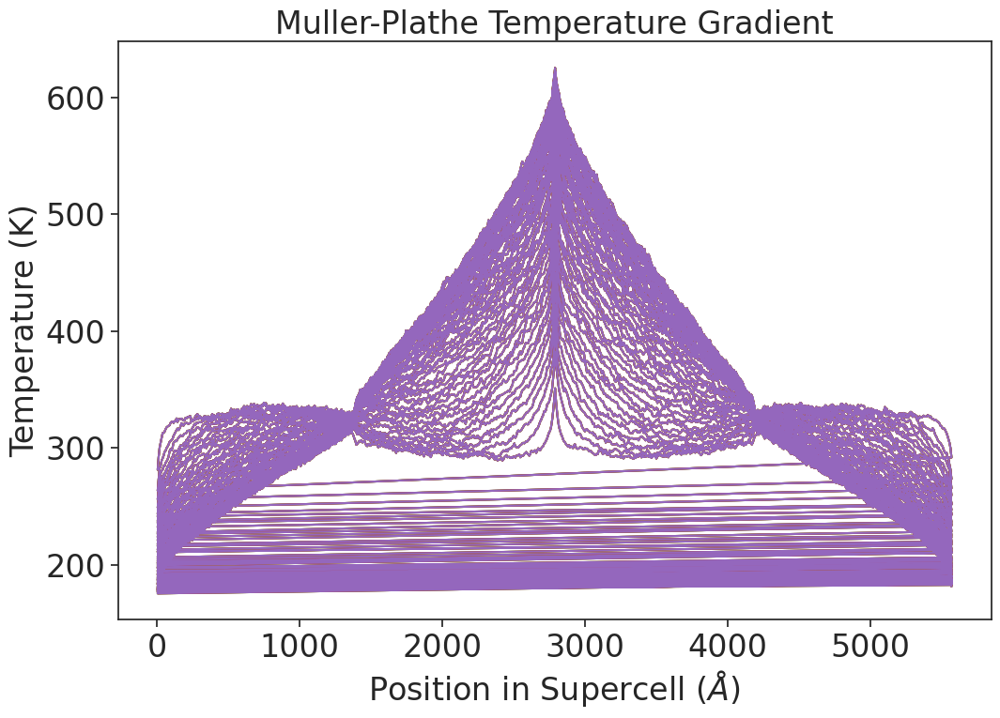

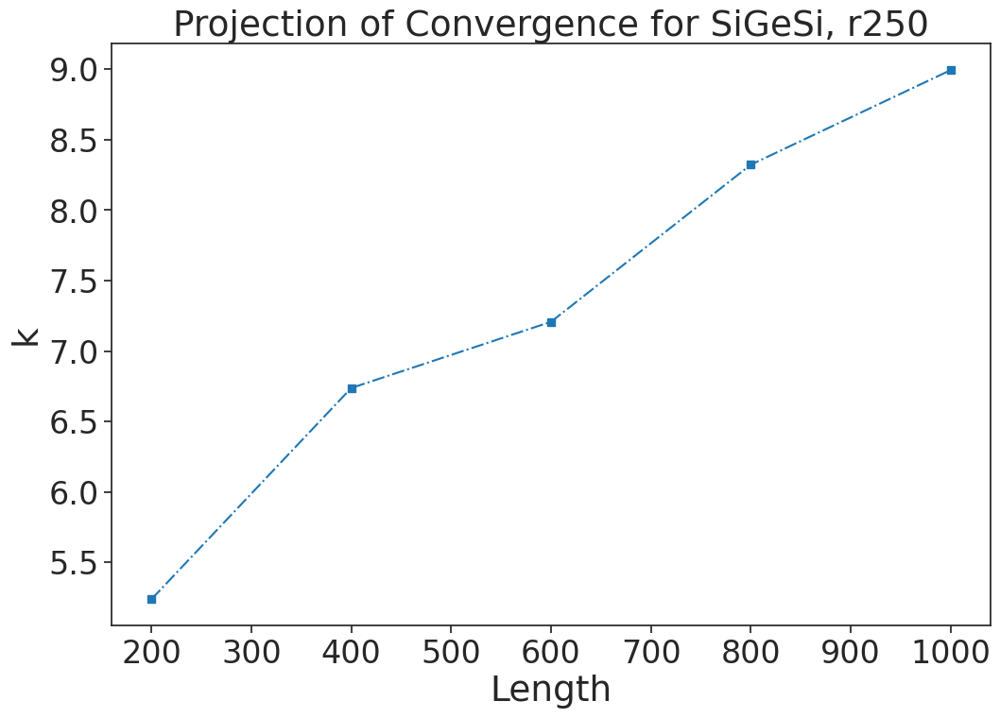

[4.549378e-03 4.570058e+00] 
 [-1.80538929e-06  6.71584514e-03  4.06454900e+00] 
 [ 6.09289583e-09 -1.27726018e-05  1.24675388e-02  3.24566380e+00]
[-1.000000e-03  1.999994e+02  3.999998e+02  6.000002e+02  8.000006e+02
  1.000001e+03]
Intercept of cubic polyfit: [ 6.09289583e-09 -1.27726018e-05  1.24675388e-02  3.24566380e+00]
Intercept of linear polyfit: [4.549378e-03 4.570058e+00]
Standard error of size 200: 0.07939291777942953
Standard error of size 400: 0.06927233664358734
Standard error of size 600: 0.04935564294612116
Standard error of size 800: 0.02237152143490685
Standard error of size 1000: 0.04794082553002182


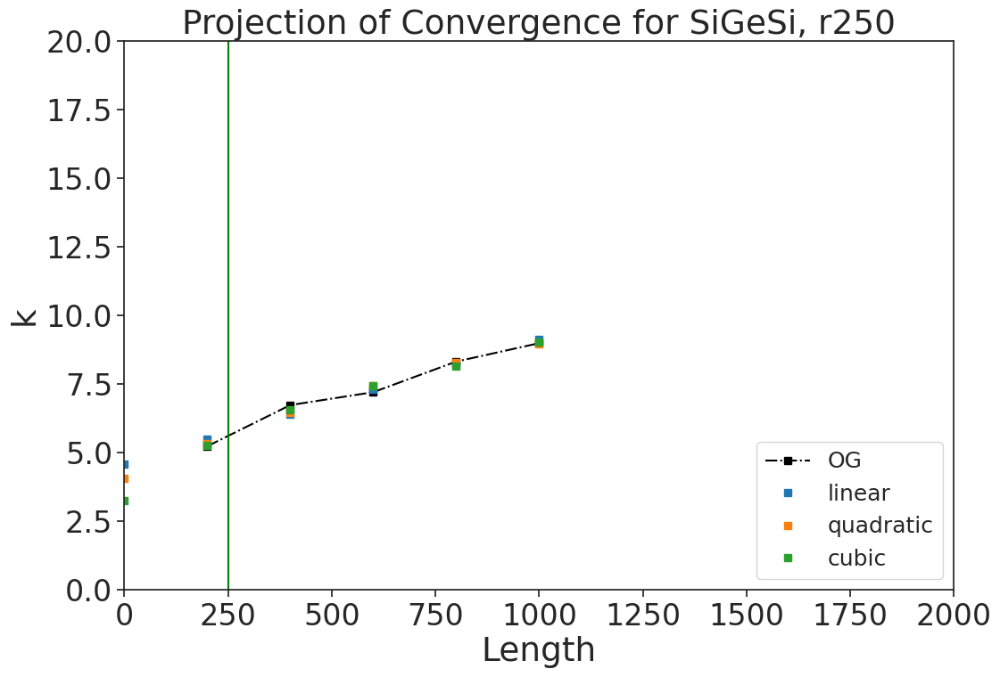

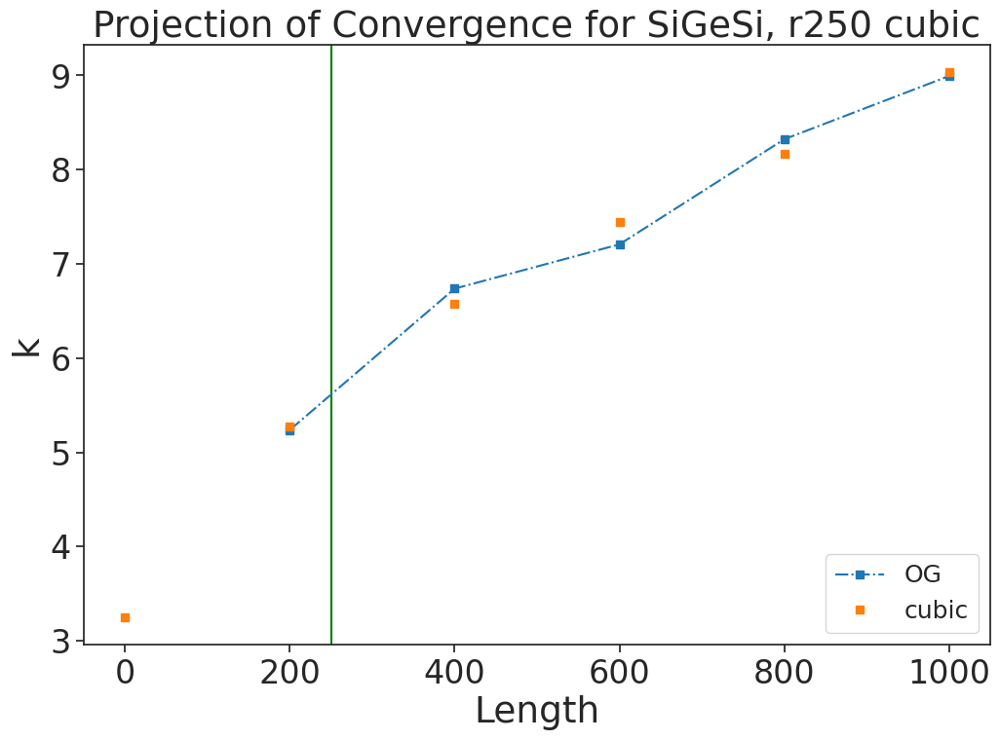

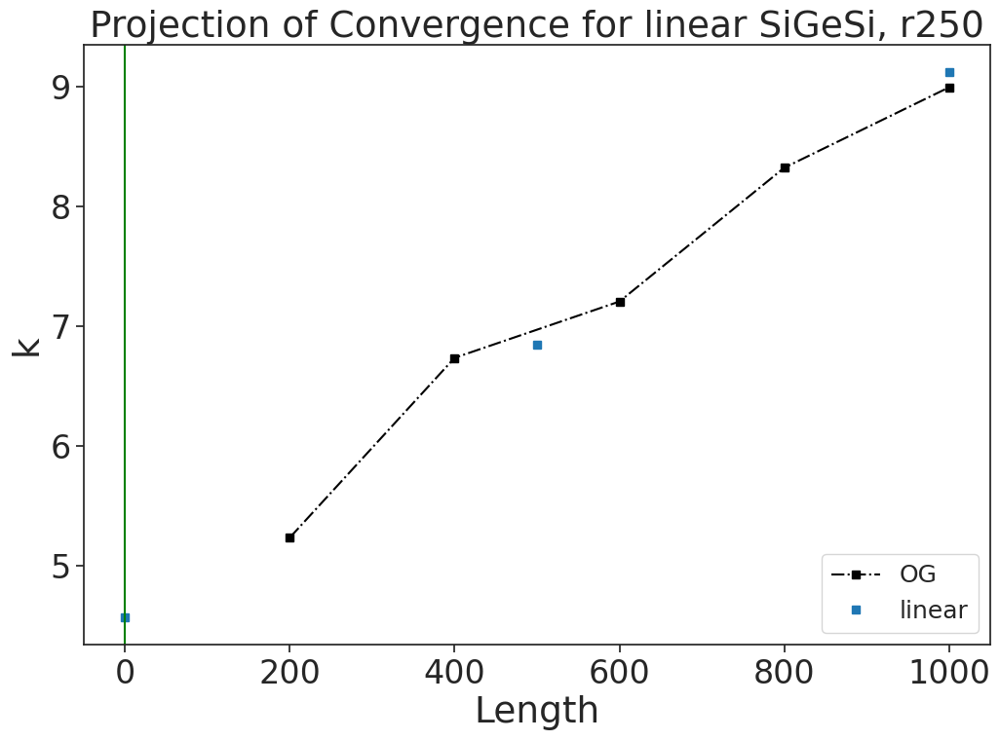

In [17]:
# load profile data 

filename = ['./profile_siE200r250', 'profile_siE400r250', 'profile_siE600r250',
           'profile_siE800r250', 'profile_siE1000r250']

#print(np.shape(filename))



MP_Profile = []; MP_Ave = []; MP_LastN = []; 

for simNo in range(0,len(filename)):
    subprocess.call(r"perl -p -e 's/^[\ \t]+|[\ \t]+$//g' %s > %s_new" % (filename[simNo], filename[simNo]), shell=True) # remove trailling white spaces
    subprocess.call("mv %s_new %s" % (filename[simNo], filename[simNo]), shell=True)
    subprocess.call("tr -s ' ' < %s > %s_tmp " % (filename[simNo], filename[simNo]), shell=True) #squeeze spaces
    subprocess.call("mv %s_tmp %s" % (filename[simNo], filename[simNo]), shell=True)

    profile = []; N = 800;
    with open(filename[simNo], 'r') as f:
        while True:
            lines = list(itertools.islice(f, 1, N+1))
            for line in lines:
                profile.append(line.split(' '))
            if not lines: 
                break
                
    lastN = profile[-N:] 
    lastAve = profile[-3200:]
    #print(lastAve)

    MP_Profile.append(profile)
    MP_LastN.append(lastN)
    MP_Ave.append(lastAve)
    
MP_Profile = np.array(MP_Profile, dtype=float) # for plotting 3D graphs
#print(MP_Profile)

MP_LastN = np.array(MP_LastN, dtype=float) # for calculating the thermal conductivity
#print(MP_LastN)



MP_Ave = np.array(MP_Ave, dtype=float) # for averaging the data to calculate the thermal conductivity
print(np.shape(MP_Profile))
#print(np.shape(MP_LastN))
print(np.shape(MP_Ave))

Thermo_Data = np.array([np.loadtxt('./Thermo_siE200r250'), np.loadtxt('./Thermo_siE400r250'), np.loadtxt('./Thermo_siE600r250'),
                       np.loadtxt('./Thermo_siE800r250'), np.loadtxt('./Thermo_siE1000r250')], dtype = object)

labels = ['siE200', 'siE400', 'siE600', 'siE800', 'siE1000','siE1500','siE2000'] 


print(np.shape(Thermo_Data))

Sim_no_dataset = [1,1,1,1,1,1,1,1,1]
Time_no_dataset = [6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000]
Interval_no_dataset = [0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3]
mxc_no_dataset = [10,10,10,10,10,10,10,10,10]

for simNo in range(0, len(MP_Profile)):
    Coordinates = MP_Profile[simNo,:,1]*(Thermo_Data[simNo,-1,9])
    #print(Coordinates)
    Temperature = MP_Profile[simNo,:,3]
    #print(Temperature)

fig = plt.figure(figsize=(12,8))
for k in range(0, len(MP_Profile)):
    plt.plot(Coordinates[:], Temperature[:], color=colors[k], label=labels[k])
    
plt.xlabel(r'Position in Supercell ($\AA$)')
plt.ylabel('Temperature (K)')
plt.title('Muller-Plathe Temperature Gradient', fontsize = 24)
#plt.savefig('MullerPlathe_PristineSi200.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
#plt.show

# Load the data that will be averaged to calculate the slopes 

Temperature = []; Coordinate = []; dX_Thermo = [];

for simNo in range(0, len(filename)):
    
    dX_ = Thermo_Data[simNo,-1,9]
    dX_Thermo.append(dX_)
    
    for i in range(0,800):
        Temperature_ = np.mean([MP_Ave[simNo,i,3],MP_Ave[simNo,i+800,3],MP_Ave[simNo,i+1600,3],MP_Ave[simNo,i+2400,3]])   
        Temperature.append(Temperature_)
        Coordinate_ = np.mean([MP_Ave[simNo,i,1],MP_Ave[simNo,i+800,1],MP_Ave[simNo,i+1600,1],MP_Ave[simNo,i+2400,1]])*dX_
        Coordinate.append(Coordinate_)
    
Temperature = np.array([Temperature[0:800],Temperature[800:1600],Temperature[1600:2400],
                       Temperature[2400:3200],Temperature[3200:4000]], dtype=float)#, 
                       #Temperature[4000:4800],Temperature[4800:5600]], dtype=float)
Coordinate = np.array([Coordinate[0:800],Coordinate[800:1600], Coordinate[1600:2400],
                      Coordinate[2400:3200],Coordinate[3200:4000],], dtype=float)#, 
                      #Coordinate[4000:4800],Coordinate[4800:5600]], dtype=float)


print(np.shape(Coordinate))
print(np.shape(Temperature))

#print(dX_Thermo)

excluded_points1 = 230 # excluded points from the beginning
excluded_points2 = 40 # excluded points from the end
excluded_points3 = 20
excluded_points4 = 230 # from the end of the mp.data file

slope2_mean = []; slope2 = []; slope1_mean = []; slope1 = []; average_temp_Si250 = [];
# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff

for simNo in range(0,len(filename)):
    
    dTemp = Temperature[simNo,:]
    X = dX_
    dX = Coordinate[simNo,:] #*X # normalized distance
    
    #T_fit_left = np.polyfit(dX[280:380], dTemp[280:380], 1)
    #T_fit_right = -np.polyfit(dX[360:-280], dTemp[360:-280], 1)
    
    T_fit_left = np.polyfit(dX[excluded_points1:400-excluded_points2], dTemp[excluded_points1:400-excluded_points2], 1)
    T_fit_right = -np.polyfit(dX[400+excluded_points2:-excluded_points1], dTemp[400+excluded_points2:-excluded_points1], 1)
    
    slope2.append([T_fit_left[0], T_fit_right[0]])
    #print(slope2)
    print('Top Slope', labels[simNo], ' = ', T_fit_left[0], T_fit_right[0])

    mean_slope = np.mean([abs(T_fit_left[0]), abs(T_fit_right[0])], axis = 0)
    slope2_mean.append(mean_slope)
    print('Top Slope Mean', labels[simNo], ' = ', slope2_mean[0])
    
    B_fit_left2 = np.polyfit(dX[excluded_points3:400-excluded_points4], dTemp[excluded_points3:400-excluded_points4], 1)
    B_fit_right2 = -np.polyfit(dX[400+excluded_points4:-excluded_points3], dTemp[400+excluded_points4:-excluded_points3], 1)
    
    slope1.append([B_fit_left2[0], B_fit_right2[0]])
    print('Bottom Slope', labels[simNo], ' = ', B_fit_left2[0], B_fit_right2[0])
    
    mean_slope = np.mean([abs(B_fit_left2[0]), abs(B_fit_right2[0])], axis = 0)
    slope1_mean.append(mean_slope)
    print('Bottom Slope Mean', labels[simNo], ' = ', slope1_mean[0])
    

    average_temp = np.mean(dTemp)
    average_temp_Si250.append(average_temp)

Slope1 = np.array(slope1)
Slope_mean1 = np.array(slope1_mean)
#print(Slope_mean1)

Slope2 = np.array(slope2)
Slope_mean2 = np.array(slope2_mean)
#print(Slope_mean2)

Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0)]) #individual
#Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0), np.mean([Slope_mean1[1], Slope_mean2[1]], axis =0), np.mean([Slope_mean1[2], Slope_mean2[2]], axis=0)])
print('Slope Mean', labels[simNo], ' = ', Slope_mean[0])

Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0]]) #individual
#Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0], Slope_mean[1]*dX_Thermo[1], Slope_mean[2]*dX_Thermo[2]])
print('Slope Average', labels[simNo], ' = ', Slope_ave[0])

# Calculate the heat flux and the thermal conductivity
eV2J  = 1.6e-19;
Ang2m =   1e-10;
ps2s  =   1e-12;
conversion = (eV2J/(Ang2m*ps2s))

s_values = []
ThermalsSi250 = []
dt = 0.0005 # picoseconds

# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff
for simNo in range(0, len(Thermo_Data)):
    
    Steps = Thermo_Data[simNo,-1,0]
    Time = Steps*dt # picoseconds
    
    dx = Thermo_Data[simNo,-1,9]
    dy = Thermo_Data[simNo,-1,10]
    dz = Thermo_Data[simNo,-1,11]
    Area = dy*dz
    
    #DeltaE = Thermo_Data[simNo,-1,-2] # E_pair
    #TotalE = Thermo_Data[simNo,-1,-5] # Total energy
    KinE = Thermo_Data[simNo,-1,12] # in log_lammps, f_3 
    
    Thermal_left2 = ((KinE)/(2*Time*Area*Slope2[simNo,0]))*conversion #top left
    Thermal_right2 = ((KinE)/(2*Time*Area*Slope2[simNo,1]))*conversion #top right
    
    Thermal_left1 = ((KinE)/(2*Time*Area*Slope1[simNo,0]))*conversion #bottom left
    Thermal_right1 = ((KinE)/(2*Time*Area*Slope1[simNo,1]))*conversion #bottom right
    
    thermal2 = np.concatenate((Thermal_left1, Thermal_left2), axis = None)
    thermal1 = np.concatenate((Thermal_right1, Thermal_right2), axis = None)
    
    thermal2_ave = ((KinE)/(2*Time*Area*Slope_mean2[simNo]))*conversion #top
    thermal1_ave = ((KinE)/(2*Time*Area*Slope_mean1[simNo]))*conversion #bottom
    
    #thermal_ave = ((KinE)/(2*Time*Area*Slope_ave[simNo]))*conversion
    thermal_ave = (thermal2_ave+thermal1_ave)/2
   
    getcontext().prec = 10
    std_top = Decimal(np.std([Thermal_left2, Thermal_right2], dtype=np.float64))
    SE_left = std_top/Decimal(math.sqrt(2))
   
    std_bottom = Decimal(np.std([Thermal_left1, Thermal_right1], dtype=np.float64))
    SE_right = std_bottom/Decimal(math.sqrt(2))
    
    SE = math.sqrt(((SE_left/2)**2) + ((SE_right/2)**2))
    print(SE)
   
    #print('Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2[0], thermal2[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2_ave)
    
    #print('Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1[0], thermal1[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1_ave)
    
    print('Average Thermal Conductivity of', labels[simNo], 'Average = ', thermal_ave) 
    
    Therm_val = [Thermal_left1,Thermal_left2,Thermal_right2,Thermal_right1]
    Ttherm = ['%.6f' % elem for elem in Therm_val]
    #print(Ttherm)
    ThermalsSi250.append(Ttherm)
    print('ThermalsSi250', labels[simNo], ' = ', Ttherm)
    
    
    TC_values = [thermal2_ave, thermal1_ave, thermal_ave, SE]
    val = ['%.6f' % elem for elem in TC_values]
    #print(val)
    s_values.append(val)
    print('s values', labels[simNo], ' = ', val)
    #print(simNo)
    



#print(s_values)
#print(s_values[0]) #200
#print(s_values[1]) #400
#print(s_values[2]) #600
#print(s_values[3]) #800
#print(s_values[4]) #1000
#print(s_values[5]) #1500
#print(s_values[0][0])
therm_averageSi250 = []
for item in s_values:
    print(item[2])
    therm_averageSi250.append(item[2])

therm_averageSi250 = []
for item in s_values:
    print(float(item[2]))
    therm_averageSi250.append(np.array(float(item[2])))

#projection stuff

print(s_values)



#SIGESI r250
sizeSi250 = [200.0,400.0,600.0,800.0,1000.0]#,1500.0,2000.0]
sizeSi250 = np.array(sizeSi250)
#print(np.shape(sizeSi250))
print(sizeSi250)
Tc = [float(s_values[0][2]),float(s_values[1][2]),float(s_values[2][2]),
      float(s_values[3][2]),float(s_values[4][2])]
      #,float(s_values[5][2]),float(s_values[6][2])]
Tc = np.array(Tc)
print(Tc)

inv_sizeSi250 = np.reciprocal(sizeSi250)
#np.set_printoptions(precision=10)
print(inv_sizeSi250)

inv_Tc = np.reciprocal(Tc)
print(inv_Tc)

#plot

fig = plt.figure(figsize=(12,8))

plt.plot(sizeSi250[:], Tc[:],'s-.')


plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r250', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r250.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show()



fig = plt.figure(figsize=(12,8))

x1 = np.array(sizeSi250)
mn = min(x1)
mx = max(x1)
#print(x1)
#print(len(x))

y1 = np.array(Tc)
#print(y1)

z1 = np.polyfit(x1, y1, 1) #np.polyfit(x, y, degree of polynomial), degree =1,2,3 is linear, quadratic, cubic
z2 = np.polyfit(x1, y1, 2)
z3 = np.polyfit(x1, y1, 3)

print(z1,'\n',z2,'\n',z3)
#xp = np.linspace(mn, mx, 6)
xp = np.linspace(-0.001, mx+0.001, 6)
print(xp)

p1 = np.poly1d(z1)
p2 = np.poly1d(z2)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

plt.plot(x1, y1, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')
plt.plot(xp, p2(xp), 's', label = 'quadratic')
plt.plot(xp, p3(xp), 's', label ='cubic') 

plt.axvline(x=250.0, color='green')

plt.legend(loc="lower right")

plt.xlim([0.0,2000])
plt.ylim([0.0,20])

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r250', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r250-lqc-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


fig = plt.figure(figsize=(12,8))

x_2 = np.array(sizeSi250)
mn = min(x_2)
mx = max(x_2)
#print(mn)
#print(len(x_2))

y_2 = np.array(Tc)
#print(y)

#xpp = np.linspace(-0.00005,mx, 6)
xpp = np.linspace(-0.0005,mx, 6)

plt.axvline(x=250.0, color='green')


z3 = np.polyfit(x_2, y_2, 3)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

##m, c; run by Laura
s = p3(1);
i = p3(2)    #The polyfit function for a linear (polynomial order 1) fit returns the slope as the first parameter
                    #and the intercept as the second parameter, so the output vector is [slope, intercept]. 
                    #It is like any other vector, so choose the one you want by indexing into it.
n = p3(0)
#print(s)
#print(i)
#print(n)

#slope_intercept = np.polyfit(x_2,y_2,1)
#print('Intercept of linear polyfit:',slope_intercept)
#slope_intercept = np.polyfit(x_2,y_2,2)
#print('Intercept of quad. polyfit:',slope_intercept)
slope_intercept = np.polyfit(x_2,y_2,3)
print('Intercept of cubic polyfit:',slope_intercept)
##

plt.plot(x_2,y_2, 's-.', label ='OG')
plt.plot(xpp, p3(xp), 's', label ='cubic') 
plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
#plt.ylim(-0.0002, 0.18)
plt.title(r'Projection of Convergence for SiGeSi, r250 cubic', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r250-c-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)



plt.show


#linear fit in linear region alone
fig = plt.figure(figsize=(12,8))

#x2 = [0.005,0.0025,0.00166667]
x2 = sizeSi250
x2 = np.array(x2)
y2 = Tc
#y2 = [0.16806723,0.13947001,0.11160714]
y2 = np.array(y2)


z = np.polyfit(x2, y2, 1) 
xp = np.linspace(-0.001, mx+0.001, 3)

p1 = np.poly1d(z)

slope_intercept = np.polyfit(x2,y2,1)
print('Intercept of linear polyfit:',slope_intercept)


plt.plot(x2, y2, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')

plt.axvline(x=0, color='green')

plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for linear SiGeSi, r250', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-linear-GeSiGe-r250-l-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


#SiGeSi values

SE200b_left = np.std([float(ThermalsSi250[0][1]), float(ThermalsSi250[0][2])], dtype=np.float64)
SE200_left = SE200b_left/math.sqrt(2)
SE200b_right = np.std([float(ThermalsSi250[0][0]), float(ThermalsSi250[0][3])], dtype=np.float64)
SE200_right = SE200b_right/math.sqrt(2)
standard_error200b250 = math.sqrt(((SE200_left/2)**2) + ((SE200_right/2)**2))
print('Standard error of size 200:',standard_error200b250)

SE400b_left = np.std([float(ThermalsSi250[1][1]), float(ThermalsSi250[1][2])], dtype=np.float64)
SE400_left = SE400b_left/math.sqrt(2)
SE400b_right = np.std([float(ThermalsSi250[1][0]), float(ThermalsSi250[1][3])], dtype=np.float64)
SE400_right = SE400b_right/math.sqrt(2)
standard_error400b250 = math.sqrt(((SE400_left/2)**2) + ((SE400_right/2)**2))
print('Standard error of size 400:',standard_error400b250)

SE600b_left = np.std([float(ThermalsSi250[2][1]), float(ThermalsSi250[2][2])], dtype=np.float64)
SE600_left = SE600b_left/math.sqrt(2)
SE600b_right = np.std([float(ThermalsSi250[2][0]), float(ThermalsSi250[2][3])], dtype=np.float64)
SE600_right = SE600b_right/math.sqrt(2)
standard_error600b250 = math.sqrt(((SE600_left/2)**2) + ((SE600_right/2)**2))
print('Standard error of size 600:',standard_error600b250)


SE800b_left = np.std([float(ThermalsSi250[3][1]), float(ThermalsSi250[3][2])], dtype=np.float64)
SE800_left = SE800b_left/math.sqrt(2)
SE800b_right = np.std([float(ThermalsSi250[3][0]), float(ThermalsSi250[3][3])], dtype=np.float64)
SE800_right = SE800b_right/math.sqrt(2)
standard_error800b250 = math.sqrt(((SE800_left/2)**2) + ((SE800_right/2)**2))
print('Standard error of size 800:',standard_error800b250)

SE1000b_left = np.std([float(ThermalsSi250[4][1]), float(ThermalsSi250[4][2])], dtype=np.float64)
SE1000_left = SE1000b_left/math.sqrt(2)
SE1000b_right = np.std([float(ThermalsSi250[4][0]), float(ThermalsSi250[4][3])], dtype=np.float64)
SE1000_right = SE1000b_right/math.sqrt(2)
standard_error1000b250 = math.sqrt(((SE1000_left/2)**2) + ((SE1000_right/2)**2))
print('Standard error of size 1000:',standard_error1000b250)

'''
SE1500b_left = np.std([float(ThermalsSi250[5][1]), float(ThermalsSi250[5][2])], dtype=np.float64)
SE1500_left = SE1500b_left/math.sqrt(2)
SE1500b_right = np.std([float(ThermalsSi250[5][0]), float(ThermalsSi250[5][3])], dtype=np.float64)
SE1500_right = SE1500b_right/math.sqrt(2)
standard_error1500b250 = math.sqrt(((SE1500_left/2)**2) + ((SE1500_right/2)**2))
print('Standard error of size 1500:',standard_error1500b250)

SE2000b_left = np.std([float(ThermalsSi250[6][1]), float(ThermalsSi250[6][2])], dtype=np.float64)
SE2000_left = SE2000b_left/math.sqrt(2)
SE2000b_right = np.std([float(ThermalsSi250[6][0]), float(ThermalsSi250[6][3])], dtype=np.float64)
SE2000_right = SE2000b_right/math.sqrt(2)
standard_error2000b250 = math.sqrt(((SE2000_left/2)**2) + ((SE2000_right/2)**2))
print('Standard error of size 2000:',standard_error2000b250)

yerrSi1500b250 = standard_error1500b250
yerrSi2000b250 = standard_error2000b250

#projection of convergence for SiGeSi
#https://math.stackexchange.com/questions/3217622/how-does-inverting-data-change-standaro-deviation
'''
yerrSi200b250 = standard_error200b250
yerrSi400b250 = standard_error400b250
yerrSi600b250 = standard_error600b250
yerrSi800b250 = standard_error800b250
yerrSi1000b250 = standard_error1000b250



In [18]:
#271

(5, 48000, 4)
(5, 3200, 4)
(5, 61, 14)
(5, 800)
(5, 800)
Top Slope siE200  =  0.313514687883194 0.30824986011585026
Top Slope Mean siE200  =  0.3108822739995221
Bottom Slope siE200  =  0.1700487187938853 0.1787398224055299
Bottom Slope Mean siE200  =  0.1743942705997076
Top Slope siE400  =  0.24155119821829302 0.24719527153866516
Top Slope Mean siE400  =  0.3108822739995221
Bottom Slope siE400  =  0.1297842987713119 0.13225149174681475
Bottom Slope Mean siE400  =  0.1743942705997076
Top Slope siE600  =  0.21329562839584093 0.2162015114061373
Top Slope Mean siE600  =  0.3108822739995221
Bottom Slope siE600  =  0.10454475653791899 0.10299139461193868
Bottom Slope Mean siE600  =  0.1743942705997076
Top Slope siE800  =  0.19482453286394827 0.19496907946042663
Top Slope Mean siE800  =  0.3108822739995221
Bottom Slope siE800  =  0.0880950566775973 0.09039539700756567
Bottom Slope Mean siE800  =  0.1743942705997076
Top Slope siE1000  =  0.16987404615278626 0.16909768942292616
Top Slope Mean s

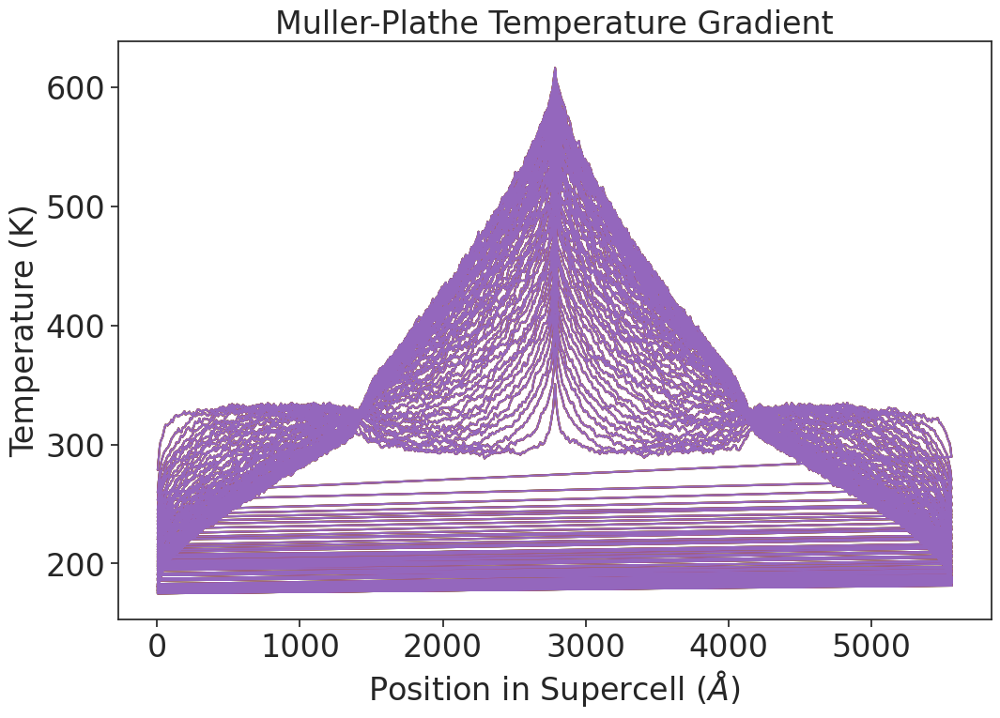

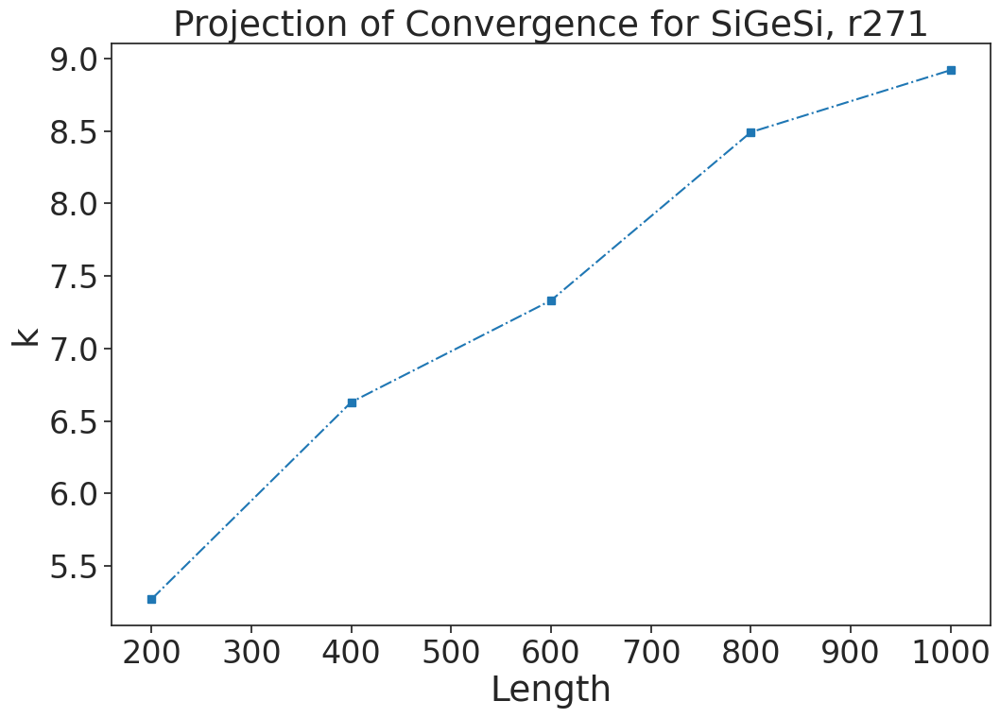

[4.577529e-03 4.581890e+00] 
 [-2.50520714e-06  7.58377757e-03  3.88043200e+00] 
 [-7.81000000e-10 -1.09940714e-06  6.84651357e-03  3.98539840e+00]
[-1.000000e-03  1.999994e+02  3.999998e+02  6.000002e+02  8.000006e+02
  1.000001e+03]
Intercept of cubic polyfit: [-7.81000000e-10 -1.09940714e-06  6.84651357e-03  3.98539840e+00]
Intercept of linear polyfit: [4.577529e-03 4.581890e+00]
Standard error of size 200: 0.06061146341271784
Standard error of size 400: 0.034393569348062814
Standard error of size 600: 0.028548254623203376
Standard error of size 800: 0.053087465993631545
Standard error of size 1000: 0.00709573210193978


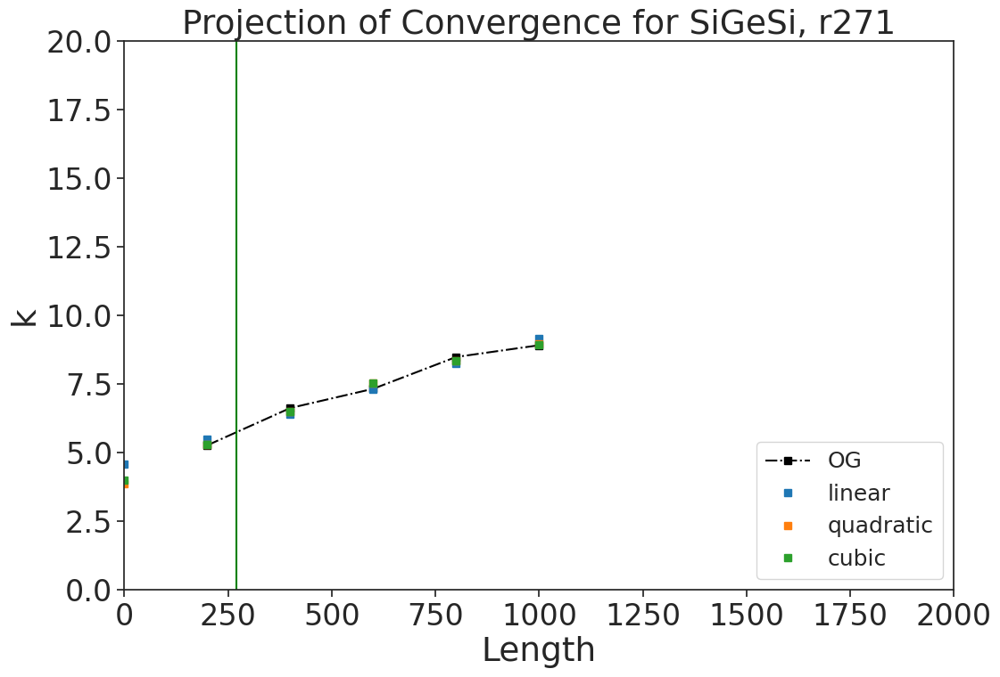

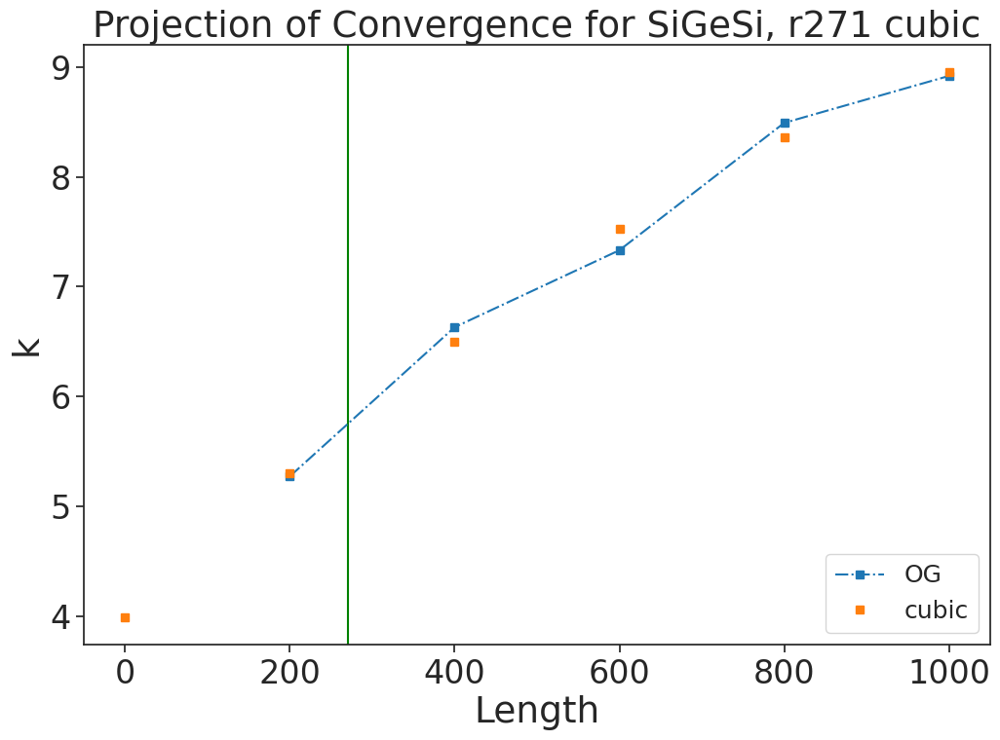

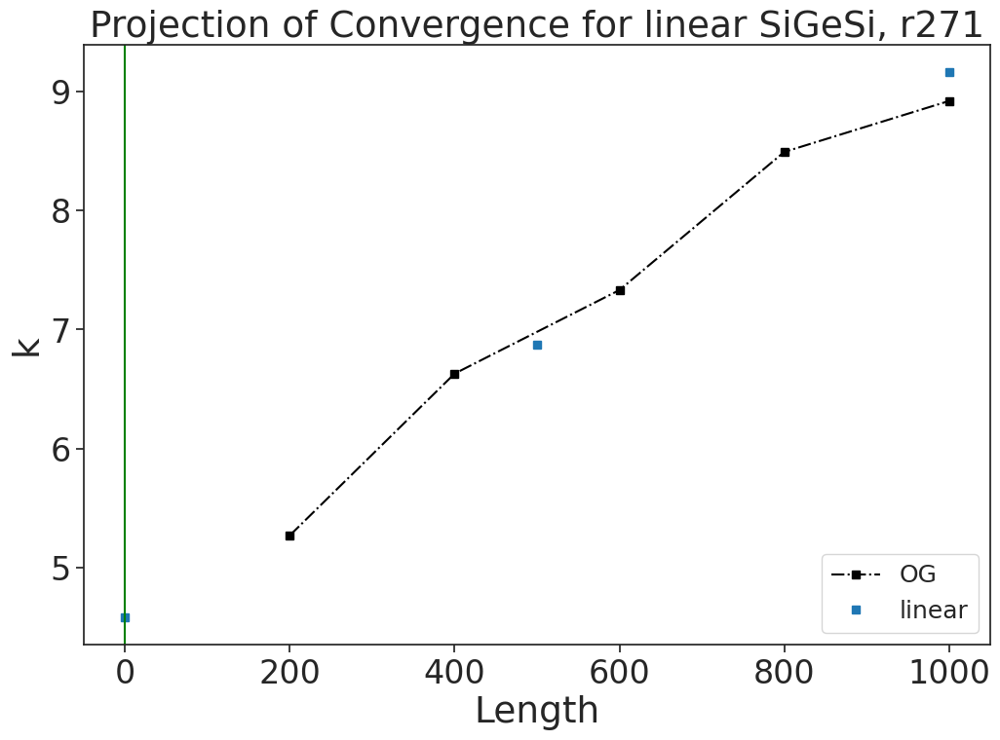

In [19]:
# load profile data 

filename = ['./profile_siE200r271', 'profile_siE400r271', 'profile_siE600r271',
           'profile_siE800r271', 'profile_siE1000r271']

#print(np.shape(filename))



MP_Profile = []; MP_Ave = []; MP_LastN = []; 

for simNo in range(0,len(filename)):
    subprocess.call(r"perl -p -e 's/^[\ \t]+|[\ \t]+$//g' %s > %s_new" % (filename[simNo], filename[simNo]), shell=True) # remove trailling white spaces
    subprocess.call("mv %s_new %s" % (filename[simNo], filename[simNo]), shell=True)
    subprocess.call("tr -s ' ' < %s > %s_tmp " % (filename[simNo], filename[simNo]), shell=True) #squeeze spaces
    subprocess.call("mv %s_tmp %s" % (filename[simNo], filename[simNo]), shell=True)

    profile = []; N = 800;
    with open(filename[simNo], 'r') as f:
        while True:
            lines = list(itertools.islice(f, 1, N+1))
            for line in lines:
                profile.append(line.split(' '))
            if not lines: 
                break
                
    lastN = profile[-N:] 
    lastAve = profile[-3200:]
    #print(lastAve)

    MP_Profile.append(profile)
    MP_LastN.append(lastN)
    MP_Ave.append(lastAve)
    
MP_Profile = np.array(MP_Profile, dtype=float) # for plotting 3D graphs
#print(MP_Profile)

MP_LastN = np.array(MP_LastN, dtype=float) # for calculating the thermal conductivity
#print(MP_LastN)



MP_Ave = np.array(MP_Ave, dtype=float) # for averaging the data to calculate the thermal conductivity
print(np.shape(MP_Profile))
#print(np.shape(MP_LastN))
print(np.shape(MP_Ave))

Thermo_Data = np.array([np.loadtxt('./Thermo_siE200r271'), np.loadtxt('./Thermo_siE400r271'), np.loadtxt('./Thermo_siE600r271'),
                       np.loadtxt('./Thermo_siE800r271'), np.loadtxt('./Thermo_siE1000r271')], dtype = object)

labels = ['siE200', 'siE400', 'siE600', 'siE800', 'siE1000','siE1500','siE2000'] 


print(np.shape(Thermo_Data))

Sim_no_dataset = [1,1,1,1,1,1,1,1,1]
Time_no_dataset = [6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000]
Interval_no_dataset = [0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3]
mxc_no_dataset = [10,10,10,10,10,10,10,10,10]

for simNo in range(0, len(MP_Profile)):
    Coordinates = MP_Profile[simNo,:,1]*(Thermo_Data[simNo,-1,9])
    #print(Coordinates)
    Temperature = MP_Profile[simNo,:,3]
    #print(Temperature)

fig = plt.figure(figsize=(12,8))
for k in range(0, len(MP_Profile)):
    plt.plot(Coordinates[:], Temperature[:], color=colors[k], label=labels[k])
    
plt.xlabel(r'Position in Supercell ($\AA$)')
plt.ylabel('Temperature (K)')
plt.title('Muller-Plathe Temperature Gradient', fontsize = 24)
#plt.savefig('MullerPlathe_PristineSi200.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
#plt.show

# Load the data that will be averaged to calculate the slopes 

Temperature = []; Coordinate = []; dX_Thermo = [];

for simNo in range(0, len(filename)):
    
    dX_ = Thermo_Data[simNo,-1,9]
    dX_Thermo.append(dX_)
    
    for i in range(0,800):
        Temperature_ = np.mean([MP_Ave[simNo,i,3],MP_Ave[simNo,i+800,3],MP_Ave[simNo,i+1600,3],MP_Ave[simNo,i+2400,3]])   
        Temperature.append(Temperature_)
        Coordinate_ = np.mean([MP_Ave[simNo,i,1],MP_Ave[simNo,i+800,1],MP_Ave[simNo,i+1600,1],MP_Ave[simNo,i+2400,1]])*dX_
        Coordinate.append(Coordinate_)
    
Temperature = np.array([Temperature[0:800],Temperature[800:1600],Temperature[1600:2400],
                       Temperature[2400:3200],Temperature[3200:4000]], dtype=float)#, 
                       #Temperature[4000:4800],Temperature[4800:5600]], dtype=float)
Coordinate = np.array([Coordinate[0:800],Coordinate[800:1600], Coordinate[1600:2400],
                      Coordinate[2400:3200],Coordinate[3200:4000],], dtype=float)#, 
                      #Coordinate[4000:4800],Coordinate[4800:5600]], dtype=float)


print(np.shape(Coordinate))
print(np.shape(Temperature))

#print(dX_Thermo)

excluded_points1 = 230 # excluded points from the beginning
excluded_points2 = 40 # excluded points from the end
excluded_points3 = 20
excluded_points4 = 230 # from the end of the mp.data file

slope2_mean = []; slope2 = []; slope1_mean = []; slope1 = []; average_temp_Si271 = [];
# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff

for simNo in range(0,len(filename)):
    
    dTemp = Temperature[simNo,:]
    X = dX_
    dX = Coordinate[simNo,:] #*X # normalized distance
    
    #T_fit_left = np.polyfit(dX[280:380], dTemp[280:380], 1)
    #T_fit_right = -np.polyfit(dX[360:-280], dTemp[360:-280], 1)
    
    T_fit_left = np.polyfit(dX[excluded_points1:400-excluded_points2], dTemp[excluded_points1:400-excluded_points2], 1)
    T_fit_right = -np.polyfit(dX[400+excluded_points2:-excluded_points1], dTemp[400+excluded_points2:-excluded_points1], 1)
    
    slope2.append([T_fit_left[0], T_fit_right[0]])
    #print(slope2)
    print('Top Slope', labels[simNo], ' = ', T_fit_left[0], T_fit_right[0])

    mean_slope = np.mean([abs(T_fit_left[0]), abs(T_fit_right[0])], axis = 0)
    slope2_mean.append(mean_slope)
    print('Top Slope Mean', labels[simNo], ' = ', slope2_mean[0])
    
    B_fit_left2 = np.polyfit(dX[excluded_points3:400-excluded_points4], dTemp[excluded_points3:400-excluded_points4], 1)
    B_fit_right2 = -np.polyfit(dX[400+excluded_points4:-excluded_points3], dTemp[400+excluded_points4:-excluded_points3], 1)
    
    slope1.append([B_fit_left2[0], B_fit_right2[0]])
    print('Bottom Slope', labels[simNo], ' = ', B_fit_left2[0], B_fit_right2[0])
    
    mean_slope = np.mean([abs(B_fit_left2[0]), abs(B_fit_right2[0])], axis = 0)
    slope1_mean.append(mean_slope)
    print('Bottom Slope Mean', labels[simNo], ' = ', slope1_mean[0])
    

    average_temp = np.mean(dTemp)
    average_temp_Si271.append(average_temp)

Slope1 = np.array(slope1)
Slope_mean1 = np.array(slope1_mean)
#print(Slope_mean1)

Slope2 = np.array(slope2)
Slope_mean2 = np.array(slope2_mean)
#print(Slope_mean2)

Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0)]) #individual
#Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0), np.mean([Slope_mean1[1], Slope_mean2[1]], axis =0), np.mean([Slope_mean1[2], Slope_mean2[2]], axis=0)])
print('Slope Mean', labels[simNo], ' = ', Slope_mean[0])

Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0]]) #individual
#Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0], Slope_mean[1]*dX_Thermo[1], Slope_mean[2]*dX_Thermo[2]])
print('Slope Average', labels[simNo], ' = ', Slope_ave[0])

# Calculate the heat flux and the thermal conductivity
eV2J  = 1.6e-19;
Ang2m =   1e-10;
ps2s  =   1e-12;
conversion = (eV2J/(Ang2m*ps2s))

s_values = []
ThermalsSi271 = []
dt = 0.0005 # picoseconds

# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff
for simNo in range(0, len(Thermo_Data)):
    
    Steps = Thermo_Data[simNo,-1,0]
    Time = Steps*dt # picoseconds
    
    dx = Thermo_Data[simNo,-1,9]
    dy = Thermo_Data[simNo,-1,10]
    dz = Thermo_Data[simNo,-1,11]
    Area = dy*dz
    
    #DeltaE = Thermo_Data[simNo,-1,-2] # E_pair
    #TotalE = Thermo_Data[simNo,-1,-5] # Total energy
    KinE = Thermo_Data[simNo,-1,12] # in log_lammps, f_3 
    
    Thermal_left2 = ((KinE)/(2*Time*Area*Slope2[simNo,0]))*conversion #top left
    Thermal_right2 = ((KinE)/(2*Time*Area*Slope2[simNo,1]))*conversion #top right
    
    Thermal_left1 = ((KinE)/(2*Time*Area*Slope1[simNo,0]))*conversion #bottom left
    Thermal_right1 = ((KinE)/(2*Time*Area*Slope1[simNo,1]))*conversion #bottom right
    
    thermal2 = np.concatenate((Thermal_left1, Thermal_left2), axis = None)
    thermal1 = np.concatenate((Thermal_right1, Thermal_right2), axis = None)
    
    thermal2_ave = ((KinE)/(2*Time*Area*Slope_mean2[simNo]))*conversion #top
    thermal1_ave = ((KinE)/(2*Time*Area*Slope_mean1[simNo]))*conversion #bottom
    
    #thermal_ave = ((KinE)/(2*Time*Area*Slope_ave[simNo]))*conversion
    thermal_ave = (thermal2_ave+thermal1_ave)/2
   
    getcontext().prec = 10
    std_top = Decimal(np.std([Thermal_left2, Thermal_right2], dtype=np.float64))
    SE_left = std_top/Decimal(math.sqrt(2))
   
    std_bottom = Decimal(np.std([Thermal_left1, Thermal_right1], dtype=np.float64))
    SE_right = std_bottom/Decimal(math.sqrt(2))
    
    SE = math.sqrt(((SE_left/2)**2) + ((SE_right/2)**2))
    print(SE)
   
    #print('Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2[0], thermal2[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2_ave)
    
    #print('Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1[0], thermal1[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1_ave)
    
    print('Average Thermal Conductivity of', labels[simNo], 'Average = ', thermal_ave) 
    
    Therm_val = [Thermal_left1,Thermal_left2,Thermal_right2,Thermal_right1]
    Ttherm = ['%.6f' % elem for elem in Therm_val]
    #print(Ttherm)
    ThermalsSi271.append(Ttherm)
    print('ThermalsSi271', labels[simNo], ' = ', Ttherm)
    
    
    TC_values = [thermal2_ave, thermal1_ave, thermal_ave, SE]
    val = ['%.6f' % elem for elem in TC_values]
    #print(val)
    s_values.append(val)
    print('s values', labels[simNo], ' = ', val)
    #print(simNo)
    



#print(s_values)
#print(s_values[0]) #200
#print(s_values[1]) #400
#print(s_values[2]) #600
#print(s_values[3]) #800
#print(s_values[4]) #1000
#print(s_values[5]) #1500
#print(s_values[0][0])
therm_averageSi271 = []
for item in s_values:
    print(item[2])
    therm_averageSi271.append(item[2])

therm_averageSi271 = []
for item in s_values:
    print(float(item[2]))
    therm_averageSi271.append(np.array(float(item[2])))

#projection stuff

print(s_values)



#SIGESI r271
sizeSi271 = [200.0,400.0,600.0,800.0,1000.0]#,1500.0,2000.0]
sizeSi271 = np.array(sizeSi271)
#print(np.shape(sizeSi271))
print(sizeSi271)
Tc = [float(s_values[0][2]),float(s_values[1][2]),float(s_values[2][2]),
      float(s_values[3][2]),float(s_values[4][2])]
      #,float(s_values[5][2]),float(s_values[6][2])]
Tc = np.array(Tc)
print(Tc)

inv_sizeSi271 = np.reciprocal(sizeSi271)
#np.set_printoptions(precision=10)
print(inv_sizeSi271)

inv_Tc = np.reciprocal(Tc)
print(inv_Tc)

#plot

fig = plt.figure(figsize=(12,8))

plt.plot(sizeSi271[:], Tc[:],'s-.')


plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r271', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r271.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show()



fig = plt.figure(figsize=(12,8))

x1 = np.array(sizeSi271)
mn = min(x1)
mx = max(x1)
#print(x1)
#print(len(x))

y1 = np.array(Tc)
#print(y1)

z1 = np.polyfit(x1, y1, 1) #np.polyfit(x, y, degree of polynomial), degree =1,2,3 is linear, quadratic, cubic
z2 = np.polyfit(x1, y1, 2)
z3 = np.polyfit(x1, y1, 3)

print(z1,'\n',z2,'\n',z3)
#xp = np.linspace(mn, mx, 6)
xp = np.linspace(-0.001, mx+0.001, 6)
print(xp)

p1 = np.poly1d(z1)
p2 = np.poly1d(z2)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

plt.plot(x1, y1, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')
plt.plot(xp, p2(xp), 's', label = 'quadratic')
plt.plot(xp, p3(xp), 's', label ='cubic') 

plt.axvline(x=271.0, color='green')

plt.legend(loc="lower right")

plt.xlim([0.0,2000])
plt.ylim([0.0,20])

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r271', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r271-lqc-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


fig = plt.figure(figsize=(12,8))

x_2 = np.array(sizeSi271)
mn = min(x_2)
mx = max(x_2)
#print(mn)
#print(len(x_2))

y_2 = np.array(Tc)
#print(y)

#xpp = np.linspace(-0.00005,mx, 6)
xpp = np.linspace(-0.0005,mx, 6)

plt.axvline(x=271.0, color='green')


z3 = np.polyfit(x_2, y_2, 3)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

##m, c; run by Laura
s = p3(1);
i = p3(2)    #The polyfit function for a linear (polynomial order 1) fit returns the slope as the first parameter
                    #and the intercept as the second parameter, so the output vector is [slope, intercept]. 
                    #It is like any other vector, so choose the one you want by indexing into it.
n = p3(0)
#print(s)
#print(i)
#print(n)

#slope_intercept = np.polyfit(x_2,y_2,1)
#print('Intercept of linear polyfit:',slope_intercept)
#slope_intercept = np.polyfit(x_2,y_2,2)
#print('Intercept of quad. polyfit:',slope_intercept)
slope_intercept = np.polyfit(x_2,y_2,3)
print('Intercept of cubic polyfit:',slope_intercept)
##

plt.plot(x_2,y_2, 's-.', label ='OG')
plt.plot(xpp, p3(xp), 's', label ='cubic') 
plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
#plt.ylim(-0.0002, 0.18)
plt.title(r'Projection of Convergence for SiGeSi, r271 cubic', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r271-c-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)



plt.show


#linear fit in linear region alone
fig = plt.figure(figsize=(12,8))

#x2 = [0.005,0.0025,0.00166667]
x2 = sizeSi271
x2 = np.array(x2)
y2 = Tc
#y2 = [0.16806723,0.13947001,0.11160714]
y2 = np.array(y2)


z = np.polyfit(x2, y2, 1) 
xp = np.linspace(-0.001, mx+0.001, 3)

p1 = np.poly1d(z)

slope_intercept = np.polyfit(x2,y2,1)
print('Intercept of linear polyfit:',slope_intercept)


plt.plot(x2, y2, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')

plt.axvline(x=0, color='green')

plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for linear SiGeSi, r271', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-linear-GeSiGe-r271-l-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


#SiGeSi values

SE200b_left = np.std([float(ThermalsSi271[0][1]), float(ThermalsSi271[0][2])], dtype=np.float64)
SE200_left = SE200b_left/math.sqrt(2)
SE200b_right = np.std([float(ThermalsSi271[0][0]), float(ThermalsSi271[0][3])], dtype=np.float64)
SE200_right = SE200b_right/math.sqrt(2)
standard_error200b271 = math.sqrt(((SE200_left/2)**2) + ((SE200_right/2)**2))
print('Standard error of size 200:',standard_error200b271)

SE400b_left = np.std([float(ThermalsSi271[1][1]), float(ThermalsSi271[1][2])], dtype=np.float64)
SE400_left = SE400b_left/math.sqrt(2)
SE400b_right = np.std([float(ThermalsSi271[1][0]), float(ThermalsSi271[1][3])], dtype=np.float64)
SE400_right = SE400b_right/math.sqrt(2)
standard_error400b271 = math.sqrt(((SE400_left/2)**2) + ((SE400_right/2)**2))
print('Standard error of size 400:',standard_error400b271)

SE600b_left = np.std([float(ThermalsSi271[2][1]), float(ThermalsSi271[2][2])], dtype=np.float64)
SE600_left = SE600b_left/math.sqrt(2)
SE600b_right = np.std([float(ThermalsSi271[2][0]), float(ThermalsSi271[2][3])], dtype=np.float64)
SE600_right = SE600b_right/math.sqrt(2)
standard_error600b271 = math.sqrt(((SE600_left/2)**2) + ((SE600_right/2)**2))
print('Standard error of size 600:',standard_error600b271)


SE800b_left = np.std([float(ThermalsSi271[3][1]), float(ThermalsSi271[3][2])], dtype=np.float64)
SE800_left = SE800b_left/math.sqrt(2)
SE800b_right = np.std([float(ThermalsSi271[3][0]), float(ThermalsSi271[3][3])], dtype=np.float64)
SE800_right = SE800b_right/math.sqrt(2)
standard_error800b271 = math.sqrt(((SE800_left/2)**2) + ((SE800_right/2)**2))
print('Standard error of size 800:',standard_error800b271)

SE1000b_left = np.std([float(ThermalsSi271[4][1]), float(ThermalsSi271[4][2])], dtype=np.float64)
SE1000_left = SE1000b_left/math.sqrt(2)
SE1000b_right = np.std([float(ThermalsSi271[4][0]), float(ThermalsSi271[4][3])], dtype=np.float64)
SE1000_right = SE1000b_right/math.sqrt(2)
standard_error1000b271 = math.sqrt(((SE1000_left/2)**2) + ((SE1000_right/2)**2))
print('Standard error of size 1000:',standard_error1000b271)

'''
SE1500b_left = np.std([float(ThermalsSi271[5][1]), float(ThermalsSi271[5][2])], dtype=np.float64)
SE1500_left = SE1500b_left/math.sqrt(2)
SE1500b_right = np.std([float(ThermalsSi271[5][0]), float(ThermalsSi271[5][3])], dtype=np.float64)
SE1500_right = SE1500b_right/math.sqrt(2)
standard_error1500b271 = math.sqrt(((SE1500_left/2)**2) + ((SE1500_right/2)**2))
print('Standard error of size 1500:',standard_error1500b271)

SE2000b_left = np.std([float(ThermalsSi271[6][1]), float(ThermalsSi271[6][2])], dtype=np.float64)
SE2000_left = SE2000b_left/math.sqrt(2)
SE2000b_right = np.std([float(ThermalsSi271[6][0]), float(ThermalsSi271[6][3])], dtype=np.float64)
SE2000_right = SE2000b_right/math.sqrt(2)
standard_error2000b271 = math.sqrt(((SE2000_left/2)**2) + ((SE2000_right/2)**2))
print('Standard error of size 2000:',standard_error2000b271)

yerrSi1500b271 = standard_error1500b271
yerrSi2000b271 = standard_error2000b271

#projection of convergence for SiGeSi
#https://math.stackexchange.com/questions/3217622/how-does-inverting-data-change-standaro-deviation
'''
yerrSi200b271 = standard_error200b271
yerrSi400b271 = standard_error400b271
yerrSi600b271 = standard_error600b271
yerrSi800b271 = standard_error800b271
yerrSi1000b271 = standard_error1000b271



In [20]:
#GESIGE

In [21]:
#50

mv: cannot stat './profile_geE200r50_new': No such file or directory
mv: cannot stat './profile_geE200r50_tmp': No such file or directory


(5, 48000, 4)
(5, 3200, 4)
(5, 61, 14)
(5, 800)
(5, 800)
Top Slope geE200  =  0.1605194682651095 0.1789063750849671
Top Slope Mean geE200  =  0.1697129216750383
Bottom Slope geE200  =  0.26658339081773663 0.26900555212349786
Bottom Slope Mean geE200  =  0.26779447147061725
Top Slope geE400  =  0.1348014547157699 0.13514244617161852
Top Slope Mean geE400  =  0.1697129216750383
Bottom Slope geE400  =  0.18611823657730192 0.18775596245480214
Bottom Slope Mean geE400  =  0.26779447147061725
Top Slope geE600  =  0.1120538815195494 0.1129468065067212
Top Slope Mean geE600  =  0.1697129216750383
Bottom Slope geE600  =  0.15555750705054278 0.1595174634905949
Bottom Slope Mean geE600  =  0.26779447147061725
Top Slope geE800  =  0.10053249638760574 0.09494008877080135
Top Slope Mean geE800  =  0.1697129216750383
Bottom Slope geE800  =  0.1359175488473013 0.13675373658754367
Bottom Slope Mean geE800  =  0.26779447147061725
Top Slope geE1000  =  0.08643539791520477 0.08993343192519422
Top Slope Me

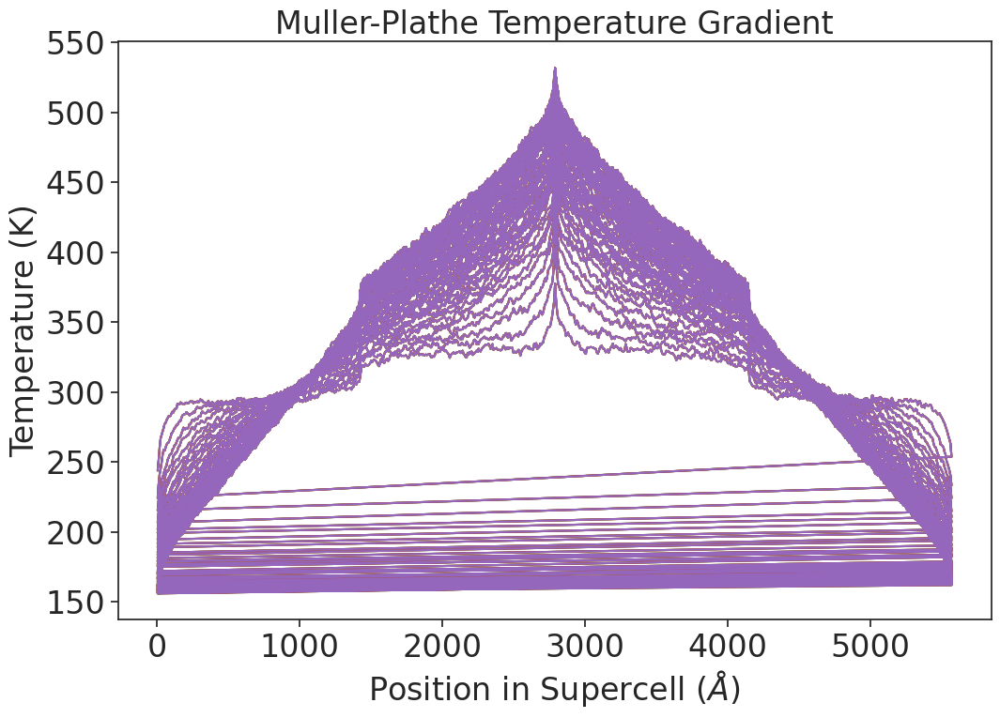

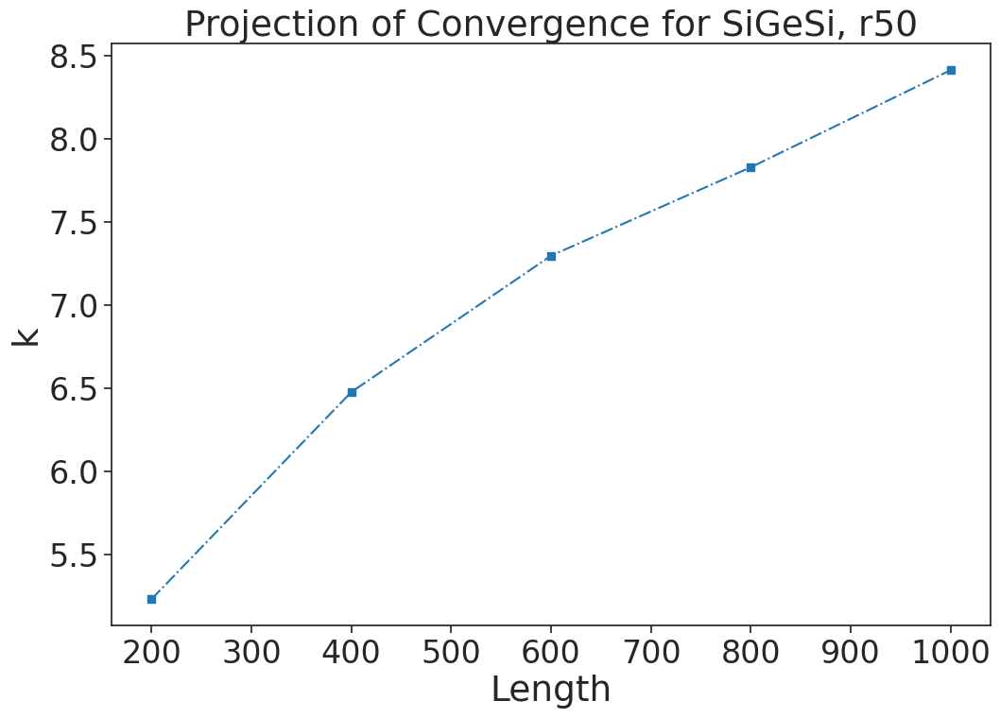

[3.8617430e-03 4.7316636e+00] 
 [-2.88073571e-06  7.31862586e-03  3.92505760e+00] 
 [ 4.97508333e-09 -1.18358857e-05  1.20151045e-02  3.25640640e+00]
[-1.000000e-03  1.999994e+02  3.999998e+02  6.000002e+02  8.000006e+02
  1.000001e+03]
Intercept of cubic polyfit: [ 4.97508333e-09 -1.18358857e-05  1.20151045e-02  3.25640640e+00]
Intercept of linear polyfit: [3.8617430e-03 4.7316636e+00]
Standard error of size 200: 0.12312286684979566
Standard error of size 400: 0.009055877711464535
Standard error of size 600: 0.029542580966399112
Standard error of size 800: 0.09259831249879773
Standard error of size 1000: 0.06940678486038838


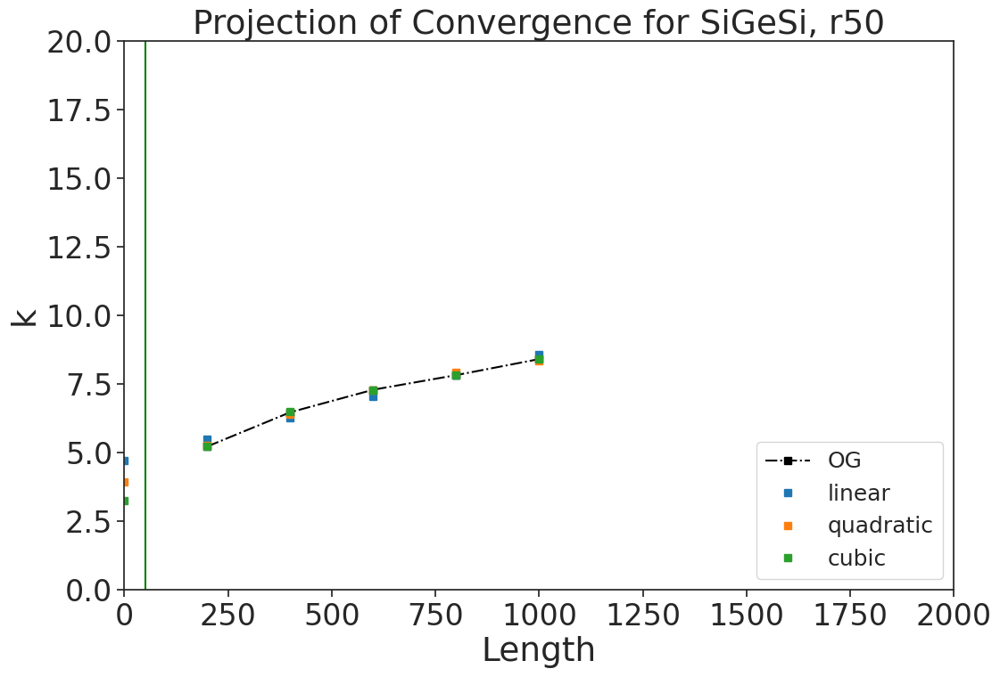

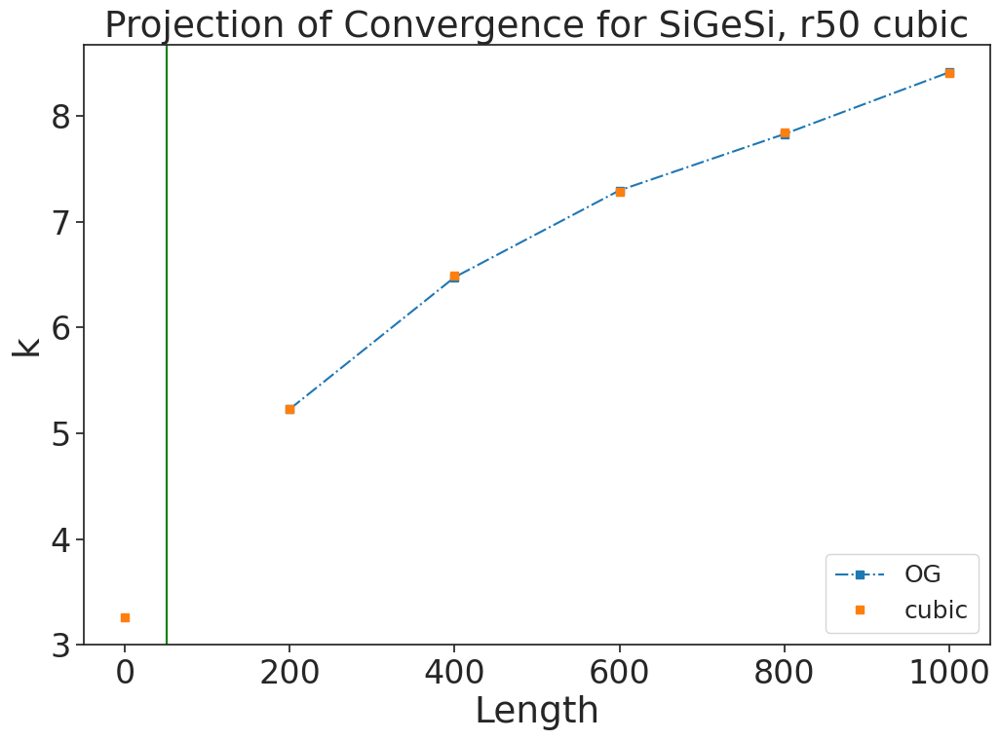

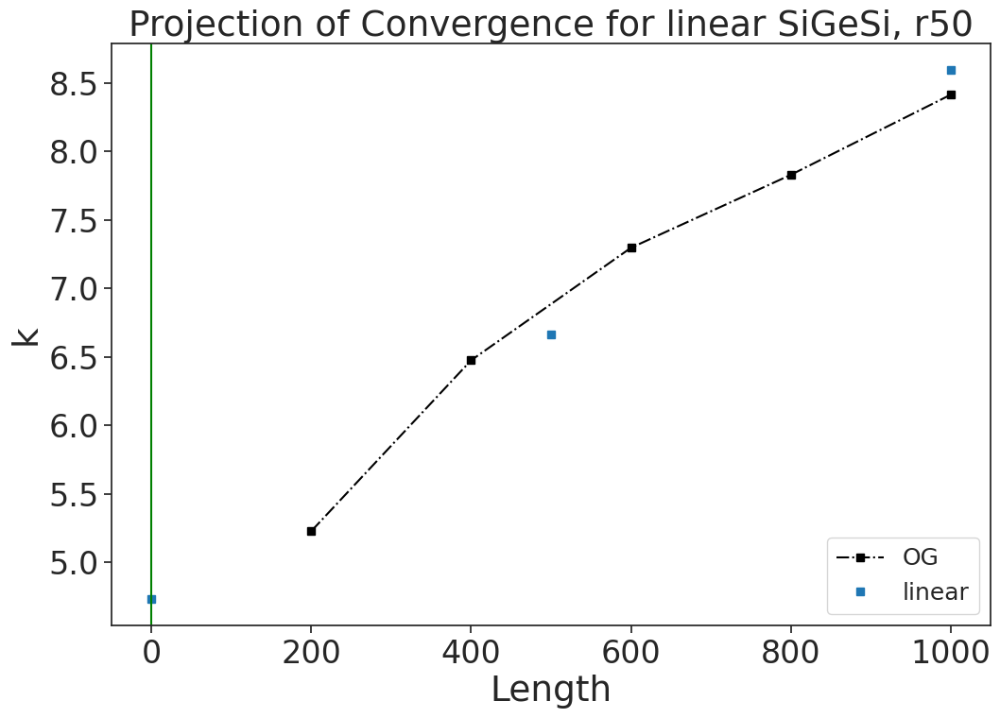

In [22]:

# load profile data 

filename = ['./profile_geE200r50','profile_geE400r50','profile_geE600r50',
           'profile_geE800r50','profile_geE1000r50']
#print(np.shape(filename))



MP_Profile = []; MP_Ave = []; MP_LastN = []; 

for simNo in range(0,len(filename)):
    subprocess.call(r"perl -p -e 's/^[\ \t]+|[\ \t]+$//g' %s > %s_new" % (filename[simNo], filename[simNo]), shell=True) # remove trailling white spaces
    subprocess.call("mv %s_new %s" % (filename[simNo], filename[simNo]), shell=True)
    subprocess.call("tr -s ' ' < %s > %s_tmp " % (filename[simNo], filename[simNo]), shell=True) #squeeze spaces
    subprocess.call("mv %s_tmp %s" % (filename[simNo], filename[simNo]), shell=True)

    profile = []; N = 800;
    with open(filename[simNo], 'r') as f:
        while True:
            lines = list(itertools.islice(f, 1, N+1))
            for line in lines:
                profile.append(line.split(' '))
            if not lines: 
                break
                
    lastN = profile[-N:] 
    lastAve = profile[-3200:]
    #print(lastAve)

    MP_Profile.append(profile)
    MP_LastN.append(lastN)
    MP_Ave.append(lastAve)
    
MP_Profile = np.array(MP_Profile, dtype=float) # for plotting 3D graphs
#print(MP_Profile)

MP_LastN = np.array(MP_LastN, dtype=float) # for calculating the thermal conductivity
#print(MP_LastN)



MP_Ave = np.array(MP_Ave, dtype=float) # for averaging the data to calculate the thermal conductivity
print(np.shape(MP_Profile))
#print(np.shape(MP_LastN))
print(np.shape(MP_Ave))

Thermo_Data = np.array([np.loadtxt('./Thermo_geE200r50'),np.loadtxt('./Thermo_geE400r50'),np.loadtxt('./Thermo_geE600r50'),
                       np.loadtxt('./Thermo_geE800r50'),np.loadtxt('./Thermo_geE1000r50')], dtype = object)#
                        

labels = ['geE200', 'geE400', 'geE600', 'geE800','geE1000','geE1500', 'ge2000'] 

print(np.shape(Thermo_Data))
#print(np.shape(Pristine_Thermo))

Sim_no_dataset = [1,1,1,1,1,1,1,1,1]
Time_no_dataset = [6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000]
Interval_no_dataset = [0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3]
mxc_no_dataset = [10,10,10,10,10,10,10,10,10]

for simNo in range(0, len(MP_Profile)):
    Coordinates = MP_Profile[simNo,:,1]*(Thermo_Data[simNo,-1,9])
    #print(Coordinates)
    Temperature = MP_Profile[simNo,:,3]
    #print(Temperature)

fig = plt.figure(figsize=(12,8))
for k in range(0, len(MP_Profile)):
    plt.plot(Coordinates[:], Temperature[:], color=colors[k], label=labels[k])
    
plt.xlabel(r'Position in Supercell ($\AA$)')
plt.ylabel('Temperature (K)')
plt.title('Muller-Plathe Temperature Gradient', fontsize = 24)
#plt.savefig('MullerPlathe_PristineSi200.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
#plt.show

# Load the data that will be averaged to calculate the slopes 

Temperature = []; Coordinate = []; dX_Thermo = [];

for simNo in range(0, len(filename)):
    
    dX_ = Thermo_Data[simNo,-1,9]
    dX_Thermo.append(dX_)
    
    for i in range(0,800):
        Temperature_ = np.mean([MP_Ave[simNo,i,3],MP_Ave[simNo,i+800,3],MP_Ave[simNo,i+1600,3],MP_Ave[simNo,i+2400,3]])   
        Temperature.append(Temperature_)
        Coordinate_ = np.mean([MP_Ave[simNo,i,1],MP_Ave[simNo,i+800,1],MP_Ave[simNo,i+1600,1],MP_Ave[simNo,i+2400,1]])*dX_
        Coordinate.append(Coordinate_)
    
Temperature = np.array([Temperature[0:800],Temperature[800:1600],Temperature[1600:2400],
                        Temperature[2400:3200],Temperature[3200:4000]], dtype=float)#, Temperature[2400:3200], 
                        #,Temperature[4000:4800],Temperature[4800:5600]], dtype=float)
Coordinate = np.array([Coordinate[0:800],Coordinate[800:1600],Coordinate[1600:2400],
                      Coordinate[2400:3200],Coordinate[3200:4000]], dtype=float)#, Coordinate[2400:3200], 
                      #,Coordinate[4000:4800],Coordinate[4800:5600]], dtype=float)



print(np.shape(Coordinate))
print(np.shape(Temperature))

#print(dX_Thermo)

excluded_points1 = 230 # excluded points from the beginning
excluded_points2 = 40 # excluded points from the end
excluded_points3 = 20
excluded_points4 = 230 # from the end of the mp.data file

slope2_mean = []; slope2 = []; slope1_mean = []; slope1 = []; average_temp_Ge50 = [];
# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff

for simNo in range(0,len(filename)):
    
    dTemp = Temperature[simNo,:]
    X = dX_
    dX = Coordinate[simNo,:] #*X # normalized distance
    
    #T_fit_left = np.polyfit(dX[280:380], dTemp[280:380], 1)
    #T_fit_right = -np.polyfit(dX[360:-280], dTemp[360:-280], 1)
    
    T_fit_left = np.polyfit(dX[excluded_points1:400-excluded_points2], dTemp[excluded_points1:400-excluded_points2], 1)
    T_fit_right = -np.polyfit(dX[400+excluded_points2:-excluded_points1], dTemp[400+excluded_points2:-excluded_points1], 1)
    
    slope2.append([T_fit_left[0], T_fit_right[0]])
    #print(slope2)
    print('Top Slope', labels[simNo], ' = ', T_fit_left[0], T_fit_right[0])

    mean_slope = np.mean([abs(T_fit_left[0]), abs(T_fit_right[0])], axis = 0)
    slope2_mean.append(mean_slope)
    print('Top Slope Mean', labels[simNo], ' = ', slope2_mean[0])
    
    B_fit_left2 = np.polyfit(dX[excluded_points3:400-excluded_points4], dTemp[excluded_points3:400-excluded_points4], 1)
    B_fit_right2 = -np.polyfit(dX[400+excluded_points4:-excluded_points3], dTemp[400+excluded_points4:-excluded_points3], 1)
    
    slope1.append([B_fit_left2[0], B_fit_right2[0]])
    print('Bottom Slope', labels[simNo], ' = ', B_fit_left2[0], B_fit_right2[0])
    
    mean_slope = np.mean([abs(B_fit_left2[0]), abs(B_fit_right2[0])], axis = 0)
    slope1_mean.append(mean_slope)
    print('Bottom Slope Mean', labels[simNo], ' = ', slope1_mean[0])
    
    average_temp = np.mean(dTemp)
    average_temp_Ge50.append(average_temp)

Slope1 = np.array(slope1)
Slope_mean1 = np.array(slope1_mean)
#print(Slope_mean1)

Slope2 = np.array(slope2)
Slope_mean2 = np.array(slope2_mean)
#print(Slope_mean2)

Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0)]) #individual
#Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0), np.mean([Slope_mean1[1], Slope_mean2[1]], axis =0), np.mean([Slope_mean1[2], Slope_mean2[2]], axis=0)])
print('Slope Mean', labels[simNo], ' = ', Slope_mean[0])

Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0]]) #individual
#Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0], Slope_mean[1]*dX_Thermo[1], Slope_mean[2]*dX_Thermo[2]])
print('Slope Average', labels[simNo], ' = ', Slope_ave[0])

# Calculate the heat flux and the thermal conductivity
eV2J  = 1.6e-19;
Ang2m =   1e-10;
ps2s  =   1e-12;
conversion = (eV2J/(Ang2m*ps2s))

s_values = []
ThermalsGe50 = []
dt = 0.0005 # picoseconds

# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff
for simNo in range(0, len(Thermo_Data)):
    
    Steps = Thermo_Data[simNo,-1,0]
    Time = Steps*dt # picoseconds
    
    dx = Thermo_Data[simNo,-1,9]
    dy = Thermo_Data[simNo,-1,10]
    dz = Thermo_Data[simNo,-1,11]
    Area = dy*dz
    
    #DeltaE = Thermo_Data[simNo,-1,-2] # E_pair
    #TotalE = Thermo_Data[simNo,-1,-5] # Total energy
    KinE = Thermo_Data[simNo,-1,12] # in log_lammps, f_3 
    
    Thermal_left2 = ((KinE)/(2*Time*Area*Slope2[simNo,0]))*conversion #top left
    Thermal_right2 = ((KinE)/(2*Time*Area*Slope2[simNo,1]))*conversion #top right
    
    Thermal_left1 = ((KinE)/(2*Time*Area*Slope1[simNo,0]))*conversion #bottom left
    Thermal_right1 = ((KinE)/(2*Time*Area*Slope1[simNo,1]))*conversion #bottom right
    
    thermal2 = np.concatenate((Thermal_left1, Thermal_left2), axis = None)
    thermal1 = np.concatenate((Thermal_right1, Thermal_right2), axis = None)
    
    thermal2_ave = ((KinE)/(2*Time*Area*Slope_mean2[simNo]))*conversion #top
    thermal1_ave = ((KinE)/(2*Time*Area*Slope_mean1[simNo]))*conversion #bottom
    
    #thermal_ave = ((KinE)/(2*Time*Area*Slope_ave[simNo]))*conversion
    thermal_ave = (thermal2_ave+thermal1_ave)/2
    
    getcontext().prec = 10
    std_top = Decimal(np.std([Thermal_left2, Thermal_right2], dtype=np.float64))
    SE_left = std_top/Decimal(math.sqrt(2))
   
    std_bottom = Decimal(np.std([Thermal_left1, Thermal_right1], dtype=np.float64))
    SE_right = std_bottom/Decimal(math.sqrt(2))
    
    SE = math.sqrt(((SE_left/2)**2) + ((SE_right/2)**2))
    print(SE)
   
    #print('Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2[0], thermal2[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2_ave)
    
    #print('Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1[0], thermal1[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1_ave)
    
    print('Average Thermal Conductivity of', labels[simNo], 'Average = ', thermal_ave) 
    
    Therm_val = [Thermal_left1,Thermal_left2,Thermal_right2,Thermal_right1]
    Ttherm = ['%.6f' % elem for elem in Therm_val]
    #print(Ttherm)
    ThermalsGe50.append(Ttherm)
    print('ThermalsGe50', labels[simNo], ' = ', Ttherm)
    
    
    TC_values = [thermal2_ave, thermal1_ave, thermal_ave, SE]
    val = ['%.6f' % elem for elem in TC_values]
    #print(val)
    s_values.append(val)
    print('s values', labels[simNo], ' = ', val)
    #print(simNo)
    

#print(s_values[3]))

#print(s_values)
#print(s_values[0]) #200
#print(s_values[1]) #400
#print(s_values[2]) #600
##print(s_values[3])) #800
#print(s_values[4]) #1000
#print(s_values[5]) #1500
#print(s_values[0][0])
therm_averageGe50 = []
for item in s_values:
    print(item[2])
    therm_averageGe50.append(item[2])

therm_averageGe50 = []
for item in s_values:
    print(float(item[2]))
    therm_averageGe50.append(np.array(float(item[2])))

#projection stuff

print(s_values)



#SIGESI r50
sizeGe50 = [200.0,400.0,600.0,800.0,1000.0]#,1500.0,2000.0]
sizeGe50 = np.array(sizeGe50)
#print(np.shape(sizeGe50))
print(sizeGe50)
Tc = [float(s_values[0][2]),float(s_values[1][2]),float(s_values[2][2]),
     float(s_values[3][2]),float(s_values[4][2])]#
     #,float(s_values[5][2]),float(s_values[6][2])]
Tc = np.array(Tc)
print(Tc)

inv_sizeGe50 = np.reciprocal(sizeGe50)
#np.set_printoptions(precision=10)
print(inv_sizeGe50)

inv_Tc = np.reciprocal(Tc)
print(inv_Tc)

#plot

fig = plt.figure(figsize=(12,8))

plt.plot(sizeGe50[:], Tc[:],'s-.')


plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r50', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r50.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show()



fig = plt.figure(figsize=(12,8))

x1 = np.array(sizeGe50)
mn = min(x1)
mx = max(x1)
#print(x1)
#print(len(x))

y1 = np.array(Tc)
#print(y1)

z1 = np.polyfit(x1, y1, 1) #np.polyfit(x, y, degree of polynomial), degree =1,2,3 is linear, quadratic, cubic
z2 = np.polyfit(x1, y1, 2)
z3 = np.polyfit(x1, y1, 3)

print(z1,'\n',z2,'\n',z3)
#xp = np.linspace(mn, mx, 6)
xp = np.linspace(-0.001, mx+0.001, 6)
print(xp)

p1 = np.poly1d(z1)
p2 = np.poly1d(z2)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

plt.plot(x1, y1, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')
plt.plot(xp, p2(xp), 's', label = 'quadratic')
plt.plot(xp, p3(xp), 's', label ='cubic') 

plt.axvline(x=50.0, color='green')

plt.legend(loc="lower right")

plt.xlim([0.0,2000])
plt.ylim([0.0,20])

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r50', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r50-lqc-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


fig = plt.figure(figsize=(12,8))

x_2 = np.array(sizeGe50)
mn = min(x_2)
mx = max(x_2)
#print(mn)
#print(len(x_2))

y_2 = np.array(Tc)
#print(y)

#xpp = np.linspace(-0.00005,mx, 6)
xpp = np.linspace(-0.0005,mx, 6)

plt.axvline(x=50.0, color='green')


z3 = np.polyfit(x_2, y_2, 3)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

##m, c; run by Laura
s = p3(1);
i = p3(2)    #The polyfit function for a linear (polynomial order 1) fit returns the slope as the first parameter
                    #and the intercept as the second parameter, so the output vector is [slope, intercept]. 
                    #It is like any other vector, so choose the one you want by indexing into it.
n = p3(0)
#print(s)
#print(i)
#print(n)

#slope_intercept = np.polyfit(x_2,y_2,1)
#print('Intercept of linear polyfit:',slope_intercept)
#slope_intercept = np.polyfit(x_2,y_2,2)
#print('Intercept of quad. polyfit:',slope_intercept)
slope_intercept = np.polyfit(x_2,y_2,3)
print('Intercept of cubic polyfit:',slope_intercept)
##

plt.plot(x_2,y_2, 's-.', label ='OG')
plt.plot(xpp, p3(xp), 's', label ='cubic') 
plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
#plt.ylim(-0.0002, 0.18)
plt.title(r'Projection of Convergence for SiGeSi, r50 cubic', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r50-c-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)



plt.show


#linear fit in linear region alone
fig = plt.figure(figsize=(12,8))

#x2 = [0.005,0.0025,0.00166667]
x2 = sizeGe50
x2 = np.array(x2)
y2 = Tc
#y2 = [0.16806723,0.13947001,0.11160714]
y2 = np.array(y2)


z = np.polyfit(x2, y2, 1) 
xp = np.linspace(-0.001, mx+0.001, 3)

p1 = np.poly1d(z)

slope_intercept = np.polyfit(x2,y2,1)
print('Intercept of linear polyfit:',slope_intercept)


plt.plot(x2, y2, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')

plt.axvline(x=0, color='green')

plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for linear SiGeSi, r50', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-linear-GeSiGe-r50-l-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


#SiGeSi values

SE200b_left = np.std([float(ThermalsGe50[0][1]), float(ThermalsGe50[0][2])], dtype=np.float64)
SE200_left = SE200b_left/math.sqrt(2)
SE200b_right = np.std([float(ThermalsGe50[0][0]), float(ThermalsGe50[0][3])], dtype=np.float64)
SE200_right = SE200b_right/math.sqrt(2)
standard_error200b50 = math.sqrt(((SE200_left/2)**2) + ((SE200_right/2)**2))
print('Standard error of size 200:',standard_error200b50)

SE400b_left = np.std([float(ThermalsGe50[1][1]), float(ThermalsGe50[1][2])], dtype=np.float64)
SE400_left = SE400b_left/math.sqrt(2)
SE400b_right = np.std([float(ThermalsGe50[1][0]), float(ThermalsGe50[1][3])], dtype=np.float64)
SE400_right = SE400b_right/math.sqrt(2)
standard_error400b50 = math.sqrt(((SE400_left/2)**2) + ((SE400_right/2)**2))
print('Standard error of size 400:',standard_error400b50)

SE600b_left = np.std([float(ThermalsGe50[2][1]), float(ThermalsGe50[2][2])], dtype=np.float64)
SE600_left = SE600b_left/math.sqrt(2)
SE600b_right = np.std([float(ThermalsGe50[2][0]), float(ThermalsGe50[2][3])], dtype=np.float64)
SE600_right = SE600b_right/math.sqrt(2)
standard_error600b50 = math.sqrt(((SE600_left/2)**2) + ((SE600_right/2)**2))
print('Standard error of size 600:',standard_error600b50)


SE800b_left = np.std([float(ThermalsGe50[3][1]), float(ThermalsGe50[3][2])], dtype=np.float64)
SE800_left = SE800b_left/math.sqrt(2)
SE800b_right = np.std([float(ThermalsGe50[3][0]), float(ThermalsGe50[3][3])], dtype=np.float64)
SE800_right = SE800b_right/math.sqrt(2)
standard_error800b50 = math.sqrt(((SE800_left/2)**2) + ((SE800_right/2)**2))
print('Standard error of size 800:',standard_error800b50)

SE1000b_left = np.std([float(ThermalsGe50[4][1]), float(ThermalsGe50[4][2])], dtype=np.float64)
SE1000_left = SE1000b_left/math.sqrt(2)
SE1000b_right = np.std([float(ThermalsGe50[4][0]), float(ThermalsGe50[4][3])], dtype=np.float64)
SE1000_right = SE1000b_right/math.sqrt(2)
standard_error1000b50 = math.sqrt(((SE1000_left/2)**2) + ((SE1000_right/2)**2))
print('Standard error of size 1000:',standard_error1000b50)
'''
SE1500b_left = np.std([float(ThermalsGe50[5][1]), float(ThermalsGe50[5][2])], dtype=np.float64)
SE1500_left = SE1500b_left/math.sqrt(2)
SE1500b_right = np.std([float(ThermalsGe50[5][0]), float(ThermalsGe50[5][3])], dtype=np.float64)
SE1500_right = SE1500b_right/math.sqrt(2)
standard_error1500b50 = math.sqrt(((SE1500_left/2)**2) + ((SE1500_right/2)**2))
print('Standard error of size 1500:',standard_error1500b50)

SE2000b_left = np.std([float(ThermalsGe50[6][1]), float(ThermalsGe50[6][2])], dtype=np.float64)
SE2000_left = SE2000b_left/math.sqrt(2)
SE2000b_right = np.std([float(ThermalsGe50[6][0]), float(ThermalsGe50[6][3])], dtype=np.float64)
SE2000_right = SE2000b_right/math.sqrt(2)
standard_error2000b50 = math.sqrt(((SE2000_left/2)**2) + ((SE2000_right/2)**2))
print('Standard error of size 2000:',standard_error2000b50)

yerrGe1500b50 = standard_error1500b50
yerrGe2000b50 = standard_error2000b50


#projection of convergence for SiGeSi
#https://math.stackexchange.com/questions/3217622/how-does-inverting-data-change-standaro-deviation
'''
yerrGe200b50 = standard_error200b50
yerrGe400b50 = standard_error400b50
yerrGe600b50 = standard_error600b50
yerrGe800b50 = standard_error800b50
yerrGe1000b50 = standard_error1000b50


In [23]:
#125

(5, 48000, 4)
(5, 3200, 4)
(5, 61, 14)
(5, 800)
(5, 800)
Top Slope geE200  =  0.16589373585566136 0.19948629259598416
Top Slope Mean geE200  =  0.18269001422582276
Bottom Slope geE200  =  0.27117296373400096 0.24287396208388495
Bottom Slope Mean geE200  =  0.25702346290894296
Top Slope geE400  =  0.13472992028715755 0.13816458169188625
Top Slope Mean geE400  =  0.18269001422582276
Bottom Slope geE400  =  0.1930394377227925 0.19030366472523516
Bottom Slope Mean geE400  =  0.25702346290894296
Top Slope geE600  =  0.11185676385665376 0.10878169685905562
Top Slope Mean geE600  =  0.18269001422582276
Bottom Slope geE600  =  0.15668156510704728 0.15257321481131964
Bottom Slope Mean geE600  =  0.25702346290894296
Top Slope geE800  =  0.10057882470353288 0.09751968260945192
Top Slope Mean geE800  =  0.18269001422582276
Bottom Slope geE800  =  0.1369360848413545 0.13575672513466322
Bottom Slope Mean geE800  =  0.25702346290894296
Top Slope geE1000  =  0.08712387517446983 0.09070898572379801
Top

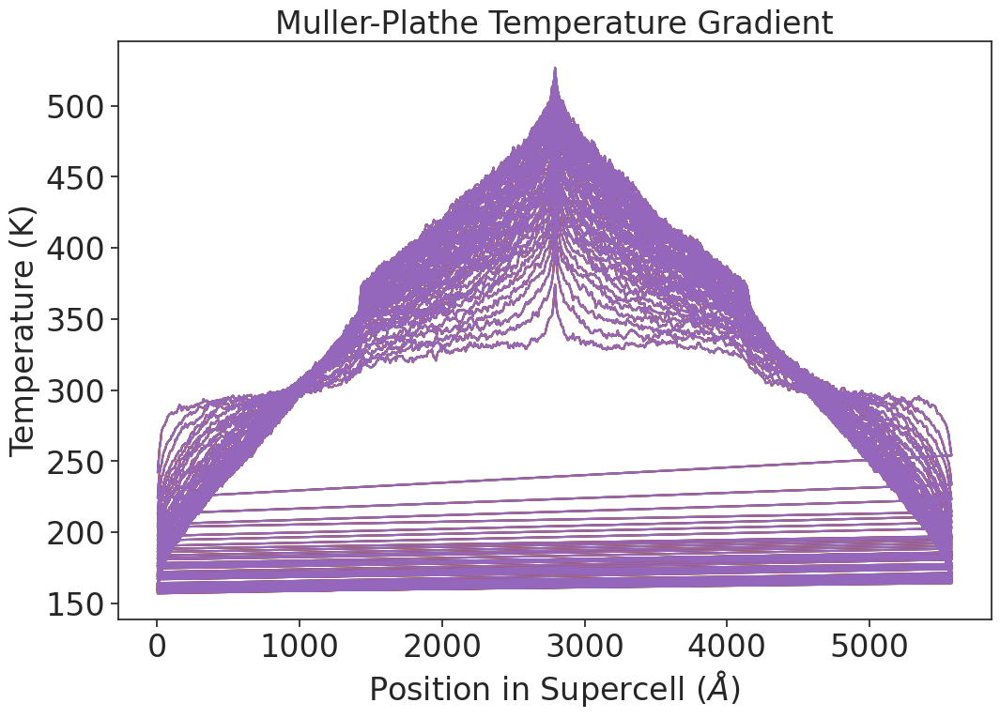

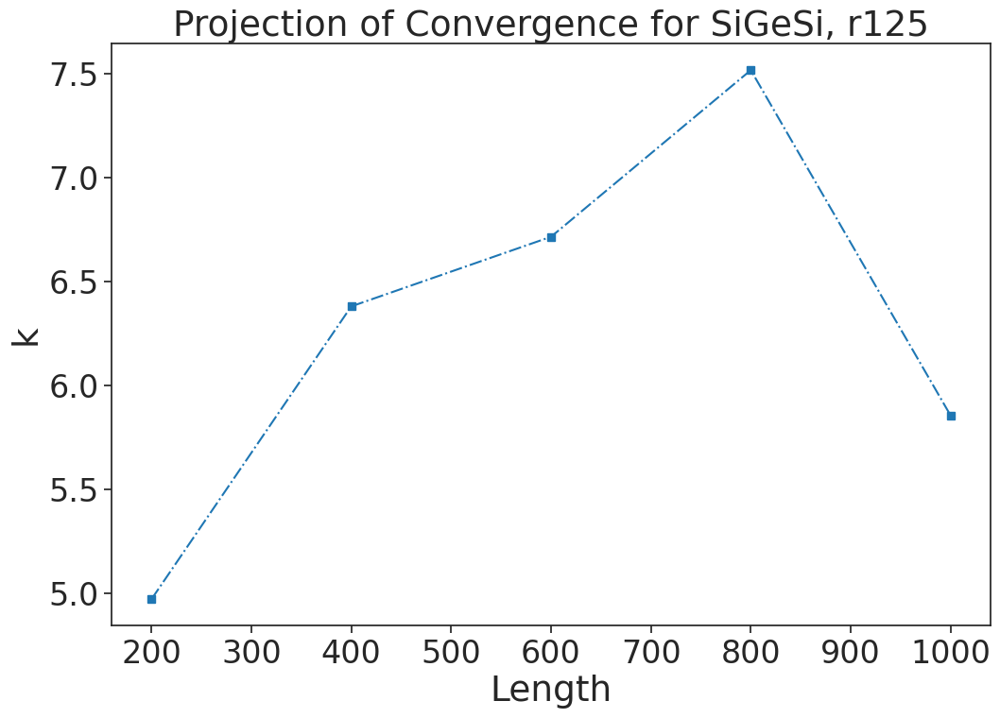

[1.4518255e-03 5.4178047e+00] 
 [-1.01296625e-05  1.36074205e-02  2.58149920e+00] 
 [-1.44682500e-08  1.59131875e-05 -5.06075000e-05  4.52603200e+00]
[-1.000000e-03  1.999994e+02  3.999998e+02  6.000002e+02  8.000006e+02
  1.000001e+03]
Intercept of cubic polyfit: [-1.44682500e-08  1.59131875e-05 -5.06075000e-05  4.52603200e+00]
Intercept of linear polyfit: [1.4518255e-03 5.4178047e+00]
Standard error of size 200: 0.20695074438876154
Standard error of size 400: 0.03578114327844348
Standard error of size 600: 0.04672321483614972
Standard error of size 800: 0.04853319916304709
Standard error of size 1000: 0.05170955336812772


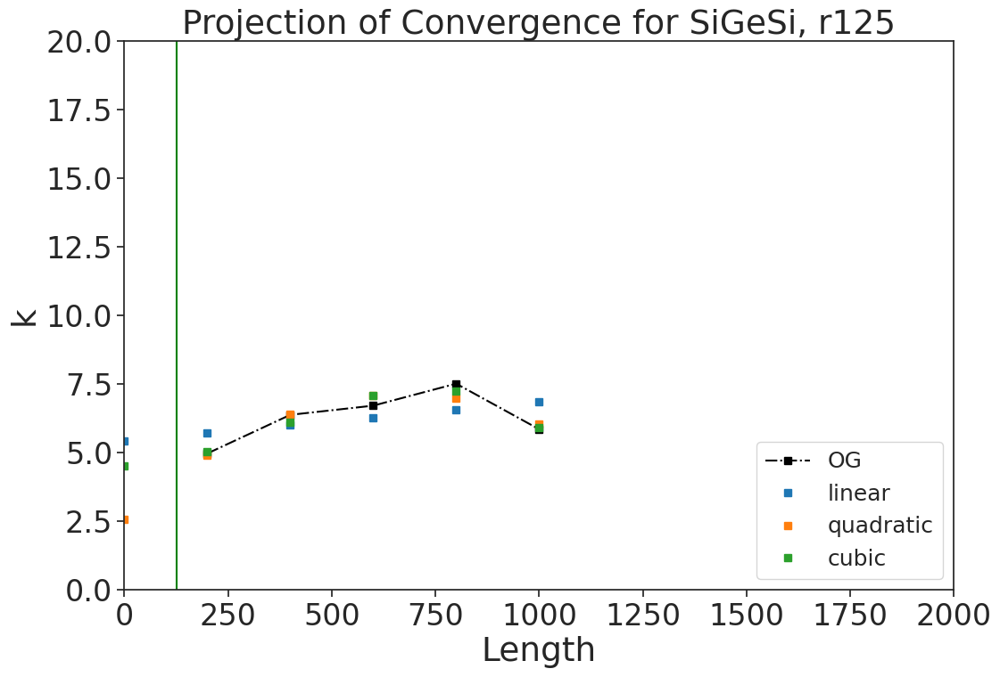

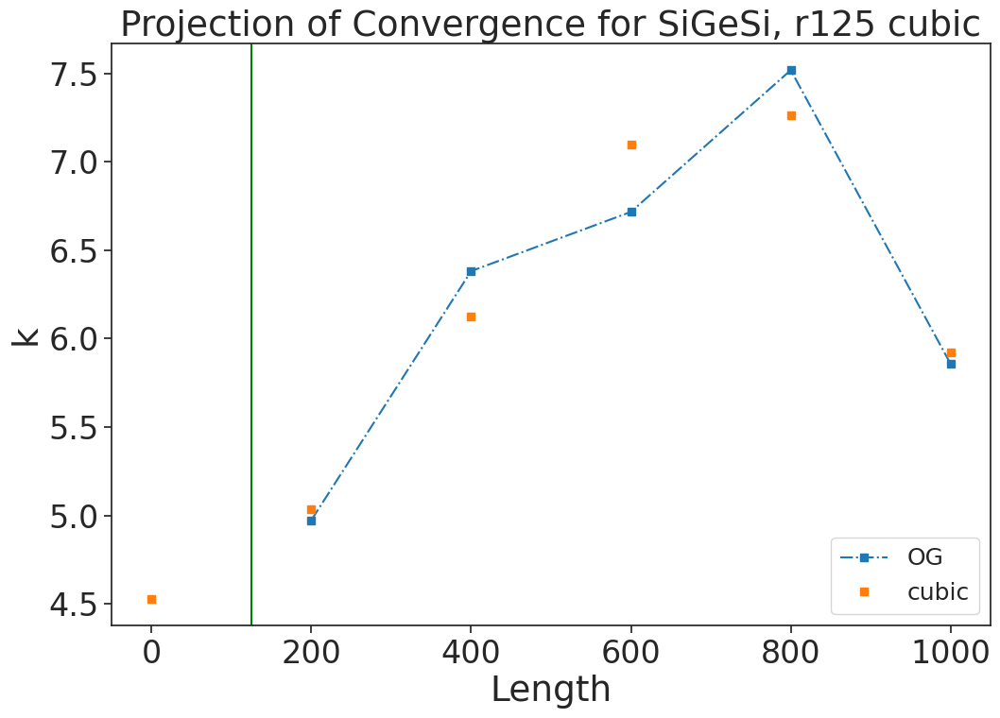

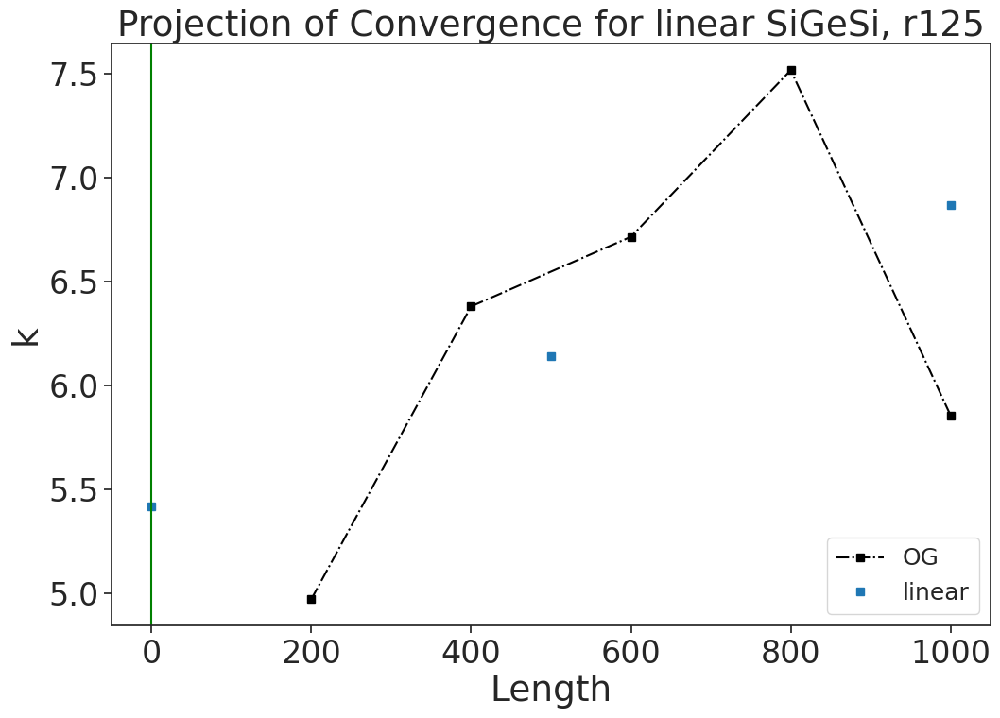

In [24]:

# load profile data 

filename = ['./profile_geE200r125','profile_geE400r125','profile_geE600r125',
           'profile_geE800r125','profile_geE1000r125']
#print(np.shape(filename))



MP_Profile = []; MP_Ave = []; MP_LastN = []; 

for simNo in range(0,len(filename)):
    subprocess.call(r"perl -p -e 's/^[\ \t]+|[\ \t]+$//g' %s > %s_new" % (filename[simNo], filename[simNo]), shell=True) # remove trailling white spaces
    subprocess.call("mv %s_new %s" % (filename[simNo], filename[simNo]), shell=True)
    subprocess.call("tr -s ' ' < %s > %s_tmp " % (filename[simNo], filename[simNo]), shell=True) #squeeze spaces
    subprocess.call("mv %s_tmp %s" % (filename[simNo], filename[simNo]), shell=True)

    profile = []; N = 800;
    with open(filename[simNo], 'r') as f:
        while True:
            lines = list(itertools.islice(f, 1, N+1))
            for line in lines:
                profile.append(line.split(' '))
            if not lines: 
                break
                
    lastN = profile[-N:] 
    lastAve = profile[-3200:]
    #print(lastAve)

    MP_Profile.append(profile)
    MP_LastN.append(lastN)
    MP_Ave.append(lastAve)
    
MP_Profile = np.array(MP_Profile, dtype=float) # for plotting 3D graphs
#print(MP_Profile)

MP_LastN = np.array(MP_LastN, dtype=float) # for calculating the thermal conductivity
#print(MP_LastN)



MP_Ave = np.array(MP_Ave, dtype=float) # for averaging the data to calculate the thermal conductivity
print(np.shape(MP_Profile))
#print(np.shape(MP_LastN))
print(np.shape(MP_Ave))

Thermo_Data = np.array([np.loadtxt('./Thermo_geE200r125'),np.loadtxt('./Thermo_geE400r125'),np.loadtxt('./Thermo_geE600r125'),
                       np.loadtxt('./Thermo_geE800r125'),np.loadtxt('./Thermo_geE1000r125')], dtype = object)#
                        

labels = ['geE200', 'geE400', 'geE600', 'geE800','geE1000','geE1500', 'ge2000'] 

print(np.shape(Thermo_Data))
#print(np.shape(Pristine_Thermo))

Sim_no_dataset = [1,1,1,1,1,1,1,1,1]
Time_no_dataset = [6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000]
Interval_no_dataset = [0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3]
mxc_no_dataset = [10,10,10,10,10,10,10,10,10]

for simNo in range(0, len(MP_Profile)):
    Coordinates = MP_Profile[simNo,:,1]*(Thermo_Data[simNo,-1,9])
    #print(Coordinates)
    Temperature = MP_Profile[simNo,:,3]
    #print(Temperature)

fig = plt.figure(figsize=(12,8))
for k in range(0, len(MP_Profile)):
    plt.plot(Coordinates[:], Temperature[:], color=colors[k], label=labels[k])
    
plt.xlabel(r'Position in Supercell ($\AA$)')
plt.ylabel('Temperature (K)')
plt.title('Muller-Plathe Temperature Gradient', fontsize = 24)
#plt.savefig('MullerPlathe_PristineSi200.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
#plt.show

# Load the data that will be averaged to calculate the slopes 

Temperature = []; Coordinate = []; dX_Thermo = [];

for simNo in range(0, len(filename)):
    
    dX_ = Thermo_Data[simNo,-1,9]
    dX_Thermo.append(dX_)
    
    for i in range(0,800):
        Temperature_ = np.mean([MP_Ave[simNo,i,3],MP_Ave[simNo,i+800,3],MP_Ave[simNo,i+1600,3],MP_Ave[simNo,i+2400,3]])   
        Temperature.append(Temperature_)
        Coordinate_ = np.mean([MP_Ave[simNo,i,1],MP_Ave[simNo,i+800,1],MP_Ave[simNo,i+1600,1],MP_Ave[simNo,i+2400,1]])*dX_
        Coordinate.append(Coordinate_)
    
Temperature = np.array([Temperature[0:800],Temperature[800:1600],Temperature[1600:2400],
                        Temperature[2400:3200],Temperature[3200:4000]], dtype=float)#, Temperature[2400:3200], 
                        #,Temperature[4000:4800],Temperature[4800:5600]], dtype=float)
Coordinate = np.array([Coordinate[0:800],Coordinate[800:1600],Coordinate[1600:2400],
                      Coordinate[2400:3200],Coordinate[3200:4000]], dtype=float)#, Coordinate[2400:3200], 
                      #,Coordinate[4000:4800],Coordinate[4800:5600]], dtype=float)



print(np.shape(Coordinate))
print(np.shape(Temperature))

#print(dX_Thermo)

excluded_points1 = 230 # excluded points from the beginning
excluded_points2 = 40 # excluded points from the end
excluded_points3 = 20
excluded_points4 = 230 # from the end of the mp.data file

slope2_mean = []; slope2 = []; slope1_mean = []; slope1 = []; average_temp_Ge125 = [];
# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff

for simNo in range(0,len(filename)):
    
    dTemp = Temperature[simNo,:]
    X = dX_
    dX = Coordinate[simNo,:] #*X # normalized distance
    
    #T_fit_left = np.polyfit(dX[280:380], dTemp[280:380], 1)
    #T_fit_right = -np.polyfit(dX[360:-280], dTemp[360:-280], 1)
    
    T_fit_left = np.polyfit(dX[excluded_points1:400-excluded_points2], dTemp[excluded_points1:400-excluded_points2], 1)
    T_fit_right = -np.polyfit(dX[400+excluded_points2:-excluded_points1], dTemp[400+excluded_points2:-excluded_points1], 1)
    
    slope2.append([T_fit_left[0], T_fit_right[0]])
    #print(slope2)
    print('Top Slope', labels[simNo], ' = ', T_fit_left[0], T_fit_right[0])

    mean_slope = np.mean([abs(T_fit_left[0]), abs(T_fit_right[0])], axis = 0)
    slope2_mean.append(mean_slope)
    print('Top Slope Mean', labels[simNo], ' = ', slope2_mean[0])
    
    B_fit_left2 = np.polyfit(dX[excluded_points3:400-excluded_points4], dTemp[excluded_points3:400-excluded_points4], 1)
    B_fit_right2 = -np.polyfit(dX[400+excluded_points4:-excluded_points3], dTemp[400+excluded_points4:-excluded_points3], 1)
    
    slope1.append([B_fit_left2[0], B_fit_right2[0]])
    print('Bottom Slope', labels[simNo], ' = ', B_fit_left2[0], B_fit_right2[0])
    
    mean_slope = np.mean([abs(B_fit_left2[0]), abs(B_fit_right2[0])], axis = 0)
    slope1_mean.append(mean_slope)
    print('Bottom Slope Mean', labels[simNo], ' = ', slope1_mean[0])
    
    average_temp = np.mean(dTemp)
    average_temp_Ge125.append(average_temp)

Slope1 = np.array(slope1)
Slope_mean1 = np.array(slope1_mean)
#print(Slope_mean1)

Slope2 = np.array(slope2)
Slope_mean2 = np.array(slope2_mean)
#print(Slope_mean2)

Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0)]) #individual
#Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0), np.mean([Slope_mean1[1], Slope_mean2[1]], axis =0), np.mean([Slope_mean1[2], Slope_mean2[2]], axis=0)])
print('Slope Mean', labels[simNo], ' = ', Slope_mean[0])

Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0]]) #individual
#Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0], Slope_mean[1]*dX_Thermo[1], Slope_mean[2]*dX_Thermo[2]])
print('Slope Average', labels[simNo], ' = ', Slope_ave[0])

# Calculate the heat flux and the thermal conductivity
eV2J  = 1.6e-19;
Ang2m =   1e-10;
ps2s  =   1e-12;
conversion = (eV2J/(Ang2m*ps2s))

s_values = []
ThermalsGe125 = []
dt = 0.0005 # picoseconds

# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff
for simNo in range(0, len(Thermo_Data)):
    
    Steps = Thermo_Data[simNo,-1,0]
    Time = Steps*dt # picoseconds
    
    dx = Thermo_Data[simNo,-1,9]
    dy = Thermo_Data[simNo,-1,10]
    dz = Thermo_Data[simNo,-1,11]
    Area = dy*dz
    
    #DeltaE = Thermo_Data[simNo,-1,-2] # E_pair
    #TotalE = Thermo_Data[simNo,-1,-5] # Total energy
    KinE = Thermo_Data[simNo,-1,12] # in log_lammps, f_3 
    
    Thermal_left2 = ((KinE)/(2*Time*Area*Slope2[simNo,0]))*conversion #top left
    Thermal_right2 = ((KinE)/(2*Time*Area*Slope2[simNo,1]))*conversion #top right
    
    Thermal_left1 = ((KinE)/(2*Time*Area*Slope1[simNo,0]))*conversion #bottom left
    Thermal_right1 = ((KinE)/(2*Time*Area*Slope1[simNo,1]))*conversion #bottom right
    
    thermal2 = np.concatenate((Thermal_left1, Thermal_left2), axis = None)
    thermal1 = np.concatenate((Thermal_right1, Thermal_right2), axis = None)
    
    thermal2_ave = ((KinE)/(2*Time*Area*Slope_mean2[simNo]))*conversion #top
    thermal1_ave = ((KinE)/(2*Time*Area*Slope_mean1[simNo]))*conversion #bottom
    
    #thermal_ave = ((KinE)/(2*Time*Area*Slope_ave[simNo]))*conversion
    thermal_ave = (thermal2_ave+thermal1_ave)/2
    
    getcontext().prec = 10
    std_top = Decimal(np.std([Thermal_left2, Thermal_right2], dtype=np.float64))
    SE_left = std_top/Decimal(math.sqrt(2))
   
    std_bottom = Decimal(np.std([Thermal_left1, Thermal_right1], dtype=np.float64))
    SE_right = std_bottom/Decimal(math.sqrt(2))
    
    SE = math.sqrt(((SE_left/2)**2) + ((SE_right/2)**2))
    print(SE)
   
    #print('Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2[0], thermal2[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2_ave)
    
    #print('Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1[0], thermal1[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1_ave)
    
    print('Average Thermal Conductivity of', labels[simNo], 'Average = ', thermal_ave) 
    
    Therm_val = [Thermal_left1,Thermal_left2,Thermal_right2,Thermal_right1]
    Ttherm = ['%.6f' % elem for elem in Therm_val]
    #print(Ttherm)
    ThermalsGe125.append(Ttherm)
    print('ThermalsGe125', labels[simNo], ' = ', Ttherm)
    
    
    TC_values = [thermal2_ave, thermal1_ave, thermal_ave, SE]
    val = ['%.6f' % elem for elem in TC_values]
    #print(val)
    s_values.append(val)
    print('s values', labels[simNo], ' = ', val)
    #print(simNo)
    

#print(s_values[3]))

#print(s_values)
#print(s_values[0]) #200
#print(s_values[1]) #400
#print(s_values[2]) #600
##print(s_values[3])) #800
#print(s_values[4]) #1000
#print(s_values[5]) #1500
#print(s_values[0][0])
therm_averageGe125 = []
for item in s_values:
    print(item[2])
    therm_averageGe125.append(item[2])

therm_averageGe125 = []
for item in s_values:
    print(float(item[2]))
    therm_averageGe125.append(np.array(float(item[2])))

#projection stuff

print(s_values)



#SIGESI r125
sizeGe125 = [200.0,400.0,600.0,800.0,1000.0]#,1500.0,2000.0]
sizeGe125 = np.array(sizeGe125)
#print(np.shape(sizeGe125))
print(sizeGe125)
Tc = [float(s_values[0][2]),float(s_values[1][2]),float(s_values[2][2]),
     float(s_values[3][2]),float(s_values[4][2])]#
     #,float(s_values[5][2]),float(s_values[6][2])]
Tc = np.array(Tc)
print(Tc)

inv_sizeGe125 = np.reciprocal(sizeGe125)
#np.set_printoptions(precision=10)
print(inv_sizeGe125)

inv_Tc = np.reciprocal(Tc)
print(inv_Tc)

#plot

fig = plt.figure(figsize=(12,8))

plt.plot(sizeGe125[:], Tc[:],'s-.')


plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r125', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r125.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show()



fig = plt.figure(figsize=(12,8))

x1 = np.array(sizeGe125)
mn = min(x1)
mx = max(x1)
#print(x1)
#print(len(x))

y1 = np.array(Tc)
#print(y1)

z1 = np.polyfit(x1, y1, 1) #np.polyfit(x, y, degree of polynomial), degree =1,2,3 is linear, quadratic, cubic
z2 = np.polyfit(x1, y1, 2)
z3 = np.polyfit(x1, y1, 3)

print(z1,'\n',z2,'\n',z3)
#xp = np.linspace(mn, mx, 6)
xp = np.linspace(-0.001, mx+0.001, 6)
print(xp)

p1 = np.poly1d(z1)
p2 = np.poly1d(z2)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

plt.plot(x1, y1, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')
plt.plot(xp, p2(xp), 's', label = 'quadratic')
plt.plot(xp, p3(xp), 's', label ='cubic') 

plt.axvline(x=125.0, color='green')

plt.legend(loc="lower right")

plt.xlim([0.0,2000])
plt.ylim([0.0,20])

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r125', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r125-lqc-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


fig = plt.figure(figsize=(12,8))

x_2 = np.array(sizeGe125)
mn = min(x_2)
mx = max(x_2)
#print(mn)
#print(len(x_2))

y_2 = np.array(Tc)
#print(y)

#xpp = np.linspace(-0.00005,mx, 6)
xpp = np.linspace(-0.0005,mx, 6)

plt.axvline(x=125.0, color='green')


z3 = np.polyfit(x_2, y_2, 3)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

##m, c; run by Laura
s = p3(1);
i = p3(2)    #The polyfit function for a linear (polynomial order 1) fit returns the slope as the first parameter
                    #and the intercept as the second parameter, so the output vector is [slope, intercept]. 
                    #It is like any other vector, so choose the one you want by indexing into it.
n = p3(0)
#print(s)
#print(i)
#print(n)

#slope_intercept = np.polyfit(x_2,y_2,1)
#print('Intercept of linear polyfit:',slope_intercept)
#slope_intercept = np.polyfit(x_2,y_2,2)
#print('Intercept of quad. polyfit:',slope_intercept)
slope_intercept = np.polyfit(x_2,y_2,3)
print('Intercept of cubic polyfit:',slope_intercept)
##

plt.plot(x_2,y_2, 's-.', label ='OG')
plt.plot(xpp, p3(xp), 's', label ='cubic') 
plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
#plt.ylim(-0.0002, 0.18)
plt.title(r'Projection of Convergence for SiGeSi, r125 cubic', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r125-c-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)



plt.show


#linear fit in linear region alone
fig = plt.figure(figsize=(12,8))

#x2 = [0.005,0.0025,0.00166667]
x2 = sizeGe125
x2 = np.array(x2)
y2 = Tc
#y2 = [0.16806723,0.13947001,0.11160714]
y2 = np.array(y2)


z = np.polyfit(x2, y2, 1) 
xp = np.linspace(-0.001, mx+0.001, 3)

p1 = np.poly1d(z)

slope_intercept = np.polyfit(x2,y2,1)
print('Intercept of linear polyfit:',slope_intercept)


plt.plot(x2, y2, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')

plt.axvline(x=0, color='green')

plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for linear SiGeSi, r125', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-linear-GeSiGe-r125-l-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


#SiGeSi values

SE200b_left = np.std([float(ThermalsGe125[0][1]), float(ThermalsGe125[0][2])], dtype=np.float64)
SE200_left = SE200b_left/math.sqrt(2)
SE200b_right = np.std([float(ThermalsGe125[0][0]), float(ThermalsGe125[0][3])], dtype=np.float64)
SE200_right = SE200b_right/math.sqrt(2)
standard_error200b125 = math.sqrt(((SE200_left/2)**2) + ((SE200_right/2)**2))
print('Standard error of size 200:',standard_error200b125)

SE400b_left = np.std([float(ThermalsGe125[1][1]), float(ThermalsGe125[1][2])], dtype=np.float64)
SE400_left = SE400b_left/math.sqrt(2)
SE400b_right = np.std([float(ThermalsGe125[1][0]), float(ThermalsGe125[1][3])], dtype=np.float64)
SE400_right = SE400b_right/math.sqrt(2)
standard_error400b125 = math.sqrt(((SE400_left/2)**2) + ((SE400_right/2)**2))
print('Standard error of size 400:',standard_error400b125)

SE600b_left = np.std([float(ThermalsGe125[2][1]), float(ThermalsGe125[2][2])], dtype=np.float64)
SE600_left = SE600b_left/math.sqrt(2)
SE600b_right = np.std([float(ThermalsGe125[2][0]), float(ThermalsGe125[2][3])], dtype=np.float64)
SE600_right = SE600b_right/math.sqrt(2)
standard_error600b125 = math.sqrt(((SE600_left/2)**2) + ((SE600_right/2)**2))
print('Standard error of size 600:',standard_error600b125)


SE800b_left = np.std([float(ThermalsGe125[3][1]), float(ThermalsGe125[3][2])], dtype=np.float64)
SE800_left = SE800b_left/math.sqrt(2)
SE800b_right = np.std([float(ThermalsGe125[3][0]), float(ThermalsGe125[3][3])], dtype=np.float64)
SE800_right = SE800b_right/math.sqrt(2)
standard_error800b125 = math.sqrt(((SE800_left/2)**2) + ((SE800_right/2)**2))
print('Standard error of size 800:',standard_error800b125)

SE1000b_left = np.std([float(ThermalsGe125[4][1]), float(ThermalsGe125[4][2])], dtype=np.float64)
SE1000_left = SE1000b_left/math.sqrt(2)
SE1000b_right = np.std([float(ThermalsGe125[4][0]), float(ThermalsGe125[4][3])], dtype=np.float64)
SE1000_right = SE1000b_right/math.sqrt(2)
standard_error1000b125 = math.sqrt(((SE1000_left/2)**2) + ((SE1000_right/2)**2))
print('Standard error of size 1000:',standard_error1000b125)
'''
SE1500b_left = np.std([float(ThermalsGe125[5][1]), float(ThermalsGe125[5][2])], dtype=np.float64)
SE1500_left = SE1500b_left/math.sqrt(2)
SE1500b_right = np.std([float(ThermalsGe125[5][0]), float(ThermalsGe125[5][3])], dtype=np.float64)
SE1500_right = SE1500b_right/math.sqrt(2)
standard_error1500b125 = math.sqrt(((SE1500_left/2)**2) + ((SE1500_right/2)**2))
print('Standard error of size 1500:',standard_error1500b125)

SE2000b_left = np.std([float(ThermalsGe125[6][1]), float(ThermalsGe125[6][2])], dtype=np.float64)
SE2000_left = SE2000b_left/math.sqrt(2)
SE2000b_right = np.std([float(ThermalsGe125[6][0]), float(ThermalsGe125[6][3])], dtype=np.float64)
SE2000_right = SE2000b_right/math.sqrt(2)
standard_error2000b125 = math.sqrt(((SE2000_left/2)**2) + ((SE2000_right/2)**2))
print('Standard error of size 2000:',standard_error2000b125)

yerrGe1500b125 = standard_error1500b125
yerrGe2000b125 = standard_error2000b125


#projection of convergence for SiGeSi
#https://math.stackexchange.com/questions/3217622/how-does-inverting-data-change-standaro-deviation
'''
yerrGe200b125 = standard_error200b125
yerrGe400b125 = standard_error400b125
yerrGe600b125 = standard_error600b125
yerrGe800b125 = standard_error800b125
yerrGe1000b125 = standard_error1000b125


In [25]:
#250

(5, 48000, 4)
(5, 3200, 4)
(5, 61, 14)
(5, 800)
(5, 800)
Top Slope geE200  =  0.15555116441359565 0.16181556464323174
Top Slope Mean geE200  =  0.1586833645284137
Bottom Slope geE200  =  0.25733431181896105 0.2567580427647287
Bottom Slope Mean geE200  =  0.25704617729184487
Top Slope geE400  =  0.1295173128083009 0.12907923429184212
Top Slope Mean geE400  =  0.1586833645284137
Bottom Slope geE400  =  0.1945146341561298 0.18424051451062998
Bottom Slope Mean geE400  =  0.25704617729184487
Top Slope geE600  =  0.10913372452645169 0.10815705807764736
Top Slope Mean geE600  =  0.1586833645284137
Bottom Slope geE600  =  0.1574757504460164 0.15620985077459712
Bottom Slope Mean geE600  =  0.25704617729184487
Top Slope geE800  =  0.10329092204424108 0.10300464445186047
Top Slope Mean geE800  =  0.1586833645284137
Bottom Slope geE800  =  0.1347887120260234 0.13561214629583562
Bottom Slope Mean geE800  =  0.25704617729184487
Top Slope geE1000  =  0.09048204678068884 0.08938336024472479
Top Slope 

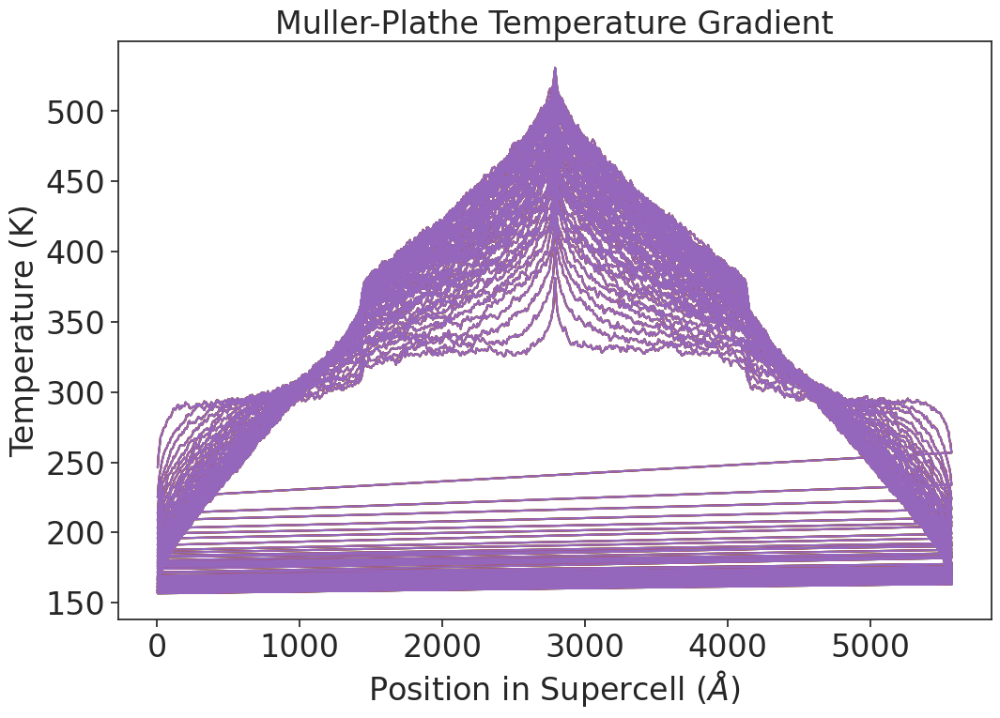

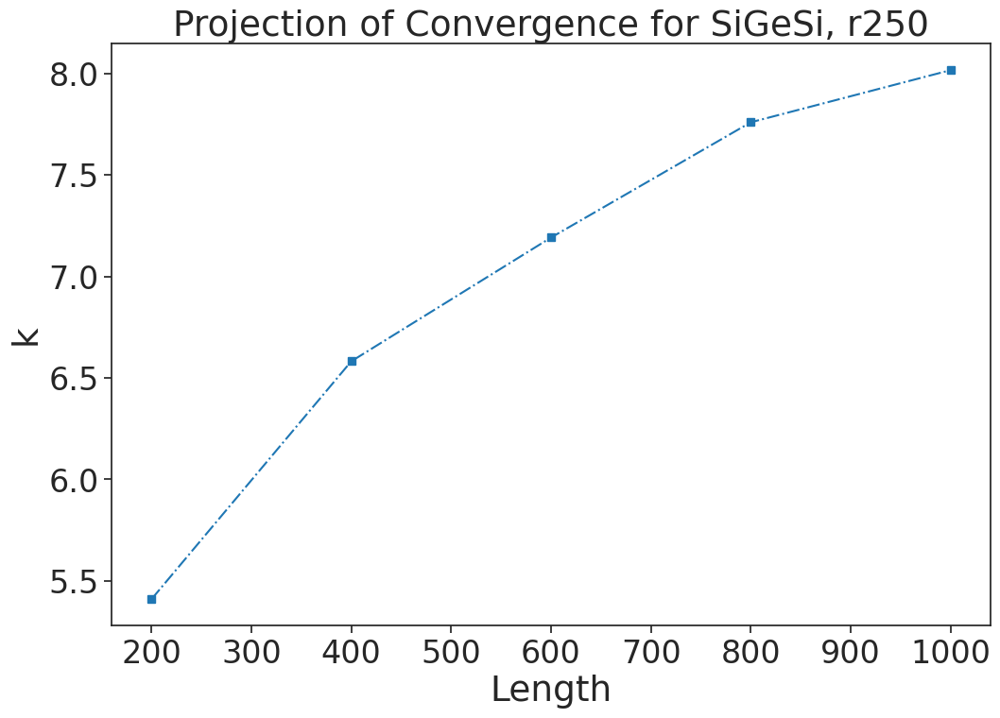

[3.194173e-03 5.075161e+00] 
 [-3.34208214e-06  7.20467157e-03  4.13937800e+00] 
 [ 2.61430208e-09 -8.04782589e-06  9.67257274e-03  3.78801580e+00]
[-1.000000e-03  1.999994e+02  3.999998e+02  6.000002e+02  8.000006e+02
  1.000001e+03]
Intercept of cubic polyfit: [ 2.61430208e-09 -8.04782589e-06  9.67257274e-03  3.78801580e+00]
Intercept of linear polyfit: [3.194173e-03 5.075161e+00]
Standard error of size 200: 0.0467366143938561
Standard error of size 400: 0.051473968785202426
Standard error of size 600: 0.015901541062307414
Standard error of size 800: 0.008422157096388654
Standard error of size 1000: 0.019984139718318045


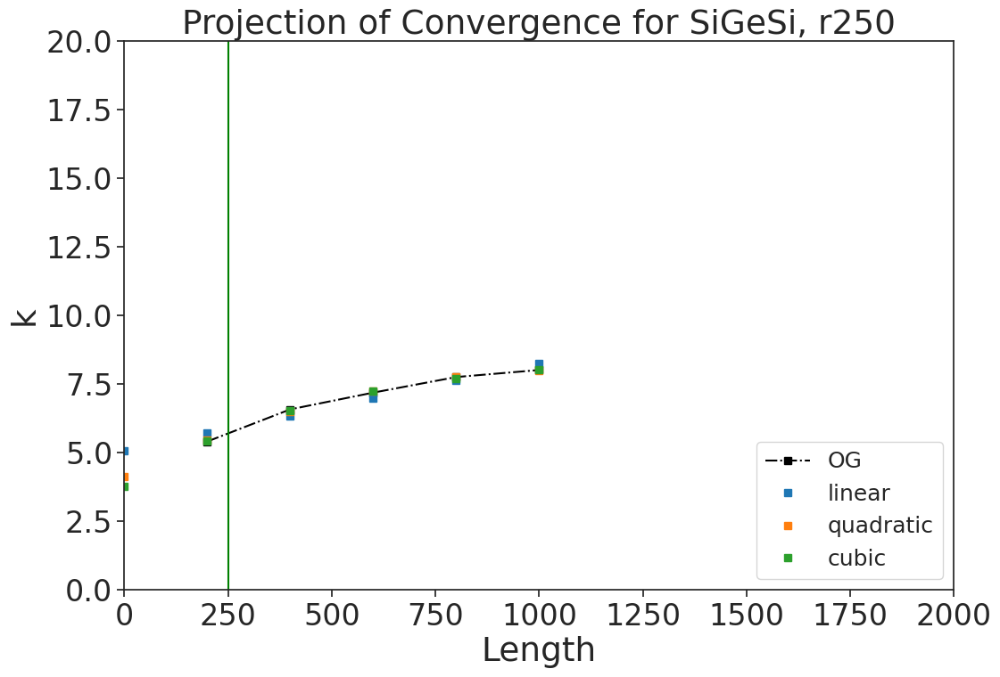

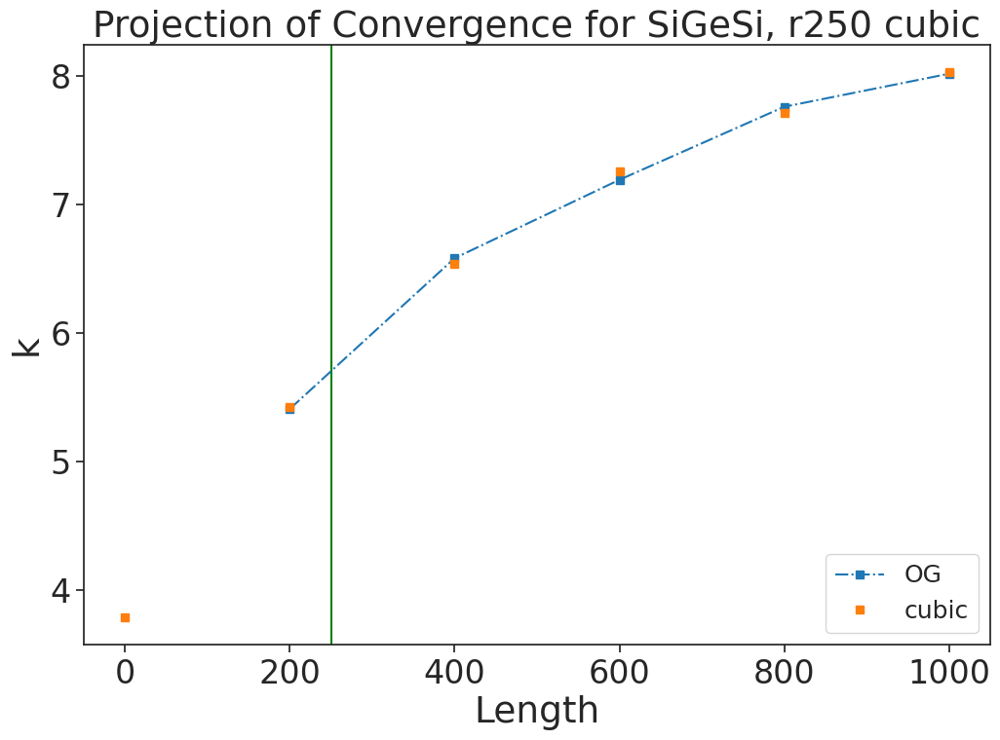

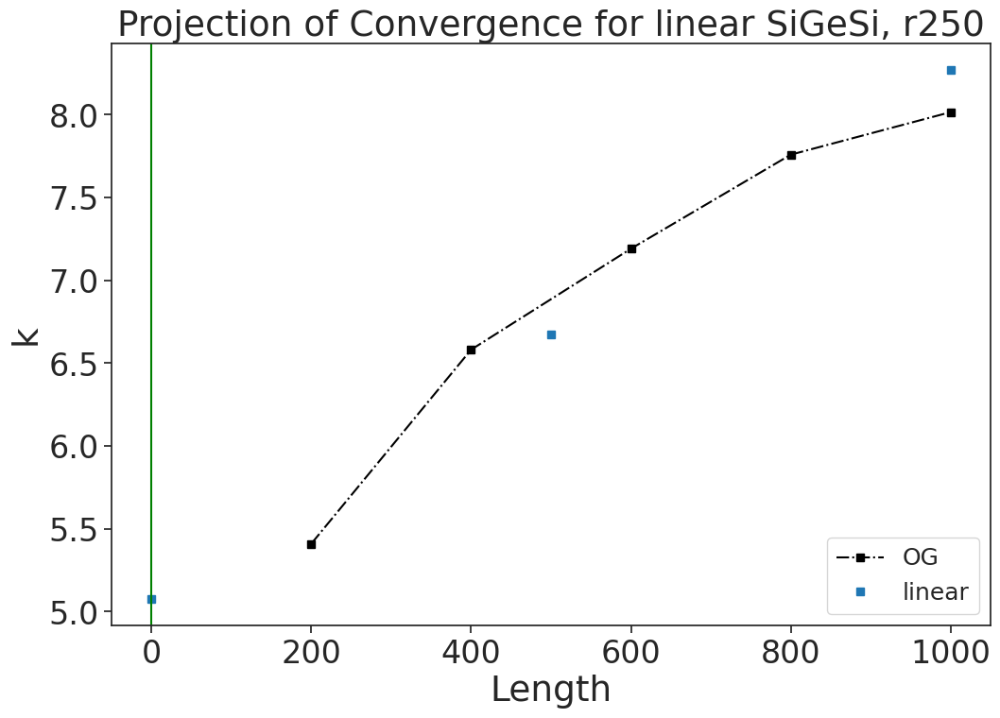

In [26]:

# load profile data 

filename = ['./profile_geE200r250','profile_geE400r250','profile_geE600r250',
           'profile_geE800r250','profile_geE1000r250']
#print(np.shape(filename))



MP_Profile = []; MP_Ave = []; MP_LastN = []; 

for simNo in range(0,len(filename)):
    subprocess.call(r"perl -p -e 's/^[\ \t]+|[\ \t]+$//g' %s > %s_new" % (filename[simNo], filename[simNo]), shell=True) # remove trailling white spaces
    subprocess.call("mv %s_new %s" % (filename[simNo], filename[simNo]), shell=True)
    subprocess.call("tr -s ' ' < %s > %s_tmp " % (filename[simNo], filename[simNo]), shell=True) #squeeze spaces
    subprocess.call("mv %s_tmp %s" % (filename[simNo], filename[simNo]), shell=True)

    profile = []; N = 800;
    with open(filename[simNo], 'r') as f:
        while True:
            lines = list(itertools.islice(f, 1, N+1))
            for line in lines:
                profile.append(line.split(' '))
            if not lines: 
                break
                
    lastN = profile[-N:] 
    lastAve = profile[-3200:]
    #print(lastAve)

    MP_Profile.append(profile)
    MP_LastN.append(lastN)
    MP_Ave.append(lastAve)
    
MP_Profile = np.array(MP_Profile, dtype=float) # for plotting 3D graphs
#print(MP_Profile)

MP_LastN = np.array(MP_LastN, dtype=float) # for calculating the thermal conductivity
#print(MP_LastN)



MP_Ave = np.array(MP_Ave, dtype=float) # for averaging the data to calculate the thermal conductivity
print(np.shape(MP_Profile))
#print(np.shape(MP_LastN))
print(np.shape(MP_Ave))

Thermo_Data = np.array([np.loadtxt('./Thermo_geE200r250'),np.loadtxt('./Thermo_geE400r250'),np.loadtxt('./Thermo_geE600r250'),
                       np.loadtxt('./Thermo_geE800r250'),np.loadtxt('./Thermo_geE1000r250')], dtype = object)#
                        

labels = ['geE200', 'geE400', 'geE600', 'geE800','geE1000','geE1500', 'ge2000'] 

print(np.shape(Thermo_Data))
#print(np.shape(Pristine_Thermo))

Sim_no_dataset = [1,1,1,1,1,1,1,1,1]
Time_no_dataset = [6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000]
Interval_no_dataset = [0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3]
mxc_no_dataset = [10,10,10,10,10,10,10,10,10]

for simNo in range(0, len(MP_Profile)):
    Coordinates = MP_Profile[simNo,:,1]*(Thermo_Data[simNo,-1,9])
    #print(Coordinates)
    Temperature = MP_Profile[simNo,:,3]
    #print(Temperature)

fig = plt.figure(figsize=(12,8))
for k in range(0, len(MP_Profile)):
    plt.plot(Coordinates[:], Temperature[:], color=colors[k], label=labels[k])
    
plt.xlabel(r'Position in Supercell ($\AA$)')
plt.ylabel('Temperature (K)')
plt.title('Muller-Plathe Temperature Gradient', fontsize = 24)
#plt.savefig('MullerPlathe_PristineSi200.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
#plt.show

# Load the data that will be averaged to calculate the slopes 

Temperature = []; Coordinate = []; dX_Thermo = [];

for simNo in range(0, len(filename)):
    
    dX_ = Thermo_Data[simNo,-1,9]
    dX_Thermo.append(dX_)
    
    for i in range(0,800):
        Temperature_ = np.mean([MP_Ave[simNo,i,3],MP_Ave[simNo,i+800,3],MP_Ave[simNo,i+1600,3],MP_Ave[simNo,i+2400,3]])   
        Temperature.append(Temperature_)
        Coordinate_ = np.mean([MP_Ave[simNo,i,1],MP_Ave[simNo,i+800,1],MP_Ave[simNo,i+1600,1],MP_Ave[simNo,i+2400,1]])*dX_
        Coordinate.append(Coordinate_)
    
Temperature = np.array([Temperature[0:800],Temperature[800:1600],Temperature[1600:2400],
                        Temperature[2400:3200],Temperature[3200:4000]], dtype=float)#, Temperature[2400:3200], 
                        #,Temperature[4000:4800],Temperature[4800:5600]], dtype=float)
Coordinate = np.array([Coordinate[0:800],Coordinate[800:1600],Coordinate[1600:2400],
                      Coordinate[2400:3200],Coordinate[3200:4000]], dtype=float)#, Coordinate[2400:3200], 
                      #,Coordinate[4000:4800],Coordinate[4800:5600]], dtype=float)



print(np.shape(Coordinate))
print(np.shape(Temperature))

#print(dX_Thermo)

excluded_points1 = 230 # excluded points from the beginning
excluded_points2 = 40 # excluded points from the end
excluded_points3 = 20
excluded_points4 = 230 # from the end of the mp.data file

slope2_mean = []; slope2 = []; slope1_mean = []; slope1 = []; average_temp_Ge250 = [];
# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff

for simNo in range(0,len(filename)):
    
    dTemp = Temperature[simNo,:]
    X = dX_
    dX = Coordinate[simNo,:] #*X # normalized distance
    
    #T_fit_left = np.polyfit(dX[280:380], dTemp[280:380], 1)
    #T_fit_right = -np.polyfit(dX[360:-280], dTemp[360:-280], 1)
    
    T_fit_left = np.polyfit(dX[excluded_points1:400-excluded_points2], dTemp[excluded_points1:400-excluded_points2], 1)
    T_fit_right = -np.polyfit(dX[400+excluded_points2:-excluded_points1], dTemp[400+excluded_points2:-excluded_points1], 1)
    
    slope2.append([T_fit_left[0], T_fit_right[0]])
    #print(slope2)
    print('Top Slope', labels[simNo], ' = ', T_fit_left[0], T_fit_right[0])

    mean_slope = np.mean([abs(T_fit_left[0]), abs(T_fit_right[0])], axis = 0)
    slope2_mean.append(mean_slope)
    print('Top Slope Mean', labels[simNo], ' = ', slope2_mean[0])
    
    B_fit_left2 = np.polyfit(dX[excluded_points3:400-excluded_points4], dTemp[excluded_points3:400-excluded_points4], 1)
    B_fit_right2 = -np.polyfit(dX[400+excluded_points4:-excluded_points3], dTemp[400+excluded_points4:-excluded_points3], 1)
    
    slope1.append([B_fit_left2[0], B_fit_right2[0]])
    print('Bottom Slope', labels[simNo], ' = ', B_fit_left2[0], B_fit_right2[0])
    
    mean_slope = np.mean([abs(B_fit_left2[0]), abs(B_fit_right2[0])], axis = 0)
    slope1_mean.append(mean_slope)
    print('Bottom Slope Mean', labels[simNo], ' = ', slope1_mean[0])
    
    average_temp = np.mean(dTemp)
    average_temp_Ge250.append(average_temp)

Slope1 = np.array(slope1)
Slope_mean1 = np.array(slope1_mean)
#print(Slope_mean1)

Slope2 = np.array(slope2)
Slope_mean2 = np.array(slope2_mean)
#print(Slope_mean2)

Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0)]) #individual
#Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0), np.mean([Slope_mean1[1], Slope_mean2[1]], axis =0), np.mean([Slope_mean1[2], Slope_mean2[2]], axis=0)])
print('Slope Mean', labels[simNo], ' = ', Slope_mean[0])

Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0]]) #individual
#Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0], Slope_mean[1]*dX_Thermo[1], Slope_mean[2]*dX_Thermo[2]])
print('Slope Average', labels[simNo], ' = ', Slope_ave[0])

# Calculate the heat flux and the thermal conductivity
eV2J  = 1.6e-19;
Ang2m =   1e-10;
ps2s  =   1e-12;
conversion = (eV2J/(Ang2m*ps2s))

s_values = []
ThermalsGe250 = []
dt = 0.0005 # picoseconds

# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff
for simNo in range(0, len(Thermo_Data)):
    
    Steps = Thermo_Data[simNo,-1,0]
    Time = Steps*dt # picoseconds
    
    dx = Thermo_Data[simNo,-1,9]
    dy = Thermo_Data[simNo,-1,10]
    dz = Thermo_Data[simNo,-1,11]
    Area = dy*dz
    
    #DeltaE = Thermo_Data[simNo,-1,-2] # E_pair
    #TotalE = Thermo_Data[simNo,-1,-5] # Total energy
    KinE = Thermo_Data[simNo,-1,12] # in log_lammps, f_3 
    
    Thermal_left2 = ((KinE)/(2*Time*Area*Slope2[simNo,0]))*conversion #top left
    Thermal_right2 = ((KinE)/(2*Time*Area*Slope2[simNo,1]))*conversion #top right
    
    Thermal_left1 = ((KinE)/(2*Time*Area*Slope1[simNo,0]))*conversion #bottom left
    Thermal_right1 = ((KinE)/(2*Time*Area*Slope1[simNo,1]))*conversion #bottom right
    
    thermal2 = np.concatenate((Thermal_left1, Thermal_left2), axis = None)
    thermal1 = np.concatenate((Thermal_right1, Thermal_right2), axis = None)
    
    thermal2_ave = ((KinE)/(2*Time*Area*Slope_mean2[simNo]))*conversion #top
    thermal1_ave = ((KinE)/(2*Time*Area*Slope_mean1[simNo]))*conversion #bottom
    
    #thermal_ave = ((KinE)/(2*Time*Area*Slope_ave[simNo]))*conversion
    thermal_ave = (thermal2_ave+thermal1_ave)/2
    
    getcontext().prec = 10
    std_top = Decimal(np.std([Thermal_left2, Thermal_right2], dtype=np.float64))
    SE_left = std_top/Decimal(math.sqrt(2))
   
    std_bottom = Decimal(np.std([Thermal_left1, Thermal_right1], dtype=np.float64))
    SE_right = std_bottom/Decimal(math.sqrt(2))
    
    SE = math.sqrt(((SE_left/2)**2) + ((SE_right/2)**2))
    print(SE)
   
    #print('Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2[0], thermal2[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2_ave)
    
    #print('Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1[0], thermal1[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1_ave)
    
    print('Average Thermal Conductivity of', labels[simNo], 'Average = ', thermal_ave) 
    
    Therm_val = [Thermal_left1,Thermal_left2,Thermal_right2,Thermal_right1]
    Ttherm = ['%.6f' % elem for elem in Therm_val]
    #print(Ttherm)
    ThermalsGe250.append(Ttherm)
    print('ThermalsGe250', labels[simNo], ' = ', Ttherm)
    
    
    TC_values = [thermal2_ave, thermal1_ave, thermal_ave, SE]
    val = ['%.6f' % elem for elem in TC_values]
    #print(val)
    s_values.append(val)
    print('s values', labels[simNo], ' = ', val)
    #print(simNo)
    

#print(s_values[3]))

#print(s_values)
#print(s_values[0]) #200
#print(s_values[1]) #400
#print(s_values[2]) #600
##print(s_values[3])) #800
#print(s_values[4]) #1000
#print(s_values[5]) #1500
#print(s_values[0][0])
therm_averageGe250 = []
for item in s_values:
    print(item[2])
    therm_averageGe250.append(item[2])

therm_averageGe250 = []
for item in s_values:
    print(float(item[2]))
    therm_averageGe250.append(np.array(float(item[2])))

#projection stuff

print(s_values)



#SIGESI r250
sizeGe250 = [200.0,400.0,600.0,800.0,1000.0]#,1500.0,2000.0]
sizeGe250 = np.array(sizeGe250)
#print(np.shape(sizeGe250))
print(sizeGe250)
Tc = [float(s_values[0][2]),float(s_values[1][2]),float(s_values[2][2]),
     float(s_values[3][2]),float(s_values[4][2])]#
     #,float(s_values[5][2]),float(s_values[6][2])]
Tc = np.array(Tc)
print(Tc)

inv_sizeGe250 = np.reciprocal(sizeGe250)
#np.set_printoptions(precision=10)
print(inv_sizeGe250)

inv_Tc = np.reciprocal(Tc)
print(inv_Tc)

#plot

fig = plt.figure(figsize=(12,8))

plt.plot(sizeGe250[:], Tc[:],'s-.')


plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r250', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r250.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show()



fig = plt.figure(figsize=(12,8))

x1 = np.array(sizeGe250)
mn = min(x1)
mx = max(x1)
#print(x1)
#print(len(x))

y1 = np.array(Tc)
#print(y1)

z1 = np.polyfit(x1, y1, 1) #np.polyfit(x, y, degree of polynomial), degree =1,2,3 is linear, quadratic, cubic
z2 = np.polyfit(x1, y1, 2)
z3 = np.polyfit(x1, y1, 3)

print(z1,'\n',z2,'\n',z3)
#xp = np.linspace(mn, mx, 6)
xp = np.linspace(-0.001, mx+0.001, 6)
print(xp)

p1 = np.poly1d(z1)
p2 = np.poly1d(z2)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

plt.plot(x1, y1, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')
plt.plot(xp, p2(xp), 's', label = 'quadratic')
plt.plot(xp, p3(xp), 's', label ='cubic') 

plt.axvline(x=250.0, color='green')

plt.legend(loc="lower right")

plt.xlim([0.0,2000])
plt.ylim([0.0,20])

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r250', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r250-lqc-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


fig = plt.figure(figsize=(12,8))

x_2 = np.array(sizeGe250)
mn = min(x_2)
mx = max(x_2)
#print(mn)
#print(len(x_2))

y_2 = np.array(Tc)
#print(y)

#xpp = np.linspace(-0.00005,mx, 6)
xpp = np.linspace(-0.0005,mx, 6)

plt.axvline(x=250.0, color='green')


z3 = np.polyfit(x_2, y_2, 3)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

##m, c; run by Laura
s = p3(1);
i = p3(2)    #The polyfit function for a linear (polynomial order 1) fit returns the slope as the first parameter
                    #and the intercept as the second parameter, so the output vector is [slope, intercept]. 
                    #It is like any other vector, so choose the one you want by indexing into it.
n = p3(0)
#print(s)
#print(i)
#print(n)

#slope_intercept = np.polyfit(x_2,y_2,1)
#print('Intercept of linear polyfit:',slope_intercept)
#slope_intercept = np.polyfit(x_2,y_2,2)
#print('Intercept of quad. polyfit:',slope_intercept)
slope_intercept = np.polyfit(x_2,y_2,3)
print('Intercept of cubic polyfit:',slope_intercept)
##

plt.plot(x_2,y_2, 's-.', label ='OG')
plt.plot(xpp, p3(xp), 's', label ='cubic') 
plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
#plt.ylim(-0.0002, 0.18)
plt.title(r'Projection of Convergence for SiGeSi, r250 cubic', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r250-c-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)



plt.show


#linear fit in linear region alone
fig = plt.figure(figsize=(12,8))

#x2 = [0.005,0.0025,0.00166667]
x2 = sizeGe250
x2 = np.array(x2)
y2 = Tc
#y2 = [0.16806723,0.13947001,0.11160714]
y2 = np.array(y2)


z = np.polyfit(x2, y2, 1) 
xp = np.linspace(-0.001, mx+0.001, 3)

p1 = np.poly1d(z)

slope_intercept = np.polyfit(x2,y2,1)
print('Intercept of linear polyfit:',slope_intercept)


plt.plot(x2, y2, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')

plt.axvline(x=0, color='green')

plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for linear SiGeSi, r250', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-linear-GeSiGe-r250-l-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


#SiGeSi values

SE200b_left = np.std([float(ThermalsGe250[0][1]), float(ThermalsGe250[0][2])], dtype=np.float64)
SE200_left = SE200b_left/math.sqrt(2)
SE200b_right = np.std([float(ThermalsGe250[0][0]), float(ThermalsGe250[0][3])], dtype=np.float64)
SE200_right = SE200b_right/math.sqrt(2)
standard_error200b250 = math.sqrt(((SE200_left/2)**2) + ((SE200_right/2)**2))
print('Standard error of size 200:',standard_error200b250)

SE400b_left = np.std([float(ThermalsGe250[1][1]), float(ThermalsGe250[1][2])], dtype=np.float64)
SE400_left = SE400b_left/math.sqrt(2)
SE400b_right = np.std([float(ThermalsGe250[1][0]), float(ThermalsGe250[1][3])], dtype=np.float64)
SE400_right = SE400b_right/math.sqrt(2)
standard_error400b250 = math.sqrt(((SE400_left/2)**2) + ((SE400_right/2)**2))
print('Standard error of size 400:',standard_error400b250)

SE600b_left = np.std([float(ThermalsGe250[2][1]), float(ThermalsGe250[2][2])], dtype=np.float64)
SE600_left = SE600b_left/math.sqrt(2)
SE600b_right = np.std([float(ThermalsGe250[2][0]), float(ThermalsGe250[2][3])], dtype=np.float64)
SE600_right = SE600b_right/math.sqrt(2)
standard_error600b250 = math.sqrt(((SE600_left/2)**2) + ((SE600_right/2)**2))
print('Standard error of size 600:',standard_error600b250)


SE800b_left = np.std([float(ThermalsGe250[3][1]), float(ThermalsGe250[3][2])], dtype=np.float64)
SE800_left = SE800b_left/math.sqrt(2)
SE800b_right = np.std([float(ThermalsGe250[3][0]), float(ThermalsGe250[3][3])], dtype=np.float64)
SE800_right = SE800b_right/math.sqrt(2)
standard_error800b250 = math.sqrt(((SE800_left/2)**2) + ((SE800_right/2)**2))
print('Standard error of size 800:',standard_error800b250)

SE1000b_left = np.std([float(ThermalsGe250[4][1]), float(ThermalsGe250[4][2])], dtype=np.float64)
SE1000_left = SE1000b_left/math.sqrt(2)
SE1000b_right = np.std([float(ThermalsGe250[4][0]), float(ThermalsGe250[4][3])], dtype=np.float64)
SE1000_right = SE1000b_right/math.sqrt(2)
standard_error1000b250 = math.sqrt(((SE1000_left/2)**2) + ((SE1000_right/2)**2))
print('Standard error of size 1000:',standard_error1000b250)
'''
SE1500b_left = np.std([float(ThermalsGe250[5][1]), float(ThermalsGe250[5][2])], dtype=np.float64)
SE1500_left = SE1500b_left/math.sqrt(2)
SE1500b_right = np.std([float(ThermalsGe250[5][0]), float(ThermalsGe250[5][3])], dtype=np.float64)
SE1500_right = SE1500b_right/math.sqrt(2)
standard_error1500b250 = math.sqrt(((SE1500_left/2)**2) + ((SE1500_right/2)**2))
print('Standard error of size 1500:',standard_error1500b250)

SE2000b_left = np.std([float(ThermalsGe250[6][1]), float(ThermalsGe250[6][2])], dtype=np.float64)
SE2000_left = SE2000b_left/math.sqrt(2)
SE2000b_right = np.std([float(ThermalsGe250[6][0]), float(ThermalsGe250[6][3])], dtype=np.float64)
SE2000_right = SE2000b_right/math.sqrt(2)
standard_error2000b250 = math.sqrt(((SE2000_left/2)**2) + ((SE2000_right/2)**2))
print('Standard error of size 2000:',standard_error2000b250)

yerrGe1500b250 = standard_error1500b250
yerrGe2000b250 = standard_error2000b250


#projection of convergence for SiGeSi
#https://math.stackexchange.com/questions/3217622/how-does-inverting-data-change-standaro-deviation
'''
yerrGe200b250 = standard_error200b250
yerrGe400b250 = standard_error400b250
yerrGe600b250 = standard_error600b250
yerrGe800b250 = standard_error800b250
yerrGe1000b250 = standard_error1000b250


In [27]:
#271

(5, 48000, 4)
(5, 3200, 4)
(5, 61, 14)
(5, 800)
(5, 800)
Top Slope geE200  =  0.1626697285427086 0.16898903700251
Top Slope Mean geE200  =  0.1658293827726093
Bottom Slope geE200  =  0.2641373438765479 0.260247377616449
Bottom Slope Mean geE200  =  0.26219236074649843
Top Slope geE400  =  0.11985917258071445 0.12404022185810819
Top Slope Mean geE400  =  0.1658293827726093
Bottom Slope geE400  =  0.18896046819530618 0.18944107696283363
Bottom Slope Mean geE400  =  0.26219236074649843
Top Slope geE600  =  0.10412294272339656 0.11488530015205932
Top Slope Mean geE600  =  0.1658293827726093
Bottom Slope geE600  =  0.15547134244467256 0.14760950496954392
Bottom Slope Mean geE600  =  0.26219236074649843
Top Slope geE800  =  0.09516835544489485 0.10669201706399523
Top Slope Mean geE800  =  0.1658293827726093
Bottom Slope geE800  =  0.13276935281052452 0.13142959452192285
Bottom Slope Mean geE800  =  0.26219236074649843
Top Slope geE1000  =  0.08938545285676296 0.09053830573556274
Top Slope Me

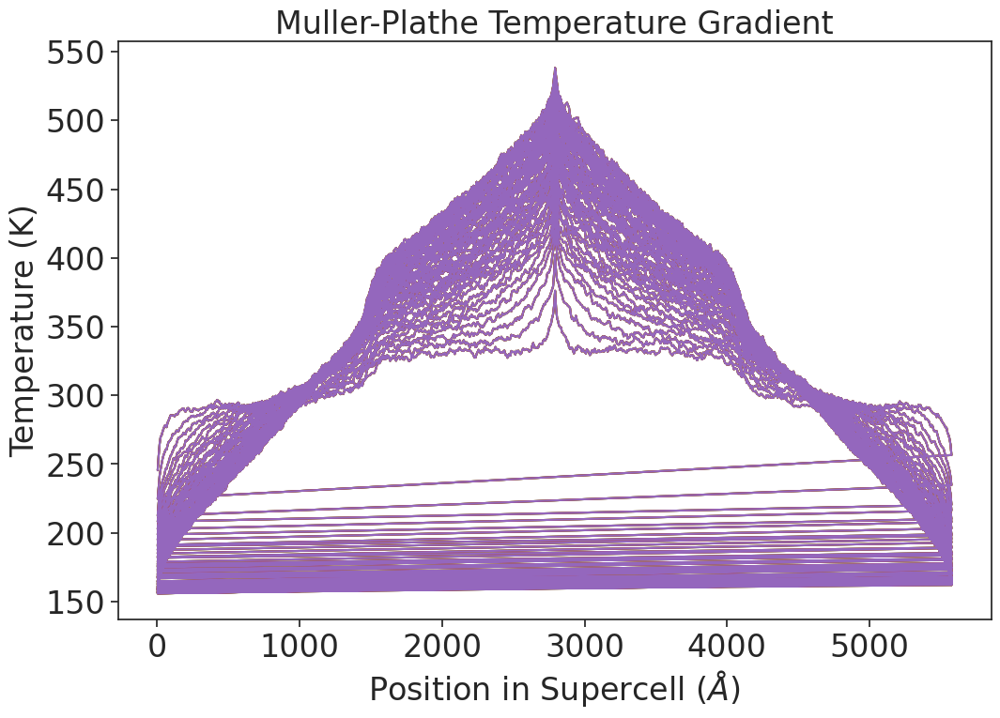

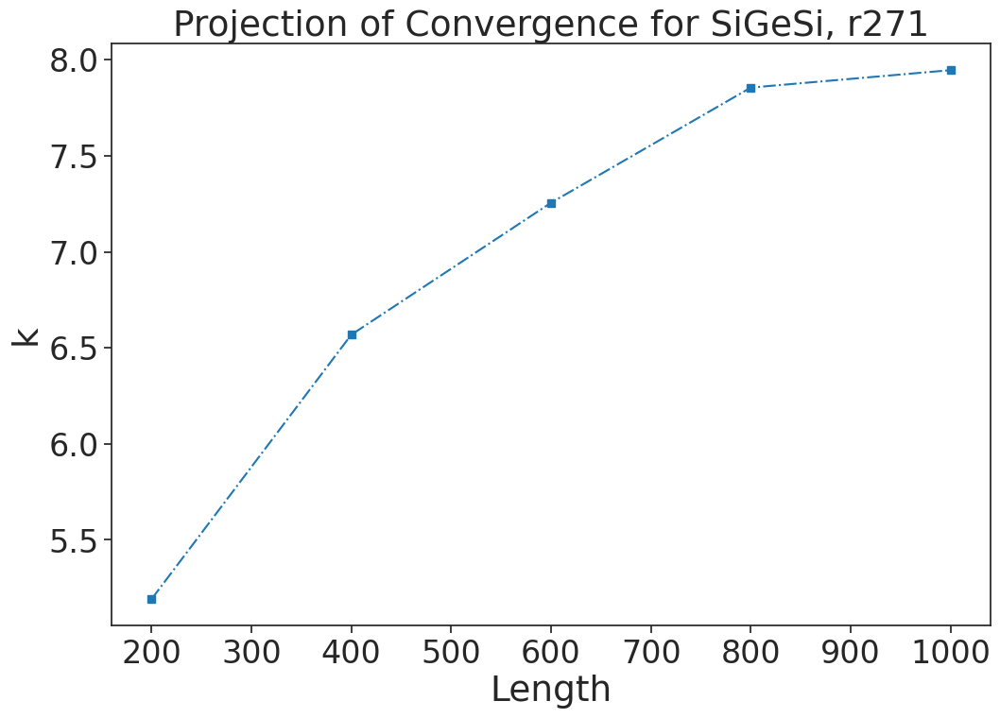

[3.3992685e-03 4.9238801e+00] 
 [-4.75131964e-06  9.10085207e-03  3.59351060e+00] 
 [ 1.88542708e-09 -8.14508839e-06  1.08806952e-02  3.34010920e+00]
[-1.000000e-03  1.999994e+02  3.999998e+02  6.000002e+02  8.000006e+02
  1.000001e+03]
Intercept of cubic polyfit: [ 1.88542708e-09 -8.14508839e-06  1.08806952e-02  3.34010920e+00]
Intercept of linear polyfit: [3.3992685e-03 4.9238801e+00]
Standard error of size 200: 0.044135920224489485
Standard error of size 400: 0.04848313583769363
Standard error of size 600: 0.15699298336878406
Standard error of size 800: 0.18076156518921901
Standard error of size 1000: 0.020217077935497884


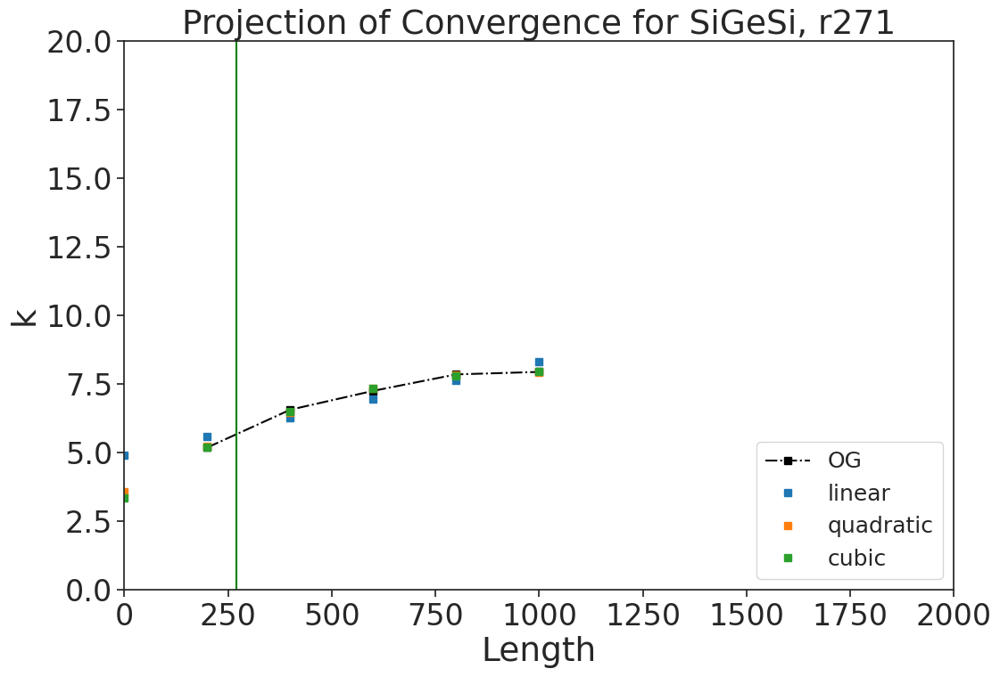

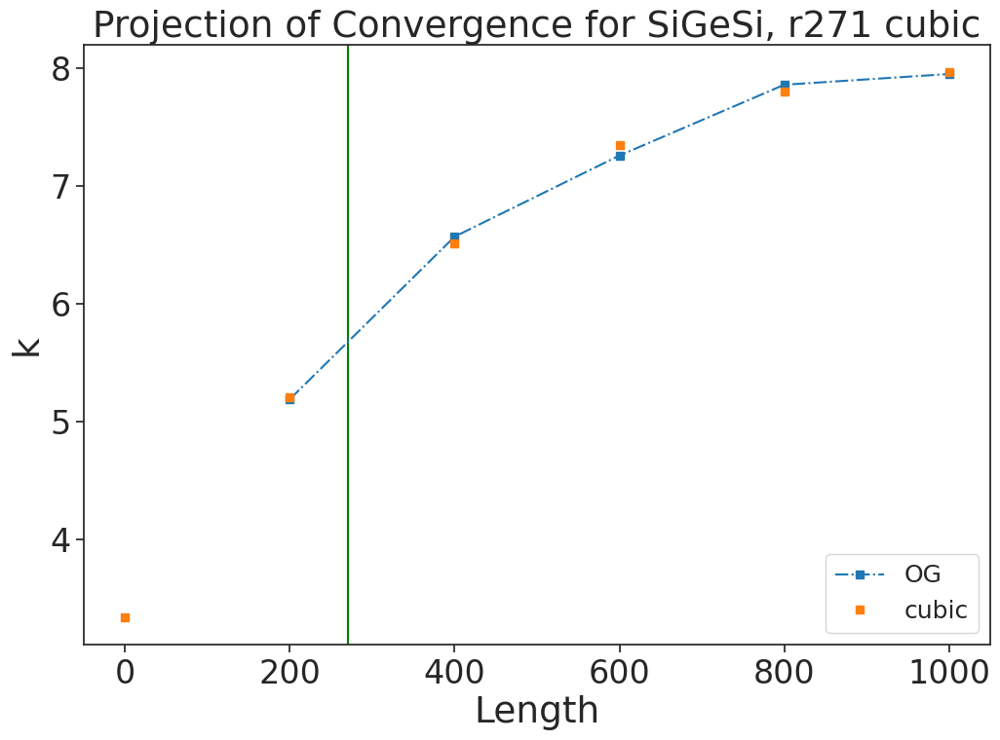

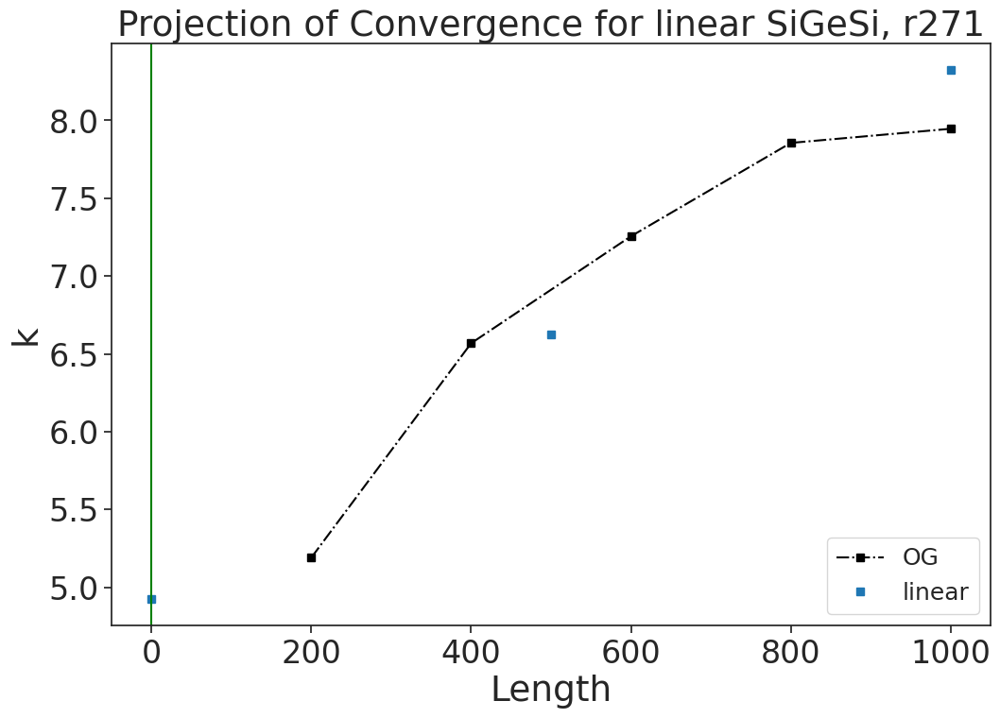

In [28]:

# load profile data 

filename = ['./profile_geE200r271','profile_geE400r271','profile_geE600r271',
           'profile_geE800r271','profile_geE1000r271']
#print(np.shape(filename))



MP_Profile = []; MP_Ave = []; MP_LastN = []; 

for simNo in range(0,len(filename)):
    subprocess.call(r"perl -p -e 's/^[\ \t]+|[\ \t]+$//g' %s > %s_new" % (filename[simNo], filename[simNo]), shell=True) # remove trailling white spaces
    subprocess.call("mv %s_new %s" % (filename[simNo], filename[simNo]), shell=True)
    subprocess.call("tr -s ' ' < %s > %s_tmp " % (filename[simNo], filename[simNo]), shell=True) #squeeze spaces
    subprocess.call("mv %s_tmp %s" % (filename[simNo], filename[simNo]), shell=True)

    profile = []; N = 800;
    with open(filename[simNo], 'r') as f:
        while True:
            lines = list(itertools.islice(f, 1, N+1))
            for line in lines:
                profile.append(line.split(' '))
            if not lines: 
                break
                
    lastN = profile[-N:] 
    lastAve = profile[-3200:]
    #print(lastAve)

    MP_Profile.append(profile)
    MP_LastN.append(lastN)
    MP_Ave.append(lastAve)
    
MP_Profile = np.array(MP_Profile, dtype=float) # for plotting 3D graphs
#print(MP_Profile)

MP_LastN = np.array(MP_LastN, dtype=float) # for calculating the thermal conductivity
#print(MP_LastN)



MP_Ave = np.array(MP_Ave, dtype=float) # for averaging the data to calculate the thermal conductivity
print(np.shape(MP_Profile))
#print(np.shape(MP_LastN))
print(np.shape(MP_Ave))

Thermo_Data = np.array([np.loadtxt('./Thermo_geE200r271'),np.loadtxt('./Thermo_geE400r271'),np.loadtxt('./Thermo_geE600r271'),
                       np.loadtxt('./Thermo_geE800r271'),np.loadtxt('./Thermo_geE1000r271')], dtype = object)#
                        

labels = ['geE200', 'geE400', 'geE600', 'geE800','geE1000','geE1500', 'ge2000'] 

print(np.shape(Thermo_Data))
#print(np.shape(Pristine_Thermo))

Sim_no_dataset = [1,1,1,1,1,1,1,1,1]
Time_no_dataset = [6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000,6000000]
Interval_no_dataset = [0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3,0.5e-3]
mxc_no_dataset = [10,10,10,10,10,10,10,10,10]

for simNo in range(0, len(MP_Profile)):
    Coordinates = MP_Profile[simNo,:,1]*(Thermo_Data[simNo,-1,9])
    #print(Coordinates)
    Temperature = MP_Profile[simNo,:,3]
    #print(Temperature)

fig = plt.figure(figsize=(12,8))
for k in range(0, len(MP_Profile)):
    plt.plot(Coordinates[:], Temperature[:], color=colors[k], label=labels[k])
    
plt.xlabel(r'Position in Supercell ($\AA$)')
plt.ylabel('Temperature (K)')
plt.title('Muller-Plathe Temperature Gradient', fontsize = 24)
#plt.savefig('MullerPlathe_PristineSi200.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
#plt.show

# Load the data that will be averaged to calculate the slopes 

Temperature = []; Coordinate = []; dX_Thermo = [];

for simNo in range(0, len(filename)):
    
    dX_ = Thermo_Data[simNo,-1,9]
    dX_Thermo.append(dX_)
    
    for i in range(0,800):
        Temperature_ = np.mean([MP_Ave[simNo,i,3],MP_Ave[simNo,i+800,3],MP_Ave[simNo,i+1600,3],MP_Ave[simNo,i+2400,3]])   
        Temperature.append(Temperature_)
        Coordinate_ = np.mean([MP_Ave[simNo,i,1],MP_Ave[simNo,i+800,1],MP_Ave[simNo,i+1600,1],MP_Ave[simNo,i+2400,1]])*dX_
        Coordinate.append(Coordinate_)
    
Temperature = np.array([Temperature[0:800],Temperature[800:1600],Temperature[1600:2400],
                        Temperature[2400:3200],Temperature[3200:4000]], dtype=float)#, Temperature[2400:3200], 
                        #,Temperature[4000:4800],Temperature[4800:5600]], dtype=float)
Coordinate = np.array([Coordinate[0:800],Coordinate[800:1600],Coordinate[1600:2400],
                      Coordinate[2400:3200],Coordinate[3200:4000]], dtype=float)#, Coordinate[2400:3200], 
                      #,Coordinate[4000:4800],Coordinate[4800:5600]], dtype=float)



print(np.shape(Coordinate))
print(np.shape(Temperature))

#print(dX_Thermo)

excluded_points1 = 230 # excluded points from the beginning
excluded_points2 = 40 # excluded points from the end
excluded_points3 = 20
excluded_points4 = 230 # from the end of the mp.data file

slope2_mean = []; slope2 = []; slope1_mean = []; slope1 = []; average_temp_Ge271 = [];
# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff

for simNo in range(0,len(filename)):
    
    dTemp = Temperature[simNo,:]
    X = dX_
    dX = Coordinate[simNo,:] #*X # normalized distance
    
    #T_fit_left = np.polyfit(dX[280:380], dTemp[280:380], 1)
    #T_fit_right = -np.polyfit(dX[360:-280], dTemp[360:-280], 1)
    
    T_fit_left = np.polyfit(dX[excluded_points1:400-excluded_points2], dTemp[excluded_points1:400-excluded_points2], 1)
    T_fit_right = -np.polyfit(dX[400+excluded_points2:-excluded_points1], dTemp[400+excluded_points2:-excluded_points1], 1)
    
    slope2.append([T_fit_left[0], T_fit_right[0]])
    #print(slope2)
    print('Top Slope', labels[simNo], ' = ', T_fit_left[0], T_fit_right[0])

    mean_slope = np.mean([abs(T_fit_left[0]), abs(T_fit_right[0])], axis = 0)
    slope2_mean.append(mean_slope)
    print('Top Slope Mean', labels[simNo], ' = ', slope2_mean[0])
    
    B_fit_left2 = np.polyfit(dX[excluded_points3:400-excluded_points4], dTemp[excluded_points3:400-excluded_points4], 1)
    B_fit_right2 = -np.polyfit(dX[400+excluded_points4:-excluded_points3], dTemp[400+excluded_points4:-excluded_points3], 1)
    
    slope1.append([B_fit_left2[0], B_fit_right2[0]])
    print('Bottom Slope', labels[simNo], ' = ', B_fit_left2[0], B_fit_right2[0])
    
    mean_slope = np.mean([abs(B_fit_left2[0]), abs(B_fit_right2[0])], axis = 0)
    slope1_mean.append(mean_slope)
    print('Bottom Slope Mean', labels[simNo], ' = ', slope1_mean[0])
    
    average_temp = np.mean(dTemp)
    average_temp_Ge271.append(average_temp)

Slope1 = np.array(slope1)
Slope_mean1 = np.array(slope1_mean)
#print(Slope_mean1)

Slope2 = np.array(slope2)
Slope_mean2 = np.array(slope2_mean)
#print(Slope_mean2)

Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0)]) #individual
#Slope_mean = np.array([np.mean([Slope_mean1[0], Slope_mean2[0]], axis=0), np.mean([Slope_mean1[1], Slope_mean2[1]], axis =0), np.mean([Slope_mean1[2], Slope_mean2[2]], axis=0)])
print('Slope Mean', labels[simNo], ' = ', Slope_mean[0])

Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0]]) #individual
#Slope_ave = np.array([Slope_mean[0]*dX_Thermo[0], Slope_mean[1]*dX_Thermo[1], Slope_mean[2]*dX_Thermo[2]])
print('Slope Average', labels[simNo], ' = ', Slope_ave[0])

# Calculate the heat flux and the thermal conductivity
eV2J  = 1.6e-19;
Ang2m =   1e-10;
ps2s  =   1e-12;
conversion = (eV2J/(Ang2m*ps2s))

s_values = []
ThermalsGe271 = []
dt = 0.0005 # picoseconds

# Step Temp E_pair PotEng KinEng TotEng Temp Press Volume Lx Ly Lz f_3 v_tdiff
for simNo in range(0, len(Thermo_Data)):
    
    Steps = Thermo_Data[simNo,-1,0]
    Time = Steps*dt # picoseconds
    
    dx = Thermo_Data[simNo,-1,9]
    dy = Thermo_Data[simNo,-1,10]
    dz = Thermo_Data[simNo,-1,11]
    Area = dy*dz
    
    #DeltaE = Thermo_Data[simNo,-1,-2] # E_pair
    #TotalE = Thermo_Data[simNo,-1,-5] # Total energy
    KinE = Thermo_Data[simNo,-1,12] # in log_lammps, f_3 
    
    Thermal_left2 = ((KinE)/(2*Time*Area*Slope2[simNo,0]))*conversion #top left
    Thermal_right2 = ((KinE)/(2*Time*Area*Slope2[simNo,1]))*conversion #top right
    
    Thermal_left1 = ((KinE)/(2*Time*Area*Slope1[simNo,0]))*conversion #bottom left
    Thermal_right1 = ((KinE)/(2*Time*Area*Slope1[simNo,1]))*conversion #bottom right
    
    thermal2 = np.concatenate((Thermal_left1, Thermal_left2), axis = None)
    thermal1 = np.concatenate((Thermal_right1, Thermal_right2), axis = None)
    
    thermal2_ave = ((KinE)/(2*Time*Area*Slope_mean2[simNo]))*conversion #top
    thermal1_ave = ((KinE)/(2*Time*Area*Slope_mean1[simNo]))*conversion #bottom
    
    #thermal_ave = ((KinE)/(2*Time*Area*Slope_ave[simNo]))*conversion
    thermal_ave = (thermal2_ave+thermal1_ave)/2
    
    getcontext().prec = 10
    std_top = Decimal(np.std([Thermal_left2, Thermal_right2], dtype=np.float64))
    SE_left = std_top/Decimal(math.sqrt(2))
   
    std_bottom = Decimal(np.std([Thermal_left1, Thermal_right1], dtype=np.float64))
    SE_right = std_bottom/Decimal(math.sqrt(2))
    
    SE = math.sqrt(((SE_left/2)**2) + ((SE_right/2)**2))
    print(SE)
   
    #print('Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2[0], thermal2[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Top Slope = ', thermal2_ave)
    
    #print('Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1[0], thermal1[1])
    print('Average Thermal Conductivity of', labels[simNo], 'Bottom Slope = ', thermal1_ave)
    
    print('Average Thermal Conductivity of', labels[simNo], 'Average = ', thermal_ave) 
    
    Therm_val = [Thermal_left1,Thermal_left2,Thermal_right2,Thermal_right1]
    Ttherm = ['%.6f' % elem for elem in Therm_val]
    #print(Ttherm)
    ThermalsGe271.append(Ttherm)
    print('ThermalsGe271', labels[simNo], ' = ', Ttherm)
    
    
    TC_values = [thermal2_ave, thermal1_ave, thermal_ave, SE]
    val = ['%.6f' % elem for elem in TC_values]
    #print(val)
    s_values.append(val)
    print('s values', labels[simNo], ' = ', val)
    #print(simNo)
    

#print(s_values[3]))

#print(s_values)
#print(s_values[0]) #200
#print(s_values[1]) #400
#print(s_values[2]) #600
##print(s_values[3])) #800
#print(s_values[4]) #1000
#print(s_values[5]) #1500
#print(s_values[0][0])
therm_averageGe271 = []
for item in s_values:
    print(item[2])
    therm_averageGe271.append(item[2])

therm_averageGe271 = []
for item in s_values:
    print(float(item[2]))
    therm_averageGe271.append(np.array(float(item[2])))

#projection stuff

print(s_values)



#SIGESI r271
sizeGe271 = [200.0,400.0,600.0,800.0,1000.0]#,1500.0,2000.0]
sizeGe271 = np.array(sizeGe271)
#print(np.shape(sizeGe271))
print(sizeGe271)
Tc = [float(s_values[0][2]),float(s_values[1][2]),float(s_values[2][2]),
     float(s_values[3][2]),float(s_values[4][2])]#
     #,float(s_values[5][2]),float(s_values[6][2])]
Tc = np.array(Tc)
print(Tc)

inv_sizeGe271 = np.reciprocal(sizeGe271)
#np.set_printoptions(precision=10)
print(inv_sizeGe271)

inv_Tc = np.reciprocal(Tc)
print(inv_Tc)

#plot

fig = plt.figure(figsize=(12,8))

plt.plot(sizeGe271[:], Tc[:],'s-.')


plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r271', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r271.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show()



fig = plt.figure(figsize=(12,8))

x1 = np.array(sizeGe271)
mn = min(x1)
mx = max(x1)
#print(x1)
#print(len(x))

y1 = np.array(Tc)
#print(y1)

z1 = np.polyfit(x1, y1, 1) #np.polyfit(x, y, degree of polynomial), degree =1,2,3 is linear, quadratic, cubic
z2 = np.polyfit(x1, y1, 2)
z3 = np.polyfit(x1, y1, 3)

print(z1,'\n',z2,'\n',z3)
#xp = np.linspace(mn, mx, 6)
xp = np.linspace(-0.001, mx+0.001, 6)
print(xp)

p1 = np.poly1d(z1)
p2 = np.poly1d(z2)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

plt.plot(x1, y1, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')
plt.plot(xp, p2(xp), 's', label = 'quadratic')
plt.plot(xp, p3(xp), 's', label ='cubic') 

plt.axvline(x=271.0, color='green')

plt.legend(loc="lower right")

plt.xlim([0.0,2000])
plt.ylim([0.0,20])

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for SiGeSi, r271', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r271-lqc-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


fig = plt.figure(figsize=(12,8))

x_2 = np.array(sizeGe271)
mn = min(x_2)
mx = max(x_2)
#print(mn)
#print(len(x_2))

y_2 = np.array(Tc)
#print(y)

#xpp = np.linspace(-0.00005,mx, 6)
xpp = np.linspace(-0.0005,mx, 6)

plt.axvline(x=271.0, color='green')


z3 = np.polyfit(x_2, y_2, 3)
p3 = np.poly1d(z3)
#pz = np.poly1d(np.polyfit(x, y, 3)) #same as p3

##m, c; run by Laura
s = p3(1);
i = p3(2)    #The polyfit function for a linear (polynomial order 1) fit returns the slope as the first parameter
                    #and the intercept as the second parameter, so the output vector is [slope, intercept]. 
                    #It is like any other vector, so choose the one you want by indexing into it.
n = p3(0)
#print(s)
#print(i)
#print(n)

#slope_intercept = np.polyfit(x_2,y_2,1)
#print('Intercept of linear polyfit:',slope_intercept)
#slope_intercept = np.polyfit(x_2,y_2,2)
#print('Intercept of quad. polyfit:',slope_intercept)
slope_intercept = np.polyfit(x_2,y_2,3)
print('Intercept of cubic polyfit:',slope_intercept)
##

plt.plot(x_2,y_2, 's-.', label ='OG')
plt.plot(xpp, p3(xp), 's', label ='cubic') 
plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
#plt.ylim(-0.0002, 0.18)
plt.title(r'Projection of Convergence for SiGeSi, r271 cubic', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-GeSiGe-r271-c-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)



plt.show


#linear fit in linear region alone
fig = plt.figure(figsize=(12,8))

#x2 = [0.005,0.0025,0.00166667]
x2 = sizeGe271
x2 = np.array(x2)
y2 = Tc
#y2 = [0.16806723,0.13947001,0.11160714]
y2 = np.array(y2)


z = np.polyfit(x2, y2, 1) 
xp = np.linspace(-0.001, mx+0.001, 3)

p1 = np.poly1d(z)

slope_intercept = np.polyfit(x2,y2,1)
print('Intercept of linear polyfit:',slope_intercept)


plt.plot(x2, y2, 's-.', color ='black', label ='OG')
plt.plot(xp, p1(xp), 's', label = 'linear')

plt.axvline(x=0, color='green')

plt.legend(loc="lower right")

plt.xlabel(r'Length', fontdict={'fontsize':27})
plt.ylabel(r'k', fontdict={'fontsize':27})
plt.title(r'Projection of Convergence for linear SiGeSi, r271', fontdict={'fontsize':27})
#plt.savefig('Projection-of-Convergence-for-linear-GeSiGe-r271-l-polyfit.png', bbox_inches='tight', dpi=100, pad_inches = 0.2)


plt.show


#SiGeSi values

SE200b_left = np.std([float(ThermalsGe271[0][1]), float(ThermalsGe271[0][2])], dtype=np.float64)
SE200_left = SE200b_left/math.sqrt(2)
SE200b_right = np.std([float(ThermalsGe271[0][0]), float(ThermalsGe271[0][3])], dtype=np.float64)
SE200_right = SE200b_right/math.sqrt(2)
standard_error200b271 = math.sqrt(((SE200_left/2)**2) + ((SE200_right/2)**2))
print('Standard error of size 200:',standard_error200b271)

SE400b_left = np.std([float(ThermalsGe271[1][1]), float(ThermalsGe271[1][2])], dtype=np.float64)
SE400_left = SE400b_left/math.sqrt(2)
SE400b_right = np.std([float(ThermalsGe271[1][0]), float(ThermalsGe271[1][3])], dtype=np.float64)
SE400_right = SE400b_right/math.sqrt(2)
standard_error400b271 = math.sqrt(((SE400_left/2)**2) + ((SE400_right/2)**2))
print('Standard error of size 400:',standard_error400b271)

SE600b_left = np.std([float(ThermalsGe271[2][1]), float(ThermalsGe271[2][2])], dtype=np.float64)
SE600_left = SE600b_left/math.sqrt(2)
SE600b_right = np.std([float(ThermalsGe271[2][0]), float(ThermalsGe271[2][3])], dtype=np.float64)
SE600_right = SE600b_right/math.sqrt(2)
standard_error600b271 = math.sqrt(((SE600_left/2)**2) + ((SE600_right/2)**2))
print('Standard error of size 600:',standard_error600b271)


SE800b_left = np.std([float(ThermalsGe271[3][1]), float(ThermalsGe271[3][2])], dtype=np.float64)
SE800_left = SE800b_left/math.sqrt(2)
SE800b_right = np.std([float(ThermalsGe271[3][0]), float(ThermalsGe271[3][3])], dtype=np.float64)
SE800_right = SE800b_right/math.sqrt(2)
standard_error800b271 = math.sqrt(((SE800_left/2)**2) + ((SE800_right/2)**2))
print('Standard error of size 800:',standard_error800b271)

SE1000b_left = np.std([float(ThermalsGe271[4][1]), float(ThermalsGe271[4][2])], dtype=np.float64)
SE1000_left = SE1000b_left/math.sqrt(2)
SE1000b_right = np.std([float(ThermalsGe271[4][0]), float(ThermalsGe271[4][3])], dtype=np.float64)
SE1000_right = SE1000b_right/math.sqrt(2)
standard_error1000b271 = math.sqrt(((SE1000_left/2)**2) + ((SE1000_right/2)**2))
print('Standard error of size 1000:',standard_error1000b271)
'''
SE1500b_left = np.std([float(ThermalsGe271[5][1]), float(ThermalsGe271[5][2])], dtype=np.float64)
SE1500_left = SE1500b_left/math.sqrt(2)
SE1500b_right = np.std([float(ThermalsGe271[5][0]), float(ThermalsGe271[5][3])], dtype=np.float64)
SE1500_right = SE1500b_right/math.sqrt(2)
standard_error1500b271 = math.sqrt(((SE1500_left/2)**2) + ((SE1500_right/2)**2))
print('Standard error of size 1500:',standard_error1500b271)

SE2000b_left = np.std([float(ThermalsGe271[6][1]), float(ThermalsGe271[6][2])], dtype=np.float64)
SE2000_left = SE2000b_left/math.sqrt(2)
SE2000b_right = np.std([float(ThermalsGe271[6][0]), float(ThermalsGe271[6][3])], dtype=np.float64)
SE2000_right = SE2000b_right/math.sqrt(2)
standard_error2000b271 = math.sqrt(((SE2000_left/2)**2) + ((SE2000_right/2)**2))
print('Standard error of size 2000:',standard_error2000b271)

yerrGe1500b271 = standard_error1500b271
yerrGe2000b271 = standard_error2000b271


#projection of convergence for SiGeSi
#https://math.stackexchange.com/questions/3217622/how-does-inverting-data-change-standaro-deviation
'''
yerrGe200b271 = standard_error200b271
yerrGe400b271 = standard_error400b271
yerrGe600b271 = standard_error600b271
yerrGe800b271 = standard_error800b271
yerrGe1000b271 = standard_error1000b271


In [29]:
size_prstG

array([ 200.,  400.,  600.,  800., 1000.])

<function matplotlib.pyplot.show(close=None, block=None)>

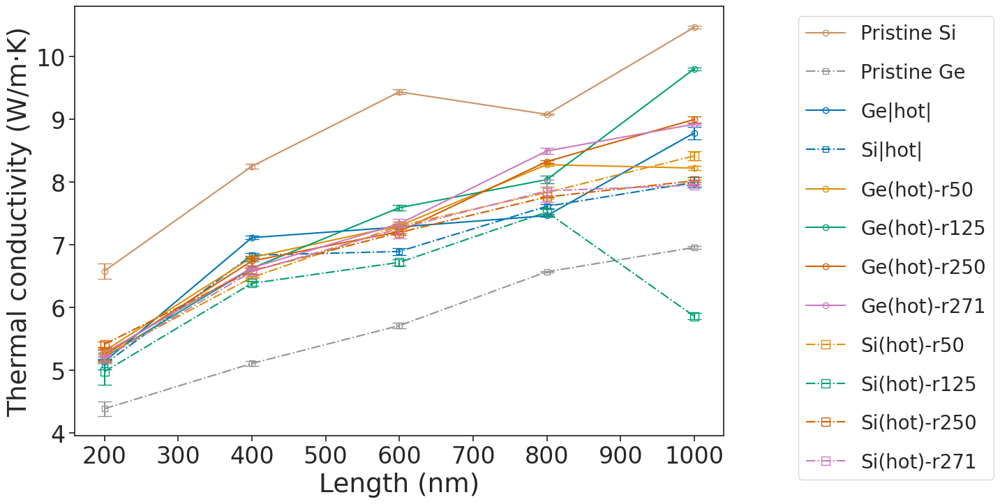

In [30]:

fig = plt.figure(figsize=(12,8))

#PristineSi
plt.plot(size_prst[:], np.array(therm_average_prst[:]),'o-', label = 'Pristine Si',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])

plt.errorbar(size_prst[0], therm_average_prst[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5])
plt.errorbar(size_prst[1], therm_average_prst[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
plt.errorbar(size_prst[2], therm_average_prst[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
plt.errorbar(size_prst[3], therm_average_prst[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
plt.errorbar(size_prst[4], therm_average_prst[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[5], therm_average_prst[5], yerr1500b_prst, fmt='|', markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[6], therm_average_prst[6], yerr2000b_prst, fmt='|', markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 

#PristineGe
plt.plot(size_prstG[:], np.array(therm_average_prstG[:]),'s-.', label = 'Pristine Ge',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])

plt.errorbar(size_prstG[0], therm_average_prstG[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7])
plt.errorbar(size_prstG[1], therm_average_prstG[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
plt.errorbar(size_prstG[2], therm_average_prstG[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
plt.errorbar(size_prstG[3], therm_average_prstG[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
plt.errorbar(size_prstG[4], therm_average_prstG[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[5], therm_average_prstG[5], yerr1500b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[6], therm_average_prstG[6], yerr2000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 


#Straight SiGeSi
plt.plot(str_SiGeSi[:], np.array(therm_average_str_SiGeSi[:]),'o-', label = 'Ge|hot|',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

plt.errorbar(str_SiGeSi[0], therm_average_str_SiGeSi[0], yerr200b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
plt.errorbar(str_SiGeSi[1], therm_average_str_SiGeSi[1], yerr400b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
plt.errorbar(str_SiGeSi[2], therm_average_str_SiGeSi[2], yerr600b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
plt.errorbar(str_SiGeSi[3], therm_average_str_SiGeSi[3], yerr800b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
plt.errorbar(str_SiGeSi[4], therm_average_str_SiGeSi[4], yerr1000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[5], therm_average_str_SiGeSi[5], yerr1500b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[6], therm_average_str_SiGeSi[6], yerr2000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 

#Straight GeSiGe
plt.plot(str_GeSiGe[:], np.array(therm_average_str_GeSiGe[:]),'s-.', label = 'Si|hot|',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

plt.errorbar(str_GeSiGe[0], therm_average_str_GeSiGe[0], yerr200b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
plt.errorbar(str_GeSiGe[1], therm_average_str_GeSiGe[1], yerr400b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
plt.errorbar(str_GeSiGe[2], therm_average_str_GeSiGe[2], yerr600b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
plt.errorbar(str_GeSiGe[3], therm_average_str_GeSiGe[3], yerr800b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
plt.errorbar(str_GeSiGe[4], therm_average_str_GeSiGe[4], yerr1000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[5], therm_average_str_GeSiGe[5], yerr1500b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[6], therm_average_str_GeSiGe[6], yerr2000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])

#Si
#Si50
plt.plot(sizeSi50[:], np.array(therm_averageSi50[:]),'o-', label='Ge(hot)-r50',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])

plt.errorbar(sizeSi50[0], therm_averageSi50[0], yerrSi200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1])
plt.errorbar(sizeSi50[1], therm_averageSi50[1], yerrSi400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
plt.errorbar(sizeSi50[2], therm_averageSi50[2], yerrSi600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
plt.errorbar(sizeSi50[3], therm_averageSi50[3], yerrSi800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
plt.errorbar(sizeSi50[4], therm_averageSi50[4], yerrSi1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[5], therm_averageSi50[5], yerrSi1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[6], therm_averageSi50[6], yerrSi2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 


#Si125
plt.plot(sizeSi125[:], np.array(therm_averageSi125[:]),'o-', label='Ge(hot)-r125',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])

plt.errorbar(sizeSi125[0], therm_averageSi125[0], yerrSi200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2])
plt.errorbar(sizeSi125[1], therm_averageSi125[1], yerrSi400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
plt.errorbar(sizeSi125[2], therm_averageSi125[2], yerrSi600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
plt.errorbar(sizeSi125[3], therm_averageSi125[3], yerrSi800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
plt.errorbar(sizeSi125[4], therm_averageSi125[4], yerrSi1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[5], therm_averageSi125[5], yerrSi1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[6], therm_averageSi125[6], yerrSi2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 

#Si250
plt.plot(sizeSi250[:], np.array(therm_averageSi250[:]),'o-', label='Ge(hot)-r250',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])

plt.errorbar(sizeSi250[0], therm_averageSi250[0], yerrSi200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
plt.errorbar(sizeSi250[1], therm_averageSi250[1], yerrSi400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
plt.errorbar(sizeSi250[2], therm_averageSi250[2], yerrSi600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
plt.errorbar(sizeSi250[3], therm_averageSi250[3], yerrSi800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
plt.errorbar(sizeSi250[4], therm_averageSi250[4], yerrSi1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[5], therm_averageSi250[5], yerrSi1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[6], therm_averageSi250[6], yerrSi2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 


#Si271
plt.plot(sizeSi271[:], np.array(therm_averageSi271[:]),'o-', label='Ge(hot)-r271',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])

plt.errorbar(sizeSi271[0], therm_averageSi271[0], yerrSi200b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4])
plt.errorbar(sizeSi271[1], therm_averageSi271[1], yerrSi400b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
plt.errorbar(sizeSi271[2], therm_averageSi271[2], yerrSi600b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
plt.errorbar(sizeSi271[3], therm_averageSi271[3], yerrSi800b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4])
plt.errorbar(sizeSi271[4], therm_averageSi271[4], yerrSi1000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[5], yerrSi1500b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[6], yerrSi2000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 





#Ge
#Ge50
plt.plot(sizeGe50[:], np.array(therm_averageGe50[:]),'s-.', ms=8, label='Si(hot)-r50',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])

plt.errorbar(sizeGe50[0], therm_averageGe50[0], yerrGe200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1])
plt.errorbar(sizeGe50[1], therm_averageGe50[1], yerrGe400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
plt.errorbar(sizeGe50[2], therm_averageGe50[2], yerrGe600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
plt.errorbar(sizeGe50[3], therm_averageGe50[3], yerrGe800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
plt.errorbar(sizeGe50[4], therm_averageGe50[4], yerrGe1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[5], therm_averageGe50[5], yerrGe1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[6], therm_averageGe50[6], yerrGe2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 


#Ge125
plt.plot(sizeGe125[:], np.array(therm_averageGe125[:]),'s-.', ms=8, label='Si(hot)-r125',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])

plt.errorbar(sizeGe125[0], therm_averageGe125[0], yerrGe200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2])
plt.errorbar(sizeGe125[1], therm_averageGe125[1], yerrGe400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
plt.errorbar(sizeGe125[2], therm_averageGe125[2], yerrGe600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
plt.errorbar(sizeGe125[3], therm_averageGe125[3], yerrGe800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
plt.errorbar(sizeGe125[4], therm_averageGe125[4], yerrGe1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[5], therm_averageGe125[5], yerrGe1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[6], therm_averageGe125[6], yerrGe2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 


#Ge250
plt.plot(sizeGe250[:], np.array(therm_averageGe250[:]),'s-.', ms=8, label='Si(hot)-r250',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])

plt.errorbar(sizeGe250[0], therm_averageGe250[0], yerrGe200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
plt.errorbar(sizeGe250[1], therm_averageGe250[1], yerrGe400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
plt.errorbar(sizeGe250[2], therm_averageGe250[2], yerrGe600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
plt.errorbar(sizeGe250[3], therm_averageGe250[3], yerrGe800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
plt.errorbar(sizeGe250[4], therm_averageGe250[4], yerrGe1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[5], therm_averageGe250[5], yerrGe1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[6], therm_averageGe250[6], yerrGe2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 

#Ge271
plt.plot(sizeGe271[:], np.array(therm_averageGe271[:]),'s-.', ms=8, label='Si(hot)-r271',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])

plt.errorbar(sizeGe271[0], therm_averageGe271[0], yerrGe200b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4])
plt.errorbar(sizeGe271[1], therm_averageGe271[1], yerrGe400b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
plt.errorbar(sizeGe271[2], therm_averageGe271[2], yerrGe600b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
plt.errorbar(sizeGe271[3], therm_averageGe271[3], yerrGe800b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
plt.errorbar(sizeGe271[4], therm_averageGe271[4], yerrGe1000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[5], therm_averageGe271[5], yerrGe1500b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[6], therm_averageGe271[6], yerrGe2000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 


#plt.legend()
plt.legend(bbox_to_anchor=(1.1, 1.0), loc='upper left',labelspacing=1.0,fontsize=20) #,prop={'size': 20}
plt.xlabel('Length (nm)', fontdict={'fontsize':27})
plt.ylabel(r'Thermal conductivity (W/m·K)', fontdict={'fontsize':27})
#plt.title(r'Projection of Direct Convergence for all Systems', fontdict={'fontsize':27})
#plt.ylim(1.8,3)

#plt.savefig('MullerPlathe_Direct_Si_SIGE_extended_STR.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
plt.show


In [31]:
#stop here

In [32]:
#b =  [200,400,600,800,1000,1500,2000]
b = ['110.0','219.9','329.9','439.9','550.0']#,'8248','10995']
b = np.array(b)
size_prstG = b

size_prst = b

str_SiGeSi = b

str_GeSiGe = b

sizeSi50 = b

sizeSi125 = b

sizeSi250 = b

sizeSi271 = b

sizeGe50 = b

sizeGe125 = b

sizeGe250 = b

sizeGe271 = b


In [33]:
#stop here

5.304817 5.204975 5.237496 5.271548


<function matplotlib.pyplot.show(close=None, block=None)>

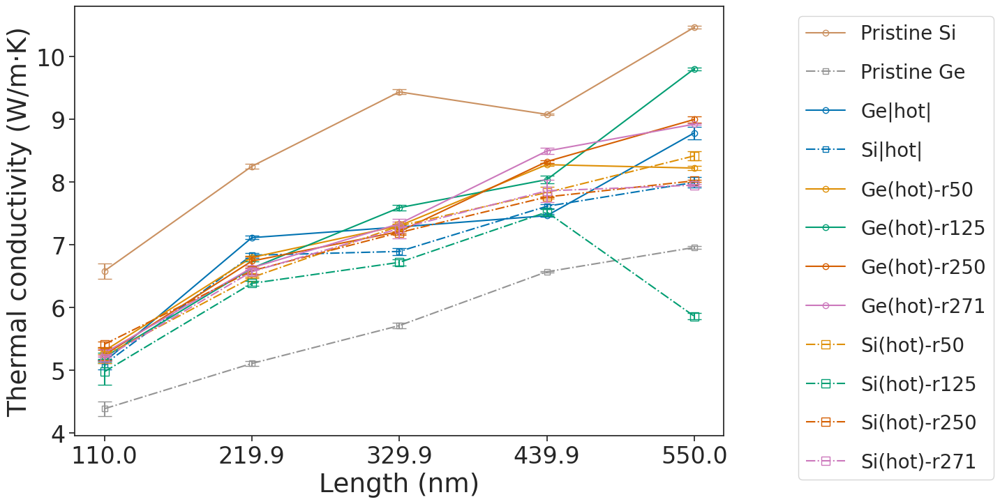

In [34]:

fig = plt.figure(figsize=(12,8))

#PristineSi
plt.plot(size_prst[:], np.array(therm_average_prst[:]),'o-', label = 'Pristine Si',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])

plt.errorbar(size_prst[0], therm_average_prst[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5])
plt.errorbar(size_prst[1], therm_average_prst[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
plt.errorbar(size_prst[2], therm_average_prst[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
plt.errorbar(size_prst[3], therm_average_prst[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
plt.errorbar(size_prst[4], therm_average_prst[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[5], therm_average_prst[5], yerr1500b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[6], therm_average_prst[6], yerr2000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 

#PristineGe
plt.plot(size_prstG[:], np.array(therm_average_prstG[:]),'s-.', label = 'Pristine Ge',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])

plt.errorbar(size_prstG[0], therm_average_prstG[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7])
plt.errorbar(size_prstG[1], therm_average_prstG[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
plt.errorbar(size_prstG[2], therm_average_prstG[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
plt.errorbar(size_prstG[3], therm_average_prstG[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
plt.errorbar(size_prstG[4], therm_average_prstG[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[5], therm_average_prstG[5], yerr1500b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[6], therm_average_prstG[6], yerr2000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 


#Straight SiGeSi
plt.plot(str_SiGeSi[:], np.array(therm_average_str_SiGeSi[:]),'o-', label = 'Ge|hot|',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

plt.errorbar(str_SiGeSi[0], therm_average_str_SiGeSi[0], yerr200b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
plt.errorbar(str_SiGeSi[1], therm_average_str_SiGeSi[1], yerr400b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
plt.errorbar(str_SiGeSi[2], therm_average_str_SiGeSi[2], yerr600b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
plt.errorbar(str_SiGeSi[3], therm_average_str_SiGeSi[3], yerr800b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
plt.errorbar(str_SiGeSi[4], therm_average_str_SiGeSi[4], yerr1000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[5], therm_average_str_SiGeSi[5], yerr1500b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[6], therm_average_str_SiGeSi[6], yerr2000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 

#Straight GeSiGe
plt.plot(str_GeSiGe[:], np.array(therm_average_str_GeSiGe[:]),'s-.', label = 'Si|hot|',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

plt.errorbar(str_GeSiGe[0], therm_average_str_GeSiGe[0], yerr200b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
plt.errorbar(str_GeSiGe[1], therm_average_str_GeSiGe[1], yerr400b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
plt.errorbar(str_GeSiGe[2], therm_average_str_GeSiGe[2], yerr600b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
plt.errorbar(str_GeSiGe[3], therm_average_str_GeSiGe[3], yerr800b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
plt.errorbar(str_GeSiGe[4], therm_average_str_GeSiGe[4], yerr1000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[5], therm_average_str_GeSiGe[5], yerr1500b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[6], therm_average_str_GeSiGe[6], yerr2000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])

#Si
#Si50
plt.plot(sizeSi50[:], np.array(therm_averageSi50[:]),'o-', label='Ge(hot)-r50',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])

plt.errorbar(sizeSi50[0], therm_averageSi50[0], yerrSi200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1])
plt.errorbar(sizeSi50[1], therm_averageSi50[1], yerrSi400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
plt.errorbar(sizeSi50[2], therm_averageSi50[2], yerrSi600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
plt.errorbar(sizeSi50[3], therm_averageSi50[3], yerrSi800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
plt.errorbar(sizeSi50[4], therm_averageSi50[4], yerrSi1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[5], therm_averageSi50[5], yerrSi1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[6], therm_averageSi50[6], yerrSi2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 


#Si125
plt.plot(sizeSi125[:], np.array(therm_averageSi125[:]),'o-', label='Ge(hot)-r125',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])

plt.errorbar(sizeSi125[0], therm_averageSi125[0], yerrSi200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2])
plt.errorbar(sizeSi125[1], therm_averageSi125[1], yerrSi400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
plt.errorbar(sizeSi125[2], therm_averageSi125[2], yerrSi600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
plt.errorbar(sizeSi125[3], therm_averageSi125[3], yerrSi800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
plt.errorbar(sizeSi125[4], therm_averageSi125[4], yerrSi1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[5], therm_averageSi125[5], yerrSi1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[6], therm_averageSi125[6], yerrSi2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 

#Si250
plt.plot(sizeSi250[:], np.array(therm_averageSi250[:]),'o-', label='Ge(hot)-r250',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])

plt.errorbar(sizeSi250[0], therm_averageSi250[0], yerrSi200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
plt.errorbar(sizeSi250[1], therm_averageSi250[1], yerrSi400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
plt.errorbar(sizeSi250[2], therm_averageSi250[2], yerrSi600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
plt.errorbar(sizeSi250[3], therm_averageSi250[3], yerrSi800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
plt.errorbar(sizeSi250[4], therm_averageSi250[4], yerrSi1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[5], therm_averageSi250[5], yerrSi1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[6], therm_averageSi250[6], yerrSi2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 


#Si271
plt.plot(sizeSi271[:], np.array(therm_averageSi271[:]),'o-', label='Ge(hot)-r271',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])

plt.errorbar(sizeSi271[0], therm_averageSi271[0], yerrSi200b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4])
plt.errorbar(sizeSi271[1], therm_averageSi271[1], yerrSi400b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
plt.errorbar(sizeSi271[2], therm_averageSi271[2], yerrSi600b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
plt.errorbar(sizeSi271[3], therm_averageSi271[3], yerrSi800b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
plt.errorbar(sizeSi271[4], therm_averageSi271[4], yerrSi1000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[5], yerrSi1500b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[6], yerrSi2000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 

print(therm_averageSi50[0],therm_averageSi125[0],therm_averageSi250[0],therm_averageSi271[0])



#Ge
#Ge50
plt.plot(sizeGe50[:], np.array(therm_averageGe50[:]),'s-.', ms=8, label='Si(hot)-r50',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])

plt.errorbar(sizeGe50[0], therm_averageGe50[0], yerrGe200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1])
plt.errorbar(sizeGe50[1], therm_averageGe50[1], yerrGe400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
plt.errorbar(sizeGe50[2], therm_averageGe50[2], yerrGe600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
plt.errorbar(sizeGe50[3], therm_averageGe50[3], yerrGe800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
plt.errorbar(sizeGe50[4], therm_averageGe50[4], yerrGe1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[5], therm_averageGe50[5], yerrGe1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[6], therm_averageGe50[6], yerrGe2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 


#Ge125
plt.plot(sizeGe125[:], np.array(therm_averageGe125[:]),'s-.', ms=8, label='Si(hot)-r125',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])

plt.errorbar(sizeGe125[0], therm_averageGe125[0], yerrGe200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2])
plt.errorbar(sizeGe125[1], therm_averageGe125[1], yerrGe400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
plt.errorbar(sizeGe125[2], therm_averageGe125[2], yerrGe600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
plt.errorbar(sizeGe125[3], therm_averageGe125[3], yerrGe800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
plt.errorbar(sizeGe125[4], therm_averageGe125[4], yerrGe1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[5], therm_averageGe125[5], yerrGe1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[6], therm_averageGe125[6], yerrGe2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 


#Ge250
plt.plot(sizeGe250[:], np.array(therm_averageGe250[:]),'s-.', ms=8, label='Si(hot)-r250',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])

plt.errorbar(sizeGe250[0], therm_averageGe250[0], yerrGe200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
plt.errorbar(sizeGe250[1], therm_averageGe250[1], yerrGe400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
plt.errorbar(sizeGe250[2], therm_averageGe250[2], yerrGe600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
plt.errorbar(sizeGe250[3], therm_averageGe250[3], yerrGe800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
plt.errorbar(sizeGe250[4], therm_averageGe250[4], yerrGe1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[5], therm_averageGe250[5], yerrGe1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[6], therm_averageGe250[6], yerrGe2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 

#Ge271
plt.plot(sizeGe271[:], np.array(therm_averageGe271[:]),'s-.', ms=8, label='Si(hot)-r271',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])

plt.errorbar(sizeGe271[0], therm_averageGe271[0], yerrGe200b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4])
plt.errorbar(sizeGe271[1], therm_averageGe271[1], yerrGe400b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
plt.errorbar(sizeGe271[2], therm_averageGe271[2], yerrGe600b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
plt.errorbar(sizeGe271[3], therm_averageGe271[3], yerrGe800b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
plt.errorbar(sizeGe271[4], therm_averageGe271[4], yerrGe1000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[5], therm_averageGe271[5], yerrGe1500b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[6], therm_averageGe271[6], yerrGe2000b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 


#plt.legend()
plt.legend(bbox_to_anchor=(1.1, 1.0), loc='upper left',labelspacing=1.0,fontsize=20) #,prop={'size': 20}
plt.xlabel('Length (nm)', fontdict={'fontsize':27})
plt.ylabel(r'Thermal conductivity (W/m·K)', fontdict={'fontsize':27})
#plt.title(r'Projection of Direct Convergence for all Systems', fontdict={'fontsize':27})
#plt.ylim(0,3)

plt.savefig('10x_MullerPlathe_Direct_Si_SIGE_extended_STR.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
plt.show


stop

In [35]:
#K vs Average temp

#Same as below with trendlines
fig, ax = plt.subplots(figsize=(12,8))

#PristineSi
plt.plot(average_temp_Prst[:], np.array(therm_average_prst[:]),'o-', label = 'Pristine Si',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])

#plt.errorbar(size_prst[0], therm_average_prst[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5])
#plt.errorbar(size_prst[1], therm_average_prst[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[2], therm_average_prst[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[3], therm_average_prst[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[4], therm_average_prst[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[5], therm_average_prst[5], yerr1500b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[6], therm_average_prst[6], yerr2000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 

#PristineGe
plt.plot(average_temp_PrstG[:], np.array(therm_average_prstG[:]),'s-.', label = 'Pristine Ge',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])

#plt.errorbar(size_prstG[0], therm_average_prstG[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7])
#plt.errorbar(size_prstG[1], therm_average_prstG[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[2], therm_average_prstG[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[3], therm_average_prstG[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[4], therm_average_prstG[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[5], therm_average_prstG[5], yerr1500b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[6], therm_average_prstG[6], yerr2000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 


#Straight SiGeSi
plt.plot(average_temp_str_SiGeSi[:], np.array(therm_average_str_SiGeSi[:]),'o-', label = 'Ge|hot|',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

#plt.errorbar(str_SiGeSi[0], therm_average_str_SiGeSi[0], yerr200b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_SiGeSi[1], therm_average_str_SiGeSi[1], yerr400b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[2], therm_average_str_SiGeSi[2], yerr600b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[3], therm_average_str_SiGeSi[3], yerr800b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[4], therm_average_str_SiGeSi[4], yerr1000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[5], therm_average_str_SiGeSi[5], yerr1500b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[6], therm_average_str_SiGeSi[6], yerr2000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 

#Straight GeSiGe
plt.plot(average_temp_str_GeSiGe[:], np.array(therm_average_str_GeSiGe[:]),'s-.', label = 'Si|hot|',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

#plt.errorbar(str_GeSiGe[0], therm_average_str_GeSiGe[0], yerr200b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[1], therm_average_str_GeSiGe[1], yerr400b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[2], therm_average_str_GeSiGe[2], yerr600b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[3], therm_average_str_GeSiGe[3], yerr800b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[4], therm_average_str_GeSiGe[4], yerr1000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[5], therm_average_str_GeSiGe[5], yerr1500b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[6], therm_average_str_GeSiGe[6], yerr2000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])

#Si
#Si50
plt.plot(average_temp_Si50[:], np.array(therm_averageSi50[:]),'o-', label='Ge(hot)-r50',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])

#plt.errorbar(sizeSi50[0], therm_averageSi50[0], yerrSi200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1])
#plt.errorbar(sizeSi50[1], therm_averageSi50[1], yerrSi400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[2], therm_averageSi50[2], yerrSi600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[3], therm_averageSi50[3], yerrSi800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[4], therm_averageSi50[4], yerrSi1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[5], therm_averageSi50[5], yerrSi1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[6], therm_averageSi50[6], yerrSi2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 


#Si125
plt.plot(average_temp_Si125[:], np.array(therm_averageSi125[:]),'o-', label='Ge(hot)-r125',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])

#plt.errorbar(sizeSi125[0], therm_averageSi125[0], yerrSi200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2])
#plt.errorbar(sizeSi125[1], therm_averageSi125[1], yerrSi400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[2], therm_averageSi125[2], yerrSi600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[3], therm_averageSi125[3], yerrSi800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[4], therm_averageSi125[4], yerrSi1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[5], therm_averageSi125[5], yerrSi1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[6], therm_averageSi125[6], yerrSi2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 

#Si250
plt.plot(average_temp_Si250[:], np.array(therm_averageSi250[:]),'o-', label='Ge(hot)-r250',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])

#plt.errorbar(sizeSi250[0], therm_averageSi250[0], yerrSi200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
#plt.errorbar(sizeSi250[1], therm_averageSi250[1], yerrSi400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[2], therm_averageSi250[2], yerrSi600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[3], therm_averageSi250[3], yerrSi800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[4], therm_averageSi250[4], yerrSi1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[5], therm_averageSi250[5], yerrSi1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[6], therm_averageSi250[6], yerrSi2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 


#Si271
plt.plot(average_temp_Si271[:], np.array(therm_averageSi271[:]),'o-', label='Ge(hot)-r271',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])

#plt.errorbar(sizeSi271[0], therm_averageSi271[0], yerrSi200b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4])
#plt.errorbar(sizeSi271[1], therm_averageSi271[1], yerrSi400b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[2], yerrSi600b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[3], yerrSi800b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[4], yerrSi1000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[5], yerrSi1500b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[6], yerrSi2000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 





#Ge
#Ge50
plt.plot(average_temp_Ge50[:], np.array(therm_averageGe50[:]),'s-.', ms=8, label='Si(hot)-r50',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])

#plt.errorbar(sizeGe50[0], therm_averageGe50[0], yerrGe200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1])
#plt.errorbar(sizeGe50[1], therm_averageGe50[1], yerrGe400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[2], therm_averageGe50[2], yerrGe600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[3], therm_averageGe50[3], yerrGe800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[4], therm_averageGe50[4], yerrGe1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[5], therm_averageGe50[5], yerrGe1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[6], therm_averageGe50[6], yerrGe2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 


#Ge125
plt.plot(average_temp_Ge125[:], np.array(therm_averageGe125[:]),'s-.', ms=8, label='Si(hot)-r125',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])

#plt.errorbar(sizeGe125[0], therm_averageGe125[0], yerrGe200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2])
#plt.errorbar(sizeGe125[1], therm_averageGe125[1], yerrGe400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[2], therm_averageGe125[2], yerrGe600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[3], therm_averageGe125[3], yerrGe800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[4], therm_averageGe125[4], yerrGe1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[5], therm_averageGe125[5], yerrGe1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[6], therm_averageGe125[6], yerrGe2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 


#Ge250
plt.plot(average_temp_Ge250[:], np.array(therm_averageGe250[:]),'s-.', ms=8, label='Si(hot)-r250',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])

#plt.errorbar(sizeGe250[0], therm_averageGe250[0], yerrGe200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
#plt.errorbar(sizeGe250[1], therm_averageGe250[1], yerrGe400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[2], therm_averageGe250[2], yerrGe600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[3], therm_averageGe250[3], yerrGe800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[4], therm_averageGe250[4], yerrGe1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[5], therm_averageGe250[5], yerrGe1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[6], therm_averageGe250[6], yerrGe2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 

#Ge271
plt.plot(average_temp_Ge271[:], np.array(therm_averageGe271[:]),'s-.', ms=8, label='Si(hot)-r271',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])

#plt.errorbar(sizeGe271[0], therm_averageGe271[0], yerrGe200b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4])
#plt.errorbar(sizeGe271[1], therm_averageGe271[1], yerrGe400b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[2], therm_averageGe271[2], yerrGe600b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[3], therm_averageGe271[3], yerrGe800b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[4], therm_averageGe271[4], yerrGe1000b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[5], therm_averageGe271[5], yerrGe1500b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[6], therm_averageGe271[6], yerrGe2000b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 

#plt.legend()
plt.legend(bbox_to_anchor=(1.1, 1.0), loc='upper left',labelspacing=1.0,fontsize=20) #,prop={'size': 20}
plt.xlabel('Average temperature (K)', fontdict={'fontsize':27})
plt.ylabel(r'Thermal conductivity (W/m·K)', fontdict={'fontsize':27})
#plt.title(r'Projection of Direct Convergence for all Systems', fontdict={'fontsize':27})
#plt.ylim(1.8,3)

#plt.savefig('MullerPlathe_Direct_Si_SIGE_extended_STR.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
plt.show


In [36]:
#Two linear fits
AV_TEMP_SI = [average_temp_Prst, average_temp_str_SiGeSi, average_temp_Si50, average_temp_Si125,
              average_temp_Si250, average_temp_Si271]
#print(AV_TEMP_SI)
#print(np.shape(AV_TEMP_SI))
              
TCONDUCTIVITY_SI = [np.array(therm_average_prst[:]), np.array(therm_average_str_SiGeSi[:]),
                   np.array(therm_averageSi50[:]), np.array(therm_averageSi125[:]),
                   np.array(therm_averageSi250[:]),np.array(therm_averageSi271[:])]
#print(TCONDUCTIVITY_SI)
#print(np.shape(TCONDUCTIVITY_SI))

AV_TEMP_GE = [average_temp_PrstG, average_temp_str_GeSiGe,
              average_temp_Ge50, average_temp_Ge125,
              average_temp_Ge250, average_temp_Ge271]
#print(AV_TEMP_GE)
#print(np.shape(AV_TEMP_GE))
              
TCONDUCTIVITY_GE = [np.array(therm_average_prstG[:]), np.array(therm_average_str_GeSiGe[:]),
                   np.array(therm_averageGe50[:]), np.array(therm_averageGe125[:]),
                   np.array(therm_averageGe250[:]),np.array(therm_averageGe271[:])]
#print(TCONDUCTIVITY_GE)
#print(np.shape(TCONDUCTIVITY_GE))

#AvTemp
all_boxes_si_AvTemp = []
for t in AV_TEMP_SI:
    for i in t:
        all_boxes_si_AvTemp.append(i)
all_boxes_si_AvTemp = [i/1 for i in all_boxes_si_AvTemp]
#print(np.shape(all_boxes_si_AvTemp))

all_boxes_ge_AvTemp = []
for t in AV_TEMP_GE:
    for i in t:
        all_boxes_ge_AvTemp.append(i)
all_boxes_ge_AvTemp = [i/1 for i in all_boxes_ge_AvTemp]

#TConductivity
all_boxes_si_TConductivity = []
for t in TCONDUCTIVITY_SI:
    for i in t:
        all_boxes_si_TConductivity.append(i)
all_boxes_si_TConductivity = [i/1 for i in all_boxes_si_TConductivity]
#print(np.shape(all_boxes_si_TConductivity))

all_boxes_ge_TConductivity = []
for t in TCONDUCTIVITY_GE:
    for i in t:
        all_boxes_ge_TConductivity.append(i)
all_boxes_ge_TConductivity = [i/1 for i in all_boxes_ge_TConductivity]



R-squared Si scipy: 0.204830
Intercept Si scipy: -27.533426
Slope Si scipy: 0.097017
R-squared Ge scipy: 0.172708
Intercept Ge scipy: 63.210887
Slope Ge scipy: -0.162122


<function matplotlib.pyplot.show(close=None, block=None)>

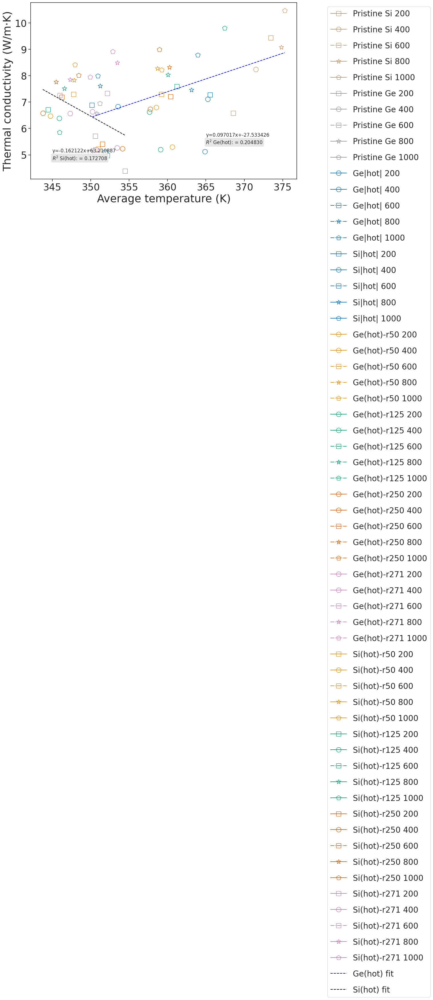

In [37]:
#Same as below with trendlines
from matplotlib.lines import Line2D

markers = ["s","d","o","*","p"]
labels = ['Pristine Si','Pristine Ge','Ge|hot|','Si|hot|',
         'Ge(hot)-r50','Ge(hot)-r125','Ge(hot)-r250','Ge(hot)-r271',
         'Si(hot)-r50','Si(hot)-r125','Si(hot)-r250','Si(hot)-r271']
fig, ax = plt.subplots(figsize=(12,8))

#PristineSi
plt.plot(average_temp_Prst[0], np.array(therm_average_prst[0]),'s-', ms=12, label = 'Pristine Si 200',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])
plt.plot(average_temp_Prst[1], np.array(therm_average_prst[1]),'o-', ms=12, label = 'Pristine Si 400',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])
plt.plot(average_temp_Prst[2], np.array(therm_average_prst[2]),'s-.', ms=12, label = 'Pristine Si 600',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])
plt.plot(average_temp_Prst[3], np.array(therm_average_prst[3]),'*-', ms=12, label = 'Pristine Si 800',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])
plt.plot(average_temp_Prst[4], np.array(therm_average_prst[4]),'p-', ms=12, label = 'Pristine Si 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])

#plt.errorbar(size_prst[0], therm_average_prst[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5])
#plt.errorbar(size_prst[1], therm_average_prst[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[2], therm_average_prst[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[3], therm_average_prst[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[4], therm_average_prst[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[5], therm_average_prst[5], yerr1500b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[6], therm_average_prst[6], yerr2000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 

#PristineGe
plt.plot(average_temp_PrstG[0], np.array(therm_average_prstG[0]),'s-', ms=12, label = 'Pristine Ge 200',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])
plt.plot(average_temp_PrstG[1], np.array(therm_average_prstG[1]),'o-', ms=12, label = 'Pristine Ge 400',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])
plt.plot(average_temp_PrstG[2], np.array(therm_average_prstG[2]),'s-.', ms=12, label = 'Pristine Ge 600',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])
plt.plot(average_temp_PrstG[3], np.array(therm_average_prstG[3]),'*-', ms=12, label = 'Pristine Ge 800',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])
plt.plot(average_temp_PrstG[4], np.array(therm_average_prstG[4]),'p-', ms=12, label = 'Pristine Ge 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])

#plt.errorbar(size_prstG[0], therm_average_prstG[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7])
#plt.errorbar(size_prstG[1], therm_average_prstG[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[2], therm_average_prstG[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[3], therm_average_prstG[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[4], therm_average_prstG[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[5], therm_average_prstG[5], yerr1500b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[6], therm_average_prstG[6], yerr2000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 


#Straight SiGeSi
plt.plot(average_temp_str_SiGeSi[0], np.array(therm_average_str_SiGeSi[0]),'o-', ms=12, label = 'Ge|hot| 200',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_SiGeSi[1], np.array(therm_average_str_SiGeSi[1]),'o-', ms=12, label = 'Ge|hot| 400',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_SiGeSi[2], np.array(therm_average_str_SiGeSi[2]),'s-.', ms=12, label = 'Ge|hot| 600',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_SiGeSi[3], np.array(therm_average_str_SiGeSi[3]),'*-.', ms=12, label = 'Ge|hot| 800',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_SiGeSi[4], np.array(therm_average_str_SiGeSi[4]),'p-.', ms=12, label = 'Ge|hot| 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

#plt.errorbar(str_SiGeSi[0], therm_average_str_SiGeSi[0], yerr200b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_SiGeSi[1], therm_average_str_SiGeSi[1], yerr400b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[2], therm_average_str_SiGeSi[2], yerr600b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[3], therm_average_str_SiGeSi[3], yerr800b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[4], therm_average_str_SiGeSi[4], yerr1000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[5], therm_average_str_SiGeSi[5], yerr1500b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[6], therm_average_str_SiGeSi[6], yerr2000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 

#Straight GeSiGe
plt.plot(average_temp_str_GeSiGe[0], np.array(therm_average_str_GeSiGe[0]),'s-', ms=12, label = 'Si|hot| 200',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_GeSiGe[1], np.array(therm_average_str_GeSiGe[1]),'o-', ms=12, label = 'Si|hot| 400',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_GeSiGe[2], np.array(therm_average_str_GeSiGe[2]),'s-.', ms=12, label = 'Si|hot| 600',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_GeSiGe[3], np.array(therm_average_str_GeSiGe[3]),'*-', ms=12, label = 'Si|hot| 800',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_GeSiGe[4], np.array(therm_average_str_GeSiGe[4]),'p-', ms=12, label = 'Si|hot| 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

#plt.errorbar(str_GeSiGe[0], therm_average_str_GeSiGe[0], yerr200b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[1], therm_average_str_GeSiGe[1], yerr400b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[2], therm_average_str_GeSiGe[2], yerr600b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[3], therm_average_str_GeSiGe[3], yerr800b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[4], therm_average_str_GeSiGe[4], yerr1000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[5], therm_average_str_GeSiGe[5], yerr1500b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[6], therm_average_str_GeSiGe[6], yerr2000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])

#Si
#Si50
plt.plot(average_temp_Si50[0], np.array(therm_averageSi50[0]),'o-', ms=12, label='Ge(hot)-r50 200',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])
plt.plot(average_temp_Si50[1], np.array(therm_averageSi50[1]),'o-', ms=12, label='Ge(hot)-r50 400',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])
plt.plot(average_temp_Si50[2], np.array(therm_averageSi50[2]),'s-.', ms=12, label='Ge(hot)-r50 600',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])
plt.plot(average_temp_Si50[3], np.array(therm_averageSi50[3]),'*-.', ms=12, label='Ge(hot)-r50 800',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])
plt.plot(average_temp_Si50[4], np.array(therm_averageSi50[4]),'p-.', ms=12, label='Ge(hot)-r50 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])

#plt.errorbar(sizeSi50[0], therm_averageSi50[0], yerrSi200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1])
#plt.errorbar(sizeSi50[1], therm_averageSi50[1], yerrSi400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[2], therm_averageSi50[2], yerrSi600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[3], therm_averageSi50[3], yerrSi800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[4], therm_averageSi50[4], yerrSi1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[5], therm_averageSi50[5], yerrSi1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[6], therm_averageSi50[6], yerrSi2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 


#Si125
plt.plot(average_temp_Si125[0], np.array(therm_averageSi125[0]),'o-', ms=12, label='Ge(hot)-r125 200',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])
plt.plot(average_temp_Si125[1], np.array(therm_averageSi125[1]),'o-', ms=12, label='Ge(hot)-r125 400',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])
plt.plot(average_temp_Si125[2], np.array(therm_averageSi125[2]),'s-.', ms=12, label='Ge(hot)-r125 600',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])
plt.plot(average_temp_Si125[3], np.array(therm_averageSi125[3]),'*-.', ms=12, label='Ge(hot)-r125 800',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])
plt.plot(average_temp_Si125[4], np.array(therm_averageSi125[4]),'p-.', ms=12, label='Ge(hot)-r125 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])

#plt.errorbar(sizeSi125[0], therm_averageSi125[0], yerrSi200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2])
#plt.errorbar(sizeSi125[1], therm_averageSi125[1], yerrSi400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[2], therm_averageSi125[2], yerrSi600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[3], therm_averageSi125[3], yerrSi800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[4], therm_averageSi125[4], yerrSi1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[5], therm_averageSi125[5], yerrSi1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[6], therm_averageSi125[6], yerrSi2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 

#Si250
plt.plot(average_temp_Si250[0], np.array(therm_averageSi250[0]),'o-', ms=12, label='Ge(hot)-r250 200',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])
plt.plot(average_temp_Si250[1], np.array(therm_averageSi250[1]),'o-', ms=12, label='Ge(hot)-r250 400',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])
plt.plot(average_temp_Si250[2], np.array(therm_averageSi250[2]),'s-.', ms=12, label='Ge(hot)-r250 600',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])
plt.plot(average_temp_Si250[3], np.array(therm_averageSi250[3]),'*-.', ms=12, label='Ge(hot)-r250 800',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])
plt.plot(average_temp_Si250[4], np.array(therm_averageSi250[4]),'p-.', ms=12, label='Ge(hot)-r250 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])

#plt.errorbar(sizeSi250[0], therm_averageSi250[0], yerrSi200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
#plt.errorbar(sizeSi250[1], therm_averageSi250[1], yerrSi400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[2], therm_averageSi250[2], yerrSi600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[3], therm_averageSi250[3], yerrSi800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[4], therm_averageSi250[4], yerrSi1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[5], therm_averageSi250[5], yerrSi1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[6], therm_averageSi250[6], yerrSi2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 


#Si271
plt.plot(average_temp_Si271[0], np.array(therm_averageSi271[0]),'o-', ms=12, label='Ge(hot)-r271 200',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])
plt.plot(average_temp_Si271[1], np.array(therm_averageSi271[1]),'o-', ms=12, label='Ge(hot)-r271 400',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])
plt.plot(average_temp_Si271[2], np.array(therm_averageSi271[2]),'s-.', ms=12, label='Ge(hot)-r271 600',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])
plt.plot(average_temp_Si271[3], np.array(therm_averageSi271[3]),'*-.', ms=12, label='Ge(hot)-r271 800',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])
plt.plot(average_temp_Si271[4], np.array(therm_averageSi271[4]),'p-.', ms=12, label='Ge(hot)-r271 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])

#plt.errorbar(sizeSi271[0], therm_averageSi271[0], yerrSi200b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4])
#plt.errorbar(sizeSi271[1], therm_averageSi271[1], yerrSi400b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[2], yerrSi600b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[3], yerrSi800b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[4], yerrSi1000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[5], yerrSi1500b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[6], yerrSi2000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 





#Ge
#Ge50
plt.plot(average_temp_Ge50[0], np.array(therm_averageGe50[0]),'s-', ms=12, label='Si(hot)-r50 200',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])
plt.plot(average_temp_Ge50[1], np.array(therm_averageGe50[1]),'o-', ms=12, label='Si(hot)-r50 400',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])
plt.plot(average_temp_Ge50[2], np.array(therm_averageGe50[2]),'s-.', ms=12, label='Si(hot)-r50 600',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])
plt.plot(average_temp_Ge50[3], np.array(therm_averageGe50[3]),'*-', ms=12, label='Si(hot)-r50 800',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])
plt.plot(average_temp_Ge50[4], np.array(therm_averageGe50[4]),'p-', ms=12, label='Si(hot)-r50 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])

#plt.errorbar(sizeGe50[0], therm_averageGe50[0], yerrGe200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1])
#plt.errorbar(sizeGe50[1], therm_averageGe50[1], yerrGe400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[2], therm_averageGe50[2], yerrGe600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[3], therm_averageGe50[3], yerrGe800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[4], therm_averageGe50[4], yerrGe1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[5], therm_averageGe50[5], yerrGe1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[6], therm_averageGe50[6], yerrGe2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 


#Ge125
plt.plot(average_temp_Ge125[0], np.array(therm_averageGe125[0]),'s-', ms=12, label='Si(hot)-r125 200',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])
plt.plot(average_temp_Ge125[1], np.array(therm_averageGe125[1]),'o-', ms=12, label='Si(hot)-r125 400',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])
plt.plot(average_temp_Ge125[2], np.array(therm_averageGe125[2]),'s-.', ms=12, label='Si(hot)-r125 600',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])
plt.plot(average_temp_Ge125[3], np.array(therm_averageGe125[3]),'*-', ms=12, label='Si(hot)-r125 800',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])
plt.plot(average_temp_Ge125[4], np.array(therm_averageGe125[4]),'p-', ms=12, label='Si(hot)-r125 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])

#plt.errorbar(sizeGe125[0], therm_averageGe125[0], yerrGe200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2])
#plt.errorbar(sizeGe125[1], therm_averageGe125[1], yerrGe400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[2], therm_averageGe125[2], yerrGe600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[3], therm_averageGe125[3], yerrGe800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[4], therm_averageGe125[4], yerrGe1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[5], therm_averageGe125[5], yerrGe1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[6], therm_averageGe125[6], yerrGe2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 


#Ge250
plt.plot(average_temp_Ge250[0], np.array(therm_averageGe250[0]),'s-', ms=12, label='Si(hot)-r250 200',markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])
plt.plot(average_temp_Ge250[1], np.array(therm_averageGe250[1]),'o-', ms=12, label='Si(hot)-r250 400',markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])
plt.plot(average_temp_Ge250[2], np.array(therm_averageGe250[2]),'s-.', ms=12, label='Si(hot)-r250 600',markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])
plt.plot(average_temp_Ge250[3], np.array(therm_averageGe250[3]),'*-', ms=12, label='Si(hot)-r250 800',markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])
plt.plot(average_temp_Ge250[4], np.array(therm_averageGe250[4]),'p-', ms=12, label='Si(hot)-r250 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])

#plt.errorbar(sizeGe250[0], therm_averageGe250[0], yerrGe200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
#plt.errorbar(sizeGe250[1], therm_averageGe250[1], yerrGe400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[2], therm_averageGe250[2], yerrGe600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[3], therm_averageGe250[3], yerrGe800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[4], therm_averageGe250[4], yerrGe1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[5], therm_averageGe250[5], yerrGe1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[6], therm_averageGe250[6], yerrGe2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 

#Ge271
plt.plot(average_temp_Ge271[0], np.array(therm_averageGe271[0]),'s-', ms=12, label='Si(hot)-r271 200',markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])
plt.plot(average_temp_Ge271[1], np.array(therm_averageGe271[1]),'o-', ms=12, label='Si(hot)-r271 400',markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])
plt.plot(average_temp_Ge271[2], np.array(therm_averageGe271[2]),'s-.', ms=12, label='Si(hot)-r271 600',markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])
plt.plot(average_temp_Ge271[3], np.array(therm_averageGe271[3]),'*-', ms=12, label='Si(hot)-r271 800',markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])
plt.plot(average_temp_Ge271[4], np.array(therm_averageGe271[4]),'p-', ms=12, label='Si(hot)-r271 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])

#plt.errorbar(sizeGe271[0], therm_averageGe271[0], yerrGe200b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4])
#plt.errorbar(sizeGe271[1], therm_averageGe271[1], yerrGe400b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[2], therm_averageGe271[2], yerrGe600b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[3], therm_averageGe271[3], yerrGe800b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[4], therm_averageGe271[4], yerrGe1000b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[5], therm_averageGe271[5], yerrGe1500b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[6], therm_averageGe271[6], yerrGe2000b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 

#Linear fit
from scipy import stats

mnG = min(all_boxes_ge_AvTemp)
mxG = max(all_boxes_ge_AvTemp)

mnS = min(all_boxes_si_AvTemp)
mxS = max(all_boxes_si_AvTemp)

#SiGeSi
#using numpy
p30_Si = np.poly1d(np.polyfit(all_boxes_si_AvTemp, all_boxes_si_TConductivity, 3))
xp_p30_Si = np.linspace(-0.001, mxS+0.001,5)
slope_intercept_p30_Si = np.polyfit(all_boxes_si_AvTemp, all_boxes_si_TConductivity, 1)
#print('Slope, Intercept of p30_Si numpy:',slope_intercept)


polyfit_fit_Si = np.polyfit(all_boxes_si_AvTemp, all_boxes_si_TConductivity, 1) 
polyfit_fit_Si = np.poly1d(polyfit_fit_Si)
xp_Si = np.linspace(mnS-0.001, mxS+0.001, 20)  
slope_intercept_Si = np.polyfit(all_boxes_si_AvTemp, all_boxes_si_TConductivity, 1)
#print('Slope, Intercept of Si polyfit numpy:',slope_intercept_Si)


#GeSiGe
#using numpy
p30_Ge = np.poly1d(np.polyfit(all_boxes_ge_AvTemp, all_boxes_ge_TConductivity, 3))
xp_p30_Ge = np.linspace(-0.001, mxG+0.001,5)
slope_intercept_p30_Ge = np.polyfit(all_boxes_ge_AvTemp, all_boxes_ge_TConductivity, 1)
#print('Slope, Intercept of p30_Ge numpy:',slope_intercept)


polyfit_fit_Ge = np.polyfit(all_boxes_ge_AvTemp, all_boxes_ge_TConductivity, 1) 
polyfit_fit_Ge = np.poly1d(polyfit_fit_Ge)
#print('Polyfit Ge:',polyfit_fit_Ge)
xp_Ge = np.linspace(mnG-0.001, mxG+0.001,20)  #xp = np.linspace(-0.001, mx+0.001, 5)
slope_intercept_Ge = np.polyfit(all_boxes_ge_AvTemp, all_boxes_ge_TConductivity, 1)
#print('Slope, Intercept of Ge polyfit numpy:',slope_intercept_Ge)


bbox = dict(boxstyle ="round", fc ="0.9") 


plt.plot(xp_Si, polyfit_fit_Si(xp_Si), '--', color ='blue', label = 'Ge(hot) fit')
plt.plot(xp_Ge, polyfit_fit_Ge(xp_Ge), '--', color ='black', label = 'Si(hot) fit')
plt.text(365, 5.7,"y=%.6fx+%.6f"%(polyfit_fit_Si[1],polyfit_fit_Si[0]))
plt.text(345, 5.1,"y=%.6fx+%.6f"%(polyfit_fit_Ge[1],polyfit_fit_Ge[0]))


#using scipy
res_Si = stats.linregress(all_boxes_si_AvTemp, all_boxes_si_TConductivity)
print(f"R-squared Si scipy: {res_Si.rvalue**2:.6f}")
print(f"Intercept Si scipy: {res_Si.intercept:.6f}")
print(f"Slope Si scipy: {res_Si.slope:.6f}")

res_Ge = stats.linregress(all_boxes_ge_AvTemp, all_boxes_ge_TConductivity)
print(f"R-squared Ge scipy: {res_Ge.rvalue**2:.6f}")
print(f"Intercept Ge scipy: {res_Ge.intercept:.6f}")
print(f"Slope Ge scipy: {res_Ge.slope:.6f}")

ax.annotate('$R^2$ Ge(hot): = %.6f' % (res_Si.rvalue**2),
            xy=(365, 5.4), xytext=(365, 5.4), bbox = bbox)

ax.annotate('$R^2$ Si(hot): = %.6f' % (res_Ge.rvalue**2),
            xy=(345, 4.8), xytext=(345, 4.8), bbox = bbox)

#Linear fit

#plt.legend()
plt.legend(bbox_to_anchor=(1.1, 1.0), loc='upper left',labelspacing=1.0,fontsize=20) #,prop={'size': 20}
plt.xlabel('Average temperature (K)', fontdict={'fontsize':27})
plt.ylabel(r'Thermal conductivity (W/m·K)', fontdict={'fontsize':27})
#plt.title(r'Projection of Direct Convergence for all Systems', fontdict={'fontsize':27})
#plt.ylim(1.8,3)

plt.savefig('10x_MullerPlathe_K_AvTemp_twoFits.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
plt.show


In [38]:
#One linear fit
AV_TEMP = [average_temp_Prst, average_temp_PrstG, average_temp_str_SiGeSi, average_temp_str_GeSiGe,
              average_temp_Si50, average_temp_Ge50, average_temp_Si125, average_temp_Ge125,
              average_temp_Si250, average_temp_Ge250, average_temp_Si271, average_temp_Ge271]
#print(AV_TEMP)
#print(np.shape(AV_TEMP))
              
TCONDUCTIVITY = [np.array(therm_average_prst[:]), np.array(therm_average_prstG[:]),
                    np.array(therm_average_str_SiGeSi[:]), np.array(therm_average_str_GeSiGe[:]),
                   np.array(therm_averageSi50[:]), np.array(therm_averageGe50[:]),
                    np.array(therm_averageSi125[:]), np.array(therm_averageGe125[:]),
                   np.array(therm_averageSi250[:]), np.array(therm_averageGe250[:]),
                    np.array(therm_averageSi271[:]), np.array(therm_averageGe271[:])]
#print(TCONDUCTIVITY)
#print(np.shape(TCONDUCTIVITY))

#AvTemp
all_boxes_AvTemp = []
for t in AV_TEMP:
    for i in t:
        all_boxes_AvTemp.append(i)
all_boxes_AvTemp = [i/1 for i in all_boxes_AvTemp]
#print(np.shape(all_boxes_AvTemp))

#TConductivity
all_boxes_TConductivity = []
for t in TCONDUCTIVITY:
    for i in t:
        all_boxes_TConductivity.append(i)
all_boxes_TConductivity = [i/1 for i in all_boxes_TConductivity]
#print(np.shape(all_boxes_TConductivity))


R-squared All scipy: 0.153666
Intercept All scipy: -15.957721
Slope All scipy: 0.064901


<function matplotlib.pyplot.show(close=None, block=None)>

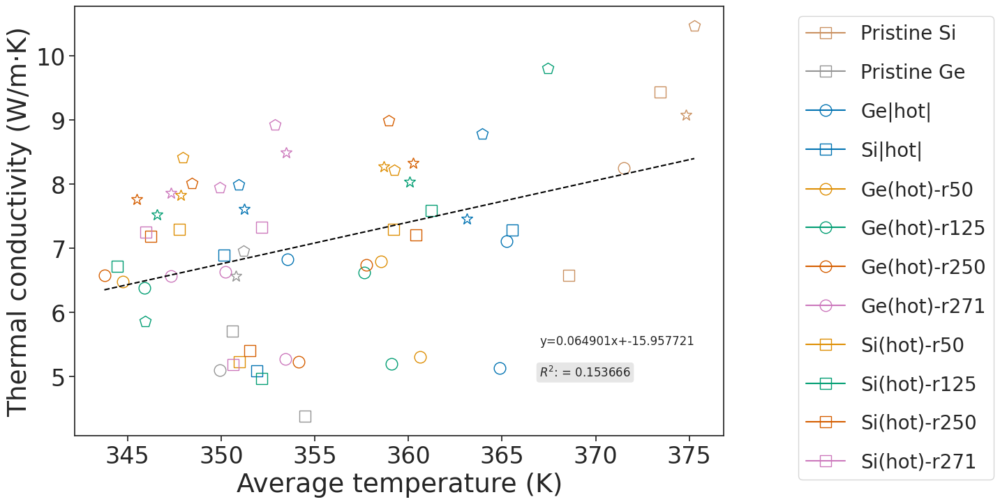

In [39]:
#Same as below with trendlines
from matplotlib.lines import Line2D

markers = ["s","d","o","*","p"]
labels = ['Pristine Si','Pristine Ge','Ge|hot|','Si|hot|',
         'Ge(hot)-r50','Ge(hot)-r125','Ge(hot)-r250','Ge(hot)-r271',
         'Si(hot)-r50','Si(hot)-r125','Si(hot)-r250','Si(hot)-r271']

fig, ax = plt.subplots(figsize=(12,8))

#PristineSi
plt.plot(average_temp_Prst[0], np.array(therm_average_prst[0]),'s-', ms=12, label = 'Pristine Si',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])
plt.plot(average_temp_Prst[1], np.array(therm_average_prst[1]),'o-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])
plt.plot(average_temp_Prst[2], np.array(therm_average_prst[2]),'s-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])
plt.plot(average_temp_Prst[3], np.array(therm_average_prst[3]),'*-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])
plt.plot(average_temp_Prst[4], np.array(therm_average_prst[4]),'p-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])

#plt.errorbar(size_prst[0], therm_average_prst[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5])
#plt.errorbar(size_prst[1], therm_average_prst[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[2], therm_average_prst[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[3], therm_average_prst[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[4], therm_average_prst[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[5], therm_average_prst[5], yerr1500b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[6], therm_average_prst[6], yerr2000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 

#PristineGe
plt.plot(average_temp_PrstG[0], np.array(therm_average_prstG[0]),'s-', ms=12, label = 'Pristine Ge',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])
plt.plot(average_temp_PrstG[1], np.array(therm_average_prstG[1]),'o-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])
plt.plot(average_temp_PrstG[2], np.array(therm_average_prstG[2]),'s-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])
plt.plot(average_temp_PrstG[3], np.array(therm_average_prstG[3]),'*-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])
plt.plot(average_temp_PrstG[4], np.array(therm_average_prstG[4]),'p-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])

#plt.errorbar(size_prstG[0], therm_average_prstG[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7])
#plt.errorbar(size_prstG[1], therm_average_prstG[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[2], therm_average_prstG[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[3], therm_average_prstG[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[4], therm_average_prstG[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[5], therm_average_prstG[5], yerr1500b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[6], therm_average_prstG[6], yerr2000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 


#Straight SiGeSi
plt.plot(average_temp_str_SiGeSi[0], np.array(therm_average_str_SiGeSi[0]),'o-', ms=12, label = 'Ge|hot|',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_SiGeSi[1], np.array(therm_average_str_SiGeSi[1]),'o-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_SiGeSi[2], np.array(therm_average_str_SiGeSi[2]),'s-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_SiGeSi[3], np.array(therm_average_str_SiGeSi[3]),'*-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_SiGeSi[4], np.array(therm_average_str_SiGeSi[4]),'p-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

#plt.errorbar(str_SiGeSi[0], therm_average_str_SiGeSi[0], yerr200b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_SiGeSi[1], therm_average_str_SiGeSi[1], yerr400b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[2], therm_average_str_SiGeSi[2], yerr600b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[3], therm_average_str_SiGeSi[3], yerr800b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[4], therm_average_str_SiGeSi[4], yerr1000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[5], therm_average_str_SiGeSi[5], yerr1500b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[6], therm_average_str_SiGeSi[6], yerr2000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 

#Straight GeSiGe
plt.plot(average_temp_str_GeSiGe[0], np.array(therm_average_str_GeSiGe[0]),'s-', ms=12, label = 'Si|hot|',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_GeSiGe[1], np.array(therm_average_str_GeSiGe[1]),'o-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_GeSiGe[2], np.array(therm_average_str_GeSiGe[2]),'s-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_GeSiGe[3], np.array(therm_average_str_GeSiGe[3]),'*-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_GeSiGe[4], np.array(therm_average_str_GeSiGe[4]),'p-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

#plt.errorbar(str_GeSiGe[0], therm_average_str_GeSiGe[0], yerr200b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[1], therm_average_str_GeSiGe[1], yerr400b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[2], therm_average_str_GeSiGe[2], yerr600b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[3], therm_average_str_GeSiGe[3], yerr800b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[4], therm_average_str_GeSiGe[4], yerr1000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[5], therm_average_str_GeSiGe[5], yerr1500b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[6], therm_average_str_GeSiGe[6], yerr2000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])

#Si
#Si50
plt.plot(average_temp_Si50[0], np.array(therm_averageSi50[0]),'o-', ms=12, label='Ge(hot)-r50',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])
plt.plot(average_temp_Si50[1], np.array(therm_averageSi50[1]),'o-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])
plt.plot(average_temp_Si50[2], np.array(therm_averageSi50[2]),'s-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])
plt.plot(average_temp_Si50[3], np.array(therm_averageSi50[3]),'*-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])
plt.plot(average_temp_Si50[4], np.array(therm_averageSi50[4]),'p-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])

#plt.errorbar(sizeSi50[0], therm_averageSi50[0], yerrSi200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1])
#plt.errorbar(sizeSi50[1], therm_averageSi50[1], yerrSi400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[2], therm_averageSi50[2], yerrSi600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[3], therm_averageSi50[3], yerrSi800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[4], therm_averageSi50[4], yerrSi1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[5], therm_averageSi50[5], yerrSi1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[6], therm_averageSi50[6], yerrSi2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 


#Si125
plt.plot(average_temp_Si125[0], np.array(therm_averageSi125[0]),'o-', ms=12, label='Ge(hot)-r125',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])
plt.plot(average_temp_Si125[1], np.array(therm_averageSi125[1]),'o-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])
plt.plot(average_temp_Si125[2], np.array(therm_averageSi125[2]),'s-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])
plt.plot(average_temp_Si125[3], np.array(therm_averageSi125[3]),'*-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])
plt.plot(average_temp_Si125[4], np.array(therm_averageSi125[4]),'p-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])

#plt.errorbar(sizeSi125[0], therm_averageSi125[0], yerrSi200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2])
#plt.errorbar(sizeSi125[1], therm_averageSi125[1], yerrSi400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[2], therm_averageSi125[2], yerrSi600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[3], therm_averageSi125[3], yerrSi800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[4], therm_averageSi125[4], yerrSi1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[5], therm_averageSi125[5], yerrSi1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[6], therm_averageSi125[6], yerrSi2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 

#Si250
plt.plot(average_temp_Si250[0], np.array(therm_averageSi250[0]),'o-', ms=12, label='Ge(hot)-r250',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])
plt.plot(average_temp_Si250[1], np.array(therm_averageSi250[1]),'o-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])
plt.plot(average_temp_Si250[2], np.array(therm_averageSi250[2]),'s-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])
plt.plot(average_temp_Si250[3], np.array(therm_averageSi250[3]),'*-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])
plt.plot(average_temp_Si250[4], np.array(therm_averageSi250[4]),'p-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])

#plt.errorbar(sizeSi250[0], therm_averageSi250[0], yerrSi200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
#plt.errorbar(sizeSi250[1], therm_averageSi250[1], yerrSi400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[2], therm_averageSi250[2], yerrSi600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[3], therm_averageSi250[3], yerrSi800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[4], therm_averageSi250[4], yerrSi1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[5], therm_averageSi250[5], yerrSi1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[6], therm_averageSi250[6], yerrSi2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 


#Si271
plt.plot(average_temp_Si271[0], np.array(therm_averageSi271[0]),'o-', ms=12, label='Ge(hot)-r271',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])
plt.plot(average_temp_Si271[1], np.array(therm_averageSi271[1]),'o-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])
plt.plot(average_temp_Si271[2], np.array(therm_averageSi271[2]),'s-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])
plt.plot(average_temp_Si271[3], np.array(therm_averageSi271[3]),'*-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])
plt.plot(average_temp_Si271[4], np.array(therm_averageSi271[4]),'p-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])

#plt.errorbar(sizeSi271[0], therm_averageSi271[0], yerrSi200b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4])
#plt.errorbar(sizeSi271[1], therm_averageSi271[1], yerrSi400b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[2], yerrSi600b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[3], yerrSi800b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[4], yerrSi1000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[5], yerrSi1500b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[6], yerrSi2000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 





#Ge
#Ge50
plt.plot(average_temp_Ge50[0], np.array(therm_averageGe50[0]),'s-', ms=12, label='Si(hot)-r50',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])
plt.plot(average_temp_Ge50[1], np.array(therm_averageGe50[1]),'o-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])
plt.plot(average_temp_Ge50[2], np.array(therm_averageGe50[2]),'s-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])
plt.plot(average_temp_Ge50[3], np.array(therm_averageGe50[3]),'*-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])
plt.plot(average_temp_Ge50[4], np.array(therm_averageGe50[4]),'p-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])

#plt.errorbar(sizeGe50[0], therm_averageGe50[0], yerrGe200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1])
#plt.errorbar(sizeGe50[1], therm_averageGe50[1], yerrGe400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[2], therm_averageGe50[2], yerrGe600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[3], therm_averageGe50[3], yerrGe800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[4], therm_averageGe50[4], yerrGe1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[5], therm_averageGe50[5], yerrGe1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[6], therm_averageGe50[6], yerrGe2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 


#Ge125
plt.plot(average_temp_Ge125[0], np.array(therm_averageGe125[0]),'s-', ms=12, label='Si(hot)-r125',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])
plt.plot(average_temp_Ge125[1], np.array(therm_averageGe125[1]),'o-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])
plt.plot(average_temp_Ge125[2], np.array(therm_averageGe125[2]),'s-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])
plt.plot(average_temp_Ge125[3], np.array(therm_averageGe125[3]),'*-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])
plt.plot(average_temp_Ge125[4], np.array(therm_averageGe125[4]),'p-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])

#plt.errorbar(sizeGe125[0], therm_averageGe125[0], yerrGe200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2])
#plt.errorbar(sizeGe125[1], therm_averageGe125[1], yerrGe400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[2], therm_averageGe125[2], yerrGe600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[3], therm_averageGe125[3], yerrGe800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[4], therm_averageGe125[4], yerrGe1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[5], therm_averageGe125[5], yerrGe1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[6], therm_averageGe125[6], yerrGe2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 


#Ge250
plt.plot(average_temp_Ge250[0], np.array(therm_averageGe250[0]),'s-', ms=12, label='Si(hot)-r250',markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])
plt.plot(average_temp_Ge250[1], np.array(therm_averageGe250[1]),'o-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])
plt.plot(average_temp_Ge250[2], np.array(therm_averageGe250[2]),'s-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])
plt.plot(average_temp_Ge250[3], np.array(therm_averageGe250[3]),'*-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])
plt.plot(average_temp_Ge250[4], np.array(therm_averageGe250[4]),'p-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])

#plt.errorbar(sizeGe250[0], therm_averageGe250[0], yerrGe200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
#plt.errorbar(sizeGe250[1], therm_averageGe250[1], yerrGe400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[2], therm_averageGe250[2], yerrGe600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[3], therm_averageGe250[3], yerrGe800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[4], therm_averageGe250[4], yerrGe1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[5], therm_averageGe250[5], yerrGe1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[6], therm_averageGe250[6], yerrGe2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 

#Ge271
plt.plot(average_temp_Ge271[0], np.array(therm_averageGe271[0]),'s-', ms=12, label='Si(hot)-r271',markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])
plt.plot(average_temp_Ge271[1], np.array(therm_averageGe271[1]),'o-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])
plt.plot(average_temp_Ge271[2], np.array(therm_averageGe271[2]),'s-.', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])
plt.plot(average_temp_Ge271[3], np.array(therm_averageGe271[3]),'*-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])
plt.plot(average_temp_Ge271[4], np.array(therm_averageGe271[4]),'p-', ms=12,markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])

#plt.errorbar(sizeGe271[0], therm_averageGe271[0], yerrGe200b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4])
#plt.errorbar(sizeGe271[1], therm_averageGe271[1], yerrGe400b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[2], therm_averageGe271[2], yerrGe600b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[3], therm_averageGe271[3], yerrGe800b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[4], therm_averageGe271[4], yerrGe1000b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[5], therm_averageGe271[5], yerrGe1500b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[6], therm_averageGe271[6], yerrGe2000b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 

#Linear fit
from scipy import stats

mnG = min(all_boxes_AvTemp)
mxG = max(all_boxes_AvTemp)

#using numpy
p30 = np.poly1d(np.polyfit(all_boxes_AvTemp, all_boxes_TConductivity, 3))
xp_p30 = np.linspace(-0.001, mxG+0.001,5)
slope_intercept_p30 = np.polyfit(all_boxes_AvTemp, all_boxes_TConductivity, 1)
#print('Slope, Intercept of p30 numpy:',slope_intercept)


polyfit_fit = np.polyfit(all_boxes_AvTemp, all_boxes_TConductivity, 1) 
polyfit_fit = np.poly1d(polyfit_fit)
#print('Polyfit All:',polyfit_fit)
xp = np.linspace(mnG-0.001, mxG+0.001,20)  #xp = np.linspace(-0.001, mx+0.001, 5)
slope_intercept = np.polyfit(all_boxes_AvTemp, all_boxes_TConductivity, 1)
#print('Slope, Intercept of All polyfit numpy:',slope_intercept)


bbox = dict(boxstyle ="round", fc ="0.9") 


plt.plot(xp, polyfit_fit(xp), '--', color ='black') #, label = 'All fit'
plt.text(367, 5.5,"y=%.6fx+%.6f"%(polyfit_fit[1],polyfit_fit[0]))


#using scipy
res = stats.linregress(all_boxes_AvTemp, all_boxes_TConductivity)
print(f"R-squared All scipy: {res.rvalue**2:.6f}")
print(f"Intercept All scipy: {res.intercept:.6f}")
print(f"Slope All scipy: {res.slope:.6f}")

ax.annotate('$R^2$: = %.6f' % (res.rvalue**2),
            xy=(367, 5.5), xytext=(367, 5.0), bbox = bbox)

#Linear fit


#plt.legend()
plt.legend(bbox_to_anchor=(1.1, 1.0), loc='upper left',labelspacing=1.0,fontsize=20) #,prop={'size': 20}
plt.xlabel('Average temperature (K)', fontdict={'fontsize':27})
plt.ylabel(r'Thermal conductivity (W/m·K)', fontdict={'fontsize':27})
#plt.title(r'Projection of Direct Convergence for all Systems', fontdict={'fontsize':27})
#plt.ylim(1.8,3)

plt.savefig('10x_MullerPlathe_K_AvTemp_oneFit.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
plt.show


<function matplotlib.pyplot.show(close=None, block=None)>

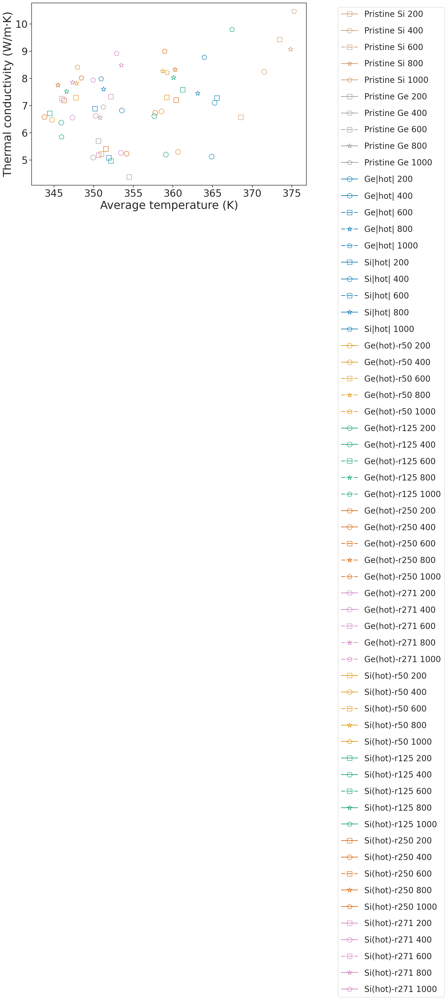

In [40]:
#No fits!
from matplotlib.lines import Line2D
#print(Line2D.markers)

markers = ["s","d","o","*","p"]
labels = ['Pristine Si','Pristine Ge','Str_SiGeSi','Str_GeSiGe',
         'SiGeSir50','SiGeSir125','SiGeSir250','SiGeSir271',
         'GeSiGer50','GeSiGer125','GeSiGer250','GeSiGer271']
#print(markers[0])
#markers = Line2D.markers

fig = plt.figure(figsize=(12,8))

#PristineSi
plt.plot(average_temp_Prst[0], np.array(therm_average_prst[0]),'s-', ms=12, label = 'Pristine Si 200',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])
plt.plot(average_temp_Prst[1], np.array(therm_average_prst[1]),'o-', ms=12, label = 'Pristine Si 400',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])
plt.plot(average_temp_Prst[2], np.array(therm_average_prst[2]),'s-.', ms=12, label = 'Pristine Si 600',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])
plt.plot(average_temp_Prst[3], np.array(therm_average_prst[3]),'*-', ms=12, label = 'Pristine Si 800',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])
plt.plot(average_temp_Prst[4], np.array(therm_average_prst[4]),'p-', ms=12, label = 'Pristine Si 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])

#plt.errorbar(size_prst[0], therm_average_prst[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5])
#plt.errorbar(size_prst[1], therm_average_prst[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[2], therm_average_prst[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[3], therm_average_prst[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[4], therm_average_prst[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[5], therm_average_prst[5], yerr1500b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
#plt.errorbar(size_prst[6], therm_average_prst[6], yerr2000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 

#PristineGe
plt.plot(average_temp_PrstG[0], np.array(therm_average_prstG[0]),'s-', ms=12, label = 'Pristine Ge 200',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])
plt.plot(average_temp_PrstG[1], np.array(therm_average_prstG[1]),'o-', ms=12, label = 'Pristine Ge 400',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])
plt.plot(average_temp_PrstG[2], np.array(therm_average_prstG[2]),'s-.', ms=12, label = 'Pristine Ge 600',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])
plt.plot(average_temp_PrstG[3], np.array(therm_average_prstG[3]),'*-', ms=12, label = 'Pristine Ge 800',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])
plt.plot(average_temp_PrstG[4], np.array(therm_average_prstG[4]),'p-', ms=12, label = 'Pristine Ge 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])

#plt.errorbar(size_prstG[0], therm_average_prstG[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7])
#plt.errorbar(size_prstG[1], therm_average_prstG[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[2], therm_average_prstG[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[3], therm_average_prstG[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[4], therm_average_prstG[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[5], therm_average_prstG[5], yerr1500b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
#plt.errorbar(size_prstG[6], therm_average_prstG[6], yerr2000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 


#Straight SiGeSi
plt.plot(average_temp_str_SiGeSi[0], np.array(therm_average_str_SiGeSi[0]),'o-', ms=12, label = 'Ge|hot| 200',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_SiGeSi[1], np.array(therm_average_str_SiGeSi[1]),'o-', ms=12, label = 'Ge|hot| 400',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_SiGeSi[2], np.array(therm_average_str_SiGeSi[2]),'s-.', ms=12, label = 'Ge|hot| 600',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_SiGeSi[3], np.array(therm_average_str_SiGeSi[3]),'*-.', ms=12, label = 'Ge|hot| 800',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_SiGeSi[4], np.array(therm_average_str_SiGeSi[4]),'p-.', ms=12, label = 'Ge|hot| 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

#plt.errorbar(str_SiGeSi[0], therm_average_str_SiGeSi[0], yerr200b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_SiGeSi[1], therm_average_str_SiGeSi[1], yerr400b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[2], therm_average_str_SiGeSi[2], yerr600b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[3], therm_average_str_SiGeSi[3], yerr800b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[4], therm_average_str_SiGeSi[4], yerr1000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[5], therm_average_str_SiGeSi[5], yerr1500b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
#plt.errorbar(str_SiGeSi[6], therm_average_str_SiGeSi[6], yerr2000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 

#Straight GeSiGe
plt.plot(average_temp_str_GeSiGe[0], np.array(therm_average_str_GeSiGe[0]),'s-', ms=12, label = 'Si|hot| 200',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_GeSiGe[1], np.array(therm_average_str_GeSiGe[1]),'o-', ms=12, label = 'Si|hot| 400',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_GeSiGe[2], np.array(therm_average_str_GeSiGe[2]),'s-.', ms=12, label = 'Si|hot| 600',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_GeSiGe[3], np.array(therm_average_str_GeSiGe[3]),'*-', ms=12, label = 'Si|hot| 800',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])
plt.plot(average_temp_str_GeSiGe[4], np.array(therm_average_str_GeSiGe[4]),'p-', ms=12, label = 'Si|hot| 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

#plt.errorbar(str_GeSiGe[0], therm_average_str_GeSiGe[0], yerr200b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[1], therm_average_str_GeSiGe[1], yerr400b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[2], therm_average_str_GeSiGe[2], yerr600b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[3], therm_average_str_GeSiGe[3], yerr800b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[4], therm_average_str_GeSiGe[4], yerr1000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[5], therm_average_str_GeSiGe[5], yerr1500b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
#plt.errorbar(str_GeSiGe[6], therm_average_str_GeSiGe[6], yerr2000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])

#Si
#Si50
plt.plot(average_temp_Si50[0], np.array(therm_averageSi50[0]),'o-', ms=12, label='Ge(hot)-r50 200',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])
plt.plot(average_temp_Si50[1], np.array(therm_averageSi50[1]),'o-', ms=12, label='Ge(hot)-r50 400',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])
plt.plot(average_temp_Si50[2], np.array(therm_averageSi50[2]),'s-.', ms=12, label='Ge(hot)-r50 600',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])
plt.plot(average_temp_Si50[3], np.array(therm_averageSi50[3]),'*-.', ms=12, label='Ge(hot)-r50 800',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])
plt.plot(average_temp_Si50[4], np.array(therm_averageSi50[4]),'p-.', ms=12, label='Ge(hot)-r50 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])

#plt.errorbar(sizeSi50[0], therm_averageSi50[0], yerrSi200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1])
#plt.errorbar(sizeSi50[1], therm_averageSi50[1], yerrSi400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[2], therm_averageSi50[2], yerrSi600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[3], therm_averageSi50[3], yerrSi800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[4], therm_averageSi50[4], yerrSi1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[5], therm_averageSi50[5], yerrSi1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
#plt.errorbar(sizeSi50[6], therm_averageSi50[6], yerrSi2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 


#Si125
plt.plot(average_temp_Si125[0], np.array(therm_averageSi125[0]),'o-', ms=12, label='Ge(hot)-r125 200',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])
plt.plot(average_temp_Si125[1], np.array(therm_averageSi125[1]),'o-', ms=12, label='Ge(hot)-r125 400',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])
plt.plot(average_temp_Si125[2], np.array(therm_averageSi125[2]),'s-.', ms=12, label='Ge(hot)-r125 600',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])
plt.plot(average_temp_Si125[3], np.array(therm_averageSi125[3]),'*-.', ms=12, label='Ge(hot)-r125 800',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])
plt.plot(average_temp_Si125[4], np.array(therm_averageSi125[4]),'p-.', ms=12, label='Ge(hot)-r125 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])

#plt.errorbar(sizeSi125[0], therm_averageSi125[0], yerrSi200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2])
#plt.errorbar(sizeSi125[1], therm_averageSi125[1], yerrSi400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[2], therm_averageSi125[2], yerrSi600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[3], therm_averageSi125[3], yerrSi800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[4], therm_averageSi125[4], yerrSi1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[5], therm_averageSi125[5], yerrSi1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
#plt.errorbar(sizeSi125[6], therm_averageSi125[6], yerrSi2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 

#Si250
plt.plot(average_temp_Si250[0], np.array(therm_averageSi250[0]),'o-', ms=12, label='Ge(hot)-r250 200',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])
plt.plot(average_temp_Si250[1], np.array(therm_averageSi250[1]),'o-', ms=12, label='Ge(hot)-r250 400',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])
plt.plot(average_temp_Si250[2], np.array(therm_averageSi250[2]),'s-.', ms=12, label='Ge(hot)-r250 600',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])
plt.plot(average_temp_Si250[3], np.array(therm_averageSi250[3]),'*-.', ms=12, label='Ge(hot)-r250 800',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])
plt.plot(average_temp_Si250[4], np.array(therm_averageSi250[4]),'p-.', ms=12, label='Ge(hot)-r250 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])

#plt.errorbar(sizeSi250[0], therm_averageSi250[0], yerrSi200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
#plt.errorbar(sizeSi250[1], therm_averageSi250[1], yerrSi400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[2], therm_averageSi250[2], yerrSi600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[3], therm_averageSi250[3], yerrSi800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[4], therm_averageSi250[4], yerrSi1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[5], therm_averageSi250[5], yerrSi1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeSi250[6], therm_averageSi250[6], yerrSi2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 


#Si271
plt.plot(average_temp_Si271[0], np.array(therm_averageSi271[0]),'o-', ms=12, label='Ge(hot)-r271 200',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])
plt.plot(average_temp_Si271[1], np.array(therm_averageSi271[1]),'o-', ms=12, label='Ge(hot)-r271 400',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])
plt.plot(average_temp_Si271[2], np.array(therm_averageSi271[2]),'s-.', ms=12, label='Ge(hot)-r271 600',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])
plt.plot(average_temp_Si271[3], np.array(therm_averageSi271[3]),'*-.', ms=12, label='Ge(hot)-r271 800',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])
plt.plot(average_temp_Si271[4], np.array(therm_averageSi271[4]),'p-.', ms=12, label='Ge(hot)-r271 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])

#plt.errorbar(sizeSi271[0], therm_averageSi271[0], yerrSi200b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4])
#plt.errorbar(sizeSi271[1], therm_averageSi271[1], yerrSi400b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[2], yerrSi600b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[3], yerrSi800b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[4], yerrSi1000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[5], yerrSi1500b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
#plt.errorbar(sizeSi271[2], therm_averageSi271[6], yerrSi2000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 





#Ge
#Ge50
plt.plot(average_temp_Ge50[0], np.array(therm_averageGe50[0]),'s-', ms=12, label='Si(hot)-r50 200',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])
plt.plot(average_temp_Ge50[1], np.array(therm_averageGe50[1]),'o-', ms=12, label='Si(hot)-r50 400',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])
plt.plot(average_temp_Ge50[2], np.array(therm_averageGe50[2]),'s-.', ms=12, label='Si(hot)-r50 600',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])
plt.plot(average_temp_Ge50[3], np.array(therm_averageGe50[3]),'*-', ms=12, label='Si(hot)-r50 800',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])
plt.plot(average_temp_Ge50[4], np.array(therm_averageGe50[4]),'p-', ms=12, label='Si(hot)-r50 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])

#plt.errorbar(sizeGe50[0], therm_averageGe50[0], yerrGe200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1])
#plt.errorbar(sizeGe50[1], therm_averageGe50[1], yerrGe400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[2], therm_averageGe50[2], yerrGe600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[3], therm_averageGe50[3], yerrGe800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[4], therm_averageGe50[4], yerrGe1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[5], therm_averageGe50[5], yerrGe1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
#plt.errorbar(sizeGe50[6], therm_averageGe50[6], yerrGe2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 


#Ge125
plt.plot(average_temp_Ge125[0], np.array(therm_averageGe125[0]),'s-', ms=12, label='Si(hot)-r125 200',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])
plt.plot(average_temp_Ge125[1], np.array(therm_averageGe125[1]),'o-', ms=12, label='Si(hot)-r125 400',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])
plt.plot(average_temp_Ge125[2], np.array(therm_averageGe125[2]),'s-.', ms=12, label='Si(hot)-r125 600',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])
plt.plot(average_temp_Ge125[3], np.array(therm_averageGe125[3]),'*-', ms=12, label='Si(hot)-r125 800',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])
plt.plot(average_temp_Ge125[4], np.array(therm_averageGe125[4]),'p-', ms=12, label='Si(hot)-r125 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])

#plt.errorbar(sizeGe125[0], therm_averageGe125[0], yerrGe200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2])
#plt.errorbar(sizeGe125[1], therm_averageGe125[1], yerrGe400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[2], therm_averageGe125[2], yerrGe600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[3], therm_averageGe125[3], yerrGe800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[4], therm_averageGe125[4], yerrGe1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[5], therm_averageGe125[5], yerrGe1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
#plt.errorbar(sizeGe125[6], therm_averageGe125[6], yerrGe2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 


#Ge250
plt.plot(average_temp_Ge250[0], np.array(therm_averageGe250[0]),'s-', ms=12, label='Si(hot)-r250 200',markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])
plt.plot(average_temp_Ge250[1], np.array(therm_averageGe250[1]),'o-', ms=12, label='Si(hot)-r250 400',markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])
plt.plot(average_temp_Ge250[2], np.array(therm_averageGe250[2]),'s-.', ms=12, label='Si(hot)-r250 600',markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])
plt.plot(average_temp_Ge250[3], np.array(therm_averageGe250[3]),'*-', ms=12, label='Si(hot)-r250 800',markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])
plt.plot(average_temp_Ge250[4], np.array(therm_averageGe250[4]),'p-', ms=12, label='Si(hot)-r250 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[3], color=color_blind_safe[3])

#plt.errorbar(sizeGe250[0], therm_averageGe250[0], yerrGe200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
#plt.errorbar(sizeGe250[1], therm_averageGe250[1], yerrGe400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[2], therm_averageGe250[2], yerrGe600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[3], therm_averageGe250[3], yerrGe800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[4], therm_averageGe250[4], yerrGe1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[5], therm_averageGe250[5], yerrGe1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
#plt.errorbar(sizeGe250[6], therm_averageGe250[6], yerrGe2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 

#Ge271
plt.plot(average_temp_Ge271[0], np.array(therm_averageGe271[0]),'s-', ms=12, label='Si(hot)-r271 200',markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])
plt.plot(average_temp_Ge271[1], np.array(therm_averageGe271[1]),'o-', ms=12, label='Si(hot)-r271 400',markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])
plt.plot(average_temp_Ge271[2], np.array(therm_averageGe271[2]),'s-.', ms=12, label='Si(hot)-r271 600',markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])
plt.plot(average_temp_Ge271[3], np.array(therm_averageGe271[3]),'*-', ms=12, label='Si(hot)-r271 800',markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])
plt.plot(average_temp_Ge271[4], np.array(therm_averageGe271[4]),'p-', ms=12, label='Si(hot)-r271 1000',markerfacecolor='none', markeredgecolor=color_blind_safe[4], color=color_blind_safe[4])

#plt.errorbar(sizeGe271[0], therm_averageGe271[0], yerrGe200b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4])
#plt.errorbar(sizeGe271[1], therm_averageGe271[1], yerrGe400b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[2], therm_averageGe271[2], yerrGe600b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[3], therm_averageGe271[3], yerrGe800b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[4], therm_averageGe271[4], yerrGe1000b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[5], therm_averageGe271[5], yerrGe1500b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
#plt.errorbar(sizeGe271[6], therm_averageGe271[6], yerrGe2000b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 


#plt.legend()
plt.legend(bbox_to_anchor=(1.1, 1.0), loc='upper left',labelspacing=1.0,fontsize=20) #,prop={'size': 20}
plt.xlabel('Average temperature (K)', fontdict={'fontsize':27})
plt.ylabel(r'Thermal conductivity (W/m·K)', fontdict={'fontsize':27})
#plt.title(r'Projection of Direct Convergence for all Systems', fontdict={'fontsize':27})
#plt.ylim(1.8,3)

plt.savefig('10x_MullerPlathe_K_AvTemp.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
plt.show


<function matplotlib.pyplot.show(close=None, block=None)>

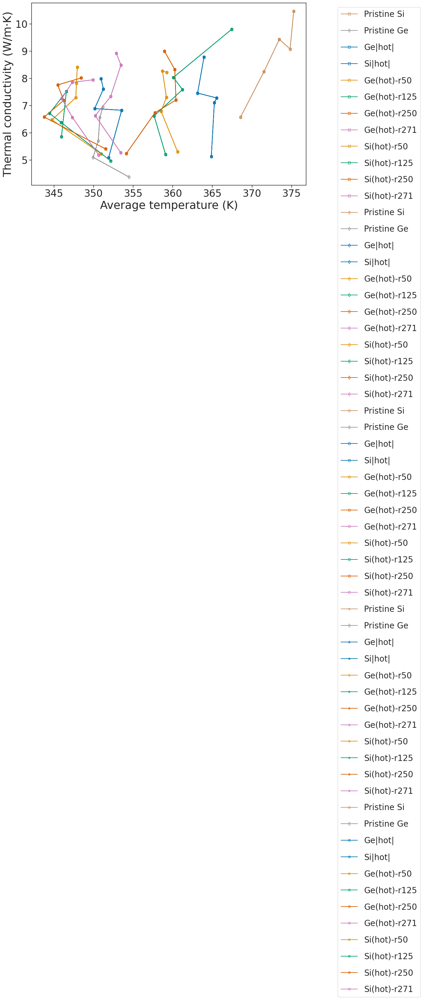

In [41]:
from matplotlib.lines import Line2D
#print(Line2D.markers)

markers = ["s","d","o","*","p"]
labels = ['Pristine Si','Pristine Ge','Ge|hot|','Si|hot|',
         'Ge(hot)-r50','Ge(hot)-r125','Ge(hot)-r250','Ge(hot)-r271',
         'Si(hot)-r50','Si(hot)-r125','Si(hot)-r250','Si(hot)-r271']

#print(markers[0])
#markers = Line2D.markers
fig = plt.figure(figsize=(12,8))
#print(np.shape(average_temp_Prst[:]))
#print(np.shape(np.array(therm_average_prst[:])))

#plt.plot(average_temp_Prst[:], np.array(therm_average_prst[:]),marker=markers[:], label = 'Pristine Si',markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])

for i in range(len(markers)):
    #PristineSi
    plt.plot(average_temp_Prst[:], np.array(therm_average_prst[:]),marker=markers[i],label=labels[0], markerfacecolor='none', markeredgecolor=color_blind_safe[5],color=color_blind_safe[5])

    #plt.errorbar(size_prst[0], therm_average_prst[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5])
    #plt.errorbar(size_prst[1], therm_average_prst[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
    #plt.errorbar(size_prst[2], therm_average_prst[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
    #plt.errorbar(size_prst[3], therm_average_prst[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
    #plt.errorbar(size_prst[4], therm_average_prst[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
    #plt.errorbar(size_prst[5], therm_average_prst[5], yerr1500b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 
    #plt.errorbar(size_prst[6], therm_average_prst[6], yerr2000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[5],color=color_blind_safe[5]) 

    #PristineGe
    plt.plot(average_temp_PrstG[:], np.array(therm_average_prstG[:]),marker=markers[1],label=labels[1],markerfacecolor='none', markeredgecolor=color_blind_safe[7],color=color_blind_safe[7])

    #plt.errorbar(size_prstG[0], therm_average_prstG[0], yerr200b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7])
    #plt.errorbar(size_prstG[1], therm_average_prstG[1], yerr400b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
    #plt.errorbar(size_prstG[2], therm_average_prstG[2], yerr600b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
    #plt.errorbar(size_prstG[3], therm_average_prstG[3], yerr800b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
    #plt.errorbar(size_prstG[4], therm_average_prstG[4], yerr1000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
    #plt.errorbar(size_prstG[5], therm_average_prstG[5], yerr1500b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 
    #plt.errorbar(size_prstG[6], therm_average_prstG[6], yerr2000b_prst, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[7],color=color_blind_safe[7]) 


    #Straight SiGeSi
    plt.plot(average_temp_str_SiGeSi[:], np.array(therm_average_str_SiGeSi[:]),marker=markers[i],label=labels[2],markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

    #plt.errorbar(str_SiGeSi[0], therm_average_str_SiGeSi[0], yerr200b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
    #plt.errorbar(str_SiGeSi[1], therm_average_str_SiGeSi[1], yerr400b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
    #plt.errorbar(str_SiGeSi[2], therm_average_str_SiGeSi[2], yerr600b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
    #plt.errorbar(str_SiGeSi[3], therm_average_str_SiGeSi[3], yerr800b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
    #plt.errorbar(str_SiGeSi[4], therm_average_str_SiGeSi[4], yerr1000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
    #plt.errorbar(str_SiGeSi[5], therm_average_str_SiGeSi[5], yerr1500b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 
    #plt.errorbar(str_SiGeSi[6], therm_average_str_SiGeSi[6], yerr2000b_str_SiGeSi, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0]) 

    #Straight GeSiGe
    plt.plot(average_temp_str_GeSiGe[:], np.array(therm_average_str_GeSiGe[:]),marker=markers[i],label=labels[3],markerfacecolor='none', markeredgecolor=color_blind_safe[0],color=color_blind_safe[0])

    #plt.errorbar(str_GeSiGe[0], therm_average_str_GeSiGe[0], yerr200b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
    #plt.errorbar(str_GeSiGe[1], therm_average_str_GeSiGe[1], yerr400b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
    #plt.errorbar(str_GeSiGe[2], therm_average_str_GeSiGe[2], yerr600b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
    #plt.errorbar(str_GeSiGe[3], therm_average_str_GeSiGe[3], yerr800b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
    #plt.errorbar(str_GeSiGe[4], therm_average_str_GeSiGe[4], yerr1000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
    #plt.errorbar(str_GeSiGe[5], therm_average_str_GeSiGe[5], yerr1500b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])
    #plt.errorbar(str_GeSiGe[6], therm_average_str_GeSiGe[6], yerr2000b_str_GeSiGe, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[0],color=color_blind_safe[0])

    #Si
    #Si50
    plt.plot(average_temp_Si50[:], np.array(therm_averageSi50[:]),marker=markers[i],label=labels[4],markerfacecolor='none', markeredgecolor=color_blind_safe[1],color=color_blind_safe[1])

    #plt.errorbar(sizeSi50[0], therm_averageSi50[0], yerrSi200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1])
    #plt.errorbar(sizeSi50[1], therm_averageSi50[1], yerrSi400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
    #plt.errorbar(sizeSi50[2], therm_averageSi50[2], yerrSi600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
    #plt.errorbar(sizeSi50[3], therm_averageSi50[3], yerrSi800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
    #plt.errorbar(sizeSi50[4], therm_averageSi50[4], yerrSi1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
    #plt.errorbar(sizeSi50[5], therm_averageSi50[5], yerrSi1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 
    #plt.errorbar(sizeSi50[6], therm_averageSi50[6], yerrSi2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1],color=color_blind_safe[1]) 


    #Si125
    plt.plot(average_temp_Si125[:], np.array(therm_averageSi125[:]),marker=markers[i],label=labels[5],markerfacecolor='none', markeredgecolor=color_blind_safe[2],color=color_blind_safe[2])

    #plt.errorbar(sizeSi125[0], therm_averageSi125[0], yerrSi200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2])
    #plt.errorbar(sizeSi125[1], therm_averageSi125[1], yerrSi400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
    #plt.errorbar(sizeSi125[2], therm_averageSi125[2], yerrSi600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
    #plt.errorbar(sizeSi125[3], therm_averageSi125[3], yerrSi800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
    #plt.errorbar(sizeSi125[4], therm_averageSi125[4], yerrSi1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
    #plt.errorbar(sizeSi125[5], therm_averageSi125[5], yerrSi1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 
    #plt.errorbar(sizeSi125[6], therm_averageSi125[6], yerrSi2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2],color=color_blind_safe[2]) 

    #Si250
    plt.plot(average_temp_Si250[:], np.array(therm_averageSi250[:]),marker=markers[i],label=labels[6],markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])

    #plt.errorbar(sizeSi250[0], therm_averageSi250[0], yerrSi200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
    #plt.errorbar(sizeSi250[1], therm_averageSi250[1], yerrSi400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
    #plt.errorbar(sizeSi250[2], therm_averageSi250[2], yerrSi600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
    #plt.errorbar(sizeSi250[3], therm_averageSi250[3], yerrSi800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
    #plt.errorbar(sizeSi250[4], therm_averageSi250[4], yerrSi1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
    #plt.errorbar(sizeSi250[5], therm_averageSi250[5], yerrSi1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
    #plt.errorbar(sizeSi250[6], therm_averageSi250[6], yerrSi2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 


    #Si271
    plt.plot(average_temp_Si271[:], np.array(therm_averageSi271[:]),marker=markers[i],label=labels[7],markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])

    #plt.errorbar(sizeSi271[0], therm_averageSi271[0], yerrSi200b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4])
    #plt.errorbar(sizeSi271[1], therm_averageSi271[1], yerrSi400b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
    #plt.errorbar(sizeSi271[2], therm_averageSi271[2], yerrSi600b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
    #plt.errorbar(sizeSi271[2], therm_averageSi271[3], yerrSi800b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
    #plt.errorbar(sizeSi271[2], therm_averageSi271[4], yerrSi1000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
    #plt.errorbar(sizeSi271[2], therm_averageSi271[5], yerrSi1500b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 
    #plt.errorbar(sizeSi271[2], therm_averageSi271[6], yerrSi2000b271, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[4],color=color_blind_safe[4]) 





    #Ge
    #Ge50
    plt.plot(average_temp_Ge50[:], np.array(therm_averageGe50[:]),marker=markers[i],label=labels[8],markerfacecolor='none', markeredgecolor=color_blind_safe[1], color=color_blind_safe[1])

    #plt.errorbar(sizeGe50[0], therm_averageGe50[0], yerrGe200b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1])
    #plt.errorbar(sizeGe50[1], therm_averageGe50[1], yerrGe400b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
    #plt.errorbar(sizeGe50[2], therm_averageGe50[2], yerrGe600b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
    #plt.errorbar(sizeGe50[3], therm_averageGe50[3], yerrGe800b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
    #plt.errorbar(sizeGe50[4], therm_averageGe50[4], yerrGe1000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
    #plt.errorbar(sizeGe50[5], therm_averageGe50[5], yerrGe1500b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 
    #plt.errorbar(sizeGe50[6], therm_averageGe50[6], yerrGe2000b50, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[1], color=color_blind_safe[1]) 


    #Ge125
    plt.plot(average_temp_Ge125[:], np.array(therm_averageGe125[:]),marker=markers[i],label=labels[9],markerfacecolor='none', markeredgecolor=color_blind_safe[2], color=color_blind_safe[2])

    #plt.errorbar(sizeGe125[0], therm_averageGe125[0], yerrGe200b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2])
    #plt.errorbar(sizeGe125[1], therm_averageGe125[1], yerrGe400b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
    #plt.errorbar(sizeGe125[2], therm_averageGe125[2], yerrGe600b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
    #plt.errorbar(sizeGe125[3], therm_averageGe125[3], yerrGe800b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
    #plt.errorbar(sizeGe125[4], therm_averageGe125[4], yerrGe1000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
    #plt.errorbar(sizeGe125[5], therm_averageGe125[5], yerrGe1500b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 
    #plt.errorbar(sizeGe125[6], therm_averageGe125[6], yerrGe2000b125, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[2], color=color_blind_safe[2]) 


    #Ge250
    plt.plot(average_temp_Ge250[:], np.array(therm_averageGe250[:]),marker=markers[i],label=labels[10],markerfacecolor='none', markeredgecolor=color_blind_safe[3],color=color_blind_safe[3])

    #plt.errorbar(sizeGe250[0], therm_averageGe250[0], yerrGe200b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3])
    #plt.errorbar(sizeGe250[1], therm_averageGe250[1], yerrGe400b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
    #plt.errorbar(sizeGe250[2], therm_averageGe250[2], yerrGe600b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
    #plt.errorbar(sizeGe250[3], therm_averageGe250[3], yerrGe800b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
    #plt.errorbar(sizeGe250[4], therm_averageGe250[4], yerrGe1000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
    #plt.errorbar(sizeGe250[5], therm_averageGe250[5], yerrGe1500b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 
    #plt.errorbar(sizeGe250[6], therm_averageGe250[6], yerrGe2000b250, markersize=15, capsize=7, mfc='none',mec=color_blind_safe[3],color=color_blind_safe[3]) 

    #Ge271
    plt.plot(average_temp_Ge271[:], np.array(therm_averageGe271[:]),marker=markers[i],label=labels[11],markerfacecolor='none', markeredgecolor=color_blind_safe[4],color=color_blind_safe[4])

    #plt.errorbar(sizeGe271[0], therm_averageGe271[0], yerrGe200b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4])
    #plt.errorbar(sizeGe271[1], therm_averageGe271[1], yerrGe400b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
    #plt.errorbar(sizeGe271[2], therm_averageGe271[2], yerrGe600b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
    #plt.errorbar(sizeGe271[3], therm_averageGe271[3], yerrGe800b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
    #plt.errorbar(sizeGe271[4], therm_averageGe271[4], yerrGe1000b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
    #plt.errorbar(sizeGe271[5], therm_averageGe271[5], yerrGe1500b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 
    #plt.errorbar(sizeGe271[6], therm_averageGe271[6], yerrGe2000b271, markersize=15, capsize=7, mfc='none',mec='grey,color=color_blind_safe[4]) 


#plt.legend()
plt.legend(bbox_to_anchor=(1.1, 1.0), loc='upper left',labelspacing=1.0,fontsize=20) #,prop={'size': 20}
plt.xlabel('Average temperature (K)', fontdict={'fontsize':27})
plt.ylabel(r'Thermal conductivity (W/m·K)', fontdict={'fontsize':27})
#plt.title(r'Projection of Direct Convergence for all Systems', fontdict={'fontsize':27})
#plt.ylim(1.8,3)

plt.savefig('MullerPlathe_Direct_Si_SIGE_extended_STR_10x.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
plt.show


#3D
%matplotlib notebook

<function matplotlib.pyplot.show(close=None, block=None)>

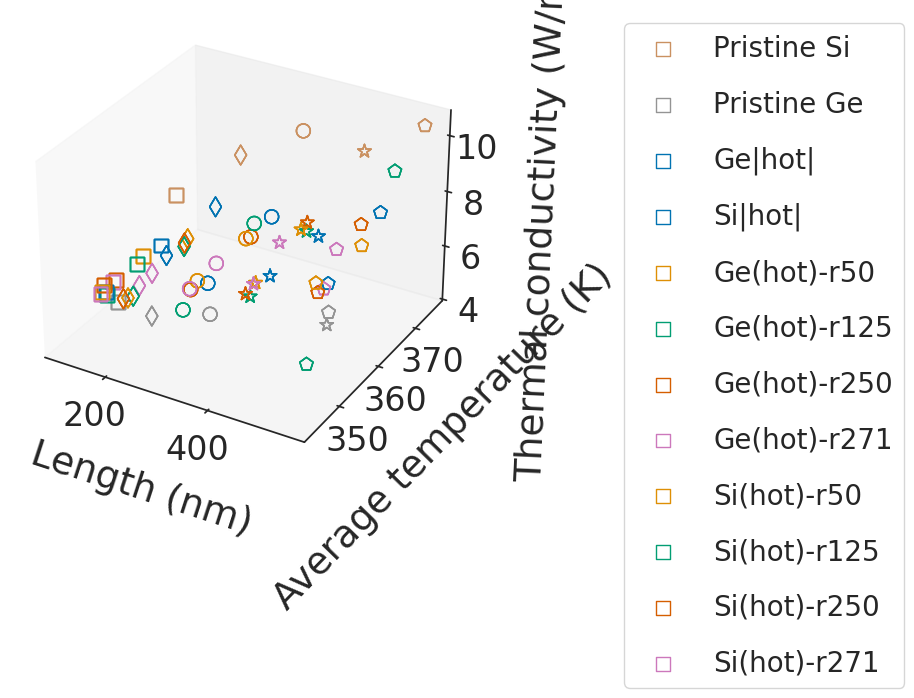

In [42]:
from mpl_toolkits.mplot3d import axes3d, Axes3D
from scipy.interpolate import griddata

rad_size1 = np.ones(4)*110.0
rad_size2 = np.ones(4)*219.9
rad_size3 = np.ones(4)*329.9
rad_size4 = np.ones(4)*439.9
rad_size5 = np.ones(4)*550.0
rad_size = [rad_size1,rad_size2,rad_size3,rad_size4,rad_size5]

#xline_si = rad_size
#yline_si = average_temp
#zline_si = TC

fig = plt.figure(figsize=(10,6))
ax = plt.axes(projection='3d')

#PristineSi
ax.scatter(rad_size[0],average_temp_Prst[0], np.array(therm_average_prst[0]),marker='s', label = 'Pristine Si', facecolors='none', edgecolors=color_blind_safe[5],color=color_blind_safe[5],s=100)
ax.scatter(rad_size[1],average_temp_Prst[1], np.array(therm_average_prst[1]),marker='d',facecolors='none', edgecolors=color_blind_safe[5],color=color_blind_safe[5],s=100)
ax.scatter(rad_size[2],average_temp_Prst[2], np.array(therm_average_prst[2]),marker='o',facecolors='none', edgecolors=color_blind_safe[5],color=color_blind_safe[5],s=100)
ax.scatter(rad_size[3],average_temp_Prst[3], np.array(therm_average_prst[3]),marker='*',facecolors='none', edgecolors=color_blind_safe[5],color=color_blind_safe[5],s=100)
ax.scatter(rad_size[4],average_temp_Prst[4], np.array(therm_average_prst[4]),marker='p',facecolors='none', edgecolors=color_blind_safe[5],color=color_blind_safe[5],s=100)


#PristineGe
ax.scatter(rad_size[0],average_temp_PrstG[0], np.array(therm_average_prstG[0]),marker='s', label = 'Pristine Ge',facecolors='none', edgecolors=color_blind_safe[7],color=color_blind_safe[7],s=100)
ax.scatter(rad_size[1],average_temp_PrstG[1], np.array(therm_average_prstG[1]),marker='d',facecolors='none', edgecolors=color_blind_safe[7],color=color_blind_safe[7],s=100)
ax.scatter(rad_size[2],average_temp_PrstG[2], np.array(therm_average_prstG[2]),marker='o',facecolors='none', edgecolors=color_blind_safe[7],color=color_blind_safe[7],s=100)
ax.scatter(rad_size[4],average_temp_PrstG[3], np.array(therm_average_prstG[3]),marker='*',facecolors='none', edgecolors=color_blind_safe[7],color=color_blind_safe[7],s=100)
ax.scatter(rad_size[4],average_temp_PrstG[4], np.array(therm_average_prstG[4]),marker='p',facecolors='none', edgecolors=color_blind_safe[7],color=color_blind_safe[7],s=100)



#Straight SiGeSi
ax.scatter(rad_size[0],average_temp_str_SiGeSi[0], np.array(therm_average_str_SiGeSi[0]),marker='s', label = 'Ge|hot|',facecolors='none', edgecolors=color_blind_safe[0],color=color_blind_safe[0],s=100)
ax.scatter(rad_size[1],average_temp_str_SiGeSi[1], np.array(therm_average_str_SiGeSi[1]),marker='d',facecolors='none', edgecolors=color_blind_safe[0],color=color_blind_safe[0],s=100)
ax.scatter(rad_size[2],average_temp_str_SiGeSi[2], np.array(therm_average_str_SiGeSi[2]),marker='o',facecolors='none', edgecolors=color_blind_safe[0],color=color_blind_safe[0],s=100)
ax.scatter(rad_size[3],average_temp_str_SiGeSi[3], np.array(therm_average_str_SiGeSi[3]),marker='*',facecolors='none', edgecolors=color_blind_safe[0],color=color_blind_safe[0],s=100)
ax.scatter(rad_size[4],average_temp_str_SiGeSi[4], np.array(therm_average_str_SiGeSi[4]),marker='p',facecolors='none', edgecolors=color_blind_safe[0],color=color_blind_safe[0],s=100)


#Straight GeSiGe
ax.scatter(rad_size[0],average_temp_str_GeSiGe[0], np.array(therm_average_str_GeSiGe[0]),marker='s', label = 'Si|hot|',facecolors='none', edgecolors=color_blind_safe[0],color=color_blind_safe[0],s=100)
ax.scatter(rad_size[1],average_temp_str_GeSiGe[1], np.array(therm_average_str_GeSiGe[1]),marker='d',facecolors='none', edgecolors=color_blind_safe[0],color=color_blind_safe[0],s=100)
ax.scatter(rad_size[2],average_temp_str_GeSiGe[2], np.array(therm_average_str_GeSiGe[2]),marker='o',facecolors='none', edgecolors=color_blind_safe[0],color=color_blind_safe[0],s=100)
ax.scatter(rad_size[3],average_temp_str_GeSiGe[3], np.array(therm_average_str_GeSiGe[3]),marker='*',facecolors='none', edgecolors=color_blind_safe[0],color=color_blind_safe[0],s=100)
ax.scatter(rad_size[4],average_temp_str_GeSiGe[4], np.array(therm_average_str_GeSiGe[4]),marker='p',facecolors='none', edgecolors=color_blind_safe[0],color=color_blind_safe[0],s=100)


#Si
#Si50
ax.scatter(rad_size[0],average_temp_Si50[0], np.array(therm_averageSi50[0]),marker='s', label='Ge(hot)-r50',facecolors='none', edgecolors=color_blind_safe[1],color=color_blind_safe[1],s=100)
ax.scatter(rad_size[1],average_temp_Si50[1], np.array(therm_averageSi50[1]),marker='d',facecolors='none', edgecolors=color_blind_safe[1],color=color_blind_safe[1],s=100)
ax.scatter(rad_size[2],average_temp_Si50[2], np.array(therm_averageSi50[2]),marker='o',facecolors='none', edgecolors=color_blind_safe[1],color=color_blind_safe[1],s=100)
ax.scatter(rad_size[3],average_temp_Si50[3], np.array(therm_averageSi50[3]),marker='*',facecolors='none', edgecolors=color_blind_safe[1],color=color_blind_safe[1],s=100)
ax.scatter(rad_size[4],average_temp_Si50[4], np.array(therm_averageSi50[4]),marker='p',facecolors='none', edgecolors=color_blind_safe[1],color=color_blind_safe[1],s=100)


#Si125
ax.scatter(rad_size[0],average_temp_Si125[0], np.array(therm_averageSi125[0]),marker='s', label='Ge(hot)-r125',facecolors='none', edgecolors=color_blind_safe[2],color=color_blind_safe[2],s=100)
ax.scatter(rad_size[1],average_temp_Si125[1], np.array(therm_averageSi125[1]),marker='d',facecolors='none', edgecolors=color_blind_safe[2],color=color_blind_safe[2],s=100)
ax.scatter(rad_size[2],average_temp_Si125[2], np.array(therm_averageSi125[2]),marker='o',facecolors='none', edgecolors=color_blind_safe[2],color=color_blind_safe[2],s=100)
ax.scatter(rad_size[3],average_temp_Si125[3], np.array(therm_averageSi125[3]),marker='*',facecolors='none', edgecolors=color_blind_safe[2],color=color_blind_safe[2],s=100)
ax.scatter(rad_size[4],average_temp_Si125[4], np.array(therm_averageSi125[4]),marker='p',facecolors='none', edgecolors=color_blind_safe[2],color=color_blind_safe[2],s=100)

#Si250
ax.scatter(rad_size[0],average_temp_Si250[0], np.array(therm_averageSi250[0]),marker='s', label='Ge(hot)-r250',facecolors='none', edgecolors=color_blind_safe[3],color=color_blind_safe[3],s=100)
ax.scatter(rad_size[1],average_temp_Si250[1], np.array(therm_averageSi250[1]),marker='d',facecolors='none', edgecolors=color_blind_safe[3],color=color_blind_safe[3],s=100)
ax.scatter(rad_size[2],average_temp_Si250[2], np.array(therm_averageSi250[2]),marker='o',facecolors='none', edgecolors=color_blind_safe[3],color=color_blind_safe[3],s=100)
ax.scatter(rad_size[3],average_temp_Si250[3], np.array(therm_averageSi250[3]),marker='*',facecolors='none', edgecolors=color_blind_safe[3],color=color_blind_safe[3],s=100)
ax.scatter(rad_size[4],average_temp_Si250[4], np.array(therm_averageSi250[4]),marker='p',facecolors='none', edgecolors=color_blind_safe[3],color=color_blind_safe[3],s=100)



#Si271
ax.scatter(rad_size[0],average_temp_Si271[0], np.array(therm_averageSi271[0]),marker='s', label='Ge(hot)-r271',facecolors='none', edgecolors=color_blind_safe[4],color=color_blind_safe[4],s=100)
ax.scatter(rad_size[1],average_temp_Si271[1], np.array(therm_averageSi271[1]),marker='d',facecolors='none', edgecolors=color_blind_safe[4],color=color_blind_safe[4],s=100)
ax.scatter(rad_size[2],average_temp_Si271[2], np.array(therm_averageSi271[2]),marker='o',facecolors='none', edgecolors=color_blind_safe[4],color=color_blind_safe[4],s=100)
ax.scatter(rad_size[3],average_temp_Si271[3], np.array(therm_averageSi271[3]),marker='*',facecolors='none', edgecolors=color_blind_safe[4],color=color_blind_safe[4],s=100)
ax.scatter(rad_size[4],average_temp_Si271[4], np.array(therm_averageSi271[4]),marker='p',facecolors='none', edgecolors=color_blind_safe[4],color=color_blind_safe[4],s=100)






#Ge
#Ge50
ax.scatter(rad_size[0],average_temp_Ge50[0], np.array(therm_averageGe50[0]),marker='s', label='Si(hot)-r50',facecolors='none', edgecolors=color_blind_safe[1], color=color_blind_safe[1],s=100)
ax.scatter(rad_size[1],average_temp_Ge50[1], np.array(therm_averageGe50[1]),marker='d',facecolors='none', edgecolors=color_blind_safe[1], color=color_blind_safe[1],s=100)
ax.scatter(rad_size[2],average_temp_Ge50[2], np.array(therm_averageGe50[2]),marker='o',facecolors='none', edgecolors=color_blind_safe[1], color=color_blind_safe[1],s=100)
ax.scatter(rad_size[3],average_temp_Ge50[3], np.array(therm_averageGe50[3]),marker='*',facecolors='none', edgecolors=color_blind_safe[1], color=color_blind_safe[1],s=100)
ax.scatter(rad_size[4],average_temp_Ge50[4], np.array(therm_averageGe50[4]),marker='p',facecolors='none', edgecolors=color_blind_safe[1], color=color_blind_safe[1],s=100)


#Ge125
ax.scatter(rad_size[0],average_temp_Ge125[0], np.array(therm_averageGe125[0]),marker='s', label='Si(hot)-r125',facecolors='none', edgecolors=color_blind_safe[2], color=color_blind_safe[2],s=100)
ax.scatter(rad_size[1],average_temp_Ge125[1], np.array(therm_averageGe125[1]),marker='d',facecolors='none', edgecolors=color_blind_safe[2], color=color_blind_safe[2],s=100)
ax.scatter(rad_size[2],average_temp_Ge125[2], np.array(therm_averageGe125[2]),marker='o',facecolors='none', edgecolors=color_blind_safe[2], color=color_blind_safe[2],s=100)
ax.scatter(rad_size[3],average_temp_Ge125[3], np.array(therm_averageGe125[3]),marker='*',facecolors='none', edgecolors=color_blind_safe[2], color=color_blind_safe[2],s=100)
ax.scatter(rad_size[4],average_temp_Ge125[4], np.array(therm_averageGe125[4]),marker='p',facecolors='none', edgecolors=color_blind_safe[2], color=color_blind_safe[2],s=100)



#Ge250
ax.scatter(rad_size[0],average_temp_Ge250[0], np.array(therm_averageGe250[0]),marker='s', label='Si(hot)-r250',facecolors='none', edgecolors=color_blind_safe[3], color=color_blind_safe[3],s=100)
ax.scatter(rad_size[1],average_temp_Ge250[1], np.array(therm_averageGe250[1]),marker='d',facecolors='none', edgecolors=color_blind_safe[3], color=color_blind_safe[3],s=100)
ax.scatter(rad_size[2],average_temp_Ge250[2], np.array(therm_averageGe250[2]),marker='o',facecolors='none', edgecolors=color_blind_safe[3], color=color_blind_safe[3],s=100)
ax.scatter(rad_size[3],average_temp_Ge250[3], np.array(therm_averageGe250[3]),marker='*',facecolors='none', edgecolors=color_blind_safe[3], color=color_blind_safe[3],s=100)
ax.scatter(rad_size[4],average_temp_Ge250[4], np.array(therm_averageGe250[4]),marker='p',facecolors='none', edgecolors=color_blind_safe[3], color=color_blind_safe[3],s=100)


#Ge271
ax.scatter(rad_size[0],average_temp_Ge271[0], np.array(therm_averageGe271[0]),marker='s', label='Si(hot)-r271',facecolors='none', edgecolors=color_blind_safe[4], color=color_blind_safe[4],s=100)
ax.scatter(rad_size[1],average_temp_Ge271[1], np.array(therm_averageGe271[1]),marker='d',facecolors='none', edgecolors=color_blind_safe[4], color=color_blind_safe[4],s=100)
ax.scatter(rad_size[2],average_temp_Ge271[2], np.array(therm_averageGe271[2]),marker='o',facecolors='none', edgecolors=color_blind_safe[4], color=color_blind_safe[4],s=100)
ax.scatter(rad_size[3],average_temp_Ge271[3], np.array(therm_averageGe271[3]),marker='*',facecolors='none', edgecolors=color_blind_safe[4], color=color_blind_safe[4],s=100)
ax.scatter(rad_size[4],average_temp_Ge271[4], np.array(therm_averageGe271[4]),marker='p',facecolors='none', edgecolors=color_blind_safe[4], color=color_blind_safe[4],s=100)


ax.legend(bbox_to_anchor=(1.15, 1.0), loc='upper left',labelspacing=0.6) 

ax.set_xlabel('\n\n Length (nm)',fontsize=27)
ax.set_ylabel('\n\nAverage temperature (K)', fontdict={'fontsize':27})
ax.set_zlabel('\n\nThermal conductivity (W/m·K)', fontdict={'fontsize':27})
#plt.title(r'Projection of Direct Convergence for all Systems', fontdict={'fontsize':27})
#plt.ylim(1.8,3)

plt.legend(bbox_to_anchor=(1.3, 1.0), loc='upper left',labelspacing=1.0,fontsize=20) #,prop={'size': 20}

plt.savefig('10x_MullerPlathe_K_AvTemp_3D.jpeg', bbox_inches='tight',  pad_inches = 1, dpi=500)
plt.show
